# Training LSTM Architecture with Best Params from Weight and Biases
@authors: Simone Azeglio, Chetan Dhulipalla , Khalid Saifullah 


Part of the code here has been taken from [Neuromatch Academy's Computational Neuroscience Course](https://compneuro.neuromatch.io/projects/neurons/README.html), and specifically from [this notebook](https://colab.research.google.com/github/NeuromatchAcademy/course-content/blob/master/projects/neurons/load_stringer_spontaneous.ipynb)

## Loading of Stringer spontaneous data



In [1]:
#@title Data retrieval
import os, requests

fname = "stringer_spontaneous.npy"
url = "https://osf.io/dpqaj/download"

if not os.path.isfile(fname):
    try:
        r = requests.get(url)
    except requests.ConnectionError:
        print("!!! Failed to download data !!!")
    else:
        if r.status_code != requests.codes.ok:
            print("!!! Failed to download data !!!")
        else:
            with open(fname, "wb") as fid:
                fid.write(r.content)

In [2]:
#@title Import matplotlib and set defaults
from matplotlib import rcParams 
from matplotlib import pyplot as plt
rcParams['figure.figsize'] = [20, 4]
rcParams['font.size'] =15
rcParams['axes.spines.top'] = False
rcParams['axes.spines.right'] = False
rcParams['figure.autolayout'] = True

## Exploratory Data Analysis (EDA)

In [3]:
#@title Data loading
import numpy as np
dat = np.load('stringer_spontaneous.npy', allow_pickle=True).item()
print(dat.keys())

dict_keys(['sresp', 'run', 'beh_svd_time', 'beh_svd_mask', 'stat', 'pupilArea', 'pupilCOM', 'xyz'])


In [4]:
# functions 

def moving_avg(array, factor = 5):
    """Reducing the number of compontents by averaging of N = factor
    subsequent elements of array"""
    zeros_ = np.zeros((array.shape[0], 2))
    array = np.hstack((array, zeros_))

    array = np.reshape(array, (array.shape[0],  int(array.shape[1]/factor), factor))
    array = np.mean(array, axis = 2)

    return array

## Extracting Data for RNN (or LFADS)
The first problem to address is that for each layer we don't have the exact same number of neurons. We'd like to have a single RNN encoding all the different layers activities, to make it easier we can take the number of neurons ($N_{neurons} = 1131$ of the least represented class (layer) and level out each remaining class. 

In [5]:
# Extract labels from z - coordinate
from sklearn import preprocessing
x, y, z = dat['xyz']

le = preprocessing.LabelEncoder()
labels = le.fit_transform(z)
### least represented class (layer with less neurons)
n_samples = np.histogram(labels, bins=9)[0][-1]

In [6]:
### Data for LFADS / RNN 
import pandas as pd 
dataSet = pd.DataFrame(dat["sresp"])
dataSet["label"] = labels 

In [7]:
# it can be done in one loop ... 
data_ = []
for i in range(0, 9):
    data_.append(dataSet[dataSet["label"] == i].sample(n = n_samples).iloc[:,:-1].values)

dataRNN = np.zeros((n_samples*9, dataSet.shape[1]-1))
for i in range(0,9):
    
    # dataRNN[n_samples*i:n_samples*(i+1), :] = data_[i]
    ## normalized by layer
    dataRNN[n_samples*i:n_samples*(i+1), :] = data_[i]/np.mean(np.asarray(data_)[i,:,:], axis = 0)

## shuffling for training purposes

#np.random.shuffle(dataRNN)

In [8]:
#unshuffled = np.array(data_)

In [9]:
#@title Convolutions code

# convolution moving average

# kernel_length = 50
# averaging_kernel = np.ones(kernel_length) / kernel_length

# dataRNN.shape

# avgd_dataRNN = list()

# for neuron in dataRNN:
#   avgd_dataRNN.append(np.convolve(neuron, averaging_kernel))

# avg_dataRNN = np.array(avgd_dataRNN)

# print(avg_dataRNN.shape)

In [10]:
# @title Z Score Code 


# from scipy.stats import zscore


# neuron = 500

# scaled_all = zscore(avg_dataRNN)
# scaled_per_neuron = zscore(avg_dataRNN[neuron, :])

# scaled_per_layer = list()

# for layer in unshuffled:
#   scaled_per_layer.append(zscore(layer))

# scaled_per_layer = np.array(scaled_per_layer)



# plt.plot(avg_dataRNN[neuron, :])
# plt.plot(avg_dataRNN[2500, :])
# plt.figure()
# plt.plot(dataRNN[neuron, :])
# plt.figure()
# plt.plot(scaled_all[neuron, :])
# plt.plot(scaled_per_neuron)
# plt.figure()
# plt.plot(scaled_per_layer[0,neuron,:])


In [11]:
# custom normalization

normed_dataRNN = list()
for neuron in dataRNN:
    normed_dataRNN.append(neuron)# / neuron.mean())
normed_dataRNN = np.array(normed_dataRNN)

# downsampling and averaging 
#avgd_normed_dataRNN = dataRNN#
avgd_normed_dataRNN = moving_avg(dataRNN, factor=2)

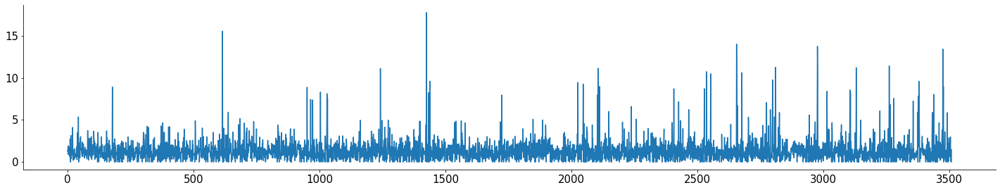

In [12]:
plt.plot(avgd_normed_dataRNN[0,:])

issue: does the individual scaling by layer introduce bias that may artificially increase performance of the network?

## Data Loader 


In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F
torch.cuda.empty_cache()

In [14]:
torch.__version__

'1.9.0+cu102'

In [15]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [16]:
# set the seed
np.random.seed(42)

# number of neurons 
NN = dataRNN.shape[0]

In [17]:
# swapping the axes to maintain consistency with seq2seq notebook in the following code - the network takes all the neurons at a time step as input, not just one neuron

# avgd_normed_dataRNN = np.swapaxes(avgd_normed_dataRNN, 0, 1)
avgd_normed_dataRNN.shape

(10179, 3510)

In [18]:
frac = 4/5

#x1 = torch.from_numpy(dataRNN[:,:int(frac*dataRNN.shape[1])]).to(device).float().unsqueeze(0)
#x2 = torch.from_numpy(dataRNN[:,int(frac*dataRNN.shape[1]):]).to(device).float().unsqueeze(0)
#x1 = torch.from_numpy(avgd_normed_dataRNN[:1131,:]).to(device).float().unsqueeze(2)
#x2 = torch.from_numpy(avgd_normed_dataRNN[:1131,:]).to(device).float().unsqueeze(2)

n_neurs = 1131
# let's use n_neurs/10 latent components
ncomp = 75#int(n_neurs/10)

x1_train = torch.from_numpy(avgd_normed_dataRNN[:n_neurs,:int(frac*avgd_normed_dataRNN.shape[1])]).to(device).float().unsqueeze(2)
x2_train = torch.from_numpy(avgd_normed_dataRNN[:n_neurs,:int(frac*avgd_normed_dataRNN.shape[1])]).to(device).float().unsqueeze(2)

x1_valid = torch.from_numpy(avgd_normed_dataRNN[:n_neurs,int(frac*avgd_normed_dataRNN.shape[1]):]).to(device).float().unsqueeze(2)
x2_valid = torch.from_numpy(avgd_normed_dataRNN[:n_neurs,int(frac*avgd_normed_dataRNN.shape[1]):]).to(device).float().unsqueeze(2)

NN1 = x1_train.shape[0]
NN2 = x2_train.shape[0]


In [19]:
class Net(nn.Module):
    def __init__(self, ncomp, NN1, NN2, bidi=True):
        super(Net, self).__init__()

        # play with some of the options in the RNN!
        
        self.rnn = nn.LSTM(NN1, ncomp, num_layers = 1, dropout = 0.2,
                         bidirectional = bidi)
        """
        self.rnn = nn.RNN(NN1, ncomp, num_layers = 1, dropout = 0,
                    bidirectional = bidi, nonlinearity = 'tanh')
        self.rnn = nn.GRU(NN1, ncomp, num_layers = 1, dropout = 0,
                         bidirectional = bidi)
        """
        
        self.mlp = nn.Sequential(
                    nn.Linear(ncomp, ncomp*2),
                    nn.Mish(),
                    nn.Linear(ncomp*2, ncomp*2),
                    nn.Mish(),
                    nn.Dropout(0.25),
                    nn.Linear(ncomp*2, ncomp), 
                    nn.Mish())
        
        self.fc = nn.Linear(ncomp, NN2)

    def forward(self, x):
        x = x.permute(1, 2, 0)
        #print(x.shape)
        # h_0 = torch.zeros(2, x.size()[1], self.ncomp).to(device)
        
        y, h_n = self.rnn(x)

        #print(y.shape)
        #print(h_n.shape)
        if self.rnn.bidirectional:
          # if the rnn is bidirectional, it concatenates the activations from the forward and backward pass
          # we want to add them instead, so as to enforce the latents to match between the forward and backward pass
            q = (y[:, :, :ncomp] + y[:, :, ncomp:])/2
        else:
            q = y
        
        q = self.mlp(q)

        # the softplus function is just like a relu but it's smoothed out so we can't predict 0
        # if we predict 0 and there was a spike, that's an instant Inf in the Poisson log-likelihood which leads to failure
        #z = F.softplus(self.fc(q), 10)
        #print(q.shape)
        z = self.fc(q).permute(2, 0, 1)
        # print(z.shape)
        return z, q

array([0.32927325, 0.42341867, 0.0194147 , ..., 0.7027562 , 0.13123907,
       0.        ])

In [ ]:
# we initialize the neural network
net = Net(ncomp, NN1, NN2, bidi = True).to(device)

# special thing:  we initialize the biases of the last layer in the neural network
# we set them as the mean firing rates of the neurons.
# this should make the initial predictions close to the mean, because the latents don't contribute much
# net.fc.bias.data[:] = x1_train.mean(axis = (0,1))

# we set up the optimizer. Adjust the learning rate if the training is slow or if it explodes.
optimizer1 = torch.optim.Adam(net.parameters(), lr= 0.0003795, weight_decay= 10e-6)
# optimizer2 = torch.optim.SGD(net.parameters(), lr = 0.0001, momentum = 0.9, weight_decay = 0.01, )
# optimizer3 = torch.optim.

In [ ]:
# forward check 
# net(x1)
net(x1_train)

## Training 

In [ ]:
from tqdm import tqdm

In [ ]:
from sam import SAM

base_optimizer = torch.optim.Adam  # define an optimizer for the "sharpness-aware" update
optimizer = SAM(net.parameters(), base_optimizer, lr=0.000375, weight_decay = 10e-6)#, momentum=0.9)

# you can keep re-running this cell if you think the cost might decrease further

cost = nn.MSELoss()

#train_save = []
#valid_save = []

niter =  30000 # 
# rnn_loss = 0.2372, lstm_loss = 0.2340, gru_lstm = 0.2370
for k in tqdm(range(niter)):
    net.train()
    # the network outputs the single-neuron prediction and the latents
    z, y = net(x1_train)

    # our cost
    loss = cost(z, x2_train)

    # train the network as usual
    loss.backward()
    optimizer.first_step(zero_grad = True)
    cost(net(x1_train)[0],x2_train).backward()
    
    optimizer.second_step(zero_grad=True)
    
    """
    # this can be run in a first phase, before wandb finetuning
    with torch.no_grad():
        net.eval()
        train_save.append(loss.item())
        valid_loss = cost(net(x1_valid)[0], x2_valid)
        valid_save.append(valid_loss.item())
    """;

    if k % 50 == 0:
        with torch.no_grad():
            net.eval()
            valid_loss = cost(net(x1_valid)[0], x2_valid)
            
            print(f' iteration {k}, train cost {loss.item():.4f}, valid cost {valid_loss.item():.4f}')

In [ ]:
#plt.plot(train_save)
#plt.plot(valid_save)

In [ ]:
torch.save(Net, "/home/sazeglio/NMAs/SavedModels/Net_Layer_0.pt")

### Saving Model 

## Validation from same neurons

In [34]:
test, hidden = net(x1_valid)

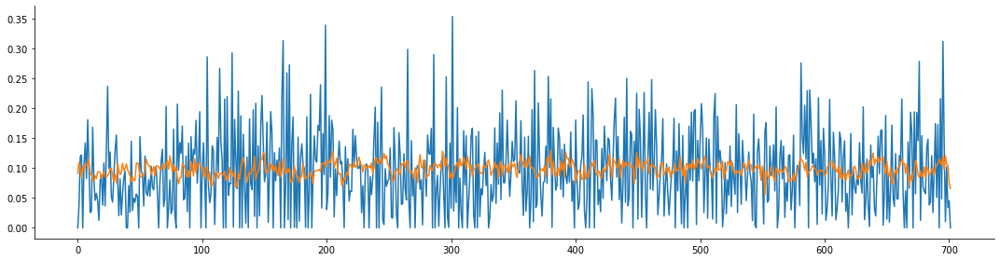

In [37]:
%matplotlib inline
plt.figure(figsize = (15, 4))
plt.plot(x2_valid[4,:,0].cpu().detach().numpy())
plt.plot(test[4,:,0].cpu().detach().numpy())

# Training 9 Networks 
Training the same LSTM on the remaining layers

In [56]:
run = 7

In [57]:
avgd_normed_dataRNN[n_neurs*run:n_neurs*(run+1) ].shape

(1131, 3510)

In [ ]:

for run in tqdm(range(1, 9)):
    ### empty cuda at each iteration 
    torch.cuda.empty_cache()
    net = Net(ncomp, NN1, NN2, bidi = True).to(device)
    
    base_optimizer = torch.optim.Adam  # define an optimizer for the "sharpness-aware" update
    optimizer = SAM(net.parameters(), base_optimizer, lr=0.000375, weight_decay = 10e-6)#, momentum=0.9)

    # you can keep re-running this cell if you think the cost might decrease further
    cost = nn.MSELoss()
    
    x1_train = torch.from_numpy(avgd_normed_dataRNN[n_neurs*run:n_neurs*(run+1)  ,:int(frac*avgd_normed_dataRNN.shape[1])]).to(device).float().unsqueeze(2)
    x2_train = torch.from_numpy(avgd_normed_dataRNN[n_neurs*run:n_neurs*(run+1) ,:int(frac*avgd_normed_dataRNN.shape[1])]).to(device).float().unsqueeze(2)

    x1_valid = torch.from_numpy(avgd_normed_dataRNN[n_neurs*run:n_neurs*(run+1) ,int(frac*avgd_normed_dataRNN.shape[1]):]).to(device).float().unsqueeze(2)
    x2_valid = torch.from_numpy(avgd_normed_dataRNN[n_neurs*run:n_neurs*(run+1) ,int(frac*avgd_normed_dataRNN.shape[1]):]).to(device).float().unsqueeze(2)

    NN1 = x1_train.shape[0]
    NN2 = x2_train.shape[0]
    
    niter =  30000 # 
    # rnn_loss = 0.2372, lstm_loss = 0.2340, gru_lstm = 0.2370
    for k in tqdm(range(niter)):
        net.train()
        # the network outputs the single-neuron prediction and the latents
        z, y = net(x1_train)

        # our cost
        loss = cost(z, x2_train)

        # train the network as usual
        loss.backward()
        optimizer.first_step(zero_grad = True)
        cost(net(x1_train)[0],x2_train).backward()

        optimizer.second_step(zero_grad=True)

        """
        # this can be run in a first phase, before wandb finetuning
        with torch.no_grad():
            net.eval()
            train_save.append(loss.item())
            valid_loss = cost(net(x1_valid)[0], x2_valid)
            valid_save.append(valid_loss.item())
        """;

        if k % 50 == 0:
            with torch.no_grad():
                net.eval()
                valid_loss = cost(net(x1_valid)[0], x2_valid)

                print(f' iteration {k}, train cost {loss.item():.4f}, valid cost {valid_loss.item():.4f}')
                
    torch.save(Net, "/home/sazeglio/NMAs/SavedModels/Net_Layer_"+str(run)+".pt")

  0%|          | 0/8 [00:00<?, ?it/s]/usr/local/lib/python3.8/dist-packages/torch/nn/modules/rnn.py:62: UserWarning: dropout option adds dropout after all but last recurrent layer, so non-zero dropout expects num_layers greater than 1, but got dropout=0.2 and num_layers=1
  warnings.warn("dropout option adds dropout after all but last "

  0%|          | 1/30000 [00:00<2:23:53,  3.47it/s]

 iteration 0, train cost 3.7067, valid cost 3.7940



  0%|          | 51/30000 [00:13<2:11:47,  3.79it/s]

 iteration 50, train cost 2.4466, valid cost 2.5027



  0%|          | 101/30000 [00:26<2:11:34,  3.79it/s]

 iteration 100, train cost 2.1551, valid cost 2.2169



  1%|          | 151/30000 [00:39<2:12:35,  3.75it/s]

 iteration 150, train cost 2.1374, valid cost 2.2030



  1%|          | 201/30000 [00:52<2:13:38,  3.72it/s]

 iteration 200, train cost 2.1336, valid cost 2.2013



  1%|          | 251/30000 [01:05<2:13:16,  3.72it/s]

 iteration 250, train cost 2.1308, valid cost 2.2005



  1%|          | 301/30000 [01:18<2:12:46,  3.73it/s]

 iteration 300, train cost 2.1284, valid cost 2.1993



  1%|          | 351/30000 [01:31<2:16:22,  3.62it/s]

 iteration 350, train cost 2.1257, valid cost 2.1975



  1%|▏         | 401/30000 [01:44<2:11:27,  3.75it/s]

 iteration 400, train cost 2.1211, valid cost 2.1936



  2%|▏         | 451/30000 [01:57<2:12:30,  3.72it/s]

 iteration 450, train cost 2.1082, valid cost 2.1799



  2%|▏         | 501/30000 [02:10<2:09:50,  3.79it/s]

 iteration 500, train cost 2.0725, valid cost 2.1409



  2%|▏         | 551/30000 [02:23<2:09:13,  3.80it/s]

 iteration 550, train cost 2.0387, valid cost 2.1039



  2%|▏         | 601/30000 [02:36<2:07:55,  3.83it/s]

 iteration 600, train cost 2.0144, valid cost 2.0757



  2%|▏         | 651/30000 [02:49<2:08:07,  3.82it/s]

 iteration 650, train cost 1.9806, valid cost 2.0384



  2%|▏         | 701/30000 [03:02<2:06:53,  3.85it/s]

 iteration 700, train cost 1.9512, valid cost 2.0105



  3%|▎         | 751/30000 [03:14<2:06:36,  3.85it/s]

 iteration 750, train cost 1.9187, valid cost 1.9806



  3%|▎         | 801/30000 [03:27<2:08:00,  3.80it/s]

 iteration 800, train cost 1.8996, valid cost 1.9576



  3%|▎         | 851/30000 [03:40<2:07:01,  3.82it/s]

 iteration 850, train cost 1.8818, valid cost 1.9404



  3%|▎         | 901/30000 [03:53<2:07:26,  3.81it/s]

 iteration 900, train cost 1.8638, valid cost 1.9186



  3%|▎         | 951/30000 [04:06<2:09:38,  3.73it/s]

 iteration 950, train cost 1.8485, valid cost 1.9032



  3%|▎         | 1001/30000 [04:19<2:07:53,  3.78it/s]

 iteration 1000, train cost 1.8356, valid cost 1.8910



  4%|▎         | 1051/30000 [04:31<2:09:44,  3.72it/s]

 iteration 1050, train cost 1.8217, valid cost 1.8786



  4%|▎         | 1101/30000 [04:45<2:09:15,  3.73it/s]

 iteration 1100, train cost 1.8056, valid cost 1.8634



  4%|▍         | 1151/30000 [04:57<2:06:19,  3.81it/s]

 iteration 1150, train cost 1.7899, valid cost 1.8497



  4%|▍         | 1201/30000 [05:11<2:10:33,  3.68it/s]

 iteration 1200, train cost 1.7762, valid cost 1.8391



  4%|▍         | 1251/30000 [05:24<2:09:48,  3.69it/s]

 iteration 1250, train cost 1.7656, valid cost 1.8310



  4%|▍         | 1301/30000 [05:37<2:05:41,  3.81it/s]

 iteration 1300, train cost 1.7556, valid cost 1.8238



  5%|▍         | 1351/30000 [05:49<2:05:09,  3.82it/s]

 iteration 1350, train cost 1.7470, valid cost 1.8179



  5%|▍         | 1401/30000 [06:02<2:04:24,  3.83it/s]

 iteration 1400, train cost 1.7390, valid cost 1.8110



  5%|▍         | 1451/30000 [06:15<2:04:09,  3.83it/s]

 iteration 1450, train cost 1.7306, valid cost 1.8036



  5%|▌         | 1501/30000 [06:28<2:05:09,  3.80it/s]

 iteration 1500, train cost 1.7207, valid cost 1.7957



  5%|▌         | 1551/30000 [06:41<2:04:29,  3.81it/s]

 iteration 1550, train cost 1.7122, valid cost 1.7872



  5%|▌         | 1601/30000 [06:53<2:08:40,  3.68it/s]

 iteration 1600, train cost 1.7017, valid cost 1.7782



  6%|▌         | 1651/30000 [07:06<2:03:04,  3.84it/s]

 iteration 1650, train cost 1.6910, valid cost 1.7698



  6%|▌         | 1701/30000 [07:19<2:03:02,  3.83it/s]

 iteration 1700, train cost 1.6822, valid cost 1.7618



  6%|▌         | 1751/30000 [07:32<2:08:39,  3.66it/s]

 iteration 1750, train cost 1.6737, valid cost 1.7547



  6%|▌         | 1801/30000 [07:45<2:03:27,  3.81it/s]

 iteration 1800, train cost 1.6646, valid cost 1.7480



  6%|▌         | 1851/30000 [07:58<2:07:49,  3.67it/s]

 iteration 1850, train cost 1.6578, valid cost 1.7419



  6%|▋         | 1901/30000 [08:11<2:05:53,  3.72it/s]

 iteration 1900, train cost 1.6490, valid cost 1.7356



  7%|▋         | 1951/30000 [08:24<2:04:43,  3.75it/s]

 iteration 1950, train cost 1.6421, valid cost 1.7295



  7%|▋         | 2001/30000 [08:37<2:07:05,  3.67it/s]

 iteration 2000, train cost 1.6345, valid cost 1.7230



  7%|▋         | 2051/30000 [08:50<2:04:38,  3.74it/s]

 iteration 2050, train cost 1.6275, valid cost 1.7169



  7%|▋         | 2101/30000 [09:03<2:04:00,  3.75it/s]

 iteration 2100, train cost 1.6206, valid cost 1.7105



  7%|▋         | 2151/30000 [09:16<2:02:09,  3.80it/s]

 iteration 2150, train cost 1.6133, valid cost 1.7044



  7%|▋         | 2201/30000 [09:29<2:02:49,  3.77it/s]

 iteration 2200, train cost 1.6065, valid cost 1.6984



  8%|▊         | 2251/30000 [09:42<2:02:23,  3.78it/s]

 iteration 2250, train cost 1.5989, valid cost 1.6925



  8%|▊         | 2301/30000 [09:55<2:06:50,  3.64it/s]

 iteration 2300, train cost 1.5921, valid cost 1.6864



  8%|▊         | 2351/30000 [10:08<2:05:37,  3.67it/s]

 iteration 2350, train cost 1.5869, valid cost 1.6813



  8%|▊         | 2401/30000 [10:21<2:01:33,  3.78it/s]

 iteration 2400, train cost 1.5779, valid cost 1.6753



  8%|▊         | 2451/30000 [10:34<2:00:25,  3.81it/s]

 iteration 2450, train cost 1.5729, valid cost 1.6700



  8%|▊         | 2501/30000 [10:47<2:01:46,  3.76it/s]

 iteration 2500, train cost 1.5668, valid cost 1.6650



  9%|▊         | 2551/30000 [11:00<2:01:28,  3.77it/s]

 iteration 2550, train cost 1.5604, valid cost 1.6614



  9%|▊         | 2601/30000 [11:13<2:00:55,  3.78it/s]

 iteration 2600, train cost 1.5540, valid cost 1.6560



  9%|▉         | 2651/30000 [11:25<2:00:47,  3.77it/s]

 iteration 2650, train cost 1.5482, valid cost 1.6520



  9%|▉         | 2701/30000 [11:38<1:59:35,  3.80it/s]

 iteration 2700, train cost 1.5430, valid cost 1.6474



  9%|▉         | 2751/30000 [11:51<1:58:55,  3.82it/s]

 iteration 2750, train cost 1.5365, valid cost 1.6437



  9%|▉         | 2801/30000 [12:04<1:58:08,  3.84it/s]

 iteration 2800, train cost 1.5308, valid cost 1.6396



 10%|▉         | 2851/30000 [12:17<1:58:22,  3.82it/s]

 iteration 2850, train cost 1.5260, valid cost 1.6356



 10%|▉         | 2901/30000 [12:30<1:57:54,  3.83it/s]

 iteration 2900, train cost 1.5203, valid cost 1.6319



 10%|▉         | 2951/30000 [12:42<1:57:00,  3.85it/s]

 iteration 2950, train cost 1.5155, valid cost 1.6288



 10%|█         | 3001/30000 [12:55<1:59:39,  3.76it/s]

 iteration 3000, train cost 1.5086, valid cost 1.6254



 10%|█         | 3051/30000 [13:08<1:56:19,  3.86it/s]

 iteration 3050, train cost 1.5043, valid cost 1.6221



 10%|█         | 3101/30000 [13:21<1:59:59,  3.74it/s]

 iteration 3100, train cost 1.4993, valid cost 1.6187



 11%|█         | 3151/30000 [13:34<2:00:49,  3.70it/s]

 iteration 3150, train cost 1.4984, valid cost 1.6173



 11%|█         | 3201/30000 [13:47<1:57:23,  3.80it/s]

 iteration 3200, train cost 1.4901, valid cost 1.6130



 11%|█         | 3251/30000 [14:00<1:59:36,  3.73it/s]

 iteration 3250, train cost 1.4857, valid cost 1.6100



 11%|█         | 3301/30000 [14:13<1:58:53,  3.74it/s]

 iteration 3300, train cost 1.4819, valid cost 1.6070



 11%|█         | 3351/30000 [14:26<1:57:46,  3.77it/s]

 iteration 3350, train cost 1.4779, valid cost 1.6042



 11%|█▏        | 3401/30000 [14:39<1:59:59,  3.69it/s]

 iteration 3400, train cost 1.4740, valid cost 1.6021



 12%|█▏        | 3451/30000 [14:52<1:55:58,  3.82it/s]

 iteration 3450, train cost 1.4696, valid cost 1.5998



 12%|█▏        | 3501/30000 [15:05<1:54:21,  3.86it/s]

 iteration 3500, train cost 1.4653, valid cost 1.5975



 12%|█▏        | 3551/30000 [15:18<1:57:46,  3.74it/s]

 iteration 3550, train cost 1.4626, valid cost 1.5954



 12%|█▏        | 3601/30000 [15:31<1:56:02,  3.79it/s]

 iteration 3600, train cost 1.4599, valid cost 1.5934



 12%|█▏        | 3651/30000 [15:44<1:54:54,  3.82it/s]

 iteration 3650, train cost 1.4550, valid cost 1.5914



 12%|█▏        | 3701/30000 [15:56<1:54:19,  3.83it/s]

 iteration 3700, train cost 1.4529, valid cost 1.5894



 13%|█▎        | 3751/30000 [16:09<1:56:05,  3.77it/s]

 iteration 3750, train cost 1.4504, valid cost 1.5880



 13%|█▎        | 3801/30000 [16:22<1:53:59,  3.83it/s]

 iteration 3800, train cost 1.4467, valid cost 1.5863



 13%|█▎        | 3851/30000 [16:35<1:54:19,  3.81it/s]

 iteration 3850, train cost 1.4429, valid cost 1.5846



 13%|█▎        | 3901/30000 [16:48<1:52:44,  3.86it/s]

 iteration 3900, train cost 1.4409, valid cost 1.5833



 13%|█▎        | 3951/30000 [17:01<1:52:49,  3.85it/s]

 iteration 3950, train cost 1.4388, valid cost 1.5815



 13%|█▎        | 4001/30000 [17:14<1:56:20,  3.72it/s]

 iteration 4000, train cost 1.4366, valid cost 1.5799



 14%|█▎        | 4051/30000 [17:27<1:54:26,  3.78it/s]

 iteration 4050, train cost 1.4329, valid cost 1.5787



 14%|█▎        | 4101/30000 [17:39<1:50:08,  3.92it/s]

 iteration 4100, train cost 1.4299, valid cost 1.5774



 14%|█▍        | 4151/30000 [17:52<1:56:50,  3.69it/s]

 iteration 4150, train cost 1.4277, valid cost 1.5759



 14%|█▍        | 4201/30000 [18:05<1:52:46,  3.81it/s]

 iteration 4200, train cost 1.4244, valid cost 1.5740



 14%|█▍        | 4251/30000 [18:18<1:54:51,  3.74it/s]

 iteration 4250, train cost 1.4226, valid cost 1.5734



 14%|█▍        | 4301/30000 [18:31<1:50:17,  3.88it/s]

 iteration 4300, train cost 1.4205, valid cost 1.5723



 15%|█▍        | 4351/30000 [18:43<1:52:51,  3.79it/s]

 iteration 4350, train cost 1.4172, valid cost 1.5705



 15%|█▍        | 4401/30000 [18:56<1:52:42,  3.79it/s]

 iteration 4400, train cost 1.4145, valid cost 1.5692



 15%|█▍        | 4451/30000 [19:10<1:57:00,  3.64it/s]

 iteration 4450, train cost 1.4127, valid cost 1.5678



 15%|█▌        | 4501/30000 [19:23<1:56:31,  3.65it/s]

 iteration 4500, train cost 1.4099, valid cost 1.5667



 15%|█▌        | 4551/30000 [19:36<1:51:21,  3.81it/s]

 iteration 4550, train cost 1.4068, valid cost 1.5650



 15%|█▌        | 4601/30000 [19:49<1:53:50,  3.72it/s]

 iteration 4600, train cost 1.4047, valid cost 1.5642



 16%|█▌        | 4651/30000 [20:02<1:49:49,  3.85it/s]

 iteration 4650, train cost 1.4034, valid cost 1.5630



 16%|█▌        | 4701/30000 [20:16<2:16:35,  3.09it/s]

 iteration 4700, train cost 1.4001, valid cost 1.5614



 16%|█▌        | 4751/30000 [20:32<2:19:35,  3.01it/s]

 iteration 4750, train cost 1.3968, valid cost 1.5601



 16%|█▌        | 4801/30000 [20:48<2:18:22,  3.04it/s]

 iteration 4800, train cost 1.3933, valid cost 1.5592



 16%|█▌        | 4851/30000 [21:04<2:17:43,  3.04it/s]

 iteration 4850, train cost 1.3932, valid cost 1.5574



 16%|█▋        | 4901/30000 [21:20<2:16:43,  3.06it/s]

 iteration 4900, train cost 1.3896, valid cost 1.5562



 17%|█▋        | 4951/30000 [21:36<2:15:31,  3.08it/s]

 iteration 4950, train cost 1.3879, valid cost 1.5551



 17%|█▋        | 5001/30000 [21:53<2:19:44,  2.98it/s]

 iteration 5000, train cost 1.3847, valid cost 1.5536



 17%|█▋        | 5051/30000 [22:09<2:21:49,  2.93it/s]

 iteration 5050, train cost 1.3826, valid cost 1.5531



 17%|█▋        | 5101/30000 [22:25<2:15:42,  3.06it/s]

 iteration 5100, train cost 1.3813, valid cost 1.5514



 17%|█▋        | 5151/30000 [22:41<2:15:00,  3.07it/s]

 iteration 5150, train cost 1.3776, valid cost 1.5509



 17%|█▋        | 5201/30000 [22:57<2:15:29,  3.05it/s]

 iteration 5200, train cost 1.3756, valid cost 1.5488



 18%|█▊        | 5251/30000 [23:13<2:16:41,  3.02it/s]

 iteration 5250, train cost 1.3730, valid cost 1.5478



 18%|█▊        | 5301/30000 [23:29<2:20:15,  2.93it/s]

 iteration 5300, train cost 1.3705, valid cost 1.5468



 18%|█▊        | 5351/30000 [23:45<2:14:55,  3.04it/s]

 iteration 5350, train cost 1.3680, valid cost 1.5456



 18%|█▊        | 5401/30000 [24:01<2:12:52,  3.09it/s]

 iteration 5400, train cost 1.3660, valid cost 1.5438



 18%|█▊        | 5451/30000 [24:17<2:13:06,  3.07it/s]

 iteration 5450, train cost 1.3647, valid cost 1.5424



 18%|█▊        | 5501/30000 [24:33<2:14:18,  3.04it/s]

 iteration 5500, train cost 1.3624, valid cost 1.5416



 19%|█▊        | 5551/30000 [24:49<2:12:50,  3.07it/s]

 iteration 5550, train cost 1.3594, valid cost 1.5393



 19%|█▊        | 5601/30000 [25:05<2:11:35,  3.09it/s]

 iteration 5600, train cost 1.3567, valid cost 1.5388



 19%|█▉        | 5651/30000 [25:21<2:11:35,  3.08it/s]

 iteration 5650, train cost 1.3554, valid cost 1.5369



 19%|█▉        | 5701/30000 [25:37<2:11:43,  3.07it/s]

 iteration 5700, train cost 1.3528, valid cost 1.5359



 19%|█▉        | 5751/30000 [25:53<2:12:34,  3.05it/s]

 iteration 5750, train cost 1.3509, valid cost 1.5340



 19%|█▉        | 5801/30000 [26:09<2:11:04,  3.08it/s]

 iteration 5800, train cost 1.3476, valid cost 1.5328



 20%|█▉        | 5851/30000 [26:25<2:11:24,  3.06it/s]

 iteration 5850, train cost 1.3463, valid cost 1.5316



 20%|█▉        | 5901/30000 [26:41<2:12:10,  3.04it/s]

 iteration 5900, train cost 1.3441, valid cost 1.5304



 20%|█▉        | 5951/30000 [26:57<2:10:35,  3.07it/s]

 iteration 5950, train cost 1.3412, valid cost 1.5295



 20%|██        | 6001/30000 [27:13<2:13:18,  3.00it/s]

 iteration 6000, train cost 1.3394, valid cost 1.5277



 20%|██        | 6051/30000 [27:30<2:10:46,  3.05it/s]

 iteration 6050, train cost 1.3395, valid cost 1.5267



 20%|██        | 6101/30000 [27:45<2:10:05,  3.06it/s]

 iteration 6100, train cost 1.3365, valid cost 1.5255



 21%|██        | 6151/30000 [28:01<2:10:36,  3.04it/s]

 iteration 6150, train cost 1.3336, valid cost 1.5242



 21%|██        | 6201/30000 [28:17<2:07:55,  3.10it/s]

 iteration 6200, train cost 1.3327, valid cost 1.5229



 21%|██        | 6251/30000 [28:33<2:09:23,  3.06it/s]

 iteration 6250, train cost 1.3322, valid cost 1.5222



 21%|██        | 6301/30000 [28:49<2:08:01,  3.09it/s]

 iteration 6300, train cost 1.3289, valid cost 1.5200



 21%|██        | 6351/30000 [29:05<2:10:21,  3.02it/s]

 iteration 6350, train cost 1.3266, valid cost 1.5191



 21%|██▏       | 6401/30000 [29:21<2:06:48,  3.10it/s]

 iteration 6400, train cost 1.3249, valid cost 1.5180



 22%|██▏       | 6451/30000 [29:37<2:07:39,  3.07it/s]

 iteration 6450, train cost 1.3229, valid cost 1.5172



 22%|██▏       | 6501/30000 [29:53<2:11:18,  2.98it/s]

 iteration 6500, train cost 1.3205, valid cost 1.5159



 22%|██▏       | 6551/30000 [30:09<2:07:25,  3.07it/s]

 iteration 6550, train cost 1.3188, valid cost 1.5151



 22%|██▏       | 6601/30000 [30:25<2:11:35,  2.96it/s]

 iteration 6600, train cost 1.3177, valid cost 1.5138



 22%|██▏       | 6651/30000 [30:41<2:06:05,  3.09it/s]

 iteration 6650, train cost 1.3146, valid cost 1.5130



 22%|██▏       | 6701/30000 [30:57<2:05:47,  3.09it/s]

 iteration 6700, train cost 1.3143, valid cost 1.5118



 23%|██▎       | 6751/30000 [31:13<2:08:31,  3.02it/s]

 iteration 6750, train cost 1.3144, valid cost 1.5109



 23%|██▎       | 6801/30000 [31:29<2:06:28,  3.06it/s]

 iteration 6800, train cost 1.3138, valid cost 1.5110



 23%|██▎       | 6851/30000 [31:45<2:07:11,  3.03it/s]

 iteration 6850, train cost 1.3107, valid cost 1.5088



 23%|██▎       | 6901/30000 [32:01<2:05:28,  3.07it/s]

 iteration 6900, train cost 1.3095, valid cost 1.5080



 23%|██▎       | 6951/30000 [32:17<2:04:25,  3.09it/s]

 iteration 6950, train cost 1.3065, valid cost 1.5068



 23%|██▎       | 7001/30000 [32:33<2:05:11,  3.06it/s]

 iteration 7000, train cost 1.3062, valid cost 1.5058



 24%|██▎       | 7051/30000 [32:49<2:04:22,  3.08it/s]

 iteration 7050, train cost 1.3037, valid cost 1.5050



 24%|██▎       | 7101/30000 [33:05<2:04:15,  3.07it/s]

 iteration 7100, train cost 1.3028, valid cost 1.5048



 24%|██▍       | 7151/30000 [33:20<2:03:29,  3.08it/s]

 iteration 7150, train cost 1.3009, valid cost 1.5035



 24%|██▍       | 7201/30000 [33:36<2:04:56,  3.04it/s]

 iteration 7200, train cost 1.3006, valid cost 1.5024



 24%|██▍       | 7251/30000 [33:52<2:04:16,  3.05it/s]

 iteration 7250, train cost 1.2989, valid cost 1.5013



 24%|██▍       | 7301/30000 [34:08<2:09:45,  2.92it/s]

 iteration 7300, train cost 1.2984, valid cost 1.5010



 25%|██▍       | 7351/30000 [34:24<2:02:24,  3.08it/s]

 iteration 7350, train cost 1.2968, valid cost 1.4995



 25%|██▍       | 7401/30000 [34:40<2:02:14,  3.08it/s]

 iteration 7400, train cost 1.2937, valid cost 1.4990



 25%|██▍       | 7451/30000 [34:56<2:03:18,  3.05it/s]

 iteration 7450, train cost 1.2935, valid cost 1.4982



 25%|██▌       | 7501/30000 [35:12<2:02:29,  3.06it/s]

 iteration 7500, train cost 1.2917, valid cost 1.4970



 25%|██▌       | 7551/30000 [35:28<2:01:55,  3.07it/s]

 iteration 7550, train cost 1.2910, valid cost 1.4963



 25%|██▌       | 7601/30000 [35:44<2:02:23,  3.05it/s]

 iteration 7600, train cost 1.2893, valid cost 1.4955



 26%|██▌       | 7651/30000 [36:00<2:01:14,  3.07it/s]

 iteration 7650, train cost 1.2875, valid cost 1.4949



 26%|██▌       | 7701/30000 [36:16<2:00:08,  3.09it/s]

 iteration 7700, train cost 1.2859, valid cost 1.4939



 26%|██▌       | 7751/30000 [36:32<2:00:50,  3.07it/s]

 iteration 7750, train cost 1.2859, valid cost 1.4936



 26%|██▌       | 7801/30000 [36:48<1:59:42,  3.09it/s]

 iteration 7800, train cost 1.2842, valid cost 1.4920



 26%|██▌       | 7851/30000 [37:04<1:59:43,  3.08it/s]

 iteration 7850, train cost 1.2822, valid cost 1.4915



 26%|██▋       | 7901/30000 [37:20<2:00:15,  3.06it/s]

 iteration 7900, train cost 1.2828, valid cost 1.4911



 27%|██▋       | 7951/30000 [37:36<1:59:48,  3.07it/s]

 iteration 7950, train cost 1.2805, valid cost 1.4896



 27%|██▋       | 8001/30000 [37:52<1:59:25,  3.07it/s]

 iteration 8000, train cost 1.2792, valid cost 1.4891



 27%|██▋       | 8051/30000 [38:08<1:59:32,  3.06it/s]

 iteration 8050, train cost 1.2791, valid cost 1.4888



 27%|██▋       | 8101/30000 [38:24<2:00:00,  3.04it/s]

 iteration 8100, train cost 1.2773, valid cost 1.4878



 27%|██▋       | 8151/30000 [38:40<1:57:59,  3.09it/s]

 iteration 8150, train cost 1.2773, valid cost 1.4871



 27%|██▋       | 8201/30000 [38:56<1:58:24,  3.07it/s]

 iteration 8200, train cost 1.2765, valid cost 1.4863



 28%|██▊       | 8251/30000 [39:12<1:58:35,  3.06it/s]

 iteration 8250, train cost 1.2758, valid cost 1.4857



 28%|██▊       | 8301/30000 [39:28<1:57:14,  3.08it/s]

 iteration 8300, train cost 1.2757, valid cost 1.4864



 28%|██▊       | 8351/30000 [39:44<1:56:59,  3.08it/s]

 iteration 8350, train cost 1.2707, valid cost 1.4852



 28%|██▊       | 8401/30000 [40:00<1:57:03,  3.08it/s]

 iteration 8400, train cost 1.2727, valid cost 1.4843



 28%|██▊       | 8451/30000 [40:16<1:57:09,  3.07it/s]

 iteration 8450, train cost 1.2713, valid cost 1.4840



 28%|██▊       | 8501/30000 [40:32<1:56:33,  3.07it/s]

 iteration 8500, train cost 1.2703, valid cost 1.4830



 29%|██▊       | 8551/30000 [40:48<1:56:35,  3.07it/s]

 iteration 8550, train cost 1.2689, valid cost 1.4825



 29%|██▊       | 8601/30000 [41:04<1:57:07,  3.04it/s]

 iteration 8600, train cost 1.2685, valid cost 1.4817



 29%|██▉       | 8651/30000 [41:19<1:55:21,  3.08it/s]

 iteration 8650, train cost 1.2676, valid cost 1.4814



 29%|██▉       | 8701/30000 [41:35<1:55:18,  3.08it/s]

 iteration 8700, train cost 1.2781, valid cost 1.4842



 29%|██▉       | 8751/30000 [41:51<1:55:29,  3.07it/s]

 iteration 8750, train cost 1.2655, valid cost 1.4799



 29%|██▉       | 8801/30000 [42:07<1:55:49,  3.05it/s]

 iteration 8800, train cost 1.2640, valid cost 1.4796



 30%|██▉       | 8851/30000 [42:23<1:53:53,  3.10it/s]

 iteration 8850, train cost 1.2649, valid cost 1.4781



 30%|██▉       | 8901/30000 [42:39<1:54:24,  3.07it/s]

 iteration 8900, train cost 1.2626, valid cost 1.4777



 30%|██▉       | 8951/30000 [42:55<1:59:12,  2.94it/s]

 iteration 8950, train cost 1.2615, valid cost 1.4779



 30%|███       | 9001/30000 [43:11<1:55:25,  3.03it/s]

 iteration 9000, train cost 1.2607, valid cost 1.4773



 30%|███       | 9051/30000 [43:27<1:56:21,  3.00it/s]

 iteration 9050, train cost 1.2586, valid cost 1.4766



 30%|███       | 9101/30000 [43:43<1:53:45,  3.06it/s]

 iteration 9100, train cost 1.2604, valid cost 1.4763



 31%|███       | 9151/30000 [43:59<2:03:22,  2.82it/s]

 iteration 9150, train cost 1.2592, valid cost 1.4753



 31%|███       | 9201/30000 [44:15<1:52:33,  3.08it/s]

 iteration 9200, train cost 1.2582, valid cost 1.4748



 31%|███       | 9251/30000 [44:32<1:55:08,  3.00it/s]

 iteration 9250, train cost 1.2565, valid cost 1.4747



 31%|███       | 9301/30000 [44:48<1:51:33,  3.09it/s]

 iteration 9300, train cost 1.2548, valid cost 1.4746



 31%|███       | 9351/30000 [45:03<1:51:47,  3.08it/s]

 iteration 9350, train cost 1.2563, valid cost 1.4742



 31%|███▏      | 9401/30000 [45:19<1:53:42,  3.02it/s]

 iteration 9400, train cost 1.2558, valid cost 1.4731



 32%|███▏      | 9451/30000 [45:36<1:53:36,  3.01it/s]

 iteration 9450, train cost 1.2540, valid cost 1.4725



 32%|███▏      | 9501/30000 [45:51<1:50:27,  3.09it/s]

 iteration 9500, train cost 1.2523, valid cost 1.4725



 32%|███▏      | 9551/30000 [46:07<1:51:45,  3.05it/s]

 iteration 9550, train cost 1.2528, valid cost 1.4712



 32%|███▏      | 9601/30000 [46:23<1:51:41,  3.04it/s]

 iteration 9600, train cost 1.2527, valid cost 1.4711



 32%|███▏      | 9651/30000 [46:39<1:51:00,  3.05it/s]

 iteration 9650, train cost 1.2496, valid cost 1.4710



 32%|███▏      | 9701/30000 [46:55<1:51:10,  3.04it/s]

 iteration 9700, train cost 1.2502, valid cost 1.4709



 33%|███▎      | 9751/30000 [47:11<1:49:19,  3.09it/s]

 iteration 9750, train cost 1.2509, valid cost 1.4700



 33%|███▎      | 9801/30000 [47:27<1:50:15,  3.05it/s]

 iteration 9800, train cost 1.2496, valid cost 1.4700



 33%|███▎      | 9851/30000 [47:43<1:49:09,  3.08it/s]

 iteration 9850, train cost 1.2485, valid cost 1.4690



 33%|███▎      | 9901/30000 [47:59<1:48:58,  3.07it/s]

 iteration 9900, train cost 1.2488, valid cost 1.4688



 33%|███▎      | 9951/30000 [48:15<1:54:45,  2.91it/s]

 iteration 9950, train cost 1.2474, valid cost 1.4683



 33%|███▎      | 10001/30000 [48:31<1:49:07,  3.05it/s]

 iteration 10000, train cost 1.2454, valid cost 1.4682



 34%|███▎      | 10051/30000 [48:47<1:49:12,  3.04it/s]

 iteration 10050, train cost 1.2456, valid cost 1.4677



 34%|███▎      | 10101/30000 [49:03<1:58:48,  2.79it/s]

 iteration 10100, train cost 1.2453, valid cost 1.4676



 34%|███▍      | 10151/30000 [49:19<1:48:08,  3.06it/s]

 iteration 10150, train cost 1.2429, valid cost 1.4672



 34%|███▍      | 10201/30000 [49:35<1:46:34,  3.10it/s]

 iteration 10200, train cost 1.2432, valid cost 1.4663



 34%|███▍      | 10251/30000 [49:51<1:47:07,  3.07it/s]

 iteration 10250, train cost 1.2426, valid cost 1.4661



 34%|███▍      | 10301/30000 [50:07<1:47:36,  3.05it/s]

 iteration 10300, train cost 1.2421, valid cost 1.4662



 35%|███▍      | 10351/30000 [50:22<1:46:09,  3.08it/s]

 iteration 10350, train cost 1.2415, valid cost 1.4650



 35%|███▍      | 10401/30000 [50:39<1:46:26,  3.07it/s]

 iteration 10400, train cost 1.2412, valid cost 1.4648



 35%|███▍      | 10451/30000 [50:54<1:48:36,  3.00it/s]

 iteration 10450, train cost 1.2403, valid cost 1.4647



 35%|███▌      | 10501/30000 [51:10<1:45:27,  3.08it/s]

 iteration 10500, train cost 1.2394, valid cost 1.4640



 35%|███▌      | 10551/30000 [51:26<1:45:54,  3.06it/s]

 iteration 10550, train cost 1.2402, valid cost 1.4635



 35%|███▌      | 10601/30000 [51:42<1:54:17,  2.83it/s]

 iteration 10600, train cost 1.2381, valid cost 1.4632



 36%|███▌      | 10651/30000 [51:58<1:43:42,  3.11it/s]

 iteration 10650, train cost 1.2361, valid cost 1.4633



 36%|███▌      | 10701/30000 [52:14<1:44:22,  3.08it/s]

 iteration 10700, train cost 1.2391, valid cost 1.4630



 36%|███▌      | 10751/30000 [52:30<1:44:15,  3.08it/s]

 iteration 10750, train cost 1.2365, valid cost 1.4633



 36%|███▌      | 10801/30000 [52:46<1:43:46,  3.08it/s]

 iteration 10800, train cost 1.2358, valid cost 1.4623



 36%|███▌      | 10851/30000 [53:02<1:43:44,  3.08it/s]

 iteration 10850, train cost 1.2372, valid cost 1.4622



 36%|███▋      | 10901/30000 [53:18<1:43:05,  3.09it/s]

 iteration 10900, train cost 1.2357, valid cost 1.4622



 37%|███▋      | 10951/30000 [53:34<1:42:57,  3.08it/s]

 iteration 10950, train cost 1.2331, valid cost 1.4616



 37%|███▋      | 11001/30000 [53:50<1:42:39,  3.08it/s]

 iteration 11000, train cost 1.2332, valid cost 1.4609



 37%|███▋      | 11051/30000 [54:06<1:47:45,  2.93it/s]

 iteration 11050, train cost 1.2337, valid cost 1.4609



 37%|███▋      | 11101/30000 [54:22<1:43:16,  3.05it/s]

 iteration 11100, train cost 1.2344, valid cost 1.4611



 37%|███▋      | 11151/30000 [54:38<1:41:26,  3.10it/s]

 iteration 11150, train cost 1.2309, valid cost 1.4605



 37%|███▋      | 11201/30000 [54:54<1:44:51,  2.99it/s]

 iteration 11200, train cost 1.2331, valid cost 1.4598



 38%|███▊      | 11251/30000 [55:10<1:42:29,  3.05it/s]

 iteration 11250, train cost 1.2311, valid cost 1.4599



 38%|███▊      | 11301/30000 [55:26<1:43:02,  3.02it/s]

 iteration 11300, train cost 1.2296, valid cost 1.4596



 38%|███▊      | 11351/30000 [55:42<1:42:09,  3.04it/s]

 iteration 11350, train cost 1.2302, valid cost 1.4593



 38%|███▊      | 11401/30000 [55:58<1:43:18,  3.00it/s]

 iteration 11400, train cost 1.2299, valid cost 1.4590



 38%|███▊      | 11451/30000 [56:14<1:41:51,  3.04it/s]

 iteration 11450, train cost 1.2298, valid cost 1.4591



 38%|███▊      | 11501/30000 [56:31<1:41:20,  3.04it/s]

 iteration 11500, train cost 1.2283, valid cost 1.4586



 39%|███▊      | 11551/30000 [56:47<1:40:32,  3.06it/s]

 iteration 11550, train cost 1.2287, valid cost 1.4587



 39%|███▊      | 11601/30000 [57:03<1:44:42,  2.93it/s]

 iteration 11600, train cost 1.2290, valid cost 1.4579



 39%|███▉      | 11651/30000 [57:20<1:41:30,  3.01it/s]

 iteration 11650, train cost 1.2283, valid cost 1.4578



 39%|███▉      | 11701/30000 [57:36<1:38:39,  3.09it/s]

 iteration 11700, train cost 1.2273, valid cost 1.4577



 39%|███▉      | 11751/30000 [57:52<1:40:27,  3.03it/s]

 iteration 11750, train cost 1.2267, valid cost 1.4572



 39%|███▉      | 11801/30000 [58:08<1:39:30,  3.05it/s]

 iteration 11800, train cost 1.2265, valid cost 1.4567



 40%|███▉      | 11851/30000 [58:24<1:41:15,  2.99it/s]

 iteration 11850, train cost 1.2255, valid cost 1.4568



 40%|███▉      | 11901/30000 [58:41<1:38:55,  3.05it/s]

 iteration 11900, train cost 1.2259, valid cost 1.4562



 40%|███▉      | 11951/30000 [58:57<1:42:06,  2.95it/s]

 iteration 11950, train cost 1.2237, valid cost 1.4563



 40%|████      | 12001/30000 [59:13<1:40:28,  2.99it/s]

 iteration 12000, train cost 1.2245, valid cost 1.4559



 40%|████      | 12051/30000 [59:29<1:38:05,  3.05it/s]

 iteration 12050, train cost 1.2245, valid cost 1.4557



 40%|████      | 12101/30000 [59:45<1:46:56,  2.79it/s]

 iteration 12100, train cost 1.2245, valid cost 1.4552



 41%|████      | 12151/30000 [1:00:01<1:37:30,  3.05it/s]

 iteration 12150, train cost 1.2220, valid cost 1.4552



 41%|████      | 12201/30000 [1:00:17<1:36:20,  3.08it/s]

 iteration 12200, train cost 1.2237, valid cost 1.4548



 41%|████      | 12251/30000 [1:00:33<1:36:46,  3.06it/s]

 iteration 12250, train cost 1.2228, valid cost 1.4547



 41%|████      | 12301/30000 [1:00:49<1:37:06,  3.04it/s]

 iteration 12300, train cost 1.2205, valid cost 1.4542



 41%|████      | 12351/30000 [1:01:05<1:36:20,  3.05it/s]

 iteration 12350, train cost 1.2205, valid cost 1.4541



 41%|████▏     | 12401/30000 [1:01:22<1:38:13,  2.99it/s]

 iteration 12400, train cost 1.2211, valid cost 1.4536



 42%|████▏     | 12451/30000 [1:01:38<1:36:29,  3.03it/s]

 iteration 12450, train cost 1.2193, valid cost 1.4538



 42%|████▏     | 12501/30000 [1:01:54<1:35:00,  3.07it/s]

 iteration 12500, train cost 1.2205, valid cost 1.4530



 42%|████▏     | 12551/30000 [1:02:10<1:36:25,  3.02it/s]

 iteration 12550, train cost 1.2180, valid cost 1.4527



 42%|████▏     | 12601/30000 [1:02:27<1:43:03,  2.81it/s]

 iteration 12600, train cost 1.2188, valid cost 1.4527



 42%|████▏     | 12651/30000 [1:02:43<1:34:31,  3.06it/s]

 iteration 12650, train cost 1.2177, valid cost 1.4521



 42%|████▏     | 12701/30000 [1:02:59<1:34:37,  3.05it/s]

 iteration 12700, train cost 1.2179, valid cost 1.4522



 43%|████▎     | 12751/30000 [1:03:15<1:34:16,  3.05it/s]

 iteration 12750, train cost 1.2170, valid cost 1.4518



 43%|████▎     | 12801/30000 [1:03:31<1:38:42,  2.90it/s]

 iteration 12800, train cost 1.2172, valid cost 1.4517



 43%|████▎     | 12851/30000 [1:03:47<1:32:52,  3.08it/s]

 iteration 12850, train cost 1.2156, valid cost 1.4512



 43%|████▎     | 12901/30000 [1:04:03<1:34:14,  3.02it/s]

 iteration 12900, train cost 1.2149, valid cost 1.4510



 43%|████▎     | 12951/30000 [1:04:19<1:32:47,  3.06it/s]

 iteration 12950, train cost 1.2161, valid cost 1.4505



 43%|████▎     | 13001/30000 [1:04:35<1:33:09,  3.04it/s]

 iteration 13000, train cost 1.2163, valid cost 1.4506



 44%|████▎     | 13051/30000 [1:04:51<1:32:39,  3.05it/s]

 iteration 13050, train cost 1.2150, valid cost 1.4503



 44%|████▎     | 13101/30000 [1:05:08<1:33:49,  3.00it/s]

 iteration 13100, train cost 1.2163, valid cost 1.4496



 44%|████▍     | 13151/30000 [1:05:24<1:31:15,  3.08it/s]

 iteration 13150, train cost 1.2141, valid cost 1.4494



 44%|████▍     | 13201/30000 [1:05:39<1:31:23,  3.06it/s]

 iteration 13200, train cost 1.2142, valid cost 1.4491



 44%|████▍     | 13251/30000 [1:05:55<1:33:59,  2.97it/s]

 iteration 13250, train cost 1.2136, valid cost 1.4491



 44%|████▍     | 13301/30000 [1:06:11<1:30:49,  3.06it/s]

 iteration 13300, train cost 1.2146, valid cost 1.4485



 45%|████▍     | 13351/30000 [1:06:27<1:31:02,  3.05it/s]

 iteration 13350, train cost 1.2123, valid cost 1.4484



 45%|████▍     | 13401/30000 [1:06:43<1:31:37,  3.02it/s]

 iteration 13400, train cost 1.2114, valid cost 1.4480



 45%|████▍     | 13451/30000 [1:07:00<1:30:11,  3.06it/s]

 iteration 13450, train cost 1.2110, valid cost 1.4475



 45%|████▌     | 13501/30000 [1:07:16<1:30:04,  3.05it/s]

 iteration 13500, train cost 1.2120, valid cost 1.4472



 45%|████▌     | 13551/30000 [1:07:32<1:30:03,  3.04it/s]

 iteration 13550, train cost 1.2114, valid cost 1.4468



 45%|████▌     | 13601/30000 [1:07:48<1:30:06,  3.03it/s]

 iteration 13600, train cost 1.2101, valid cost 1.4465



 46%|████▌     | 13651/30000 [1:08:04<1:29:38,  3.04it/s]

 iteration 13650, train cost 1.2101, valid cost 1.4463



 46%|████▌     | 13701/30000 [1:08:20<1:28:24,  3.07it/s]

 iteration 13700, train cost 1.2114, valid cost 1.4463



 46%|████▌     | 13751/30000 [1:08:36<1:30:06,  3.01it/s]

 iteration 13750, train cost 1.2100, valid cost 1.4463



 46%|████▌     | 13801/30000 [1:08:52<1:27:46,  3.08it/s]

 iteration 13800, train cost 1.2094, valid cost 1.4458



 46%|████▌     | 13851/30000 [1:09:09<1:28:06,  3.05it/s]

 iteration 13850, train cost 1.2086, valid cost 1.4455



 46%|████▋     | 13901/30000 [1:09:25<1:27:39,  3.06it/s]

 iteration 13900, train cost 1.2091, valid cost 1.4455



 47%|████▋     | 13951/30000 [1:09:41<1:27:28,  3.06it/s]

 iteration 13950, train cost 1.2080, valid cost 1.4456



 47%|████▋     | 14001/30000 [1:09:57<1:28:43,  3.01it/s]

 iteration 14000, train cost 1.2079, valid cost 1.4450



 47%|████▋     | 14051/30000 [1:10:13<1:27:14,  3.05it/s]

 iteration 14050, train cost 1.2072, valid cost 1.4443



 47%|████▋     | 14101/30000 [1:10:29<1:27:10,  3.04it/s]

 iteration 14100, train cost 1.2066, valid cost 1.4448



 47%|████▋     | 14151/30000 [1:10:46<1:27:26,  3.02it/s]

 iteration 14150, train cost 1.2063, valid cost 1.4444



 47%|████▋     | 14201/30000 [1:11:02<1:25:53,  3.07it/s]

 iteration 14200, train cost 1.2070, valid cost 1.4438



 48%|████▊     | 14251/30000 [1:11:18<1:26:12,  3.04it/s]

 iteration 14250, train cost 1.2045, valid cost 1.4434



 48%|████▊     | 14301/30000 [1:11:34<1:26:22,  3.03it/s]

 iteration 14300, train cost 1.2053, valid cost 1.4436



 48%|████▊     | 14351/30000 [1:11:50<1:25:41,  3.04it/s]

 iteration 14350, train cost 1.2051, valid cost 1.4424



 48%|████▊     | 14401/30000 [1:12:06<1:25:59,  3.02it/s]

 iteration 14400, train cost 1.2034, valid cost 1.4428



 48%|████▊     | 14451/30000 [1:12:22<1:26:19,  3.00it/s]

 iteration 14450, train cost 1.2059, valid cost 1.4436



 48%|████▊     | 14501/30000 [1:12:38<1:24:46,  3.05it/s]

 iteration 14500, train cost 1.2046, valid cost 1.4432



 49%|████▊     | 14551/30000 [1:12:54<1:25:02,  3.03it/s]

 iteration 14550, train cost 1.2044, valid cost 1.4431



 49%|████▊     | 14601/30000 [1:13:11<1:27:33,  2.93it/s]

 iteration 14600, train cost 1.2084, valid cost 1.4462



 49%|████▉     | 14651/30000 [1:13:27<1:24:43,  3.02it/s]

 iteration 14650, train cost 1.2044, valid cost 1.4433



 49%|████▉     | 14701/30000 [1:13:43<1:23:07,  3.07it/s]

 iteration 14700, train cost 1.2030, valid cost 1.4431



 49%|████▉     | 14751/30000 [1:13:59<1:23:49,  3.03it/s]

 iteration 14750, train cost 1.2043, valid cost 1.4427



 49%|████▉     | 14801/30000 [1:14:15<1:23:28,  3.03it/s]

 iteration 14800, train cost 1.2037, valid cost 1.4422



 50%|████▉     | 14851/30000 [1:14:31<1:23:11,  3.04it/s]

 iteration 14850, train cost 1.2020, valid cost 1.4422



 50%|████▉     | 14901/30000 [1:14:47<1:22:29,  3.05it/s]

 iteration 14900, train cost 1.2039, valid cost 1.4427



 50%|████▉     | 14951/30000 [1:15:03<1:21:58,  3.06it/s]

 iteration 14950, train cost 1.2042, valid cost 1.4416



 50%|█████     | 15001/30000 [1:15:19<1:22:03,  3.05it/s]

 iteration 15000, train cost 1.2009, valid cost 1.4416



 50%|█████     | 15051/30000 [1:15:35<1:21:26,  3.06it/s]

 iteration 15050, train cost 1.2013, valid cost 1.4412



 50%|█████     | 15101/30000 [1:15:52<1:22:11,  3.02it/s]

 iteration 15100, train cost 1.1994, valid cost 1.4406



 51%|█████     | 15151/30000 [1:16:08<1:22:19,  3.01it/s]

 iteration 15150, train cost 1.2006, valid cost 1.4407



 51%|█████     | 15201/30000 [1:16:24<1:20:15,  3.07it/s]

 iteration 15200, train cost 1.2006, valid cost 1.4404



 51%|█████     | 15251/30000 [1:16:40<1:20:44,  3.04it/s]

 iteration 15250, train cost 1.2001, valid cost 1.4406



 51%|█████     | 15301/30000 [1:16:56<1:19:55,  3.06it/s]

 iteration 15300, train cost 1.2011, valid cost 1.4416



 51%|█████     | 15351/30000 [1:17:12<1:22:03,  2.98it/s]

 iteration 15350, train cost 1.1982, valid cost 1.4403



 51%|█████▏    | 15401/30000 [1:17:28<1:19:32,  3.06it/s]

 iteration 15400, train cost 1.1989, valid cost 1.4408



 52%|█████▏    | 15451/30000 [1:17:44<1:19:37,  3.05it/s]

 iteration 15450, train cost 1.1993, valid cost 1.4407



 52%|█████▏    | 15501/30000 [1:18:00<1:18:53,  3.06it/s]

 iteration 15500, train cost 1.1998, valid cost 1.4402



 52%|█████▏    | 15551/30000 [1:18:17<1:19:50,  3.02it/s]

 iteration 15550, train cost 1.1977, valid cost 1.4401



 52%|█████▏    | 15601/30000 [1:18:33<1:19:24,  3.02it/s]

 iteration 15600, train cost 1.1984, valid cost 1.4391



 52%|█████▏    | 15651/30000 [1:18:49<1:18:09,  3.06it/s]

 iteration 15650, train cost 1.1963, valid cost 1.4394



 52%|█████▏    | 15701/30000 [1:19:05<1:17:35,  3.07it/s]

 iteration 15700, train cost 1.1976, valid cost 1.4393



 53%|█████▎    | 15751/30000 [1:19:22<1:18:21,  3.03it/s]

 iteration 15750, train cost 1.1963, valid cost 1.4390



 53%|█████▎    | 15801/30000 [1:19:38<1:17:30,  3.05it/s]

 iteration 15800, train cost 1.1955, valid cost 1.4387



 53%|█████▎    | 15851/30000 [1:19:54<1:16:53,  3.07it/s]

 iteration 15850, train cost 1.1967, valid cost 1.4391



 53%|█████▎    | 15901/30000 [1:20:10<1:16:53,  3.06it/s]

 iteration 15900, train cost 1.1957, valid cost 1.4391



 53%|█████▎    | 15951/30000 [1:20:26<1:16:43,  3.05it/s]

 iteration 15950, train cost 1.1984, valid cost 1.4391



 53%|█████▎    | 16001/30000 [1:20:42<1:18:29,  2.97it/s]

 iteration 16000, train cost 1.1963, valid cost 1.4384



 54%|█████▎    | 16051/30000 [1:20:58<1:16:41,  3.03it/s]

 iteration 16050, train cost 1.1957, valid cost 1.4383



 54%|█████▎    | 16101/30000 [1:21:15<1:22:46,  2.80it/s]

 iteration 16100, train cost 1.1953, valid cost 1.4380



 54%|█████▍    | 16151/30000 [1:21:31<1:15:47,  3.05it/s]

 iteration 16150, train cost 1.1934, valid cost 1.4376



 54%|█████▍    | 16201/30000 [1:21:47<1:15:00,  3.07it/s]

 iteration 16200, train cost 1.1939, valid cost 1.4375



 54%|█████▍    | 16251/30000 [1:22:03<1:15:24,  3.04it/s]

 iteration 16250, train cost 1.1939, valid cost 1.4374



 54%|█████▍    | 16301/30000 [1:22:19<1:16:00,  3.00it/s]

 iteration 16300, train cost 1.1932, valid cost 1.4369



 55%|█████▍    | 16351/30000 [1:22:35<1:14:17,  3.06it/s]

 iteration 16350, train cost 1.1939, valid cost 1.4369



 55%|█████▍    | 16401/30000 [1:22:51<1:14:02,  3.06it/s]

 iteration 16400, train cost 1.1920, valid cost 1.4368



 55%|█████▍    | 16451/30000 [1:23:08<1:15:02,  3.01it/s]

 iteration 16450, train cost 1.1925, valid cost 1.4374



 55%|█████▌    | 16501/30000 [1:23:24<1:14:25,  3.02it/s]

 iteration 16500, train cost 1.1925, valid cost 1.4366



 55%|█████▌    | 16551/30000 [1:23:40<1:15:27,  2.97it/s]

 iteration 16550, train cost 1.1906, valid cost 1.4363



 55%|█████▌    | 16601/30000 [1:23:56<1:12:53,  3.06it/s]

 iteration 16600, train cost 1.1918, valid cost 1.4364



 56%|█████▌    | 16651/30000 [1:24:12<1:12:38,  3.06it/s]

 iteration 16650, train cost 1.1921, valid cost 1.4361



 56%|█████▌    | 16701/30000 [1:24:28<1:12:12,  3.07it/s]

 iteration 16700, train cost 1.1918, valid cost 1.4363



 56%|█████▌    | 16751/30000 [1:24:44<1:12:15,  3.06it/s]

 iteration 16750, train cost 1.1912, valid cost 1.4358



 56%|█████▌    | 16801/30000 [1:25:00<1:13:04,  3.01it/s]

 iteration 16800, train cost 1.1917, valid cost 1.4355



 56%|█████▌    | 16851/30000 [1:25:17<1:11:47,  3.05it/s]

 iteration 16850, train cost 1.1903, valid cost 1.4355



 56%|█████▋    | 16901/30000 [1:25:33<1:11:35,  3.05it/s]

 iteration 16900, train cost 1.1900, valid cost 1.4353



 57%|█████▋    | 16951/30000 [1:25:49<1:11:10,  3.06it/s]

 iteration 16950, train cost 1.1896, valid cost 1.4351



 57%|█████▋    | 17001/30000 [1:26:05<1:13:38,  2.94it/s]

 iteration 17000, train cost 1.1883, valid cost 1.4348



 57%|█████▋    | 17051/30000 [1:26:21<1:14:51,  2.88it/s]

 iteration 17050, train cost 1.1902, valid cost 1.4352



 57%|█████▋    | 17101/30000 [1:26:38<1:10:38,  3.04it/s]

 iteration 17100, train cost 1.1888, valid cost 1.4351



 57%|█████▋    | 17151/30000 [1:26:54<1:09:50,  3.07it/s]

 iteration 17150, train cost 1.1895, valid cost 1.4343



 57%|█████▋    | 17201/30000 [1:27:10<1:09:30,  3.07it/s]

 iteration 17200, train cost 1.1901, valid cost 1.4343



 58%|█████▊    | 17251/30000 [1:27:26<1:09:40,  3.05it/s]

 iteration 17250, train cost 1.1867, valid cost 1.4342



 58%|█████▊    | 17301/30000 [1:27:42<1:16:45,  2.76it/s]

 iteration 17300, train cost 1.1889, valid cost 1.4341



 58%|█████▊    | 17351/30000 [1:27:59<1:09:07,  3.05it/s]

 iteration 17350, train cost 1.1870, valid cost 1.4341



 58%|█████▊    | 17401/30000 [1:28:15<1:08:39,  3.06it/s]

 iteration 17400, train cost 1.1869, valid cost 1.4340



 58%|█████▊    | 17451/30000 [1:28:31<1:09:02,  3.03it/s]

 iteration 17450, train cost 1.1881, valid cost 1.4335



 58%|█████▊    | 17501/30000 [1:28:47<1:08:26,  3.04it/s]

 iteration 17500, train cost 1.1875, valid cost 1.4334



 59%|█████▊    | 17551/30000 [1:29:03<1:13:49,  2.81it/s]

 iteration 17550, train cost 1.1873, valid cost 1.4333



 59%|█████▊    | 17601/30000 [1:29:20<1:08:18,  3.03it/s]

 iteration 17600, train cost 1.1862, valid cost 1.4334



 59%|█████▉    | 17651/30000 [1:29:36<1:07:14,  3.06it/s]

 iteration 17650, train cost 1.1868, valid cost 1.4332



 59%|█████▉    | 17701/30000 [1:29:52<1:09:33,  2.95it/s]

 iteration 17700, train cost 1.1877, valid cost 1.4328



 59%|█████▉    | 17751/30000 [1:30:08<1:06:54,  3.05it/s]

 iteration 17750, train cost 1.1851, valid cost 1.4326



 59%|█████▉    | 17801/30000 [1:30:24<1:06:16,  3.07it/s]

 iteration 17800, train cost 1.1860, valid cost 1.4325



 60%|█████▉    | 17851/30000 [1:30:40<1:06:06,  3.06it/s]

 iteration 17850, train cost 1.1851, valid cost 1.4321



 60%|█████▉    | 17901/30000 [1:30:56<1:06:00,  3.06it/s]

 iteration 17900, train cost 1.1842, valid cost 1.4325



 60%|█████▉    | 17951/30000 [1:31:12<1:05:53,  3.05it/s]

 iteration 17950, train cost 1.1856, valid cost 1.4314



 60%|██████    | 18001/30000 [1:31:28<1:07:17,  2.97it/s]

 iteration 18000, train cost 1.1854, valid cost 1.4320



 60%|██████    | 18051/30000 [1:31:45<1:05:48,  3.03it/s]

 iteration 18050, train cost 1.1861, valid cost 1.4319



 60%|██████    | 18101/30000 [1:32:01<1:04:59,  3.05it/s]

 iteration 18100, train cost 1.1854, valid cost 1.4317



 61%|██████    | 18151/30000 [1:32:17<1:07:07,  2.94it/s]

 iteration 18150, train cost 1.1837, valid cost 1.4314



 61%|██████    | 18201/30000 [1:32:33<1:05:40,  2.99it/s]

 iteration 18200, train cost 1.1839, valid cost 1.4312



 61%|██████    | 18251/30000 [1:32:49<1:03:45,  3.07it/s]

 iteration 18250, train cost 1.1831, valid cost 1.4314



 61%|██████    | 18301/30000 [1:33:05<1:03:53,  3.05it/s]

 iteration 18300, train cost 1.1837, valid cost 1.4309



 61%|██████    | 18351/30000 [1:33:21<1:03:29,  3.06it/s]

 iteration 18350, train cost 1.1823, valid cost 1.4308



 61%|██████▏   | 18401/30000 [1:33:37<1:03:34,  3.04it/s]

 iteration 18400, train cost 1.1840, valid cost 1.4309



 62%|██████▏   | 18451/30000 [1:33:53<1:03:10,  3.05it/s]

 iteration 18450, train cost 1.1847, valid cost 1.4304



 62%|██████▏   | 18501/30000 [1:34:09<1:03:26,  3.02it/s]

 iteration 18500, train cost 1.1817, valid cost 1.4304



 62%|██████▏   | 18551/30000 [1:34:25<1:03:04,  3.03it/s]

 iteration 18550, train cost 1.1834, valid cost 1.4304



 62%|██████▏   | 18601/30000 [1:34:41<1:05:34,  2.90it/s]

 iteration 18600, train cost 1.1824, valid cost 1.4299



 62%|██████▏   | 18651/30000 [1:34:57<1:03:09,  2.99it/s]

 iteration 18650, train cost 1.1816, valid cost 1.4300



 62%|██████▏   | 18701/30000 [1:35:14<1:01:33,  3.06it/s]

 iteration 18700, train cost 1.1818, valid cost 1.4296



 63%|██████▎   | 18751/30000 [1:35:30<1:01:45,  3.04it/s]

 iteration 18750, train cost 1.1808, valid cost 1.4300



 63%|██████▎   | 18801/30000 [1:35:46<1:01:12,  3.05it/s]

 iteration 18800, train cost 1.1832, valid cost 1.4298



 63%|██████▎   | 18851/30000 [1:36:02<1:01:00,  3.05it/s]

 iteration 18850, train cost 1.1814, valid cost 1.4297



 63%|██████▎   | 18901/30000 [1:36:18<1:02:06,  2.98it/s]

 iteration 18900, train cost 1.1819, valid cost 1.4291



 63%|██████▎   | 18951/30000 [1:36:34<1:00:57,  3.02it/s]

 iteration 18950, train cost 1.1808, valid cost 1.4293



 63%|██████▎   | 19001/30000 [1:36:50<1:00:03,  3.05it/s]

 iteration 19000, train cost 1.1807, valid cost 1.4290



 64%|██████▎   | 19051/30000 [1:37:06<1:00:12,  3.03it/s]

 iteration 19050, train cost 1.1809, valid cost 1.4287



 64%|██████▎   | 19101/30000 [1:37:23<1:00:48,  2.99it/s]

 iteration 19100, train cost 1.1799, valid cost 1.4289



 64%|██████▍   | 19151/30000 [1:37:39<59:07,  3.06it/s]

 iteration 19150, train cost 1.1804, valid cost 1.4289



 64%|██████▍   | 19201/30000 [1:37:55<59:07,  3.04it/s]

 iteration 19200, train cost 1.1829, valid cost 1.4292



 64%|██████▍   | 19251/30000 [1:38:11<58:53,  3.04it/s]

 iteration 19250, train cost 1.1805, valid cost 1.4286



 64%|██████▍   | 19301/30000 [1:38:27<58:00,  3.07it/s]

 iteration 19300, train cost 1.1795, valid cost 1.4284



 65%|██████▍   | 19351/30000 [1:38:43<1:00:20,  2.94it/s]

 iteration 19350, train cost 1.1807, valid cost 1.4282



 65%|██████▍   | 19401/30000 [1:38:59<58:13,  3.03it/s]

 iteration 19400, train cost 1.1805, valid cost 1.4279



 65%|██████▍   | 19451/30000 [1:39:16<57:38,  3.05it/s]

 iteration 19450, train cost 1.1800, valid cost 1.4284



 65%|██████▌   | 19501/30000 [1:39:32<57:27,  3.05it/s]

 iteration 19500, train cost 1.1800, valid cost 1.4282



 65%|██████▌   | 19551/30000 [1:39:48<56:57,  3.06it/s]

 iteration 19550, train cost 1.1793, valid cost 1.4279



 65%|██████▌   | 19601/30000 [1:40:04<57:41,  3.00it/s]

 iteration 19600, train cost 1.1797, valid cost 1.4280



 66%|██████▌   | 19651/30000 [1:40:20<56:14,  3.07it/s]

 iteration 19650, train cost 1.1799, valid cost 1.4278



 66%|██████▌   | 19701/30000 [1:40:36<57:21,  2.99it/s]

 iteration 19700, train cost 1.1785, valid cost 1.4274



 66%|██████▌   | 19751/30000 [1:40:52<55:37,  3.07it/s]

 iteration 19750, train cost 1.1781, valid cost 1.4278



 66%|██████▌   | 19801/30000 [1:41:08<55:31,  3.06it/s]

 iteration 19800, train cost 1.1778, valid cost 1.4274



 66%|██████▌   | 19851/30000 [1:41:24<55:21,  3.06it/s]

 iteration 19850, train cost 1.1774, valid cost 1.4273



 66%|██████▋   | 19901/30000 [1:41:40<54:59,  3.06it/s]

 iteration 19900, train cost 1.1766, valid cost 1.4273



 67%|██████▋   | 19951/30000 [1:41:57<55:37,  3.01it/s]

 iteration 19950, train cost 1.1766, valid cost 1.4271



 67%|██████▋   | 20001/30000 [1:42:13<54:36,  3.05it/s]

 iteration 20000, train cost 1.1778, valid cost 1.4276



 67%|██████▋   | 20051/30000 [1:42:29<55:21,  3.00it/s]

 iteration 20050, train cost 1.1761, valid cost 1.4270



 67%|██████▋   | 20101/30000 [1:42:45<54:03,  3.05it/s]

 iteration 20100, train cost 1.1759, valid cost 1.4266



 67%|██████▋   | 20151/30000 [1:43:01<53:40,  3.06it/s]

 iteration 20150, train cost 1.1762, valid cost 1.4263



 67%|██████▋   | 20201/30000 [1:43:17<53:15,  3.07it/s]

 iteration 20200, train cost 1.1776, valid cost 1.4269



 68%|██████▊   | 20251/30000 [1:43:33<53:40,  3.03it/s]

 iteration 20250, train cost 1.1755, valid cost 1.4265



 68%|██████▊   | 20301/30000 [1:43:49<53:33,  3.02it/s]

 iteration 20300, train cost 1.1769, valid cost 1.4263



 68%|██████▊   | 20351/30000 [1:44:05<52:20,  3.07it/s]

 iteration 20350, train cost 1.1745, valid cost 1.4260



 68%|██████▊   | 20401/30000 [1:44:21<52:59,  3.02it/s]

 iteration 20400, train cost 1.1758, valid cost 1.4260



 68%|██████▊   | 20451/30000 [1:44:38<53:09,  2.99it/s]

 iteration 20450, train cost 1.1740, valid cost 1.4257



 68%|██████▊   | 20501/30000 [1:44:54<52:16,  3.03it/s]

 iteration 20500, train cost 1.1738, valid cost 1.4260



 69%|██████▊   | 20551/30000 [1:45:10<51:46,  3.04it/s]

 iteration 20550, train cost 1.1750, valid cost 1.4255



 69%|██████▊   | 20601/30000 [1:45:26<51:50,  3.02it/s]

 iteration 20600, train cost 1.1740, valid cost 1.4258



 69%|██████▉   | 20651/30000 [1:45:42<50:57,  3.06it/s]

 iteration 20650, train cost 1.1738, valid cost 1.4253



 69%|██████▉   | 20701/30000 [1:45:58<50:22,  3.08it/s]

 iteration 20700, train cost 1.1741, valid cost 1.4255



 69%|██████▉   | 20751/30000 [1:46:14<51:04,  3.02it/s]

 iteration 20750, train cost 1.1755, valid cost 1.4251



 69%|██████▉   | 20801/30000 [1:46:30<50:06,  3.06it/s]

 iteration 20800, train cost 1.1737, valid cost 1.4245



 70%|██████▉   | 20851/30000 [1:46:46<50:31,  3.02it/s]

 iteration 20850, train cost 1.1744, valid cost 1.4251



 70%|██████▉   | 20901/30000 [1:47:02<49:35,  3.06it/s]

 iteration 20900, train cost 1.1741, valid cost 1.4244



 70%|██████▉   | 20951/30000 [1:47:18<49:20,  3.06it/s]

 iteration 20950, train cost 1.1741, valid cost 1.4248



 70%|███████   | 21001/30000 [1:47:34<49:03,  3.06it/s]

 iteration 21000, train cost 1.1736, valid cost 1.4247



 70%|███████   | 21051/30000 [1:47:51<49:35,  3.01it/s]

 iteration 21050, train cost 1.1747, valid cost 1.4244



 70%|███████   | 21101/30000 [1:48:07<49:03,  3.02it/s]

 iteration 21100, train cost 1.1729, valid cost 1.4246



 71%|███████   | 21151/30000 [1:48:23<48:16,  3.06it/s]

 iteration 21150, train cost 1.1721, valid cost 1.4242



 71%|███████   | 21201/30000 [1:48:39<47:48,  3.07it/s]

 iteration 21200, train cost 1.1731, valid cost 1.4240



 71%|███████   | 21251/30000 [1:48:55<47:38,  3.06it/s]

 iteration 21250, train cost 1.1715, valid cost 1.4242



 71%|███████   | 21301/30000 [1:49:11<47:38,  3.04it/s]

 iteration 21300, train cost 1.1727, valid cost 1.4239



 71%|███████   | 21351/30000 [1:49:27<47:38,  3.03it/s]

 iteration 21350, train cost 1.1734, valid cost 1.4236



 71%|███████▏  | 21401/30000 [1:49:43<50:15,  2.85it/s]

 iteration 21400, train cost 1.1919, valid cost 1.4253



 72%|███████▏  | 21451/30000 [1:49:59<47:16,  3.01it/s]

 iteration 21450, train cost 1.1715, valid cost 1.4234



 72%|███████▏  | 21501/30000 [1:50:15<46:16,  3.06it/s]

 iteration 21500, train cost 1.1730, valid cost 1.4233



 72%|███████▏  | 21551/30000 [1:50:32<47:07,  2.99it/s]

 iteration 21550, train cost 1.1717, valid cost 1.4230



 72%|███████▏  | 21601/30000 [1:50:48<46:34,  3.01it/s]

 iteration 21600, train cost 1.1711, valid cost 1.4229



 72%|███████▏  | 21651/30000 [1:51:04<45:47,  3.04it/s]

 iteration 21650, train cost 1.1711, valid cost 1.4229



 72%|███████▏  | 21701/30000 [1:51:20<45:15,  3.06it/s]

 iteration 21700, train cost 1.1713, valid cost 1.4230



 73%|███████▎  | 21751/30000 [1:51:36<44:58,  3.06it/s]

 iteration 21750, train cost 1.1707, valid cost 1.4223



 73%|███████▎  | 21801/30000 [1:51:52<44:58,  3.04it/s]

 iteration 21800, train cost 1.1710, valid cost 1.4228



 73%|███████▎  | 21851/30000 [1:52:08<44:23,  3.06it/s]

 iteration 21850, train cost 1.1702, valid cost 1.4221



 73%|███████▎  | 21901/30000 [1:52:24<44:03,  3.06it/s]

 iteration 21900, train cost 1.1701, valid cost 1.4221



 73%|███████▎  | 21951/30000 [1:52:41<43:54,  3.06it/s]

 iteration 21950, train cost 1.1685, valid cost 1.4225



 73%|███████▎  | 22001/30000 [1:52:57<43:27,  3.07it/s]

 iteration 22000, train cost 1.1685, valid cost 1.4220



 74%|███████▎  | 22051/30000 [1:53:13<45:52,  2.89it/s]

 iteration 22050, train cost 1.1702, valid cost 1.4221



 74%|███████▎  | 22101/30000 [1:53:30<43:12,  3.05it/s]

 iteration 22100, train cost 1.1698, valid cost 1.4219



 74%|███████▍  | 22151/30000 [1:53:46<42:45,  3.06it/s]

 iteration 22150, train cost 1.1694, valid cost 1.4217



 74%|███████▍  | 22201/30000 [1:54:02<42:28,  3.06it/s]

 iteration 22200, train cost 1.1708, valid cost 1.4214



 74%|███████▍  | 22251/30000 [1:54:18<42:44,  3.02it/s]

 iteration 22250, train cost 1.1697, valid cost 1.4211



 74%|███████▍  | 22301/30000 [1:54:34<41:59,  3.06it/s]

 iteration 22300, train cost 1.1685, valid cost 1.4209



 75%|███████▍  | 22351/30000 [1:54:50<41:55,  3.04it/s]

 iteration 22350, train cost 1.1688, valid cost 1.4214



 75%|███████▍  | 22401/30000 [1:55:06<42:57,  2.95it/s]

 iteration 22400, train cost 1.1683, valid cost 1.4210



 75%|███████▍  | 22451/30000 [1:55:22<41:22,  3.04it/s]

 iteration 22450, train cost 1.1685, valid cost 1.4205



 75%|███████▌  | 22501/30000 [1:55:38<41:06,  3.04it/s]

 iteration 22500, train cost 1.1686, valid cost 1.4206



 75%|███████▌  | 22551/30000 [1:55:54<44:32,  2.79it/s]

 iteration 22550, train cost 1.1666, valid cost 1.4207



 75%|███████▌  | 22601/30000 [1:56:10<40:47,  3.02it/s]

 iteration 22600, train cost 1.1668, valid cost 1.4204



 76%|███████▌  | 22651/30000 [1:56:26<40:03,  3.06it/s]

 iteration 22650, train cost 1.1678, valid cost 1.4204



 76%|███████▌  | 22701/30000 [1:56:42<39:36,  3.07it/s]

 iteration 22700, train cost 1.1671, valid cost 1.4203



 76%|███████▌  | 22751/30000 [1:56:58<39:36,  3.05it/s]

 iteration 22750, train cost 1.1670, valid cost 1.4203



 76%|███████▌  | 22801/30000 [1:57:14<39:15,  3.06it/s]

 iteration 22800, train cost 1.1666, valid cost 1.4197



 76%|███████▌  | 22851/30000 [1:57:31<39:03,  3.05it/s]

 iteration 22850, train cost 1.1682, valid cost 1.4200



 76%|███████▋  | 22901/30000 [1:57:47<38:46,  3.05it/s]

 iteration 22900, train cost 1.1668, valid cost 1.4197



 77%|███████▋  | 22951/30000 [1:58:03<38:34,  3.05it/s]

 iteration 22950, train cost 1.1655, valid cost 1.4194



 77%|███████▋  | 23001/30000 [1:58:19<38:20,  3.04it/s]

 iteration 23000, train cost 1.1673, valid cost 1.4197



 77%|███████▋  | 23051/30000 [1:58:35<38:03,  3.04it/s]

 iteration 23050, train cost 1.1670, valid cost 1.4195



 77%|███████▋  | 23101/30000 [1:58:51<37:48,  3.04it/s]

 iteration 23100, train cost 1.1655, valid cost 1.4193



 77%|███████▋  | 23151/30000 [1:59:07<37:15,  3.06it/s]

 iteration 23150, train cost 1.1653, valid cost 1.4189



 77%|███████▋  | 23201/30000 [1:59:23<36:59,  3.06it/s]

 iteration 23200, train cost 1.1660, valid cost 1.4190



 78%|███████▊  | 23251/30000 [1:59:39<36:46,  3.06it/s]

 iteration 23250, train cost 1.1664, valid cost 1.4189



 78%|███████▊  | 23301/30000 [1:59:55<38:05,  2.93it/s]

 iteration 23300, train cost 1.1666, valid cost 1.4190



 78%|███████▊  | 23351/30000 [2:00:11<37:16,  2.97it/s]

 iteration 23350, train cost 1.1664, valid cost 1.4191



 78%|███████▊  | 23401/30000 [2:00:28<36:13,  3.04it/s]

 iteration 23400, train cost 1.1664, valid cost 1.4184



 78%|███████▊  | 23451/30000 [2:00:44<35:49,  3.05it/s]

 iteration 23450, train cost 1.1646, valid cost 1.4186



 78%|███████▊  | 23501/30000 [2:01:00<36:05,  3.00it/s]

 iteration 23500, train cost 1.1662, valid cost 1.4189



 79%|███████▊  | 23551/30000 [2:01:16<35:41,  3.01it/s]

 iteration 23550, train cost 1.1641, valid cost 1.4184



 79%|███████▊  | 23601/30000 [2:01:32<35:06,  3.04it/s]

 iteration 23600, train cost 1.1646, valid cost 1.4183



 79%|███████▉  | 23651/30000 [2:01:48<35:05,  3.02it/s]

 iteration 23650, train cost 1.1641, valid cost 1.4185



 79%|███████▉  | 23701/30000 [2:02:04<34:06,  3.08it/s]

 iteration 23700, train cost 1.1655, valid cost 1.4183



 79%|███████▉  | 23751/30000 [2:02:20<34:00,  3.06it/s]

 iteration 23750, train cost 1.1642, valid cost 1.4184



 79%|███████▉  | 23801/30000 [2:02:36<33:47,  3.06it/s]

 iteration 23800, train cost 1.1646, valid cost 1.4177



 80%|███████▉  | 23851/30000 [2:02:52<33:26,  3.06it/s]

 iteration 23850, train cost 1.1633, valid cost 1.4181



 80%|███████▉  | 23901/30000 [2:03:08<33:56,  3.00it/s]

 iteration 23900, train cost 1.1638, valid cost 1.4182



 80%|███████▉  | 23951/30000 [2:03:25<33:50,  2.98it/s]

 iteration 23950, train cost 1.1627, valid cost 1.4174



 80%|████████  | 24001/30000 [2:03:41<32:35,  3.07it/s]

 iteration 24000, train cost 1.1638, valid cost 1.4175



 80%|████████  | 24051/30000 [2:03:57<32:38,  3.04it/s]

 iteration 24050, train cost 1.1622, valid cost 1.4175



 80%|████████  | 24101/30000 [2:04:13<32:29,  3.03it/s]

 iteration 24100, train cost 1.1635, valid cost 1.4171



 81%|████████  | 24151/30000 [2:04:29<32:23,  3.01it/s]

 iteration 24150, train cost 1.1614, valid cost 1.4166



 81%|████████  | 24201/30000 [2:04:45<31:32,  3.06it/s]

 iteration 24200, train cost 1.1633, valid cost 1.4168



 81%|████████  | 24251/30000 [2:05:01<32:59,  2.90it/s]

 iteration 24250, train cost 1.1620, valid cost 1.4171



 81%|████████  | 24301/30000 [2:05:17<31:12,  3.04it/s]

 iteration 24300, train cost 1.1631, valid cost 1.4167



 81%|████████  | 24351/30000 [2:05:33<30:51,  3.05it/s]

 iteration 24350, train cost 1.1620, valid cost 1.4165



 81%|████████▏ | 24401/30000 [2:05:50<31:20,  2.98it/s]

 iteration 24400, train cost 1.1615, valid cost 1.4164



 82%|████████▏ | 24451/30000 [2:06:06<30:17,  3.05it/s]

 iteration 24450, train cost 1.1635, valid cost 1.4160



 82%|████████▏ | 24501/30000 [2:06:22<30:00,  3.05it/s]

 iteration 24500, train cost 1.1615, valid cost 1.4161



 82%|████████▏ | 24551/30000 [2:06:38<30:08,  3.01it/s]

 iteration 24550, train cost 1.1622, valid cost 1.4162



 82%|████████▏ | 24601/30000 [2:06:55<31:13,  2.88it/s]

 iteration 24600, train cost 1.1615, valid cost 1.4159



 82%|████████▏ | 24651/30000 [2:07:11<29:21,  3.04it/s]

 iteration 24650, train cost 1.1616, valid cost 1.4157



 82%|████████▏ | 24701/30000 [2:07:27<28:47,  3.07it/s]

 iteration 24700, train cost 1.1613, valid cost 1.4160



 83%|████████▎ | 24751/30000 [2:07:44<29:18,  2.99it/s]

 iteration 24750, train cost 1.1608, valid cost 1.4157



 83%|████████▎ | 24801/30000 [2:08:00<28:22,  3.05it/s]

 iteration 24800, train cost 1.1607, valid cost 1.4158



 83%|████████▎ | 24851/30000 [2:08:16<28:30,  3.01it/s]

 iteration 24850, train cost 1.1632, valid cost 1.4156



 83%|████████▎ | 24901/30000 [2:08:32<27:54,  3.05it/s]

 iteration 24900, train cost 1.1612, valid cost 1.4150



 83%|████████▎ | 24951/30000 [2:08:48<27:57,  3.01it/s]

 iteration 24950, train cost 1.1616, valid cost 1.4158



 83%|████████▎ | 25001/30000 [2:09:04<28:03,  2.97it/s]

 iteration 25000, train cost 1.1605, valid cost 1.4158



 84%|████████▎ | 25051/30000 [2:09:20<27:07,  3.04it/s]

 iteration 25050, train cost 1.1605, valid cost 1.4155



 84%|████████▎ | 25101/30000 [2:09:37<26:51,  3.04it/s]

 iteration 25100, train cost 1.1607, valid cost 1.4151



 84%|████████▍ | 25151/30000 [2:09:53<26:33,  3.04it/s]

 iteration 25150, train cost 1.1596, valid cost 1.4148



 84%|████████▍ | 25201/30000 [2:10:09<26:12,  3.05it/s]

 iteration 25200, train cost 1.1605, valid cost 1.4155



 84%|████████▍ | 25251/30000 [2:10:25<25:49,  3.07it/s]

 iteration 25250, train cost 1.1605, valid cost 1.4151



 84%|████████▍ | 25301/30000 [2:10:41<25:35,  3.06it/s]

 iteration 25300, train cost 1.1603, valid cost 1.4147



 85%|████████▍ | 25351/30000 [2:10:57<25:19,  3.06it/s]

 iteration 25350, train cost 1.1598, valid cost 1.4152



 85%|████████▍ | 25401/30000 [2:11:13<25:34,  3.00it/s]

 iteration 25400, train cost 1.1589, valid cost 1.4146



 85%|████████▍ | 25451/30000 [2:11:29<24:52,  3.05it/s]

 iteration 25450, train cost 1.1586, valid cost 1.4147



 85%|████████▌ | 25501/30000 [2:11:45<24:36,  3.05it/s]

 iteration 25500, train cost 1.1594, valid cost 1.4144



 85%|████████▌ | 25551/30000 [2:12:01<24:24,  3.04it/s]

 iteration 25550, train cost 1.1590, valid cost 1.4141



 85%|████████▌ | 25601/30000 [2:12:18<24:41,  2.97it/s]

 iteration 25600, train cost 1.1572, valid cost 1.4142



 86%|████████▌ | 25651/30000 [2:12:34<23:38,  3.07it/s]

 iteration 25650, train cost 1.1583, valid cost 1.4145



 86%|████████▌ | 25701/30000 [2:12:50<23:42,  3.02it/s]

 iteration 25700, train cost 1.1572, valid cost 1.4140



 86%|████████▌ | 25751/30000 [2:13:06<23:16,  3.04it/s]

 iteration 25750, train cost 1.1585, valid cost 1.4138



 86%|████████▌ | 25801/30000 [2:13:22<23:02,  3.04it/s]

 iteration 25800, train cost 1.1572, valid cost 1.4136



 86%|████████▌ | 25851/30000 [2:13:39<22:34,  3.06it/s]

 iteration 25850, train cost 1.1581, valid cost 1.4134



 86%|████████▋ | 25901/30000 [2:13:55<22:25,  3.05it/s]

 iteration 25900, train cost 1.1567, valid cost 1.4137



 87%|████████▋ | 25951/30000 [2:14:11<24:19,  2.77it/s]

 iteration 25950, train cost 1.1578, valid cost 1.4129



 87%|████████▋ | 26001/30000 [2:14:27<22:53,  2.91it/s]

 iteration 26000, train cost 1.1572, valid cost 1.4135



 87%|████████▋ | 26051/30000 [2:14:44<23:30,  2.80it/s]

 iteration 26050, train cost 1.1578, valid cost 1.4137



 87%|████████▋ | 26101/30000 [2:15:00<21:19,  3.05it/s]

 iteration 26100, train cost 1.1575, valid cost 1.4132



 87%|████████▋ | 26151/30000 [2:15:16<21:03,  3.05it/s]

 iteration 26150, train cost 1.1585, valid cost 1.4127



 87%|████████▋ | 26201/30000 [2:15:32<20:56,  3.02it/s]

 iteration 26200, train cost 1.1568, valid cost 1.4131



 88%|████████▊ | 26251/30000 [2:15:48<20:25,  3.06it/s]

 iteration 26250, train cost 1.1575, valid cost 1.4125



 88%|████████▊ | 26301/30000 [2:16:04<20:11,  3.05it/s]

 iteration 26300, train cost 1.1576, valid cost 1.4126



 88%|████████▊ | 26351/30000 [2:16:20<20:00,  3.04it/s]

 iteration 26350, train cost 1.1568, valid cost 1.4127



 88%|████████▊ | 26401/30000 [2:16:36<20:22,  2.94it/s]

 iteration 26400, train cost 1.1556, valid cost 1.4128



 88%|████████▊ | 26451/30000 [2:16:53<19:23,  3.05it/s]

 iteration 26450, train cost 1.1558, valid cost 1.4125



 88%|████████▊ | 26501/30000 [2:17:09<19:02,  3.06it/s]

 iteration 26500, train cost 1.1563, valid cost 1.4123



 89%|████████▊ | 26551/30000 [2:17:25<18:52,  3.05it/s]

 iteration 26550, train cost 1.1557, valid cost 1.4122



 89%|████████▊ | 26601/30000 [2:17:41<19:10,  2.95it/s]

 iteration 26600, train cost 1.1568, valid cost 1.4121



 89%|████████▉ | 26651/30000 [2:17:58<18:24,  3.03it/s]

 iteration 26650, train cost 1.1575, valid cost 1.4122



 89%|████████▉ | 26701/30000 [2:18:14<17:55,  3.07it/s]

 iteration 26700, train cost 1.1552, valid cost 1.4117



 89%|████████▉ | 26751/30000 [2:18:30<18:11,  2.98it/s]

 iteration 26750, train cost 1.1552, valid cost 1.4116



 89%|████████▉ | 26801/30000 [2:18:46<19:16,  2.77it/s]

 iteration 26800, train cost 1.1552, valid cost 1.4116



 90%|████████▉ | 26851/30000 [2:19:02<17:43,  2.96it/s]

 iteration 26850, train cost 1.1556, valid cost 1.4119



 90%|████████▉ | 26901/30000 [2:19:18<16:50,  3.07it/s]

 iteration 26900, train cost 1.1559, valid cost 1.4112



 90%|████████▉ | 26951/30000 [2:19:34<16:35,  3.06it/s]

 iteration 26950, train cost 1.1563, valid cost 1.4118



 90%|█████████ | 27001/30000 [2:19:50<16:22,  3.05it/s]

 iteration 27000, train cost 1.1559, valid cost 1.4114



 90%|█████████ | 27051/30000 [2:20:07<16:28,  2.98it/s]

 iteration 27050, train cost 1.1537, valid cost 1.4113



 90%|█████████ | 27101/30000 [2:20:23<16:08,  2.99it/s]

 iteration 27100, train cost 1.1550, valid cost 1.4110



 91%|█████████ | 27151/30000 [2:20:39<15:30,  3.06it/s]

 iteration 27150, train cost 1.1547, valid cost 1.4116



 91%|█████████ | 27201/30000 [2:20:55<15:14,  3.06it/s]

 iteration 27200, train cost 1.1545, valid cost 1.4108



 91%|█████████ | 27251/30000 [2:21:11<15:05,  3.04it/s]

 iteration 27250, train cost 1.1550, valid cost 1.4113



 91%|█████████ | 27301/30000 [2:21:27<14:54,  3.02it/s]

 iteration 27300, train cost 1.1548, valid cost 1.4112



 91%|█████████ | 27351/30000 [2:21:43<14:26,  3.06it/s]

 iteration 27350, train cost 1.1542, valid cost 1.4111



 91%|█████████▏| 27401/30000 [2:21:59<14:13,  3.04it/s]

 iteration 27400, train cost 1.1546, valid cost 1.4105



 92%|█████████▏| 27451/30000 [2:22:15<14:02,  3.03it/s]

 iteration 27450, train cost 1.1543, valid cost 1.4108



 92%|█████████▏| 27501/30000 [2:22:31<13:44,  3.03it/s]

 iteration 27500, train cost 1.1533, valid cost 1.4102



 92%|█████████▏| 27551/30000 [2:22:47<13:33,  3.01it/s]

 iteration 27550, train cost 1.1541, valid cost 1.4102



 92%|█████████▏| 27601/30000 [2:23:04<13:07,  3.05it/s]

 iteration 27600, train cost 1.1537, valid cost 1.4096



 92%|█████████▏| 27651/30000 [2:23:20<13:13,  2.96it/s]

 iteration 27650, train cost 1.1541, valid cost 1.4103



 92%|█████████▏| 27701/30000 [2:23:36<12:26,  3.08it/s]

 iteration 27700, train cost 1.1544, valid cost 1.4101



 93%|█████████▎| 27751/30000 [2:23:52<12:14,  3.06it/s]

 iteration 27750, train cost 1.1546, valid cost 1.4101



 93%|█████████▎| 27801/30000 [2:24:08<12:14,  3.00it/s]

 iteration 27800, train cost 1.1538, valid cost 1.4094



 93%|█████████▎| 27851/30000 [2:24:24<11:51,  3.02it/s]

 iteration 27850, train cost 1.1539, valid cost 1.4096



 93%|█████████▎| 27901/30000 [2:24:40<11:22,  3.07it/s]

 iteration 27900, train cost 1.1531, valid cost 1.4097



 93%|█████████▎| 27951/30000 [2:24:57<11:15,  3.03it/s]

 iteration 27950, train cost 1.1542, valid cost 1.4095



 93%|█████████▎| 28001/30000 [2:25:13<10:56,  3.05it/s]

 iteration 28000, train cost 1.1533, valid cost 1.4099



 94%|█████████▎| 28051/30000 [2:25:29<10:57,  2.96it/s]

 iteration 28050, train cost 1.1528, valid cost 1.4096



 94%|█████████▎| 28101/30000 [2:25:45<10:24,  3.04it/s]

 iteration 28100, train cost 1.1537, valid cost 1.4092



 94%|█████████▍| 28151/30000 [2:26:02<10:01,  3.07it/s]

 iteration 28150, train cost 1.1525, valid cost 1.4094



 94%|█████████▍| 28201/30000 [2:26:18<09:47,  3.06it/s]

 iteration 28200, train cost 1.1520, valid cost 1.4087



 94%|█████████▍| 28251/30000 [2:26:34<09:31,  3.06it/s]

 iteration 28250, train cost 1.1518, valid cost 1.4091



 94%|█████████▍| 28301/30000 [2:26:50<09:15,  3.06it/s]

 iteration 28300, train cost 1.1514, valid cost 1.4088



 95%|█████████▍| 28351/30000 [2:27:06<08:59,  3.06it/s]

 iteration 28350, train cost 1.1524, valid cost 1.4092



 95%|█████████▍| 28401/30000 [2:27:22<08:41,  3.07it/s]

 iteration 28400, train cost 1.1523, valid cost 1.4087



 95%|█████████▍| 28451/30000 [2:27:38<08:34,  3.01it/s]

 iteration 28450, train cost 1.1519, valid cost 1.4088



 95%|█████████▌| 28501/30000 [2:27:54<08:11,  3.05it/s]

 iteration 28500, train cost 1.1520, valid cost 1.4084



 95%|█████████▌| 28551/30000 [2:28:10<07:55,  3.05it/s]

 iteration 28550, train cost 1.1509, valid cost 1.4085



 95%|█████████▌| 28601/30000 [2:28:27<07:41,  3.03it/s]

 iteration 28600, train cost 1.1529, valid cost 1.4086



 96%|█████████▌| 28651/30000 [2:28:43<07:18,  3.08it/s]

 iteration 28650, train cost 1.1500, valid cost 1.4083



 96%|█████████▌| 28701/30000 [2:28:59<07:05,  3.06it/s]

 iteration 28700, train cost 1.1502, valid cost 1.4081



 96%|█████████▌| 28751/30000 [2:29:15<06:48,  3.06it/s]

 iteration 28750, train cost 1.1519, valid cost 1.4080



 96%|█████████▌| 28801/30000 [2:29:31<06:32,  3.06it/s]

 iteration 28800, train cost 1.1508, valid cost 1.4080



 96%|█████████▌| 28851/30000 [2:29:47<06:15,  3.06it/s]

 iteration 28850, train cost 1.1509, valid cost 1.4079



 96%|█████████▋| 28901/30000 [2:30:03<06:00,  3.05it/s]

 iteration 28900, train cost 1.1503, valid cost 1.4077



 97%|█████████▋| 28951/30000 [2:30:19<05:44,  3.04it/s]

 iteration 28950, train cost 1.1515, valid cost 1.4078



 97%|█████████▋| 29001/30000 [2:30:35<05:26,  3.06it/s]

 iteration 29000, train cost 1.1503, valid cost 1.4078



 97%|█████████▋| 29051/30000 [2:30:51<05:11,  3.05it/s]

 iteration 29050, train cost 1.1514, valid cost 1.4082



 97%|█████████▋| 29101/30000 [2:31:07<04:53,  3.06it/s]

 iteration 29100, train cost 1.1503, valid cost 1.4081



 97%|█████████▋| 29151/30000 [2:31:23<04:35,  3.08it/s]

 iteration 29150, train cost 1.1501, valid cost 1.4081



 97%|█████████▋| 29201/30000 [2:31:39<04:20,  3.07it/s]

 iteration 29200, train cost 1.1505, valid cost 1.4078



 98%|█████████▊| 29251/30000 [2:31:55<04:05,  3.05it/s]

 iteration 29250, train cost 1.1494, valid cost 1.4075



 98%|█████████▊| 29301/30000 [2:32:11<03:55,  2.97it/s]

 iteration 29300, train cost 1.1505, valid cost 1.4072



 98%|█████████▊| 29351/30000 [2:32:27<03:31,  3.07it/s]

 iteration 29350, train cost 1.1492, valid cost 1.4077



 98%|█████████▊| 29401/30000 [2:32:43<03:14,  3.08it/s]

 iteration 29400, train cost 1.1491, valid cost 1.4075



 98%|█████████▊| 29451/30000 [2:32:59<02:59,  3.06it/s]

 iteration 29450, train cost 1.1494, valid cost 1.4068



 98%|█████████▊| 29501/30000 [2:33:15<02:42,  3.06it/s]

 iteration 29500, train cost 1.1494, valid cost 1.4072



 99%|█████████▊| 29551/30000 [2:33:31<02:26,  3.06it/s]

 iteration 29550, train cost 1.1495, valid cost 1.4072



 99%|█████████▊| 29601/30000 [2:33:47<02:14,  2.96it/s]

 iteration 29600, train cost 1.1493, valid cost 1.4067



 99%|█████████▉| 29651/30000 [2:34:03<01:54,  3.04it/s]

 iteration 29650, train cost 1.1495, valid cost 1.4069



 99%|█████████▉| 29701/30000 [2:34:19<01:37,  3.07it/s]

 iteration 29700, train cost 1.1494, valid cost 1.4062



 99%|█████████▉| 29751/30000 [2:34:35<01:22,  3.04it/s]

 iteration 29750, train cost 1.1486, valid cost 1.4069



 99%|█████████▉| 29801/30000 [2:34:51<01:05,  3.05it/s]

 iteration 29800, train cost 1.1505, valid cost 1.4069



100%|█████████▉| 29851/30000 [2:35:07<00:49,  3.03it/s]

 iteration 29850, train cost 1.1495, valid cost 1.4063



100%|█████████▉| 29901/30000 [2:35:24<00:32,  3.04it/s]

 iteration 29900, train cost 1.1494, valid cost 1.4065



100%|█████████▉| 29951/30000 [2:35:40<00:15,  3.06it/s]

 iteration 29950, train cost 1.1478, valid cost 1.4071



  0%|          | 1/30000 [00:00<2:59:24,  2.79it/s]

 iteration 0, train cost 3.5843, valid cost 3.6452



  0%|          | 51/30000 [00:16<2:46:06,  3.00it/s]

 iteration 50, train cost 2.3160, valid cost 2.3570



  0%|          | 101/30000 [00:32<2:43:21,  3.05it/s]

 iteration 100, train cost 2.0761, valid cost 2.1206



  1%|          | 151/30000 [00:48<2:43:43,  3.04it/s]

 iteration 150, train cost 2.0605, valid cost 2.1010



  1%|          | 201/30000 [01:04<2:41:40,  3.07it/s]

 iteration 200, train cost 2.0572, valid cost 2.0990



  1%|          | 251/30000 [01:21<2:41:32,  3.07it/s]

 iteration 250, train cost 2.0541, valid cost 2.0976



  1%|          | 301/30000 [01:37<2:45:16,  2.99it/s]

 iteration 300, train cost 2.0505, valid cost 2.0951



  1%|          | 351/30000 [01:53<2:41:31,  3.06it/s]

 iteration 350, train cost 2.0434, valid cost 2.0888



  1%|▏         | 401/30000 [02:09<2:56:06,  2.80it/s]

 iteration 400, train cost 2.0221, valid cost 2.0692



  2%|▏         | 451/30000 [02:26<2:40:42,  3.06it/s]

 iteration 450, train cost 1.9904, valid cost 2.0409



  2%|▏         | 501/30000 [02:42<2:43:42,  3.00it/s]

 iteration 500, train cost 1.9731, valid cost 2.0245



  2%|▏         | 551/30000 [02:58<2:40:47,  3.05it/s]

 iteration 550, train cost 1.9561, valid cost 2.0034



  2%|▏         | 601/30000 [03:14<2:48:59,  2.90it/s]

 iteration 600, train cost 1.9204, valid cost 1.9567



  2%|▏         | 651/30000 [03:30<2:41:10,  3.03it/s]

 iteration 650, train cost 1.8749, valid cost 1.9092



  2%|▏         | 701/30000 [03:47<2:39:49,  3.06it/s]

 iteration 700, train cost 1.8340, valid cost 1.8703



  3%|▎         | 751/30000 [04:03<2:43:44,  2.98it/s]

 iteration 750, train cost 1.8111, valid cost 1.8463



  3%|▎         | 801/30000 [04:19<2:42:25,  3.00it/s]

 iteration 800, train cost 1.7949, valid cost 1.8266



  3%|▎         | 851/30000 [04:35<2:39:15,  3.05it/s]

 iteration 850, train cost 1.7796, valid cost 1.8080



  3%|▎         | 901/30000 [04:51<2:39:21,  3.04it/s]

 iteration 900, train cost 1.7672, valid cost 1.7943



  3%|▎         | 951/30000 [05:08<2:37:26,  3.07it/s]

 iteration 950, train cost 1.7561, valid cost 1.7842



  3%|▎         | 1001/30000 [05:24<2:39:34,  3.03it/s]

 iteration 1000, train cost 1.7446, valid cost 1.7733



  4%|▎         | 1051/30000 [05:40<2:39:27,  3.03it/s]

 iteration 1050, train cost 1.7344, valid cost 1.7646



  4%|▎         | 1101/30000 [05:56<2:39:15,  3.02it/s]

 iteration 1100, train cost 1.7222, valid cost 1.7567



  4%|▍         | 1151/30000 [06:12<2:41:18,  2.98it/s]

 iteration 1150, train cost 1.7119, valid cost 1.7486



  4%|▍         | 1201/30000 [06:28<2:36:58,  3.06it/s]

 iteration 1200, train cost 1.7004, valid cost 1.7396



  4%|▍         | 1251/30000 [06:44<2:36:38,  3.06it/s]

 iteration 1250, train cost 1.6896, valid cost 1.7302



  4%|▍         | 1301/30000 [07:00<2:37:33,  3.04it/s]

 iteration 1300, train cost 1.6806, valid cost 1.7223



  5%|▍         | 1351/30000 [07:16<2:35:48,  3.06it/s]

 iteration 1350, train cost 1.6718, valid cost 1.7151



  5%|▍         | 1401/30000 [07:32<2:36:02,  3.05it/s]

 iteration 1400, train cost 1.6636, valid cost 1.7082



  5%|▍         | 1451/30000 [07:48<2:38:25,  3.00it/s]

 iteration 1450, train cost 1.6561, valid cost 1.7016



  5%|▌         | 1501/30000 [08:04<2:35:17,  3.06it/s]

 iteration 1500, train cost 1.6475, valid cost 1.6945



  5%|▌         | 1551/30000 [08:21<2:36:30,  3.03it/s]

 iteration 1550, train cost 1.6395, valid cost 1.6875



  5%|▌         | 1601/30000 [08:37<2:36:14,  3.03it/s]

 iteration 1600, train cost 1.6312, valid cost 1.6805



  6%|▌         | 1651/30000 [08:53<2:33:41,  3.07it/s]

 iteration 1650, train cost 1.6217, valid cost 1.6731



  6%|▌         | 1701/30000 [09:09<2:33:30,  3.07it/s]

 iteration 1700, train cost 1.6143, valid cost 1.6661



  6%|▌         | 1751/30000 [09:25<2:33:46,  3.06it/s]

 iteration 1750, train cost 1.6065, valid cost 1.6591



  6%|▌         | 1801/30000 [09:41<2:35:25,  3.02it/s]

 iteration 1800, train cost 1.5981, valid cost 1.6529



  6%|▌         | 1851/30000 [09:57<2:35:29,  3.02it/s]

 iteration 1850, train cost 1.5922, valid cost 1.6469



  6%|▋         | 1901/30000 [10:13<2:33:03,  3.06it/s]

 iteration 1900, train cost 1.5841, valid cost 1.6413



  7%|▋         | 1951/30000 [10:29<2:33:18,  3.05it/s]

 iteration 1950, train cost 1.5775, valid cost 1.6356



  7%|▋         | 2001/30000 [10:45<2:33:07,  3.05it/s]

 iteration 2000, train cost 1.5699, valid cost 1.6296



  7%|▋         | 2051/30000 [11:01<2:32:35,  3.05it/s]

 iteration 2050, train cost 1.5656, valid cost 1.6242



  7%|▋         | 2101/30000 [11:17<2:33:07,  3.04it/s]

 iteration 2100, train cost 1.5583, valid cost 1.6186



  7%|▋         | 2151/30000 [11:33<2:31:39,  3.06it/s]

 iteration 2150, train cost 1.5517, valid cost 1.6128



  7%|▋         | 2201/30000 [11:50<2:31:00,  3.07it/s]

 iteration 2200, train cost 1.5447, valid cost 1.6072



  8%|▊         | 2251/30000 [12:06<2:30:46,  3.07it/s]

 iteration 2250, train cost 1.5382, valid cost 1.6012



  8%|▊         | 2301/30000 [12:22<2:31:04,  3.06it/s]

 iteration 2300, train cost 1.5309, valid cost 1.5959



  8%|▊         | 2351/30000 [12:38<2:30:25,  3.06it/s]

 iteration 2350, train cost 1.5252, valid cost 1.5902



  8%|▊         | 2401/30000 [12:54<2:31:12,  3.04it/s]

 iteration 2400, train cost 1.5202, valid cost 1.5853



  8%|▊         | 2451/30000 [13:10<2:31:05,  3.04it/s]

 iteration 2450, train cost 1.5134, valid cost 1.5802



  8%|▊         | 2501/30000 [13:26<2:30:05,  3.05it/s]

 iteration 2500, train cost 1.5060, valid cost 1.5752



  9%|▊         | 2551/30000 [13:43<2:31:19,  3.02it/s]

 iteration 2550, train cost 1.5004, valid cost 1.5712



  9%|▊         | 2601/30000 [13:59<2:30:32,  3.03it/s]

 iteration 2600, train cost 1.4953, valid cost 1.5668



  9%|▉         | 2651/30000 [14:15<2:28:56,  3.06it/s]

 iteration 2650, train cost 1.4888, valid cost 1.5626



  9%|▉         | 2701/30000 [14:31<2:45:23,  2.75it/s]

 iteration 2700, train cost 1.4837, valid cost 1.5583



  9%|▉         | 2751/30000 [14:47<2:28:52,  3.05it/s]

 iteration 2750, train cost 1.4791, valid cost 1.5551



  9%|▉         | 2801/30000 [15:04<2:28:30,  3.05it/s]

 iteration 2800, train cost 1.4756, valid cost 1.5516



 10%|▉         | 2851/30000 [15:20<2:28:25,  3.05it/s]

 iteration 2850, train cost 1.4687, valid cost 1.5480



 10%|▉         | 2901/30000 [15:36<2:27:00,  3.07it/s]

 iteration 2900, train cost 1.4650, valid cost 1.5451



 10%|▉         | 2951/30000 [15:52<2:26:59,  3.07it/s]

 iteration 2950, train cost 1.4604, valid cost 1.5421



 10%|█         | 3001/30000 [16:08<2:28:36,  3.03it/s]

 iteration 3000, train cost 1.4573, valid cost 1.5395



 10%|█         | 3051/30000 [16:24<2:27:46,  3.04it/s]

 iteration 3050, train cost 1.4512, valid cost 1.5368



 10%|█         | 3101/30000 [16:40<2:28:17,  3.02it/s]

 iteration 3100, train cost 1.4492, valid cost 1.5335



 11%|█         | 3151/30000 [16:56<2:26:21,  3.06it/s]

 iteration 3150, train cost 1.4450, valid cost 1.5309



 11%|█         | 3201/30000 [17:12<2:26:25,  3.05it/s]

 iteration 3200, train cost 1.4407, valid cost 1.5280



 11%|█         | 3251/30000 [17:28<2:25:19,  3.07it/s]

 iteration 3250, train cost 1.4371, valid cost 1.5261



 11%|█         | 3301/30000 [17:44<2:24:43,  3.07it/s]

 iteration 3300, train cost 1.4328, valid cost 1.5232



 11%|█         | 3351/30000 [18:00<2:25:18,  3.06it/s]

 iteration 3350, train cost 1.4311, valid cost 1.5208



 11%|█▏        | 3401/30000 [18:16<2:24:28,  3.07it/s]

 iteration 3400, train cost 1.4273, valid cost 1.5187



 12%|█▏        | 3451/30000 [18:32<2:24:51,  3.05it/s]

 iteration 3450, train cost 1.4237, valid cost 1.5162



 12%|█▏        | 3501/30000 [18:48<2:25:15,  3.04it/s]

 iteration 3500, train cost 1.4206, valid cost 1.5141



 12%|█▏        | 3551/30000 [19:05<2:28:36,  2.97it/s]

 iteration 3550, train cost 1.4168, valid cost 1.5116



 12%|█▏        | 3601/30000 [19:21<2:27:03,  2.99it/s]

 iteration 3600, train cost 1.4133, valid cost 1.5094



 12%|█▏        | 3651/30000 [19:37<2:24:07,  3.05it/s]

 iteration 3650, train cost 1.4105, valid cost 1.5075



 12%|█▏        | 3701/30000 [19:53<2:23:36,  3.05it/s]

 iteration 3700, train cost 1.4072, valid cost 1.5050



 13%|█▎        | 3751/30000 [20:09<2:24:18,  3.03it/s]

 iteration 3750, train cost 1.4042, valid cost 1.5033



 13%|█▎        | 3801/30000 [20:25<2:23:57,  3.03it/s]

 iteration 3800, train cost 1.4018, valid cost 1.5018



 13%|█▎        | 3851/30000 [20:41<2:24:52,  3.01it/s]

 iteration 3850, train cost 1.3977, valid cost 1.4995



 13%|█▎        | 3901/30000 [20:57<2:21:28,  3.07it/s]

 iteration 3900, train cost 1.3950, valid cost 1.4979



 13%|█▎        | 3951/30000 [21:13<2:21:51,  3.06it/s]

 iteration 3950, train cost 1.3921, valid cost 1.4961



 13%|█▎        | 4001/30000 [21:29<2:28:15,  2.92it/s]

 iteration 4000, train cost 1.3905, valid cost 1.4942



 14%|█▎        | 4051/30000 [21:45<2:22:14,  3.04it/s]

 iteration 4050, train cost 1.3861, valid cost 1.4928



 14%|█▎        | 4101/30000 [22:02<2:22:08,  3.04it/s]

 iteration 4100, train cost 1.3852, valid cost 1.4915



 14%|█▍        | 4151/30000 [22:18<2:20:13,  3.07it/s]

 iteration 4150, train cost 1.3818, valid cost 1.4894



 14%|█▍        | 4201/30000 [22:34<2:20:58,  3.05it/s]

 iteration 4200, train cost 1.3793, valid cost 1.4879



 14%|█▍        | 4251/30000 [22:50<2:21:07,  3.04it/s]

 iteration 4250, train cost 1.3763, valid cost 1.4866



 14%|█▍        | 4301/30000 [23:06<2:20:41,  3.04it/s]

 iteration 4300, train cost 1.3731, valid cost 1.4851



 15%|█▍        | 4351/30000 [23:22<2:19:26,  3.07it/s]

 iteration 4350, train cost 1.3719, valid cost 1.4832



 15%|█▍        | 4401/30000 [23:38<2:19:28,  3.06it/s]

 iteration 4400, train cost 1.3683, valid cost 1.4813



 15%|█▍        | 4451/30000 [23:54<2:19:45,  3.05it/s]

 iteration 4450, train cost 1.3650, valid cost 1.4804



 15%|█▌        | 4501/30000 [24:10<2:22:33,  2.98it/s]

 iteration 4500, train cost 1.3631, valid cost 1.4782



 15%|█▌        | 4551/30000 [24:26<2:18:41,  3.06it/s]

 iteration 4550, train cost 1.3602, valid cost 1.4768



 15%|█▌        | 4601/30000 [24:43<2:19:33,  3.03it/s]

 iteration 4600, train cost 1.3579, valid cost 1.4750



 16%|█▌        | 4651/30000 [24:59<2:19:21,  3.03it/s]

 iteration 4650, train cost 1.3550, valid cost 1.4736



 16%|█▌        | 4701/30000 [25:15<2:18:00,  3.06it/s]

 iteration 4700, train cost 1.3527, valid cost 1.4722



 16%|█▌        | 4751/30000 [25:31<2:20:33,  2.99it/s]

 iteration 4750, train cost 1.3500, valid cost 1.4704



 16%|█▌        | 4801/30000 [25:47<2:17:42,  3.05it/s]

 iteration 4800, train cost 1.3480, valid cost 1.4688



 16%|█▌        | 4851/30000 [26:04<2:17:26,  3.05it/s]

 iteration 4850, train cost 1.3451, valid cost 1.4672



 16%|█▋        | 4901/30000 [26:20<2:18:40,  3.02it/s]

 iteration 4900, train cost 1.3433, valid cost 1.4659



 17%|█▋        | 4951/30000 [26:36<2:16:49,  3.05it/s]

 iteration 4950, train cost 1.3413, valid cost 1.4644



 17%|█▋        | 5001/30000 [26:52<2:16:44,  3.05it/s]

 iteration 5000, train cost 1.3395, valid cost 1.4636



 17%|█▋        | 5051/30000 [27:08<2:24:28,  2.88it/s]

 iteration 5050, train cost 1.3357, valid cost 1.4620



 17%|█▋        | 5101/30000 [27:24<2:16:42,  3.04it/s]

 iteration 5100, train cost 1.3340, valid cost 1.4610



 17%|█▋        | 5151/30000 [27:40<2:17:05,  3.02it/s]

 iteration 5150, train cost 1.3306, valid cost 1.4598



 17%|█▋        | 5201/30000 [27:56<2:13:49,  3.09it/s]

 iteration 5200, train cost 1.3301, valid cost 1.4584



 18%|█▊        | 5251/30000 [28:12<2:16:01,  3.03it/s]

 iteration 5250, train cost 1.3284, valid cost 1.4571



 18%|█▊        | 5301/30000 [28:29<2:14:38,  3.06it/s]

 iteration 5300, train cost 1.3249, valid cost 1.4559



 18%|█▊        | 5351/30000 [28:45<2:16:41,  3.01it/s]

 iteration 5350, train cost 1.3226, valid cost 1.4549



 18%|█▊        | 5401/30000 [29:01<2:17:00,  2.99it/s]

 iteration 5400, train cost 1.3210, valid cost 1.4534



 18%|█▊        | 5451/30000 [29:17<2:13:51,  3.06it/s]

 iteration 5450, train cost 1.3186, valid cost 1.4522



 18%|█▊        | 5501/30000 [29:33<2:14:05,  3.05it/s]

 iteration 5500, train cost 1.3162, valid cost 1.4513



 19%|█▊        | 5551/30000 [29:49<2:13:59,  3.04it/s]

 iteration 5550, train cost 1.3137, valid cost 1.4504



 19%|█▊        | 5601/30000 [30:05<2:14:09,  3.03it/s]

 iteration 5600, train cost 1.3118, valid cost 1.4488



 19%|█▉        | 5651/30000 [30:21<2:15:10,  3.00it/s]

 iteration 5650, train cost 1.3107, valid cost 1.4479



 19%|█▉        | 5701/30000 [30:38<2:12:59,  3.05it/s]

 iteration 5700, train cost 1.3081, valid cost 1.4471



 19%|█▉        | 5751/30000 [30:54<2:12:10,  3.06it/s]

 iteration 5750, train cost 1.3078, valid cost 1.4454



 19%|█▉        | 5801/30000 [31:10<2:11:14,  3.07it/s]

 iteration 5800, train cost 1.3048, valid cost 1.4447



 20%|█▉        | 5851/30000 [31:26<2:11:11,  3.07it/s]

 iteration 5850, train cost 1.3037, valid cost 1.4429



 20%|█▉        | 5901/30000 [31:42<2:10:50,  3.07it/s]

 iteration 5900, train cost 1.3020, valid cost 1.4433



 20%|█▉        | 5951/30000 [31:58<2:12:30,  3.03it/s]

 iteration 5950, train cost 1.3014, valid cost 1.4416



 20%|██        | 6001/30000 [32:14<2:10:20,  3.07it/s]

 iteration 6000, train cost 1.2975, valid cost 1.4404



 20%|██        | 6051/30000 [32:31<2:22:59,  2.79it/s]

 iteration 6050, train cost 1.2969, valid cost 1.4394



 20%|██        | 6101/30000 [32:47<2:10:43,  3.05it/s]

 iteration 6100, train cost 1.2960, valid cost 1.4387



 21%|██        | 6151/30000 [33:03<2:09:23,  3.07it/s]

 iteration 6150, train cost 1.2939, valid cost 1.4378



 21%|██        | 6201/30000 [33:19<2:09:08,  3.07it/s]

 iteration 6200, train cost 1.2936, valid cost 1.4370



 21%|██        | 6251/30000 [33:35<2:10:10,  3.04it/s]

 iteration 6250, train cost 1.2903, valid cost 1.4353



 21%|██        | 6301/30000 [33:51<2:09:31,  3.05it/s]

 iteration 6300, train cost 1.2894, valid cost 1.4345



 21%|██        | 6351/30000 [34:07<2:11:44,  2.99it/s]

 iteration 6350, train cost 1.2875, valid cost 1.4336



 21%|██▏       | 6401/30000 [34:23<2:08:10,  3.07it/s]

 iteration 6400, train cost 1.2857, valid cost 1.4331



 22%|██▏       | 6451/30000 [34:39<2:08:12,  3.06it/s]

 iteration 6450, train cost 1.2847, valid cost 1.4321



 22%|██▏       | 6501/30000 [34:56<2:08:07,  3.06it/s]

 iteration 6500, train cost 1.2843, valid cost 1.4322



 22%|██▏       | 6551/30000 [35:11<2:07:53,  3.06it/s]

 iteration 6550, train cost 1.2825, valid cost 1.4310



 22%|██▏       | 6601/30000 [35:28<2:08:23,  3.04it/s]

 iteration 6600, train cost 1.2805, valid cost 1.4305



 22%|██▏       | 6651/30000 [35:44<2:09:45,  3.00it/s]

 iteration 6650, train cost 1.2793, valid cost 1.4295



 22%|██▏       | 6701/30000 [36:00<2:06:17,  3.07it/s]

 iteration 6700, train cost 1.2784, valid cost 1.4286



 23%|██▎       | 6751/30000 [36:16<2:08:29,  3.02it/s]

 iteration 6750, train cost 1.2750, valid cost 1.4273



 23%|██▎       | 6801/30000 [36:32<2:07:25,  3.03it/s]

 iteration 6800, train cost 1.2745, valid cost 1.4267



 23%|██▎       | 6851/30000 [36:49<2:08:42,  3.00it/s]

 iteration 6850, train cost 1.2744, valid cost 1.4258



 23%|██▎       | 6901/30000 [37:05<2:05:23,  3.07it/s]

 iteration 6900, train cost 1.2731, valid cost 1.4252



 23%|██▎       | 6951/30000 [37:21<2:05:04,  3.07it/s]

 iteration 6950, train cost 1.2721, valid cost 1.4240



 23%|██▎       | 7001/30000 [37:37<2:05:05,  3.06it/s]

 iteration 7000, train cost 1.2713, valid cost 1.4237



 24%|██▎       | 7051/30000 [37:53<2:07:51,  2.99it/s]

 iteration 7050, train cost 1.2709, valid cost 1.4220



 24%|██▎       | 7101/30000 [38:09<2:08:30,  2.97it/s]

 iteration 7100, train cost 1.2675, valid cost 1.4214



 24%|██▍       | 7151/30000 [38:25<2:04:54,  3.05it/s]

 iteration 7150, train cost 1.2670, valid cost 1.4209



 24%|██▍       | 7201/30000 [38:41<2:04:15,  3.06it/s]

 iteration 7200, train cost 1.2651, valid cost 1.4203



 24%|██▍       | 7251/30000 [38:57<2:03:32,  3.07it/s]

 iteration 7250, train cost 1.2633, valid cost 1.4195



 24%|██▍       | 7301/30000 [39:13<2:05:32,  3.01it/s]

 iteration 7300, train cost 1.2612, valid cost 1.4188



 25%|██▍       | 7351/30000 [39:29<2:02:58,  3.07it/s]

 iteration 7350, train cost 1.2608, valid cost 1.4180



 25%|██▍       | 7401/30000 [39:46<2:03:34,  3.05it/s]

 iteration 7400, train cost 1.2608, valid cost 1.4170



 25%|██▍       | 7451/30000 [40:02<2:07:34,  2.95it/s]

 iteration 7450, train cost 1.2584, valid cost 1.4162



 25%|██▌       | 7501/30000 [40:18<2:02:02,  3.07it/s]

 iteration 7500, train cost 1.2574, valid cost 1.4157



 25%|██▌       | 7551/30000 [40:34<2:04:08,  3.01it/s]

 iteration 7550, train cost 1.2576, valid cost 1.4149



 25%|██▌       | 7601/30000 [40:51<2:05:06,  2.98it/s]

 iteration 7600, train cost 1.2561, valid cost 1.4142



 26%|██▌       | 7651/30000 [41:07<2:01:39,  3.06it/s]

 iteration 7650, train cost 1.2550, valid cost 1.4134



 26%|██▌       | 7701/30000 [41:23<2:01:56,  3.05it/s]

 iteration 7700, train cost 1.2528, valid cost 1.4126



 26%|██▌       | 7751/30000 [41:39<2:01:54,  3.04it/s]

 iteration 7750, train cost 1.2516, valid cost 1.4121



 26%|██▌       | 7801/30000 [41:56<2:04:45,  2.97it/s]

 iteration 7800, train cost 1.2506, valid cost 1.4116



 26%|██▌       | 7851/30000 [42:12<2:01:40,  3.03it/s]

 iteration 7850, train cost 1.2507, valid cost 1.4111



 26%|██▋       | 7901/30000 [42:28<2:02:30,  3.01it/s]

 iteration 7900, train cost 1.2492, valid cost 1.4102



 27%|██▋       | 7951/30000 [42:44<2:02:00,  3.01it/s]

 iteration 7950, train cost 1.2549, valid cost 1.4156



 27%|██▋       | 8001/30000 [43:00<2:02:32,  2.99it/s]

 iteration 8000, train cost 1.2483, valid cost 1.4089



 27%|██▋       | 8051/30000 [43:17<2:01:28,  3.01it/s]

 iteration 8050, train cost 1.2474, valid cost 1.4088



 27%|██▋       | 8101/30000 [43:33<2:00:13,  3.04it/s]

 iteration 8100, train cost 1.2438, valid cost 1.4080



 27%|██▋       | 8151/30000 [43:49<1:59:54,  3.04it/s]

 iteration 8150, train cost 1.2446, valid cost 1.4072



 27%|██▋       | 8201/30000 [44:05<1:57:57,  3.08it/s]

 iteration 8200, train cost 1.2424, valid cost 1.4065



 28%|██▊       | 8251/30000 [44:21<1:58:29,  3.06it/s]

 iteration 8250, train cost 1.2440, valid cost 1.4061



 28%|██▊       | 8301/30000 [44:37<2:00:16,  3.01it/s]

 iteration 8300, train cost 1.2398, valid cost 1.4060



 28%|██▊       | 8351/30000 [44:53<1:56:58,  3.08it/s]

 iteration 8350, train cost 1.2417, valid cost 1.4053



 28%|██▊       | 8401/30000 [45:09<1:57:33,  3.06it/s]

 iteration 8400, train cost 1.2394, valid cost 1.4047



 28%|██▊       | 8451/30000 [45:25<1:57:18,  3.06it/s]

 iteration 8450, train cost 1.2389, valid cost 1.4042



 28%|██▊       | 8501/30000 [45:41<1:57:17,  3.06it/s]

 iteration 8500, train cost 1.2383, valid cost 1.4031



 29%|██▊       | 8551/30000 [45:57<1:56:53,  3.06it/s]

 iteration 8550, train cost 1.2373, valid cost 1.4032



 29%|██▊       | 8601/30000 [46:13<1:56:40,  3.06it/s]

 iteration 8600, train cost 1.2367, valid cost 1.4027



 29%|██▉       | 8651/30000 [46:29<2:00:12,  2.96it/s]

 iteration 8650, train cost 1.2346, valid cost 1.4020



 29%|██▉       | 8701/30000 [46:44<1:54:53,  3.09it/s]

 iteration 8700, train cost 1.2356, valid cost 1.4016



 29%|██▉       | 8751/30000 [47:00<1:55:05,  3.08it/s]

 iteration 8750, train cost 1.2338, valid cost 1.4009



 29%|██▉       | 8801/30000 [47:16<1:55:18,  3.06it/s]

 iteration 8800, train cost 1.2321, valid cost 1.4000



 30%|██▉       | 8851/30000 [47:32<1:54:01,  3.09it/s]

 iteration 8850, train cost 1.2325, valid cost 1.3997



 30%|██▉       | 8901/30000 [47:48<1:55:27,  3.05it/s]

 iteration 8900, train cost 1.2293, valid cost 1.3996



 30%|██▉       | 8951/30000 [48:04<1:55:20,  3.04it/s]

 iteration 8950, train cost 1.2306, valid cost 1.3989



 30%|███       | 9001/30000 [48:20<1:55:13,  3.04it/s]

 iteration 9000, train cost 1.2294, valid cost 1.3991



 30%|███       | 9051/30000 [48:36<1:54:29,  3.05it/s]

 iteration 9050, train cost 1.2297, valid cost 1.3983



 30%|███       | 9101/30000 [48:52<1:53:53,  3.06it/s]

 iteration 9100, train cost 1.2279, valid cost 1.3979



 31%|███       | 9151/30000 [49:08<1:56:30,  2.98it/s]

 iteration 9150, train cost 1.2263, valid cost 1.3978



 31%|███       | 9201/30000 [49:24<1:52:07,  3.09it/s]

 iteration 9200, train cost 1.2262, valid cost 1.3972



 31%|███       | 9251/30000 [49:40<1:51:58,  3.09it/s]

 iteration 9250, train cost 1.2257, valid cost 1.3969



 31%|███       | 9301/30000 [49:56<1:51:35,  3.09it/s]

 iteration 9300, train cost 1.2245, valid cost 1.3963



 31%|███       | 9351/30000 [50:12<1:51:34,  3.08it/s]

 iteration 9350, train cost 1.2233, valid cost 1.3960



 31%|███▏      | 9401/30000 [50:27<1:50:34,  3.10it/s]

 iteration 9400, train cost 1.2237, valid cost 1.3954



 32%|███▏      | 9451/30000 [50:44<1:51:58,  3.06it/s]

 iteration 9450, train cost 1.2227, valid cost 1.3950



 32%|███▏      | 9501/30000 [51:00<1:53:29,  3.01it/s]

 iteration 9500, train cost 1.2215, valid cost 1.3947



 32%|███▏      | 9551/30000 [51:15<1:51:01,  3.07it/s]

 iteration 9550, train cost 1.2220, valid cost 1.3941



 32%|███▏      | 9601/30000 [51:31<1:49:39,  3.10it/s]

 iteration 9600, train cost 1.2211, valid cost 1.3938



 32%|███▏      | 9651/30000 [51:47<1:49:43,  3.09it/s]

 iteration 9650, train cost 1.2215, valid cost 1.3937



 32%|███▏      | 9701/30000 [52:03<1:43:38,  3.26it/s]

 iteration 9700, train cost 1.2183, valid cost 1.3931



 33%|███▎      | 9751/30000 [52:16<1:28:16,  3.82it/s]

 iteration 9750, train cost 1.2173, valid cost 1.3927



 33%|███▎      | 9801/30000 [52:28<1:29:57,  3.74it/s]

 iteration 9800, train cost 1.2195, valid cost 1.3923



 33%|███▎      | 9851/30000 [52:44<1:49:28,  3.07it/s]

 iteration 9850, train cost 1.2166, valid cost 1.3922



 33%|███▎      | 9901/30000 [53:00<1:58:05,  2.84it/s]

 iteration 9900, train cost 1.2167, valid cost 1.3913



 33%|███▎      | 9951/30000 [53:16<1:55:12,  2.90it/s]

 iteration 9950, train cost 1.2147, valid cost 1.3912



 33%|███▎      | 10001/30000 [53:33<1:50:11,  3.02it/s]

 iteration 10000, train cost 1.2161, valid cost 1.3910



 34%|███▎      | 10051/30000 [53:49<1:52:55,  2.94it/s]

 iteration 10050, train cost 1.2142, valid cost 1.3911



 34%|███▎      | 10101/30000 [54:05<1:49:00,  3.04it/s]

 iteration 10100, train cost 1.2128, valid cost 1.3901



 34%|███▍      | 10151/30000 [54:21<1:47:16,  3.08it/s]

 iteration 10150, train cost 1.2124, valid cost 1.3897



 34%|███▍      | 10201/30000 [54:37<1:47:44,  3.06it/s]

 iteration 10200, train cost 1.2115, valid cost 1.3893



 34%|███▍      | 10251/30000 [54:53<1:49:43,  3.00it/s]

 iteration 10250, train cost 1.2123, valid cost 1.3885



 34%|███▍      | 10301/30000 [55:09<1:49:29,  3.00it/s]

 iteration 10300, train cost 1.2102, valid cost 1.3888



 35%|███▍      | 10351/30000 [55:26<1:51:27,  2.94it/s]

 iteration 10350, train cost 1.2099, valid cost 1.3881



 35%|███▍      | 10401/30000 [55:42<1:47:43,  3.03it/s]

 iteration 10400, train cost 1.2097, valid cost 1.3878



 35%|███▍      | 10451/30000 [55:58<1:48:49,  2.99it/s]

 iteration 10450, train cost 1.2101, valid cost 1.3873



 35%|███▌      | 10501/30000 [56:14<1:47:04,  3.03it/s]

 iteration 10500, train cost 1.2090, valid cost 1.3871



 35%|███▌      | 10551/30000 [56:30<1:44:47,  3.09it/s]

 iteration 10550, train cost 1.2097, valid cost 1.3868



 35%|███▌      | 10601/30000 [56:46<1:44:10,  3.10it/s]

 iteration 10600, train cost 1.2074, valid cost 1.3866



 36%|███▌      | 10651/30000 [57:02<1:44:20,  3.09it/s]

 iteration 10650, train cost 1.2068, valid cost 1.3860



 36%|███▌      | 10701/30000 [57:18<1:44:45,  3.07it/s]

 iteration 10700, train cost 1.2058, valid cost 1.3859



 36%|███▌      | 10751/30000 [57:34<1:46:24,  3.02it/s]

 iteration 10750, train cost 1.2067, valid cost 1.3854



 36%|███▌      | 10801/30000 [57:50<1:43:55,  3.08it/s]

 iteration 10800, train cost 1.2062, valid cost 1.3848



 36%|███▌      | 10851/30000 [58:06<1:45:33,  3.02it/s]

 iteration 10850, train cost 1.2041, valid cost 1.3854



 36%|███▋      | 10901/30000 [58:22<1:43:15,  3.08it/s]

 iteration 10900, train cost 1.2067, valid cost 1.3855



 37%|███▋      | 10951/30000 [58:38<1:43:31,  3.07it/s]

 iteration 10950, train cost 1.2045, valid cost 1.3843



 37%|███▋      | 11001/30000 [58:54<1:43:51,  3.05it/s]

 iteration 11000, train cost 1.2034, valid cost 1.3838



 37%|███▋      | 11051/30000 [59:10<1:42:06,  3.09it/s]

 iteration 11050, train cost 1.2014, valid cost 1.3830



 37%|███▋      | 11101/30000 [59:26<1:42:07,  3.08it/s]

 iteration 11100, train cost 1.2013, valid cost 1.3830



 37%|███▋      | 11151/30000 [59:41<1:42:11,  3.07it/s]

 iteration 11150, train cost 1.2013, valid cost 1.3827



 37%|███▋      | 11201/30000 [59:57<1:42:17,  3.06it/s]

 iteration 11200, train cost 1.2001, valid cost 1.3825



 38%|███▊      | 11251/30000 [1:00:13<1:41:47,  3.07it/s]

 iteration 11250, train cost 1.2001, valid cost 1.3816



 38%|███▊      | 11301/30000 [1:00:29<1:41:12,  3.08it/s]

 iteration 11300, train cost 1.1996, valid cost 1.3818



 38%|███▊      | 11351/30000 [1:00:45<1:40:54,  3.08it/s]

 iteration 11350, train cost 1.1986, valid cost 1.3810



 38%|███▊      | 11401/30000 [1:01:01<1:40:29,  3.08it/s]

 iteration 11400, train cost 1.1988, valid cost 1.3806



 38%|███▊      | 11451/30000 [1:01:17<1:52:44,  2.74it/s]

 iteration 11450, train cost 1.1981, valid cost 1.3796



 38%|███▊      | 11501/30000 [1:01:33<1:41:50,  3.03it/s]

 iteration 11500, train cost 1.1975, valid cost 1.3798



 39%|███▊      | 11551/30000 [1:01:49<1:40:00,  3.07it/s]

 iteration 11550, train cost 1.1969, valid cost 1.3798



 39%|███▊      | 11601/30000 [1:02:05<1:39:48,  3.07it/s]

 iteration 11600, train cost 1.1965, valid cost 1.3790



 39%|███▉      | 11651/30000 [1:02:21<1:39:39,  3.07it/s]

 iteration 11650, train cost 1.1962, valid cost 1.3786



 39%|███▉      | 11701/30000 [1:02:37<1:38:56,  3.08it/s]

 iteration 11700, train cost 1.1954, valid cost 1.3785



 39%|███▉      | 11751/30000 [1:02:53<1:39:15,  3.06it/s]

 iteration 11750, train cost 1.1947, valid cost 1.3778



 39%|███▉      | 11801/30000 [1:03:09<1:39:27,  3.05it/s]

 iteration 11800, train cost 1.1941, valid cost 1.3776



 40%|███▉      | 11851/30000 [1:03:25<1:40:47,  3.00it/s]

 iteration 11850, train cost 1.1945, valid cost 1.3767



 40%|███▉      | 11901/30000 [1:03:41<1:37:33,  3.09it/s]

 iteration 11900, train cost 1.1940, valid cost 1.3764



 40%|███▉      | 11951/30000 [1:03:57<1:38:28,  3.05it/s]

 iteration 11950, train cost 1.1917, valid cost 1.3764



 40%|████      | 12001/30000 [1:04:13<1:37:13,  3.09it/s]

 iteration 12000, train cost 1.1921, valid cost 1.3759



 40%|████      | 12051/30000 [1:04:29<1:36:31,  3.10it/s]

 iteration 12050, train cost 1.1917, valid cost 1.3753



 40%|████      | 12101/30000 [1:04:45<1:36:23,  3.09it/s]

 iteration 12100, train cost 1.1900, valid cost 1.3753



 41%|████      | 12151/30000 [1:05:01<1:36:49,  3.07it/s]

 iteration 12150, train cost 1.1912, valid cost 1.3748



 41%|████      | 12201/30000 [1:05:17<1:36:37,  3.07it/s]

 iteration 12200, train cost 1.1911, valid cost 1.3740



 41%|████      | 12251/30000 [1:05:33<1:37:35,  3.03it/s]

 iteration 12250, train cost 1.1897, valid cost 1.3741



 41%|████      | 12301/30000 [1:05:49<1:36:07,  3.07it/s]

 iteration 12300, train cost 1.1877, valid cost 1.3736



 41%|████      | 12351/30000 [1:06:05<1:35:15,  3.09it/s]

 iteration 12350, train cost 1.1875, valid cost 1.3732



 41%|████▏     | 12401/30000 [1:06:21<1:37:02,  3.02it/s]

 iteration 12400, train cost 1.1884, valid cost 1.3727



 42%|████▏     | 12451/30000 [1:06:37<1:35:47,  3.05it/s]

 iteration 12450, train cost 1.1863, valid cost 1.3720



 42%|████▏     | 12501/30000 [1:06:53<1:34:21,  3.09it/s]

 iteration 12500, train cost 1.1865, valid cost 1.3723



 42%|████▏     | 12551/30000 [1:07:09<1:34:45,  3.07it/s]

 iteration 12550, train cost 1.1863, valid cost 1.3716



 42%|████▏     | 12601/30000 [1:07:25<1:34:04,  3.08it/s]

 iteration 12600, train cost 1.1885, valid cost 1.3721



 42%|████▏     | 12651/30000 [1:07:40<1:36:48,  2.99it/s]

 iteration 12650, train cost 1.1861, valid cost 1.3709



 42%|████▏     | 12701/30000 [1:07:56<1:33:30,  3.08it/s]

 iteration 12700, train cost 1.1846, valid cost 1.3706



 43%|████▎     | 12751/30000 [1:08:12<1:34:15,  3.05it/s]

 iteration 12750, train cost 1.1847, valid cost 1.3701



 43%|████▎     | 12801/30000 [1:08:28<1:34:27,  3.03it/s]

 iteration 12800, train cost 1.1856, valid cost 1.3698



 43%|████▎     | 12851/30000 [1:08:45<1:33:38,  3.05it/s]

 iteration 12850, train cost 1.1814, valid cost 1.3695



 43%|████▎     | 12901/30000 [1:09:01<1:32:25,  3.08it/s]

 iteration 12900, train cost 1.1841, valid cost 1.3687



 43%|████▎     | 12951/30000 [1:09:18<1:32:48,  3.06it/s]

 iteration 12950, train cost 1.1821, valid cost 1.3687



 43%|████▎     | 13001/30000 [1:09:33<1:31:44,  3.09it/s]

 iteration 13000, train cost 1.1844, valid cost 1.3682



 44%|████▎     | 13051/30000 [1:09:49<1:31:49,  3.08it/s]

 iteration 13050, train cost 1.1815, valid cost 1.3683



 44%|████▎     | 13101/30000 [1:10:05<1:32:33,  3.04it/s]

 iteration 13100, train cost 1.1802, valid cost 1.3678



 44%|████▍     | 13151/30000 [1:10:21<1:30:52,  3.09it/s]

 iteration 13150, train cost 1.1810, valid cost 1.3671



 44%|████▍     | 13201/30000 [1:10:37<1:31:02,  3.08it/s]

 iteration 13200, train cost 1.1810, valid cost 1.3671



 44%|████▍     | 13251/30000 [1:10:53<1:31:15,  3.06it/s]

 iteration 13250, train cost 1.1788, valid cost 1.3665



 44%|████▍     | 13301/30000 [1:11:09<1:31:57,  3.03it/s]

 iteration 13300, train cost 1.1782, valid cost 1.3664



 45%|████▍     | 13351/30000 [1:11:25<1:29:25,  3.10it/s]

 iteration 13350, train cost 1.1802, valid cost 1.3660



 45%|████▍     | 13401/30000 [1:11:41<1:29:49,  3.08it/s]

 iteration 13400, train cost 1.1774, valid cost 1.3659



 45%|████▍     | 13451/30000 [1:11:57<1:31:15,  3.02it/s]

 iteration 13450, train cost 1.1775, valid cost 1.3654



 45%|████▌     | 13501/30000 [1:12:13<1:29:10,  3.08it/s]

 iteration 13500, train cost 1.1775, valid cost 1.3654



 45%|████▌     | 13551/30000 [1:12:29<1:29:12,  3.07it/s]

 iteration 13550, train cost 1.1778, valid cost 1.3650



 45%|████▌     | 13601/30000 [1:12:45<1:28:17,  3.10it/s]

 iteration 13600, train cost 1.1754, valid cost 1.3645



 46%|████▌     | 13651/30000 [1:13:01<1:31:22,  2.98it/s]

 iteration 13650, train cost 1.1773, valid cost 1.3662



 46%|████▌     | 13701/30000 [1:13:17<1:29:28,  3.04it/s]

 iteration 13700, train cost 1.1762, valid cost 1.3642



 46%|████▌     | 13751/30000 [1:13:33<1:28:56,  3.04it/s]

 iteration 13750, train cost 1.1756, valid cost 1.3639



 46%|████▌     | 13801/30000 [1:13:49<1:27:34,  3.08it/s]

 iteration 13800, train cost 1.1758, valid cost 1.3635



 46%|████▌     | 13851/30000 [1:14:05<1:27:21,  3.08it/s]

 iteration 13850, train cost 1.1739, valid cost 1.3632



 46%|████▋     | 13901/30000 [1:14:21<1:28:18,  3.04it/s]

 iteration 13900, train cost 1.1735, valid cost 1.3634



 47%|████▋     | 13951/30000 [1:14:37<1:27:31,  3.06it/s]

 iteration 13950, train cost 1.1734, valid cost 1.3630



 47%|████▋     | 14001/30000 [1:14:53<1:27:31,  3.05it/s]

 iteration 14000, train cost 1.1736, valid cost 1.3627



 47%|████▋     | 14051/30000 [1:15:09<1:26:27,  3.07it/s]

 iteration 14050, train cost 1.1721, valid cost 1.3622



 47%|████▋     | 14101/30000 [1:15:24<1:25:59,  3.08it/s]

 iteration 14100, train cost 1.1738, valid cost 1.3620



 47%|████▋     | 14151/30000 [1:15:40<1:26:34,  3.05it/s]

 iteration 14150, train cost 1.1729, valid cost 1.3623



 47%|████▋     | 14201/30000 [1:15:56<1:25:03,  3.10it/s]

 iteration 14200, train cost 1.1718, valid cost 1.3616



 48%|████▊     | 14251/30000 [1:16:12<1:25:57,  3.05it/s]

 iteration 14250, train cost 1.1721, valid cost 1.3613



 48%|████▊     | 14301/30000 [1:16:28<1:24:50,  3.08it/s]

 iteration 14300, train cost 1.1704, valid cost 1.3612



 48%|████▊     | 14351/30000 [1:16:44<1:27:16,  2.99it/s]

 iteration 14350, train cost 1.1739, valid cost 1.3606



 48%|████▊     | 14401/30000 [1:17:00<1:24:22,  3.08it/s]

 iteration 14400, train cost 1.1708, valid cost 1.3610



 48%|████▊     | 14451/30000 [1:17:17<1:24:48,  3.06it/s]

 iteration 14450, train cost 1.1721, valid cost 1.3607



 48%|████▊     | 14501/30000 [1:17:32<1:24:06,  3.07it/s]

 iteration 14500, train cost 1.1707, valid cost 1.3606



 49%|████▊     | 14551/30000 [1:17:48<1:23:21,  3.09it/s]

 iteration 14550, train cost 1.1670, valid cost 1.3601



 49%|████▊     | 14601/30000 [1:18:04<1:23:38,  3.07it/s]

 iteration 14600, train cost 1.1692, valid cost 1.3595



 49%|████▉     | 14651/30000 [1:18:20<1:23:36,  3.06it/s]

 iteration 14650, train cost 1.1688, valid cost 1.3592



 49%|████▉     | 14701/30000 [1:18:36<1:22:26,  3.09it/s]

 iteration 14700, train cost 1.1685, valid cost 1.3592



 49%|████▉     | 14751/30000 [1:18:52<1:23:14,  3.05it/s]

 iteration 14750, train cost 1.1689, valid cost 1.3592



 49%|████▉     | 14801/30000 [1:19:08<1:22:24,  3.07it/s]

 iteration 14800, train cost 1.1695, valid cost 1.3591



 50%|████▉     | 14851/30000 [1:19:24<1:22:46,  3.05it/s]

 iteration 14850, train cost 1.1680, valid cost 1.3588



 50%|████▉     | 14901/30000 [1:19:40<1:22:28,  3.05it/s]

 iteration 14900, train cost 1.1677, valid cost 1.3590



 50%|████▉     | 14951/30000 [1:19:56<1:23:04,  3.02it/s]

 iteration 14950, train cost 1.1674, valid cost 1.3583



 50%|█████     | 15001/30000 [1:20:12<1:21:30,  3.07it/s]

 iteration 15000, train cost 1.1662, valid cost 1.3581



 50%|█████     | 15051/30000 [1:20:28<1:21:26,  3.06it/s]

 iteration 15050, train cost 1.1666, valid cost 1.3581



 50%|█████     | 15101/30000 [1:20:44<1:20:11,  3.10it/s]

 iteration 15100, train cost 1.1672, valid cost 1.3578



 51%|█████     | 15151/30000 [1:21:00<1:20:11,  3.09it/s]

 iteration 15150, train cost 1.1660, valid cost 1.3578



 51%|█████     | 15201/30000 [1:21:16<1:19:35,  3.10it/s]

 iteration 15200, train cost 1.1668, valid cost 1.3579



 51%|█████     | 15251/30000 [1:21:32<1:20:37,  3.05it/s]

 iteration 15250, train cost 1.1656, valid cost 1.3575



 51%|█████     | 15301/30000 [1:21:48<1:19:12,  3.09it/s]

 iteration 15300, train cost 1.1661, valid cost 1.3574



 51%|█████     | 15351/30000 [1:22:04<1:23:17,  2.93it/s]

 iteration 15350, train cost 1.1638, valid cost 1.3577



 51%|█████▏    | 15401/30000 [1:22:20<1:19:49,  3.05it/s]

 iteration 15400, train cost 1.1632, valid cost 1.3570



 52%|█████▏    | 15451/30000 [1:22:36<1:20:03,  3.03it/s]

 iteration 15450, train cost 1.1648, valid cost 1.3565



 52%|█████▏    | 15501/30000 [1:22:52<1:18:25,  3.08it/s]

 iteration 15500, train cost 1.1643, valid cost 1.3564



 52%|█████▏    | 15551/30000 [1:23:08<1:18:25,  3.07it/s]

 iteration 15550, train cost 1.1644, valid cost 1.3566



 52%|█████▏    | 15601/30000 [1:23:24<1:18:46,  3.05it/s]

 iteration 15600, train cost 1.1640, valid cost 1.3564



 52%|█████▏    | 15651/30000 [1:23:40<1:18:48,  3.03it/s]

 iteration 15650, train cost 1.1638, valid cost 1.3564



 52%|█████▏    | 15701/30000 [1:23:56<1:17:14,  3.09it/s]

 iteration 15700, train cost 1.1623, valid cost 1.3559



 53%|█████▎    | 15751/30000 [1:24:12<1:17:46,  3.05it/s]

 iteration 15750, train cost 1.1634, valid cost 1.3556



 53%|█████▎    | 15801/30000 [1:24:28<1:17:00,  3.07it/s]

 iteration 15800, train cost 1.1625, valid cost 1.3551



 53%|█████▎    | 15851/30000 [1:24:44<1:17:25,  3.05it/s]

 iteration 15850, train cost 1.1623, valid cost 1.3559



 53%|█████▎    | 15901/30000 [1:25:00<1:16:40,  3.06it/s]

 iteration 15900, train cost 1.1621, valid cost 1.3557



 53%|█████▎    | 15951/30000 [1:25:16<1:16:20,  3.07it/s]

 iteration 15950, train cost 1.1639, valid cost 1.3551



 53%|█████▎    | 16001/30000 [1:25:31<1:16:12,  3.06it/s]

 iteration 16000, train cost 1.1615, valid cost 1.3554



 54%|█████▎    | 16051/30000 [1:25:47<1:14:51,  3.11it/s]

 iteration 16050, train cost 1.1613, valid cost 1.3547



 54%|█████▎    | 16101/30000 [1:26:03<1:16:33,  3.03it/s]

 iteration 16100, train cost 1.1599, valid cost 1.3548



 54%|█████▍    | 16151/30000 [1:26:19<1:15:10,  3.07it/s]

 iteration 16150, train cost 1.1608, valid cost 1.3544



 54%|█████▍    | 16201/30000 [1:26:35<1:13:41,  3.12it/s]

 iteration 16200, train cost 1.1602, valid cost 1.3541



 54%|█████▍    | 16251/30000 [1:26:51<1:13:51,  3.10it/s]

 iteration 16250, train cost 1.1594, valid cost 1.3545



 54%|█████▍    | 16301/30000 [1:27:07<1:13:34,  3.10it/s]

 iteration 16300, train cost 1.1596, valid cost 1.3542



 55%|█████▍    | 16351/30000 [1:27:23<1:13:37,  3.09it/s]

 iteration 16350, train cost 1.1600, valid cost 1.3540



 55%|█████▍    | 16401/30000 [1:27:38<1:12:59,  3.11it/s]

 iteration 16400, train cost 1.1592, valid cost 1.3538



 55%|█████▍    | 16451/30000 [1:27:54<1:14:01,  3.05it/s]

 iteration 16450, train cost 1.1582, valid cost 1.3539



 55%|█████▌    | 16501/30000 [1:28:10<1:12:29,  3.10it/s]

 iteration 16500, train cost 1.1582, valid cost 1.3535



 55%|█████▌    | 16551/30000 [1:28:25<1:12:10,  3.11it/s]

 iteration 16550, train cost 1.1586, valid cost 1.3533



 55%|█████▌    | 16601/30000 [1:28:41<1:11:05,  3.14it/s]

 iteration 16600, train cost 1.1570, valid cost 1.3530



 56%|█████▌    | 16651/30000 [1:28:56<1:11:04,  3.13it/s]

 iteration 16650, train cost 1.1577, valid cost 1.3536



 56%|█████▌    | 16701/30000 [1:29:12<1:10:28,  3.14it/s]

 iteration 16700, train cost 1.1591, valid cost 1.3527



 56%|█████▌    | 16751/30000 [1:29:28<1:11:05,  3.11it/s]

 iteration 16750, train cost 1.1569, valid cost 1.3529



 56%|█████▌    | 16801/30000 [1:29:43<1:10:12,  3.13it/s]

 iteration 16800, train cost 1.1578, valid cost 1.3525



 56%|█████▌    | 16851/30000 [1:29:59<1:11:37,  3.06it/s]

 iteration 16850, train cost 1.1577, valid cost 1.3525



 56%|█████▋    | 16901/30000 [1:30:15<1:11:43,  3.04it/s]

 iteration 16900, train cost 1.1576, valid cost 1.3525



 57%|█████▋    | 16951/30000 [1:30:31<1:10:20,  3.09it/s]

 iteration 16950, train cost 1.1577, valid cost 1.3520



 57%|█████▋    | 17001/30000 [1:30:47<1:09:33,  3.11it/s]

 iteration 17000, train cost 1.1567, valid cost 1.3518



 57%|█████▋    | 17051/30000 [1:31:02<1:09:06,  3.12it/s]

 iteration 17050, train cost 1.1561, valid cost 1.3516



 57%|█████▋    | 17101/30000 [1:31:18<1:08:49,  3.12it/s]

 iteration 17100, train cost 1.1570, valid cost 1.3513



 57%|█████▋    | 17151/30000 [1:31:34<1:08:29,  3.13it/s]

 iteration 17150, train cost 1.1556, valid cost 1.3512



 57%|█████▋    | 17201/30000 [1:31:49<1:07:51,  3.14it/s]

 iteration 17200, train cost 1.1550, valid cost 1.3512



 58%|█████▊    | 17251/30000 [1:32:05<1:09:00,  3.08it/s]

 iteration 17250, train cost 1.1553, valid cost 1.3515



 58%|█████▊    | 17301/30000 [1:32:21<1:07:18,  3.14it/s]

 iteration 17300, train cost 1.1567, valid cost 1.3525



 58%|█████▊    | 17351/30000 [1:32:37<1:07:56,  3.10it/s]

 iteration 17350, train cost 1.1556, valid cost 1.3517



 58%|█████▊    | 17401/30000 [1:32:52<1:08:48,  3.05it/s]

 iteration 17400, train cost 1.1564, valid cost 1.3519



 58%|█████▊    | 17451/30000 [1:33:08<1:07:14,  3.11it/s]

 iteration 17450, train cost 1.1557, valid cost 1.3516



 58%|█████▊    | 17501/30000 [1:33:24<1:06:42,  3.12it/s]

 iteration 17500, train cost 1.1541, valid cost 1.3512



 59%|█████▊    | 17551/30000 [1:33:39<1:06:06,  3.14it/s]

 iteration 17550, train cost 1.1527, valid cost 1.3513



 59%|█████▊    | 17601/30000 [1:33:55<1:07:02,  3.08it/s]

 iteration 17600, train cost 1.1532, valid cost 1.3503



 59%|█████▉    | 17651/30000 [1:34:11<1:05:54,  3.12it/s]

 iteration 17650, train cost 1.1539, valid cost 1.3501



 59%|█████▉    | 17701/30000 [1:34:26<1:06:46,  3.07it/s]

 iteration 17700, train cost 1.1548, valid cost 1.3502



 59%|█████▉    | 17751/30000 [1:34:42<1:06:14,  3.08it/s]

 iteration 17750, train cost 1.1517, valid cost 1.3502



 59%|█████▉    | 17801/30000 [1:34:58<1:06:05,  3.08it/s]

 iteration 17800, train cost 1.1528, valid cost 1.3498



 60%|█████▉    | 17851/30000 [1:35:14<1:05:16,  3.10it/s]

 iteration 17850, train cost 1.1515, valid cost 1.3498



 60%|█████▉    | 17901/30000 [1:35:29<1:05:01,  3.10it/s]

 iteration 17900, train cost 1.1539, valid cost 1.3499



 60%|█████▉    | 17951/30000 [1:35:45<1:04:46,  3.10it/s]

 iteration 17950, train cost 1.1527, valid cost 1.3492



 60%|██████    | 18001/30000 [1:36:01<1:03:17,  3.16it/s]

 iteration 18000, train cost 1.1525, valid cost 1.3492



 60%|██████    | 18051/30000 [1:36:16<1:03:44,  3.12it/s]

 iteration 18050, train cost 1.1520, valid cost 1.3490



 60%|██████    | 18101/30000 [1:36:32<1:03:25,  3.13it/s]

 iteration 18100, train cost 1.1508, valid cost 1.3489



 61%|██████    | 18151/30000 [1:36:47<1:03:28,  3.11it/s]

 iteration 18150, train cost 1.1520, valid cost 1.3484



 61%|██████    | 18201/30000 [1:37:03<1:02:34,  3.14it/s]

 iteration 18200, train cost 1.1505, valid cost 1.3487



 61%|██████    | 18251/30000 [1:37:19<1:03:44,  3.07it/s]

 iteration 18250, train cost 1.1504, valid cost 1.3488



 61%|██████    | 18301/30000 [1:37:35<1:02:42,  3.11it/s]

 iteration 18300, train cost 1.1501, valid cost 1.3480



 61%|██████    | 18351/30000 [1:37:50<1:02:39,  3.10it/s]

 iteration 18350, train cost 1.1499, valid cost 1.3480



 61%|██████▏   | 18401/30000 [1:38:06<1:02:29,  3.09it/s]

 iteration 18400, train cost 1.1515, valid cost 1.3480



 62%|██████▏   | 18451/30000 [1:38:22<1:02:24,  3.08it/s]

 iteration 18450, train cost 1.1509, valid cost 1.3491



 62%|██████▏   | 18501/30000 [1:38:38<1:01:39,  3.11it/s]

 iteration 18500, train cost 1.1509, valid cost 1.3489



 62%|██████▏   | 18551/30000 [1:38:53<1:01:05,  3.12it/s]

 iteration 18550, train cost 1.1506, valid cost 1.3481



 62%|██████▏   | 18601/30000 [1:39:09<1:00:39,  3.13it/s]

 iteration 18600, train cost 1.1510, valid cost 1.3483



 62%|██████▏   | 18651/30000 [1:39:24<1:00:24,  3.13it/s]

 iteration 18650, train cost 1.1492, valid cost 1.3482



 62%|██████▏   | 18701/30000 [1:39:40<1:00:01,  3.14it/s]

 iteration 18700, train cost 1.1494, valid cost 1.3475



 63%|██████▎   | 18751/30000 [1:39:56<1:01:40,  3.04it/s]

 iteration 18750, train cost 1.1497, valid cost 1.3478



 63%|██████▎   | 18801/30000 [1:40:11<59:27,  3.14it/s]

 iteration 18800, train cost 1.1483, valid cost 1.3473



 63%|██████▎   | 18851/30000 [1:40:27<59:40,  3.11it/s]

 iteration 18850, train cost 1.1491, valid cost 1.3472



 63%|██████▎   | 18901/30000 [1:40:43<59:52,  3.09it/s]

 iteration 18900, train cost 1.1478, valid cost 1.3471



 63%|██████▎   | 18951/30000 [1:40:59<59:22,  3.10it/s]

 iteration 18950, train cost 1.1480, valid cost 1.3469



 63%|██████▎   | 19001/30000 [1:41:14<58:28,  3.14it/s]

 iteration 19000, train cost 1.1490, valid cost 1.3465



 64%|██████▎   | 19051/30000 [1:41:30<58:23,  3.13it/s]

 iteration 19050, train cost 1.1473, valid cost 1.3465



 64%|██████▎   | 19101/30000 [1:41:45<57:53,  3.14it/s]

 iteration 19100, train cost 1.1476, valid cost 1.3457



 64%|██████▍   | 19151/30000 [1:42:01<57:43,  3.13it/s]

 iteration 19150, train cost 1.1484, valid cost 1.3458



 64%|██████▍   | 19201/30000 [1:42:17<57:44,  3.12it/s]

 iteration 19200, train cost 1.1477, valid cost 1.3458



 64%|██████▍   | 19251/30000 [1:42:32<57:54,  3.09it/s]

 iteration 19250, train cost 1.1475, valid cost 1.3458



 64%|██████▍   | 19301/30000 [1:42:48<57:18,  3.11it/s]

 iteration 19300, train cost 1.1467, valid cost 1.3456



 65%|██████▍   | 19351/30000 [1:43:04<57:13,  3.10it/s]

 iteration 19350, train cost 1.1463, valid cost 1.3460



 65%|██████▍   | 19401/30000 [1:43:19<57:21,  3.08it/s]

 iteration 19400, train cost 1.1463, valid cost 1.3456



 65%|██████▍   | 19451/30000 [1:43:35<56:53,  3.09it/s]

 iteration 19450, train cost 1.1472, valid cost 1.3453



 65%|██████▌   | 19501/30000 [1:43:51<55:56,  3.13it/s]

 iteration 19500, train cost 1.1466, valid cost 1.3454



 65%|██████▌   | 19551/30000 [1:44:06<55:35,  3.13it/s]

 iteration 19550, train cost 1.1461, valid cost 1.3450



 65%|██████▌   | 19601/30000 [1:44:22<55:29,  3.12it/s]

 iteration 19600, train cost 1.1466, valid cost 1.3451



 66%|██████▌   | 19651/30000 [1:44:38<55:05,  3.13it/s]

 iteration 19650, train cost 1.1453, valid cost 1.3447



 66%|██████▌   | 19701/30000 [1:44:53<54:52,  3.13it/s]

 iteration 19700, train cost 1.1463, valid cost 1.3449



 66%|██████▌   | 19751/30000 [1:45:09<55:01,  3.10it/s]

 iteration 19750, train cost 1.1452, valid cost 1.3448



 66%|██████▌   | 19801/30000 [1:45:25<54:11,  3.14it/s]

 iteration 19800, train cost 1.1445, valid cost 1.3437



 66%|██████▌   | 19851/30000 [1:45:40<54:37,  3.10it/s]

 iteration 19850, train cost 1.1459, valid cost 1.3445



 66%|██████▋   | 19901/30000 [1:45:56<55:15,  3.05it/s]

 iteration 19900, train cost 1.1465, valid cost 1.3435



 67%|██████▋   | 19951/30000 [1:46:12<54:02,  3.10it/s]

 iteration 19950, train cost 1.1448, valid cost 1.3439



 67%|██████▋   | 20001/30000 [1:46:27<53:31,  3.11it/s]

 iteration 20000, train cost 1.1453, valid cost 1.3442



 67%|██████▋   | 20051/30000 [1:46:43<52:42,  3.15it/s]

 iteration 20050, train cost 1.1448, valid cost 1.3433



 67%|██████▋   | 20101/30000 [1:46:59<52:58,  3.11it/s]

 iteration 20100, train cost 1.1422, valid cost 1.3431



 67%|██████▋   | 20151/30000 [1:47:15<52:29,  3.13it/s]

 iteration 20150, train cost 1.1447, valid cost 1.3433



 67%|██████▋   | 20201/30000 [1:47:30<52:14,  3.13it/s]

 iteration 20200, train cost 1.1416, valid cost 1.3430



 68%|██████▊   | 20251/30000 [1:47:46<52:36,  3.09it/s]

 iteration 20250, train cost 1.1421, valid cost 1.3428



 68%|██████▊   | 20301/30000 [1:48:02<51:47,  3.12it/s]

 iteration 20300, train cost 1.1427, valid cost 1.3426



 68%|██████▊   | 20351/30000 [1:48:18<52:08,  3.08it/s]

 iteration 20350, train cost 1.1442, valid cost 1.3433



 68%|██████▊   | 20401/30000 [1:48:34<51:56,  3.08it/s]

 iteration 20400, train cost 1.1439, valid cost 1.3421



 68%|██████▊   | 20451/30000 [1:48:49<51:55,  3.07it/s]

 iteration 20450, train cost 1.1414, valid cost 1.3421



 68%|██████▊   | 20501/30000 [1:49:05<50:27,  3.14it/s]

 iteration 20500, train cost 1.1429, valid cost 1.3422



 69%|██████▊   | 20551/30000 [1:49:21<50:18,  3.13it/s]

 iteration 20550, train cost 1.1422, valid cost 1.3423



 69%|██████▊   | 20601/30000 [1:49:37<49:47,  3.15it/s]

 iteration 20600, train cost 1.1422, valid cost 1.3418



 69%|██████▉   | 20651/30000 [1:49:52<50:14,  3.10it/s]

 iteration 20650, train cost 1.1417, valid cost 1.3414



 69%|██████▉   | 20701/30000 [1:50:08<50:21,  3.08it/s]

 iteration 20700, train cost 1.1428, valid cost 1.3415



 69%|██████▉   | 20751/30000 [1:50:24<49:38,  3.11it/s]

 iteration 20750, train cost 1.1416, valid cost 1.3418



 69%|██████▉   | 20801/30000 [1:50:40<48:54,  3.13it/s]

 iteration 20800, train cost 1.1404, valid cost 1.3410



 70%|██████▉   | 20851/30000 [1:50:55<49:13,  3.10it/s]

 iteration 20850, train cost 1.1428, valid cost 1.3413



 70%|██████▉   | 20901/30000 [1:51:11<48:42,  3.11it/s]

 iteration 20900, train cost 1.1395, valid cost 1.3411



 70%|██████▉   | 20951/30000 [1:51:27<48:36,  3.10it/s]

 iteration 20950, train cost 1.1411, valid cost 1.3415



 70%|███████   | 21001/30000 [1:51:43<48:47,  3.07it/s]

 iteration 21000, train cost 1.1411, valid cost 1.3405



 70%|███████   | 21051/30000 [1:51:59<48:04,  3.10it/s]

 iteration 21050, train cost 1.1401, valid cost 1.3404



 70%|███████   | 21101/30000 [1:52:14<47:24,  3.13it/s]

 iteration 21100, train cost 1.1403, valid cost 1.3409



 71%|███████   | 21151/30000 [1:52:30<47:20,  3.12it/s]

 iteration 21150, train cost 1.1390, valid cost 1.3410



 71%|███████   | 21201/30000 [1:52:46<47:02,  3.12it/s]

 iteration 21200, train cost 1.1396, valid cost 1.3398



 71%|███████   | 21251/30000 [1:53:01<47:08,  3.09it/s]

 iteration 21250, train cost 1.1390, valid cost 1.3404



 71%|███████   | 21301/30000 [1:53:17<46:25,  3.12it/s]

 iteration 21300, train cost 1.1389, valid cost 1.3399



 71%|███████   | 21351/30000 [1:53:33<46:52,  3.07it/s]

 iteration 21350, train cost 1.1389, valid cost 1.3404



 71%|███████▏  | 21401/30000 [1:53:48<46:15,  3.10it/s]

 iteration 21400, train cost 1.1386, valid cost 1.3403



 72%|███████▏  | 21451/30000 [1:54:04<45:57,  3.10it/s]

 iteration 21450, train cost 1.1386, valid cost 1.3399



 72%|███████▏  | 21501/30000 [1:54:20<45:21,  3.12it/s]

 iteration 21500, train cost 1.1391, valid cost 1.3401



 72%|███████▏  | 21551/30000 [1:54:36<45:25,  3.10it/s]

 iteration 21550, train cost 1.1389, valid cost 1.3396



 72%|███████▏  | 21601/30000 [1:54:51<44:46,  3.13it/s]

 iteration 21600, train cost 1.1397, valid cost 1.3395



 72%|███████▏  | 21651/30000 [1:55:07<44:22,  3.14it/s]

 iteration 21650, train cost 1.1400, valid cost 1.3393



 72%|███████▏  | 21701/30000 [1:55:23<44:55,  3.08it/s]

 iteration 21700, train cost 1.1386, valid cost 1.3394



 73%|███████▎  | 21751/30000 [1:55:38<44:50,  3.07it/s]

 iteration 21750, train cost 1.1386, valid cost 1.3392



 73%|███████▎  | 21801/30000 [1:55:54<44:09,  3.09it/s]

 iteration 21800, train cost 1.1373, valid cost 1.3391



 73%|███████▎  | 21851/30000 [1:56:10<43:48,  3.10it/s]

 iteration 21850, train cost 1.1385, valid cost 1.3393



 73%|███████▎  | 21901/30000 [1:56:26<43:16,  3.12it/s]

 iteration 21900, train cost 1.1376, valid cost 1.3392



 73%|███████▎  | 21951/30000 [1:56:41<43:16,  3.10it/s]

 iteration 21950, train cost 1.1388, valid cost 1.3386



 73%|███████▎  | 22001/30000 [1:56:57<42:34,  3.13it/s]

 iteration 22000, train cost 1.1374, valid cost 1.3392



 74%|███████▎  | 22051/30000 [1:57:13<42:32,  3.11it/s]

 iteration 22050, train cost 1.1369, valid cost 1.3389



 74%|███████▎  | 22101/30000 [1:57:28<42:21,  3.11it/s]

 iteration 22100, train cost 1.1367, valid cost 1.3388



 74%|███████▍  | 22151/30000 [1:57:44<41:58,  3.12it/s]

 iteration 22150, train cost 1.1356, valid cost 1.3387



 74%|███████▍  | 22201/30000 [1:58:00<41:24,  3.14it/s]

 iteration 22200, train cost 1.1376, valid cost 1.3388



 74%|███████▍  | 22251/30000 [1:58:15<41:40,  3.10it/s]

 iteration 22250, train cost 1.1377, valid cost 1.3388



 74%|███████▍  | 22301/30000 [1:58:31<41:29,  3.09it/s]

 iteration 22300, train cost 1.1363, valid cost 1.3385



 75%|███████▍  | 22351/30000 [1:58:47<41:09,  3.10it/s]

 iteration 22350, train cost 1.1355, valid cost 1.3386



 75%|███████▍  | 22401/30000 [1:59:03<41:19,  3.06it/s]

 iteration 22400, train cost 1.1361, valid cost 1.3384



 75%|███████▍  | 22451/30000 [1:59:18<40:41,  3.09it/s]

 iteration 22450, train cost 1.1355, valid cost 1.3387



 75%|███████▌  | 22501/30000 [1:59:34<39:42,  3.15it/s]

 iteration 22500, train cost 1.1352, valid cost 1.3387



 75%|███████▌  | 22551/30000 [1:59:49<39:30,  3.14it/s]

 iteration 22550, train cost 1.1368, valid cost 1.3380



 75%|███████▌  | 22601/30000 [2:00:05<39:24,  3.13it/s]

 iteration 22600, train cost 1.1351, valid cost 1.3379



 76%|███████▌  | 22651/30000 [2:00:21<39:16,  3.12it/s]

 iteration 22650, train cost 1.1350, valid cost 1.3379



 76%|███████▌  | 22701/30000 [2:00:36<39:19,  3.09it/s]

 iteration 22700, train cost 1.1335, valid cost 1.3378



 76%|███████▌  | 22751/30000 [2:00:52<38:59,  3.10it/s]

 iteration 22750, train cost 1.1347, valid cost 1.3377



 76%|███████▌  | 22801/30000 [2:01:07<38:15,  3.14it/s]

 iteration 22800, train cost 1.1344, valid cost 1.3380



 76%|███████▌  | 22851/30000 [2:01:23<38:23,  3.10it/s]

 iteration 22850, train cost 1.1324, valid cost 1.3373



 76%|███████▋  | 22901/30000 [2:01:39<38:09,  3.10it/s]

 iteration 22900, train cost 1.1343, valid cost 1.3374



 77%|███████▋  | 22951/30000 [2:01:55<38:00,  3.09it/s]

 iteration 22950, train cost 1.1338, valid cost 1.3371



 77%|███████▋  | 23001/30000 [2:02:10<37:06,  3.14it/s]

 iteration 23000, train cost 1.1343, valid cost 1.3376



 77%|███████▋  | 23051/30000 [2:02:26<37:36,  3.08it/s]

 iteration 23050, train cost 1.1349, valid cost 1.3371



 77%|███████▋  | 23101/30000 [2:02:42<38:26,  2.99it/s]

 iteration 23100, train cost 1.1350, valid cost 1.3374



 77%|███████▋  | 23151/30000 [2:02:57<36:31,  3.13it/s]

 iteration 23150, train cost 1.1331, valid cost 1.3373



 77%|███████▋  | 23201/30000 [2:03:13<36:11,  3.13it/s]

 iteration 23200, train cost 1.1336, valid cost 1.3373



 78%|███████▊  | 23251/30000 [2:03:29<36:41,  3.07it/s]

 iteration 23250, train cost 1.1334, valid cost 1.3374



 78%|███████▊  | 23301/30000 [2:03:45<35:39,  3.13it/s]

 iteration 23300, train cost 1.1330, valid cost 1.3370



 78%|███████▊  | 23351/30000 [2:04:00<35:32,  3.12it/s]

 iteration 23350, train cost 1.1334, valid cost 1.3370



 78%|███████▊  | 23401/30000 [2:04:16<35:28,  3.10it/s]

 iteration 23400, train cost 1.1349, valid cost 1.3365



 78%|███████▊  | 23451/30000 [2:04:32<35:27,  3.08it/s]

 iteration 23450, train cost 1.1347, valid cost 1.3367



 78%|███████▊  | 23501/30000 [2:04:48<34:38,  3.13it/s]

 iteration 23500, train cost 1.1321, valid cost 1.3368



 79%|███████▊  | 23551/30000 [2:05:03<34:15,  3.14it/s]

 iteration 23550, train cost 1.1324, valid cost 1.3369



 79%|███████▊  | 23601/30000 [2:05:19<33:59,  3.14it/s]

 iteration 23600, train cost 1.1329, valid cost 1.3364



 79%|███████▉  | 23651/30000 [2:05:34<33:51,  3.13it/s]

 iteration 23650, train cost 1.1327, valid cost 1.3362



 79%|███████▉  | 23701/30000 [2:05:50<33:52,  3.10it/s]

 iteration 23700, train cost 1.1331, valid cost 1.3366



 79%|███████▉  | 23751/30000 [2:06:06<33:34,  3.10it/s]

 iteration 23750, train cost 1.1315, valid cost 1.3366



 79%|███████▉  | 23801/30000 [2:06:21<32:54,  3.14it/s]

 iteration 23800, train cost 1.1321, valid cost 1.3364



 80%|███████▉  | 23851/30000 [2:06:37<33:14,  3.08it/s]

 iteration 23850, train cost 1.1313, valid cost 1.3365



 80%|███████▉  | 23901/30000 [2:06:53<33:21,  3.05it/s]

 iteration 23900, train cost 1.1328, valid cost 1.3362



 80%|███████▉  | 23951/30000 [2:07:09<32:42,  3.08it/s]

 iteration 23950, train cost 1.1304, valid cost 1.3366



 80%|████████  | 24001/30000 [2:07:25<32:27,  3.08it/s]

 iteration 24000, train cost 1.1306, valid cost 1.3359



 80%|████████  | 24051/30000 [2:07:40<31:40,  3.13it/s]

 iteration 24050, train cost 1.1306, valid cost 1.3359



 80%|████████  | 24101/30000 [2:07:56<31:17,  3.14it/s]

 iteration 24100, train cost 1.1310, valid cost 1.3358



 81%|████████  | 24151/30000 [2:08:12<31:10,  3.13it/s]

 iteration 24150, train cost 1.1302, valid cost 1.3361



 81%|████████  | 24201/30000 [2:08:27<30:56,  3.12it/s]

 iteration 24200, train cost 1.1310, valid cost 1.3357



 81%|████████  | 24251/30000 [2:08:43<30:46,  3.11it/s]

 iteration 24250, train cost 1.1318, valid cost 1.3356



 81%|████████  | 24301/30000 [2:08:58<30:13,  3.14it/s]

 iteration 24300, train cost 1.1293, valid cost 1.3355



 81%|████████  | 24351/30000 [2:09:14<30:18,  3.11it/s]

 iteration 24350, train cost 1.1311, valid cost 1.3354



 81%|████████▏ | 24401/30000 [2:09:30<30:13,  3.09it/s]

 iteration 24400, train cost 1.1300, valid cost 1.3354



 82%|████████▏ | 24451/30000 [2:09:46<29:58,  3.08it/s]

 iteration 24450, train cost 1.1306, valid cost 1.3354



 82%|████████▏ | 24501/30000 [2:10:01<29:18,  3.13it/s]

 iteration 24500, train cost 1.1296, valid cost 1.3353



 82%|████████▏ | 24551/30000 [2:10:17<30:36,  2.97it/s]

 iteration 24550, train cost 1.1301, valid cost 1.3354



 82%|████████▏ | 24601/30000 [2:10:32<28:42,  3.14it/s]

 iteration 24600, train cost 1.1282, valid cost 1.3351



 82%|████████▏ | 24651/30000 [2:10:48<28:32,  3.12it/s]

 iteration 24650, train cost 1.1288, valid cost 1.3349



 82%|████████▏ | 24701/30000 [2:11:04<28:02,  3.15it/s]

 iteration 24700, train cost 1.1286, valid cost 1.3349



 83%|████████▎ | 24751/30000 [2:11:19<28:06,  3.11it/s]

 iteration 24750, train cost 1.1293, valid cost 1.3352



 83%|████████▎ | 24801/30000 [2:11:35<27:38,  3.13it/s]

 iteration 24800, train cost 1.1291, valid cost 1.3346



 83%|████████▎ | 24851/30000 [2:11:51<27:46,  3.09it/s]

 iteration 24850, train cost 1.1289, valid cost 1.3344



 83%|████████▎ | 24901/30000 [2:12:06<27:26,  3.10it/s]

 iteration 24900, train cost 1.1286, valid cost 1.3343



 83%|████████▎ | 24951/30000 [2:12:22<27:11,  3.09it/s]

 iteration 24950, train cost 1.1274, valid cost 1.3343



 83%|████████▎ | 25001/30000 [2:12:38<26:39,  3.12it/s]

 iteration 25000, train cost 1.1282, valid cost 1.3342



 84%|████████▎ | 25051/30000 [2:12:53<26:22,  3.13it/s]

 iteration 25050, train cost 1.1285, valid cost 1.3342



 84%|████████▎ | 25101/30000 [2:13:09<26:12,  3.12it/s]

 iteration 25100, train cost 1.1295, valid cost 1.3339



 84%|████████▍ | 25151/30000 [2:13:25<25:41,  3.14it/s]

 iteration 25150, train cost 1.1272, valid cost 1.3343



 84%|████████▍ | 25201/30000 [2:13:40<25:40,  3.12it/s]

 iteration 25200, train cost 1.1294, valid cost 1.3342



 84%|████████▍ | 25251/30000 [2:13:56<25:27,  3.11it/s]

 iteration 25250, train cost 1.1263, valid cost 1.3335



 84%|████████▍ | 25301/30000 [2:14:12<25:27,  3.08it/s]

 iteration 25300, train cost 1.1286, valid cost 1.3333



 85%|████████▍ | 25351/30000 [2:14:27<24:56,  3.11it/s]

 iteration 25350, train cost 1.1270, valid cost 1.3333



 85%|████████▍ | 25401/30000 [2:14:43<25:02,  3.06it/s]

 iteration 25400, train cost 1.1256, valid cost 1.3335



 85%|████████▍ | 25451/30000 [2:14:59<24:24,  3.11it/s]

 iteration 25450, train cost 1.1269, valid cost 1.3328



 85%|████████▌ | 25501/30000 [2:15:15<24:00,  3.12it/s]

 iteration 25500, train cost 1.1287, valid cost 1.3331



 85%|████████▌ | 25551/30000 [2:15:30<23:42,  3.13it/s]

 iteration 25550, train cost 1.1272, valid cost 1.3331



 85%|████████▌ | 25601/30000 [2:15:46<23:22,  3.14it/s]

 iteration 25600, train cost 1.1267, valid cost 1.3331



 86%|████████▌ | 25651/30000 [2:16:01<23:08,  3.13it/s]

 iteration 25650, train cost 1.1267, valid cost 1.3328



 86%|████████▌ | 25701/30000 [2:16:17<23:07,  3.10it/s]

 iteration 25700, train cost 1.1269, valid cost 1.3326



 86%|████████▌ | 25751/30000 [2:16:33<22:48,  3.11it/s]

 iteration 25750, train cost 1.1261, valid cost 1.3327



 86%|████████▌ | 25801/30000 [2:16:48<22:21,  3.13it/s]

 iteration 25800, train cost 1.1269, valid cost 1.3326



 86%|████████▌ | 25851/30000 [2:17:04<22:16,  3.10it/s]

 iteration 25850, train cost 1.1265, valid cost 1.3324



 86%|████████▋ | 25901/30000 [2:17:20<22:04,  3.09it/s]

 iteration 25900, train cost 1.1255, valid cost 1.3325



 87%|████████▋ | 25951/30000 [2:17:36<21:41,  3.11it/s]

 iteration 25950, train cost 1.1251, valid cost 1.3326



 87%|████████▋ | 26001/30000 [2:17:51<21:20,  3.12it/s]

 iteration 26000, train cost 1.1257, valid cost 1.3326



 87%|████████▋ | 26051/30000 [2:18:07<21:13,  3.10it/s]

 iteration 26050, train cost 1.1256, valid cost 1.3320



 87%|████████▋ | 26101/30000 [2:18:23<20:57,  3.10it/s]

 iteration 26100, train cost 1.1262, valid cost 1.3322



 87%|████████▋ | 26151/30000 [2:18:38<20:29,  3.13it/s]

 iteration 26150, train cost 1.1267, valid cost 1.3325



 87%|████████▋ | 26201/30000 [2:18:54<20:14,  3.13it/s]

 iteration 26200, train cost 1.1257, valid cost 1.3322



 88%|████████▊ | 26251/30000 [2:19:10<20:11,  3.10it/s]

 iteration 26250, train cost 1.1257, valid cost 1.3323



 88%|████████▊ | 26301/30000 [2:19:25<19:32,  3.15it/s]

 iteration 26300, train cost 1.1256, valid cost 1.3324



 88%|████████▊ | 26351/30000 [2:19:41<19:30,  3.12it/s]

 iteration 26350, train cost 1.1257, valid cost 1.3325



 88%|████████▊ | 26401/30000 [2:19:57<19:24,  3.09it/s]

 iteration 26400, train cost 1.1267, valid cost 1.3323



 88%|████████▊ | 26451/30000 [2:20:12<19:08,  3.09it/s]

 iteration 26450, train cost 1.1254, valid cost 1.3320



 88%|████████▊ | 26501/30000 [2:20:28<18:41,  3.12it/s]

 iteration 26500, train cost 1.1249, valid cost 1.3320



 89%|████████▊ | 26551/30000 [2:20:44<18:34,  3.10it/s]

 iteration 26550, train cost 1.1318, valid cost 1.3378



 89%|████████▊ | 26601/30000 [2:20:59<18:05,  3.13it/s]

 iteration 26600, train cost 1.1335, valid cost 1.3392



 89%|████████▉ | 26651/30000 [2:21:15<17:57,  3.11it/s]

 iteration 26650, train cost 1.1302, valid cost 1.3369



 89%|████████▉ | 26701/30000 [2:21:31<17:27,  3.15it/s]

 iteration 26700, train cost 1.1283, valid cost 1.3356



 89%|████████▉ | 26751/30000 [2:21:46<17:22,  3.12it/s]

 iteration 26750, train cost 1.1286, valid cost 1.3350



 89%|████████▉ | 26801/30000 [2:22:02<17:09,  3.11it/s]

 iteration 26800, train cost 1.1288, valid cost 1.3360



 90%|████████▉ | 26851/30000 [2:22:18<16:53,  3.11it/s]

 iteration 26850, train cost 1.1271, valid cost 1.3348



 90%|████████▉ | 26901/30000 [2:22:33<16:34,  3.12it/s]

 iteration 26900, train cost 1.1256, valid cost 1.3343



 90%|████████▉ | 26951/30000 [2:22:49<16:23,  3.10it/s]

 iteration 26950, train cost 1.1265, valid cost 1.3341



 90%|█████████ | 27001/30000 [2:23:05<15:51,  3.15it/s]

 iteration 27000, train cost 1.1267, valid cost 1.3344



 90%|█████████ | 27051/30000 [2:23:20<15:48,  3.11it/s]

 iteration 27050, train cost 1.1250, valid cost 1.3332



 90%|█████████ | 27101/30000 [2:23:36<15:29,  3.12it/s]

 iteration 27100, train cost 1.1253, valid cost 1.3329



 91%|█████████ | 27151/30000 [2:23:51<15:12,  3.12it/s]

 iteration 27150, train cost 1.1249, valid cost 1.3324



 91%|█████████ | 27201/30000 [2:24:07<16:46,  2.78it/s]

 iteration 27200, train cost 1.1241, valid cost 1.3324



 91%|█████████ | 27251/30000 [2:24:23<14:48,  3.09it/s]

 iteration 27250, train cost 1.1245, valid cost 1.3323



 91%|█████████ | 27301/30000 [2:24:39<14:20,  3.14it/s]

 iteration 27300, train cost 1.1268, valid cost 1.3334



 91%|█████████ | 27351/30000 [2:24:55<14:16,  3.09it/s]

 iteration 27350, train cost 1.1257, valid cost 1.3325



 91%|█████████▏| 27401/30000 [2:25:11<13:56,  3.11it/s]

 iteration 27400, train cost 1.1243, valid cost 1.3321



 92%|█████████▏| 27451/30000 [2:25:26<13:42,  3.10it/s]

 iteration 27450, train cost 1.1239, valid cost 1.3322



 92%|█████████▏| 27501/30000 [2:25:42<13:13,  3.15it/s]

 iteration 27500, train cost 1.1240, valid cost 1.3322



 92%|█████████▏| 27551/30000 [2:25:57<12:58,  3.15it/s]

 iteration 27550, train cost 1.1238, valid cost 1.3321



 92%|█████████▏| 27601/30000 [2:26:13<12:48,  3.12it/s]

 iteration 27600, train cost 1.1237, valid cost 1.3320



 92%|█████████▏| 27651/30000 [2:26:29<12:33,  3.12it/s]

 iteration 27650, train cost 1.1239, valid cost 1.3321



 92%|█████████▏| 27701/30000 [2:26:45<12:14,  3.13it/s]

 iteration 27700, train cost 1.1230, valid cost 1.3311



 93%|█████████▎| 27751/30000 [2:27:00<12:07,  3.09it/s]

 iteration 27750, train cost 1.1236, valid cost 1.3318



 93%|█████████▎| 27801/30000 [2:27:16<11:39,  3.14it/s]

 iteration 27800, train cost 1.1234, valid cost 1.3320



 93%|█████████▎| 27851/30000 [2:27:32<11:31,  3.11it/s]

 iteration 27850, train cost 1.1223, valid cost 1.3317



 93%|█████████▎| 27901/30000 [2:27:47<11:16,  3.10it/s]

 iteration 27900, train cost 1.1232, valid cost 1.3316



 93%|█████████▎| 27951/30000 [2:28:03<10:57,  3.12it/s]

 iteration 27950, train cost 1.1234, valid cost 1.3312



 93%|█████████▎| 28001/30000 [2:28:19<10:35,  3.14it/s]

 iteration 28000, train cost 1.1217, valid cost 1.3313



 94%|█████████▎| 28051/30000 [2:28:34<10:24,  3.12it/s]

 iteration 28050, train cost 1.1206, valid cost 1.3313



 94%|█████████▎| 28101/30000 [2:28:50<10:08,  3.12it/s]

 iteration 28100, train cost 1.1208, valid cost 1.3311



 94%|█████████▍| 28151/30000 [2:29:05<09:48,  3.14it/s]

 iteration 28150, train cost 1.1230, valid cost 1.3307



 94%|█████████▍| 28201/30000 [2:29:21<09:31,  3.15it/s]

 iteration 28200, train cost 1.1221, valid cost 1.3310



 94%|█████████▍| 28251/30000 [2:29:37<09:22,  3.11it/s]

 iteration 28250, train cost 1.1207, valid cost 1.3307



 94%|█████████▍| 28301/30000 [2:29:52<09:11,  3.08it/s]

 iteration 28300, train cost 1.1211, valid cost 1.3310



 95%|█████████▍| 28351/30000 [2:30:08<08:51,  3.10it/s]

 iteration 28350, train cost 1.1211, valid cost 1.3311



 95%|█████████▍| 28401/30000 [2:30:24<08:32,  3.12it/s]

 iteration 28400, train cost 1.1203, valid cost 1.3307



 95%|█████████▍| 28451/30000 [2:30:40<08:18,  3.11it/s]

 iteration 28450, train cost 1.1208, valid cost 1.3308



 95%|█████████▌| 28501/30000 [2:30:55<07:55,  3.15it/s]

 iteration 28500, train cost 1.1206, valid cost 1.3312



 95%|█████████▌| 28551/30000 [2:31:11<07:43,  3.13it/s]

 iteration 28550, train cost 1.1194, valid cost 1.3304



 95%|█████████▌| 28601/30000 [2:31:26<07:26,  3.13it/s]

 iteration 28600, train cost 1.1201, valid cost 1.3302



 96%|█████████▌| 28651/30000 [2:31:42<07:18,  3.08it/s]

 iteration 28650, train cost 1.1204, valid cost 1.3308



 96%|█████████▌| 28701/30000 [2:31:58<06:54,  3.13it/s]

 iteration 28700, train cost 1.1206, valid cost 1.3309



 96%|█████████▌| 28751/30000 [2:32:14<06:41,  3.11it/s]

 iteration 28750, train cost 1.1217, valid cost 1.3308



 96%|█████████▌| 28801/30000 [2:32:29<06:25,  3.11it/s]

 iteration 28800, train cost 1.1204, valid cost 1.3302



 96%|█████████▌| 28851/30000 [2:32:45<06:09,  3.11it/s]

 iteration 28850, train cost 1.1193, valid cost 1.3304



 96%|█████████▋| 28901/30000 [2:33:01<05:52,  3.12it/s]

 iteration 28900, train cost 1.1185, valid cost 1.3301



 97%|█████████▋| 28951/30000 [2:33:17<05:39,  3.09it/s]

 iteration 28950, train cost 1.1197, valid cost 1.3307



 97%|█████████▋| 29001/30000 [2:33:32<05:23,  3.09it/s]

 iteration 29000, train cost 1.1185, valid cost 1.3303



 97%|█████████▋| 29051/30000 [2:33:48<05:02,  3.13it/s]

 iteration 29050, train cost 1.1193, valid cost 1.3306



 97%|█████████▋| 29101/30000 [2:34:04<04:46,  3.14it/s]

 iteration 29100, train cost 1.1216, valid cost 1.3299



 97%|█████████▋| 29151/30000 [2:34:19<04:31,  3.13it/s]

 iteration 29150, train cost 1.1182, valid cost 1.3304



 97%|█████████▋| 29201/30000 [2:34:35<04:16,  3.12it/s]

 iteration 29200, train cost 1.1197, valid cost 1.3300



 98%|█████████▊| 29251/30000 [2:34:50<04:10,  2.99it/s]

 iteration 29250, train cost 1.1185, valid cost 1.3297



 98%|█████████▊| 29301/30000 [2:35:06<03:43,  3.12it/s]

 iteration 29300, train cost 1.1193, valid cost 1.3295



 98%|█████████▊| 29351/30000 [2:35:22<03:33,  3.04it/s]

 iteration 29350, train cost 1.1195, valid cost 1.3296



 98%|█████████▊| 29401/30000 [2:35:38<03:12,  3.11it/s]

 iteration 29400, train cost 1.1188, valid cost 1.3296



 98%|█████████▊| 29451/30000 [2:35:54<02:59,  3.06it/s]

 iteration 29450, train cost 1.1197, valid cost 1.3293



 98%|█████████▊| 29501/30000 [2:36:10<02:38,  3.15it/s]

 iteration 29500, train cost 1.1178, valid cost 1.3295



 99%|█████████▊| 29551/30000 [2:36:25<02:24,  3.10it/s]

 iteration 29550, train cost 1.1199, valid cost 1.3291



 99%|█████████▊| 29601/30000 [2:36:41<02:08,  3.12it/s]

 iteration 29600, train cost 1.1193, valid cost 1.3295



 99%|█████████▉| 29651/30000 [2:36:57<01:51,  3.13it/s]

 iteration 29650, train cost 1.1178, valid cost 1.3293



 99%|█████████▉| 29701/30000 [2:37:12<01:35,  3.12it/s]

 iteration 29700, train cost 1.1181, valid cost 1.3292



 99%|█████████▉| 29751/30000 [2:37:28<01:21,  3.07it/s]

 iteration 29750, train cost 1.1182, valid cost 1.3294



 99%|█████████▉| 29801/30000 [2:37:43<01:03,  3.14it/s]

 iteration 29800, train cost 1.1181, valid cost 1.3289



100%|█████████▉| 29851/30000 [2:37:59<00:48,  3.09it/s]

 iteration 29850, train cost 1.1188, valid cost 1.3293



100%|█████████▉| 29901/30000 [2:38:15<00:31,  3.12it/s]

 iteration 29900, train cost 1.1188, valid cost 1.3290



100%|█████████▉| 29951/30000 [2:38:31<00:15,  3.11it/s]

 iteration 29950, train cost 1.1181, valid cost 1.3291



  0%|          | 1/30000 [00:00<2:50:54,  2.93it/s]

 iteration 0, train cost 3.4146, valid cost 3.4713



  0%|          | 51/30000 [00:16<2:41:34,  3.09it/s]

 iteration 50, train cost 2.2048, valid cost 2.2340



  0%|          | 101/30000 [00:31<2:38:55,  3.14it/s]

 iteration 100, train cost 1.9803, valid cost 2.0267



  1%|          | 151/30000 [00:47<2:42:26,  3.06it/s]

 iteration 150, train cost 1.9663, valid cost 2.0162



  1%|          | 201/30000 [01:02<2:38:17,  3.14it/s]

 iteration 200, train cost 1.9640, valid cost 2.0150



  1%|          | 251/30000 [01:18<2:38:29,  3.13it/s]

 iteration 250, train cost 1.9617, valid cost 2.0143



  1%|          | 301/30000 [01:34<2:37:22,  3.15it/s]

 iteration 300, train cost 1.9598, valid cost 2.0133



  1%|          | 351/30000 [01:49<2:40:09,  3.09it/s]

 iteration 350, train cost 1.9574, valid cost 2.0117



  1%|▏         | 401/30000 [02:05<2:39:16,  3.10it/s]

 iteration 400, train cost 1.9531, valid cost 2.0077



  2%|▏         | 451/30000 [02:21<2:38:26,  3.11it/s]

 iteration 450, train cost 1.9398, valid cost 1.9942



  2%|▏         | 501/30000 [02:37<2:38:02,  3.11it/s]

 iteration 500, train cost 1.9119, valid cost 1.9644



  2%|▏         | 551/30000 [02:52<2:36:57,  3.13it/s]

 iteration 550, train cost 1.8948, valid cost 1.9452



  2%|▏         | 601/30000 [03:08<2:36:48,  3.12it/s]

 iteration 600, train cost 1.8854, valid cost 1.9328



  2%|▏         | 651/30000 [03:23<2:36:24,  3.13it/s]

 iteration 650, train cost 1.8751, valid cost 1.9188



  2%|▏         | 701/30000 [03:39<2:37:11,  3.11it/s]

 iteration 700, train cost 1.8554, valid cost 1.8940



  3%|▎         | 751/30000 [03:55<2:37:25,  3.10it/s]

 iteration 750, train cost 1.8281, valid cost 1.8630



  3%|▎         | 801/30000 [04:10<2:34:59,  3.14it/s]

 iteration 800, train cost 1.8011, valid cost 1.8359



  3%|▎         | 851/30000 [04:26<2:36:47,  3.10it/s]

 iteration 850, train cost 1.7798, valid cost 1.8175



  3%|▎         | 901/30000 [04:42<2:36:09,  3.11it/s]

 iteration 900, train cost 1.7648, valid cost 1.8054



  3%|▎         | 951/30000 [04:58<2:37:02,  3.08it/s]

 iteration 950, train cost 1.7521, valid cost 1.7946



  3%|▎         | 1001/30000 [05:13<2:34:10,  3.13it/s]

 iteration 1000, train cost 1.7395, valid cost 1.7839



  4%|▎         | 1051/30000 [05:29<2:34:05,  3.13it/s]

 iteration 1050, train cost 1.7270, valid cost 1.7722



  4%|▎         | 1101/30000 [05:44<2:36:39,  3.07it/s]

 iteration 1100, train cost 1.7148, valid cost 1.7590



  4%|▍         | 1151/30000 [06:01<2:35:26,  3.09it/s]

 iteration 1150, train cost 1.7017, valid cost 1.7464



  4%|▍         | 1201/30000 [06:16<2:35:36,  3.08it/s]

 iteration 1200, train cost 1.6901, valid cost 1.7354



  4%|▍         | 1251/30000 [06:32<2:35:31,  3.08it/s]

 iteration 1250, train cost 1.6792, valid cost 1.7258



  4%|▍         | 1301/30000 [06:48<2:33:20,  3.12it/s]

 iteration 1300, train cost 1.6679, valid cost 1.7164



  5%|▍         | 1351/30000 [07:04<2:33:28,  3.11it/s]

 iteration 1350, train cost 1.6571, valid cost 1.7073



  5%|▍         | 1401/30000 [07:20<2:35:29,  3.07it/s]

 iteration 1400, train cost 1.6462, valid cost 1.6988



  5%|▍         | 1451/30000 [07:35<2:33:02,  3.11it/s]

 iteration 1450, train cost 1.6369, valid cost 1.6908



  5%|▌         | 1501/30000 [07:51<2:31:12,  3.14it/s]

 iteration 1500, train cost 1.6292, valid cost 1.6838



  5%|▌         | 1551/30000 [08:07<2:32:19,  3.11it/s]

 iteration 1550, train cost 1.6208, valid cost 1.6764



  5%|▌         | 1601/30000 [08:23<2:32:07,  3.11it/s]

 iteration 1600, train cost 1.6137, valid cost 1.6694



  6%|▌         | 1651/30000 [08:38<2:31:20,  3.12it/s]

 iteration 1650, train cost 1.6054, valid cost 1.6626



  6%|▌         | 1701/30000 [08:54<2:30:40,  3.13it/s]

 iteration 1700, train cost 1.5998, valid cost 1.6567



  6%|▌         | 1751/30000 [09:10<2:34:47,  3.04it/s]

 iteration 1750, train cost 1.5935, valid cost 1.6514



  6%|▌         | 1801/30000 [09:26<2:30:49,  3.12it/s]

 iteration 1800, train cost 1.5880, valid cost 1.6461



  6%|▌         | 1851/30000 [09:41<2:31:56,  3.09it/s]

 iteration 1850, train cost 1.5816, valid cost 1.6411



  6%|▋         | 1901/30000 [09:57<2:31:30,  3.09it/s]

 iteration 1900, train cost 1.5756, valid cost 1.6361



  7%|▋         | 1951/30000 [10:13<2:30:59,  3.10it/s]

 iteration 1950, train cost 1.5705, valid cost 1.6318



  7%|▋         | 2001/30000 [10:29<2:30:08,  3.11it/s]

 iteration 2000, train cost 1.5648, valid cost 1.6272



  7%|▋         | 2051/30000 [10:45<2:28:51,  3.13it/s]

 iteration 2050, train cost 1.5594, valid cost 1.6232



  7%|▋         | 2101/30000 [11:00<2:29:21,  3.11it/s]

 iteration 2100, train cost 1.5545, valid cost 1.6189



  7%|▋         | 2151/30000 [11:16<2:28:14,  3.13it/s]

 iteration 2150, train cost 1.5488, valid cost 1.6146



  7%|▋         | 2201/30000 [11:31<2:28:24,  3.12it/s]

 iteration 2200, train cost 1.5438, valid cost 1.6105



  8%|▊         | 2251/30000 [11:47<2:29:45,  3.09it/s]

 iteration 2250, train cost 1.5386, valid cost 1.6060



  8%|▊         | 2301/30000 [12:03<2:27:51,  3.12it/s]

 iteration 2300, train cost 1.5336, valid cost 1.6020



  8%|▊         | 2351/30000 [12:19<2:29:29,  3.08it/s]

 iteration 2350, train cost 1.5287, valid cost 1.5980



  8%|▊         | 2401/30000 [12:34<2:30:25,  3.06it/s]

 iteration 2400, train cost 1.5232, valid cost 1.5933



  8%|▊         | 2451/30000 [12:50<2:28:36,  3.09it/s]

 iteration 2450, train cost 1.5186, valid cost 1.5895



  8%|▊         | 2501/30000 [13:06<2:25:36,  3.15it/s]

 iteration 2500, train cost 1.5138, valid cost 1.5855



  9%|▊         | 2551/30000 [13:21<2:26:25,  3.12it/s]

 iteration 2550, train cost 1.5087, valid cost 1.5816



  9%|▊         | 2601/30000 [13:37<2:27:33,  3.09it/s]

 iteration 2600, train cost 1.5043, valid cost 1.5779



  9%|▉         | 2651/30000 [13:53<2:25:15,  3.14it/s]

 iteration 2650, train cost 1.4999, valid cost 1.5747



  9%|▉         | 2701/30000 [14:08<2:25:52,  3.12it/s]

 iteration 2700, train cost 1.4949, valid cost 1.5707



  9%|▉         | 2751/30000 [14:24<2:26:05,  3.11it/s]

 iteration 2750, train cost 1.4908, valid cost 1.5674



  9%|▉         | 2801/30000 [14:40<2:24:30,  3.14it/s]

 iteration 2800, train cost 1.4864, valid cost 1.5644



 10%|▉         | 2851/30000 [14:55<2:25:42,  3.11it/s]

 iteration 2850, train cost 1.4825, valid cost 1.5609



 10%|▉         | 2901/30000 [15:11<2:25:24,  3.11it/s]

 iteration 2900, train cost 1.4784, valid cost 1.5576



 10%|▉         | 2951/30000 [15:27<2:25:48,  3.09it/s]

 iteration 2950, train cost 1.4737, valid cost 1.5541



 10%|█         | 3001/30000 [15:42<2:23:29,  3.14it/s]

 iteration 3000, train cost 1.4693, valid cost 1.5507



 10%|█         | 3051/30000 [15:58<2:23:32,  3.13it/s]

 iteration 3050, train cost 1.4646, valid cost 1.5472



 10%|█         | 3101/30000 [16:13<2:25:04,  3.09it/s]

 iteration 3100, train cost 1.4617, valid cost 1.5437



 11%|█         | 3151/30000 [16:29<2:22:45,  3.13it/s]

 iteration 3150, train cost 1.4562, valid cost 1.5402



 11%|█         | 3201/30000 [16:45<2:22:31,  3.13it/s]

 iteration 3200, train cost 1.4518, valid cost 1.5368



 11%|█         | 3251/30000 [17:00<2:24:10,  3.09it/s]

 iteration 3250, train cost 1.4476, valid cost 1.5336



 11%|█         | 3301/30000 [17:16<2:21:52,  3.14it/s]

 iteration 3300, train cost 1.4437, valid cost 1.5301



 11%|█         | 3351/30000 [17:32<2:24:05,  3.08it/s]

 iteration 3350, train cost 1.4398, valid cost 1.5269



 11%|█▏        | 3401/30000 [17:47<2:23:23,  3.09it/s]

 iteration 3400, train cost 1.4356, valid cost 1.5240



 12%|█▏        | 3451/30000 [18:03<2:23:17,  3.09it/s]

 iteration 3450, train cost 1.4317, valid cost 1.5205



 12%|█▏        | 3501/30000 [18:19<2:21:28,  3.12it/s]

 iteration 3500, train cost 1.4277, valid cost 1.5183



 12%|█▏        | 3551/30000 [18:35<2:38:42,  2.78it/s]

 iteration 3550, train cost 1.4235, valid cost 1.5155



 12%|█▏        | 3601/30000 [18:50<2:20:37,  3.13it/s]

 iteration 3600, train cost 1.4195, valid cost 1.5126



 12%|█▏        | 3651/30000 [19:06<2:19:29,  3.15it/s]

 iteration 3650, train cost 1.4176, valid cost 1.5103



 12%|█▏        | 3701/30000 [19:21<2:19:15,  3.15it/s]

 iteration 3700, train cost 1.4146, valid cost 1.5077



 13%|█▎        | 3751/30000 [19:37<2:20:36,  3.11it/s]

 iteration 3750, train cost 1.4111, valid cost 1.5057



 13%|█▎        | 3801/30000 [19:53<2:18:40,  3.15it/s]

 iteration 3800, train cost 1.4064, valid cost 1.5032



 13%|█▎        | 3851/30000 [20:08<2:20:23,  3.10it/s]

 iteration 3850, train cost 1.4054, valid cost 1.5011



 13%|█▎        | 3901/30000 [20:24<2:19:54,  3.11it/s]

 iteration 3900, train cost 1.4018, valid cost 1.4993



 13%|█▎        | 3951/30000 [20:40<2:20:20,  3.09it/s]

 iteration 3950, train cost 1.3985, valid cost 1.4972



 13%|█▎        | 4001/30000 [20:56<2:17:48,  3.14it/s]

 iteration 4000, train cost 1.3966, valid cost 1.4953



 14%|█▎        | 4051/30000 [21:11<2:18:04,  3.13it/s]

 iteration 4050, train cost 1.3936, valid cost 1.4932



 14%|█▎        | 4101/30000 [21:27<2:18:40,  3.11it/s]

 iteration 4100, train cost 1.3912, valid cost 1.4932



 14%|█▍        | 4151/30000 [21:42<2:19:41,  3.08it/s]

 iteration 4150, train cost 1.3883, valid cost 1.4900



 14%|█▍        | 4201/30000 [21:58<2:17:22,  3.13it/s]

 iteration 4200, train cost 1.3851, valid cost 1.4887



 14%|█▍        | 4251/30000 [22:14<2:17:59,  3.11it/s]

 iteration 4250, train cost 1.3828, valid cost 1.4872



 14%|█▍        | 4301/30000 [22:30<2:19:00,  3.08it/s]

 iteration 4300, train cost 1.3791, valid cost 1.4850



 15%|█▍        | 4351/30000 [22:45<2:19:00,  3.08it/s]

 iteration 4350, train cost 1.3763, valid cost 1.4835



 15%|█▍        | 4401/30000 [23:01<2:17:35,  3.10it/s]

 iteration 4400, train cost 1.3749, valid cost 1.4821



 15%|█▍        | 4451/30000 [23:17<2:19:13,  3.06it/s]

 iteration 4450, train cost 1.3710, valid cost 1.4808



 15%|█▌        | 4501/30000 [23:33<2:15:57,  3.13it/s]

 iteration 4500, train cost 1.3694, valid cost 1.4791



 15%|█▌        | 4551/30000 [23:48<2:15:22,  3.13it/s]

 iteration 4550, train cost 1.3660, valid cost 1.4778



 15%|█▌        | 4601/30000 [24:04<2:15:15,  3.13it/s]

 iteration 4600, train cost 1.3633, valid cost 1.4762



 16%|█▌        | 4651/30000 [24:19<2:15:02,  3.13it/s]

 iteration 4650, train cost 1.3621, valid cost 1.4754



 16%|█▌        | 4701/30000 [24:35<2:14:11,  3.14it/s]

 iteration 4700, train cost 1.3592, valid cost 1.4733



 16%|█▌        | 4751/30000 [24:51<2:16:26,  3.08it/s]

 iteration 4750, train cost 1.3571, valid cost 1.4722



 16%|█▌        | 4801/30000 [25:06<2:14:07,  3.13it/s]

 iteration 4800, train cost 1.3548, valid cost 1.4709



 16%|█▌        | 4851/30000 [25:22<2:15:25,  3.09it/s]

 iteration 4850, train cost 1.3518, valid cost 1.4694



 16%|█▋        | 4901/30000 [25:38<2:14:02,  3.12it/s]

 iteration 4900, train cost 1.3486, valid cost 1.4681



 17%|█▋        | 4951/30000 [25:54<2:14:54,  3.09it/s]

 iteration 4950, train cost 1.3472, valid cost 1.4670



 17%|█▋        | 5001/30000 [26:09<2:12:35,  3.14it/s]

 iteration 5000, train cost 1.3455, valid cost 1.4652



 17%|█▋        | 5051/30000 [26:25<2:14:06,  3.10it/s]

 iteration 5050, train cost 1.3418, valid cost 1.4641



 17%|█▋        | 5101/30000 [26:41<2:12:39,  3.13it/s]

 iteration 5100, train cost 1.3395, valid cost 1.4626



 17%|█▋        | 5151/30000 [26:57<2:12:17,  3.13it/s]

 iteration 5150, train cost 1.3381, valid cost 1.4616



 17%|█▋        | 5201/30000 [27:12<2:11:48,  3.14it/s]

 iteration 5200, train cost 1.3352, valid cost 1.4600



 18%|█▊        | 5251/30000 [27:28<2:13:10,  3.10it/s]

 iteration 5250, train cost 1.3330, valid cost 1.4584



 18%|█▊        | 5301/30000 [27:44<2:11:54,  3.12it/s]

 iteration 5300, train cost 1.3332, valid cost 1.4577



 18%|█▊        | 5351/30000 [27:59<2:20:58,  2.91it/s]

 iteration 5350, train cost 1.3296, valid cost 1.4557



 18%|█▊        | 5401/30000 [28:15<2:12:05,  3.10it/s]

 iteration 5400, train cost 1.3285, valid cost 1.4543



 18%|█▊        | 5451/30000 [28:31<2:11:50,  3.10it/s]

 iteration 5450, train cost 1.3247, valid cost 1.4527



 18%|█▊        | 5501/30000 [28:46<2:10:32,  3.13it/s]

 iteration 5500, train cost 1.3220, valid cost 1.4518



 19%|█▊        | 5551/30000 [29:02<2:09:14,  3.15it/s]

 iteration 5550, train cost 1.3211, valid cost 1.4507



 19%|█▊        | 5601/30000 [29:18<2:09:37,  3.14it/s]

 iteration 5600, train cost 1.3194, valid cost 1.4491



 19%|█▉        | 5651/30000 [29:33<2:10:30,  3.11it/s]

 iteration 5650, train cost 1.3177, valid cost 1.4478



 19%|█▉        | 5701/30000 [29:49<2:11:38,  3.08it/s]

 iteration 5700, train cost 1.3157, valid cost 1.4468



 19%|█▉        | 5751/30000 [30:05<2:12:58,  3.04it/s]

 iteration 5750, train cost 1.3146, valid cost 1.4458



 19%|█▉        | 5801/30000 [30:21<2:12:04,  3.05it/s]

 iteration 5800, train cost 1.3142, valid cost 1.4447



 20%|█▉        | 5851/30000 [30:37<2:09:33,  3.11it/s]

 iteration 5850, train cost 1.3115, valid cost 1.4448



 20%|█▉        | 5901/30000 [30:53<2:12:52,  3.02it/s]

 iteration 5900, train cost 1.3098, valid cost 1.4430



 20%|█▉        | 5951/30000 [31:09<2:09:56,  3.08it/s]

 iteration 5950, train cost 1.3077, valid cost 1.4416



 20%|██        | 6001/30000 [31:24<2:07:12,  3.14it/s]

 iteration 6000, train cost 1.3082, valid cost 1.4404



 20%|██        | 6051/30000 [31:40<2:07:42,  3.13it/s]

 iteration 6050, train cost 1.3040, valid cost 1.4399



 20%|██        | 6101/30000 [31:56<2:06:45,  3.14it/s]

 iteration 6100, train cost 1.3049, valid cost 1.4384



 21%|██        | 6151/30000 [32:11<2:07:42,  3.11it/s]

 iteration 6150, train cost 1.3036, valid cost 1.4379



 21%|██        | 6201/30000 [32:27<2:06:40,  3.13it/s]

 iteration 6200, train cost 1.3022, valid cost 1.4368



 21%|██        | 6251/30000 [32:42<2:07:28,  3.11it/s]

 iteration 6250, train cost 1.3001, valid cost 1.4357



 21%|██        | 6301/30000 [32:58<2:07:02,  3.11it/s]

 iteration 6300, train cost 1.2987, valid cost 1.4349



 21%|██        | 6351/30000 [33:14<2:06:46,  3.11it/s]

 iteration 6350, train cost 1.2968, valid cost 1.4336



 21%|██▏       | 6401/30000 [33:30<2:06:53,  3.10it/s]

 iteration 6400, train cost 1.2966, valid cost 1.4335



 22%|██▏       | 6451/30000 [33:45<2:06:51,  3.09it/s]

 iteration 6450, train cost 1.2953, valid cost 1.4388



 22%|██▏       | 6501/30000 [34:01<2:05:25,  3.12it/s]

 iteration 6500, train cost 1.2952, valid cost 1.4319



 22%|██▏       | 6551/30000 [34:17<2:06:06,  3.10it/s]

 iteration 6550, train cost 1.2923, valid cost 1.4311



 22%|██▏       | 6601/30000 [34:32<2:04:52,  3.12it/s]

 iteration 6600, train cost 1.2910, valid cost 1.4303



 22%|██▏       | 6651/30000 [34:48<2:04:28,  3.13it/s]

 iteration 6650, train cost 1.2913, valid cost 1.4291



 22%|██▏       | 6701/30000 [35:04<2:04:04,  3.13it/s]

 iteration 6700, train cost 1.2909, valid cost 1.4285



 23%|██▎       | 6751/30000 [35:19<2:05:12,  3.09it/s]

 iteration 6750, train cost 1.2885, valid cost 1.4276



 23%|██▎       | 6801/30000 [35:35<2:03:07,  3.14it/s]

 iteration 6800, train cost 1.2871, valid cost 1.4269



 23%|██▎       | 6851/30000 [35:51<2:04:11,  3.11it/s]

 iteration 6850, train cost 1.2856, valid cost 1.4260



 23%|██▎       | 6901/30000 [36:06<2:04:25,  3.09it/s]

 iteration 6900, train cost 1.2852, valid cost 1.4255



 23%|██▎       | 6951/30000 [36:22<2:06:47,  3.03it/s]

 iteration 6950, train cost 1.2856, valid cost 1.4247



 23%|██▎       | 7001/30000 [36:38<2:03:14,  3.11it/s]

 iteration 7000, train cost 1.2841, valid cost 1.4247



 24%|██▎       | 7051/30000 [36:53<2:02:12,  3.13it/s]

 iteration 7050, train cost 1.2813, valid cost 1.4237



 24%|██▎       | 7101/30000 [37:09<2:01:57,  3.13it/s]

 iteration 7100, train cost 1.2809, valid cost 1.4228



 24%|██▍       | 7151/30000 [37:25<2:02:15,  3.11it/s]

 iteration 7150, train cost 1.2818, valid cost 1.4222



 24%|██▍       | 7201/30000 [37:40<2:00:23,  3.16it/s]

 iteration 7200, train cost 1.2782, valid cost 1.4210



 24%|██▍       | 7251/30000 [37:56<2:02:22,  3.10it/s]

 iteration 7250, train cost 1.2781, valid cost 1.4204



 24%|██▍       | 7301/30000 [38:12<2:01:09,  3.12it/s]

 iteration 7300, train cost 1.2769, valid cost 1.4194



 25%|██▍       | 7351/30000 [38:27<2:01:38,  3.10it/s]

 iteration 7350, train cost 1.2775, valid cost 1.4184



 25%|██▍       | 7401/30000 [38:43<2:01:08,  3.11it/s]

 iteration 7400, train cost 1.2753, valid cost 1.4180



 25%|██▍       | 7451/30000 [38:59<2:01:34,  3.09it/s]

 iteration 7450, train cost 1.2748, valid cost 1.4175



 25%|██▌       | 7501/30000 [39:14<1:59:45,  3.13it/s]

 iteration 7500, train cost 1.2723, valid cost 1.4165



 25%|██▌       | 7551/30000 [39:30<1:59:27,  3.13it/s]

 iteration 7550, train cost 1.2725, valid cost 1.4158



 25%|██▌       | 7601/30000 [39:46<2:00:15,  3.10it/s]

 iteration 7600, train cost 1.2715, valid cost 1.4153



 26%|██▌       | 7651/30000 [40:02<2:00:58,  3.08it/s]

 iteration 7650, train cost 1.2704, valid cost 1.4142



 26%|██▌       | 7701/30000 [40:17<1:58:25,  3.14it/s]

 iteration 7700, train cost 1.2710, valid cost 1.4138



 26%|██▌       | 7751/30000 [40:33<1:59:22,  3.11it/s]

 iteration 7750, train cost 1.2689, valid cost 1.4131



 26%|██▌       | 7801/30000 [40:48<1:58:28,  3.12it/s]

 iteration 7800, train cost 1.2678, valid cost 1.4122



 26%|██▌       | 7851/30000 [41:04<2:00:16,  3.07it/s]

 iteration 7850, train cost 1.2671, valid cost 1.4112



 26%|██▋       | 7901/30000 [41:20<2:00:03,  3.07it/s]

 iteration 7900, train cost 1.2657, valid cost 1.4103



 27%|██▋       | 7951/30000 [41:36<1:58:51,  3.09it/s]

 iteration 7950, train cost 1.2641, valid cost 1.4101



 27%|██▋       | 8001/30000 [41:52<2:06:18,  2.90it/s]

 iteration 8000, train cost 1.2641, valid cost 1.4091



 27%|██▋       | 8051/30000 [42:07<1:56:50,  3.13it/s]

 iteration 8050, train cost 1.2628, valid cost 1.4084



 27%|██▋       | 8101/30000 [42:23<1:56:33,  3.13it/s]

 iteration 8100, train cost 1.2623, valid cost 1.4077



 27%|██▋       | 8151/30000 [42:38<1:55:51,  3.14it/s]

 iteration 8150, train cost 1.2603, valid cost 1.4067



 27%|██▋       | 8201/30000 [42:54<1:56:19,  3.12it/s]

 iteration 8200, train cost 1.2609, valid cost 1.4063



 28%|██▊       | 8251/30000 [43:10<1:57:01,  3.10it/s]

 iteration 8250, train cost 1.2610, valid cost 1.4050



 28%|██▊       | 8301/30000 [43:25<1:59:34,  3.02it/s]

 iteration 8300, train cost 1.2592, valid cost 1.4046



 28%|██▊       | 8351/30000 [43:42<1:56:50,  3.09it/s]

 iteration 8350, train cost 1.2597, valid cost 1.4047



 28%|██▊       | 8401/30000 [43:57<1:56:12,  3.10it/s]

 iteration 8400, train cost 1.2580, valid cost 1.4033



 28%|██▊       | 8451/30000 [44:13<1:55:13,  3.12it/s]

 iteration 8450, train cost 1.2565, valid cost 1.4032



 28%|██▊       | 8501/30000 [44:29<1:54:47,  3.12it/s]

 iteration 8500, train cost 1.2561, valid cost 1.4023



 29%|██▊       | 8551/30000 [44:44<1:53:52,  3.14it/s]

 iteration 8550, train cost 1.2555, valid cost 1.4016



 29%|██▊       | 8601/30000 [45:00<1:53:13,  3.15it/s]

 iteration 8600, train cost 1.2575, valid cost 1.4027



 29%|██▉       | 8651/30000 [45:15<1:53:33,  3.13it/s]

 iteration 8650, train cost 1.2549, valid cost 1.4010



 29%|██▉       | 8701/30000 [45:31<1:53:16,  3.13it/s]

 iteration 8700, train cost 1.2527, valid cost 1.4002



 29%|██▉       | 8751/30000 [45:47<1:54:16,  3.10it/s]

 iteration 8750, train cost 1.2525, valid cost 1.3990



 29%|██▉       | 8801/30000 [46:02<1:52:56,  3.13it/s]

 iteration 8800, train cost 1.2510, valid cost 1.3992



 30%|██▉       | 8851/30000 [46:18<1:52:55,  3.12it/s]

 iteration 8850, train cost 1.2507, valid cost 1.3979



 30%|██▉       | 8901/30000 [46:34<1:54:05,  3.08it/s]

 iteration 8900, train cost 1.2508, valid cost 1.3978



 30%|██▉       | 8951/30000 [46:49<1:53:46,  3.08it/s]

 iteration 8950, train cost 1.2503, valid cost 1.3972



 30%|███       | 9001/30000 [47:05<1:52:30,  3.11it/s]

 iteration 9000, train cost 1.2484, valid cost 1.3968



 30%|███       | 9051/30000 [47:21<1:52:29,  3.10it/s]

 iteration 9050, train cost 1.2485, valid cost 1.3955



 30%|███       | 9101/30000 [47:37<1:52:16,  3.10it/s]

 iteration 9100, train cost 1.2478, valid cost 1.3958



 31%|███       | 9151/30000 [47:52<1:51:19,  3.12it/s]

 iteration 9150, train cost 1.2477, valid cost 1.3953



 31%|███       | 9201/30000 [48:08<1:51:22,  3.11it/s]

 iteration 9200, train cost 1.2478, valid cost 1.3944



 31%|███       | 9251/30000 [48:24<1:52:19,  3.08it/s]

 iteration 9250, train cost 1.2472, valid cost 1.3937



 31%|███       | 9301/30000 [48:39<1:50:37,  3.12it/s]

 iteration 9300, train cost 1.2464, valid cost 1.3934



 31%|███       | 9351/30000 [48:55<1:51:23,  3.09it/s]

 iteration 9350, train cost 1.2449, valid cost 1.3935



 31%|███▏      | 9401/30000 [49:11<1:50:48,  3.10it/s]

 iteration 9400, train cost 1.2439, valid cost 1.3924



 32%|███▏      | 9451/30000 [49:27<1:50:46,  3.09it/s]

 iteration 9450, train cost 1.2436, valid cost 1.3920



 32%|███▏      | 9501/30000 [49:42<1:49:33,  3.12it/s]

 iteration 9500, train cost 1.2443, valid cost 1.3912



 32%|███▏      | 9551/30000 [49:58<1:50:55,  3.07it/s]

 iteration 9550, train cost 1.2496, valid cost 1.4005



 32%|███▏      | 9601/30000 [50:14<1:49:14,  3.11it/s]

 iteration 9600, train cost 1.2423, valid cost 1.3913



 32%|███▏      | 9651/30000 [50:29<1:50:39,  3.06it/s]

 iteration 9650, train cost 1.2435, valid cost 1.3909



 32%|███▏      | 9701/30000 [50:45<1:47:38,  3.14it/s]

 iteration 9700, train cost 1.2424, valid cost 1.3903



 33%|███▎      | 9751/30000 [51:01<1:48:39,  3.11it/s]

 iteration 9750, train cost 1.2426, valid cost 1.3915



 33%|███▎      | 9801/30000 [51:16<1:47:49,  3.12it/s]

 iteration 9800, train cost 1.2405, valid cost 1.3907



 33%|███▎      | 9851/30000 [51:32<1:49:06,  3.08it/s]

 iteration 9850, train cost 1.2412, valid cost 1.3899



 33%|███▎      | 9901/30000 [51:48<1:48:24,  3.09it/s]

 iteration 9900, train cost 1.2394, valid cost 1.3899



 33%|███▎      | 9951/30000 [52:04<1:48:50,  3.07it/s]

 iteration 9950, train cost 1.2394, valid cost 1.3888



 33%|███▎      | 10001/30000 [52:19<1:47:12,  3.11it/s]

 iteration 10000, train cost 1.2386, valid cost 1.3884



 34%|███▎      | 10051/30000 [52:35<1:46:14,  3.13it/s]

 iteration 10050, train cost 1.2379, valid cost 1.3880



 34%|███▎      | 10101/30000 [52:50<1:46:09,  3.12it/s]

 iteration 10100, train cost 1.2389, valid cost 1.3878



 34%|███▍      | 10151/30000 [53:06<1:45:06,  3.15it/s]

 iteration 10150, train cost 1.2386, valid cost 1.3879



 34%|███▍      | 10201/30000 [53:21<1:45:12,  3.14it/s]

 iteration 10200, train cost 1.2377, valid cost 1.3878



 34%|███▍      | 10251/30000 [53:37<1:46:13,  3.10it/s]

 iteration 10250, train cost 1.2374, valid cost 1.3868



 34%|███▍      | 10301/30000 [53:53<1:44:19,  3.15it/s]

 iteration 10300, train cost 1.2353, valid cost 1.3868



 35%|███▍      | 10351/30000 [54:08<1:46:00,  3.09it/s]

 iteration 10350, train cost 1.2358, valid cost 1.3863



 35%|███▍      | 10401/30000 [54:24<1:50:15,  2.96it/s]

 iteration 10400, train cost 1.2358, valid cost 1.3854



 35%|███▍      | 10451/30000 [54:40<1:46:36,  3.06it/s]

 iteration 10450, train cost 1.2345, valid cost 1.3854



 35%|███▌      | 10501/30000 [54:56<1:44:07,  3.12it/s]

 iteration 10500, train cost 1.2344, valid cost 1.3847



 35%|███▌      | 10551/30000 [55:12<1:45:08,  3.08it/s]

 iteration 10550, train cost 1.2343, valid cost 1.3843



 35%|███▌      | 10601/30000 [55:27<1:43:51,  3.11it/s]

 iteration 10600, train cost 1.2331, valid cost 1.3842



 36%|███▌      | 10651/30000 [55:43<1:42:54,  3.13it/s]

 iteration 10650, train cost 1.2329, valid cost 1.3846



 36%|███▌      | 10701/30000 [55:59<1:42:09,  3.15it/s]

 iteration 10700, train cost 1.2329, valid cost 1.3841



 36%|███▌      | 10751/30000 [56:14<1:43:08,  3.11it/s]

 iteration 10750, train cost 1.2377, valid cost 1.3879



 36%|███▌      | 10801/30000 [56:30<1:41:38,  3.15it/s]

 iteration 10800, train cost 1.2324, valid cost 1.3842



 36%|███▌      | 10851/30000 [56:46<1:42:56,  3.10it/s]

 iteration 10850, train cost 1.2325, valid cost 1.3829



 36%|███▋      | 10901/30000 [57:01<1:41:09,  3.15it/s]

 iteration 10900, train cost 1.2303, valid cost 1.3830



 37%|███▋      | 10951/30000 [57:17<1:41:37,  3.12it/s]

 iteration 10950, train cost 1.2307, valid cost 1.3825



 37%|███▋      | 11001/30000 [57:33<1:42:51,  3.08it/s]

 iteration 11000, train cost 1.2312, valid cost 1.3818



 37%|███▋      | 11051/30000 [57:48<1:41:13,  3.12it/s]

 iteration 11050, train cost 1.2290, valid cost 1.3815



 37%|███▋      | 11101/30000 [58:04<1:41:13,  3.11it/s]

 iteration 11100, train cost 1.2283, valid cost 1.3815



 37%|███▋      | 11151/30000 [58:20<1:41:56,  3.08it/s]

 iteration 11150, train cost 1.2268, valid cost 1.3811



 37%|███▋      | 11201/30000 [58:36<1:41:31,  3.09it/s]

 iteration 11200, train cost 1.2270, valid cost 1.3804



 38%|███▊      | 11251/30000 [58:51<1:40:00,  3.12it/s]

 iteration 11250, train cost 1.2270, valid cost 1.3801



 38%|███▊      | 11301/30000 [59:07<1:39:49,  3.12it/s]

 iteration 11300, train cost 1.2270, valid cost 1.3800



 38%|███▊      | 11351/30000 [59:23<1:40:31,  3.09it/s]

 iteration 11350, train cost 1.2260, valid cost 1.3794



 38%|███▊      | 11401/30000 [59:39<1:38:30,  3.15it/s]

 iteration 11400, train cost 1.2253, valid cost 1.3791



 38%|███▊      | 11451/30000 [59:54<1:38:50,  3.13it/s]

 iteration 11450, train cost 1.2255, valid cost 1.3788



 38%|███▊      | 11501/30000 [1:00:10<1:39:27,  3.10it/s]

 iteration 11500, train cost 1.2243, valid cost 1.3783



 39%|███▊      | 11551/30000 [1:00:26<1:38:34,  3.12it/s]

 iteration 11550, train cost 1.2259, valid cost 1.3791



 39%|███▊      | 11601/30000 [1:00:41<1:37:04,  3.16it/s]

 iteration 11600, train cost 1.2245, valid cost 1.3784



 39%|███▉      | 11651/30000 [1:00:57<1:38:27,  3.11it/s]

 iteration 11650, train cost 1.2226, valid cost 1.3779



 39%|███▉      | 11701/30000 [1:01:13<1:38:20,  3.10it/s]

 iteration 11700, train cost 1.2234, valid cost 1.3778



 39%|███▉      | 11751/30000 [1:01:28<1:36:59,  3.14it/s]

 iteration 11750, train cost 1.2232, valid cost 1.3773



 39%|███▉      | 11801/30000 [1:01:44<1:36:38,  3.14it/s]

 iteration 11800, train cost 1.2243, valid cost 1.3781



 40%|███▉      | 11851/30000 [1:02:00<1:37:50,  3.09it/s]

 iteration 11850, train cost 1.2234, valid cost 1.3771



 40%|███▉      | 11901/30000 [1:02:15<1:36:53,  3.11it/s]

 iteration 11900, train cost 1.2219, valid cost 1.3764



 40%|███▉      | 11951/30000 [1:02:31<1:36:16,  3.12it/s]

 iteration 11950, train cost 1.2220, valid cost 1.3759



 40%|████      | 12001/30000 [1:02:47<1:37:01,  3.09it/s]

 iteration 12000, train cost 1.2221, valid cost 1.3758



 40%|████      | 12051/30000 [1:03:02<1:35:12,  3.14it/s]

 iteration 12050, train cost 1.2191, valid cost 1.3756



 40%|████      | 12101/30000 [1:03:18<1:35:46,  3.11it/s]

 iteration 12100, train cost 1.2201, valid cost 1.3750



 41%|████      | 12151/30000 [1:03:34<1:36:44,  3.08it/s]

 iteration 12150, train cost 1.2201, valid cost 1.3751



 41%|████      | 12201/30000 [1:03:49<1:35:25,  3.11it/s]

 iteration 12200, train cost 1.2190, valid cost 1.3752



 41%|████      | 12251/30000 [1:04:05<1:34:19,  3.14it/s]

 iteration 12250, train cost 1.2181, valid cost 1.3744



 41%|████      | 12301/30000 [1:04:20<1:34:06,  3.13it/s]

 iteration 12300, train cost 1.2166, valid cost 1.3741



 41%|████      | 12351/30000 [1:04:36<1:35:46,  3.07it/s]

 iteration 12350, train cost 1.2182, valid cost 1.3737



 41%|████▏     | 12401/30000 [1:04:52<1:33:36,  3.13it/s]

 iteration 12400, train cost 1.2168, valid cost 1.3735



 42%|████▏     | 12451/30000 [1:05:07<1:34:18,  3.10it/s]

 iteration 12450, train cost 1.2168, valid cost 1.3732



 42%|████▏     | 12501/30000 [1:05:23<1:35:45,  3.05it/s]

 iteration 12500, train cost 1.2156, valid cost 1.3725



 42%|████▏     | 12551/30000 [1:05:39<1:33:51,  3.10it/s]

 iteration 12550, train cost 1.2155, valid cost 1.3725



 42%|████▏     | 12601/30000 [1:05:54<1:33:02,  3.12it/s]

 iteration 12600, train cost 1.2151, valid cost 1.3724



 42%|████▏     | 12651/30000 [1:06:10<1:33:16,  3.10it/s]

 iteration 12650, train cost 1.2149, valid cost 1.3721



 42%|████▏     | 12701/30000 [1:06:26<1:33:40,  3.08it/s]

 iteration 12700, train cost 1.2154, valid cost 1.3718



 43%|████▎     | 12751/30000 [1:06:42<1:32:07,  3.12it/s]

 iteration 12750, train cost 1.2138, valid cost 1.3713



 43%|████▎     | 12801/30000 [1:06:57<1:32:56,  3.08it/s]

 iteration 12800, train cost 1.2133, valid cost 1.3712



 43%|████▎     | 12851/30000 [1:07:13<1:33:21,  3.06it/s]

 iteration 12850, train cost 1.2138, valid cost 1.3712



 43%|████▎     | 12901/30000 [1:07:29<1:30:48,  3.14it/s]

 iteration 12900, train cost 1.2115, valid cost 1.3707



 43%|████▎     | 12951/30000 [1:07:45<1:31:54,  3.09it/s]

 iteration 12950, train cost 1.2112, valid cost 1.3703



 43%|████▎     | 13001/30000 [1:08:00<1:31:41,  3.09it/s]

 iteration 13000, train cost 1.2129, valid cost 1.3703



 44%|████▎     | 13051/30000 [1:08:16<1:30:38,  3.12it/s]

 iteration 13050, train cost 1.2123, valid cost 1.3700



 44%|████▎     | 13101/30000 [1:08:32<1:30:07,  3.13it/s]

 iteration 13100, train cost 1.2111, valid cost 1.3695



 44%|████▍     | 13151/30000 [1:08:48<1:30:26,  3.10it/s]

 iteration 13150, train cost 1.2119, valid cost 1.3699



 44%|████▍     | 13201/30000 [1:09:03<1:30:20,  3.10it/s]

 iteration 13200, train cost 1.2093, valid cost 1.3696



 44%|████▍     | 13251/30000 [1:09:19<1:30:26,  3.09it/s]

 iteration 13250, train cost 1.2112, valid cost 1.3692



 44%|████▍     | 13301/30000 [1:09:35<1:29:35,  3.11it/s]

 iteration 13300, train cost 1.2083, valid cost 1.3688



 45%|████▍     | 13351/30000 [1:09:51<1:29:46,  3.09it/s]

 iteration 13350, train cost 1.2098, valid cost 1.3682



 45%|████▍     | 13401/30000 [1:10:06<1:28:31,  3.13it/s]

 iteration 13400, train cost 1.2087, valid cost 1.3681



 45%|████▍     | 13451/30000 [1:10:22<1:28:27,  3.12it/s]

 iteration 13450, train cost 1.2082, valid cost 1.3679



 45%|████▌     | 13501/30000 [1:10:37<1:28:47,  3.10it/s]

 iteration 13500, train cost 1.2089, valid cost 1.3678



 45%|████▌     | 13551/30000 [1:10:53<1:27:09,  3.15it/s]

 iteration 13550, train cost 1.2088, valid cost 1.3676



 45%|████▌     | 13601/30000 [1:11:09<1:27:14,  3.13it/s]

 iteration 13600, train cost 1.2082, valid cost 1.3672



 46%|████▌     | 13651/30000 [1:11:24<1:27:31,  3.11it/s]

 iteration 13650, train cost 1.2064, valid cost 1.3675



 46%|████▌     | 13701/30000 [1:11:40<1:28:01,  3.09it/s]

 iteration 13700, train cost 1.2075, valid cost 1.3670



 46%|████▌     | 13751/30000 [1:11:56<1:26:55,  3.12it/s]

 iteration 13750, train cost 1.2055, valid cost 1.3666



 46%|████▌     | 13801/30000 [1:12:11<1:26:31,  3.12it/s]

 iteration 13800, train cost 1.2064, valid cost 1.3660



 46%|████▌     | 13851/30000 [1:12:27<1:27:02,  3.09it/s]

 iteration 13850, train cost 1.2053, valid cost 1.3657



 46%|████▋     | 13901/30000 [1:12:43<1:25:41,  3.13it/s]

 iteration 13900, train cost 1.2057, valid cost 1.3660



 47%|████▋     | 13951/30000 [1:12:58<1:25:13,  3.14it/s]

 iteration 13950, train cost 1.2049, valid cost 1.3656



 47%|████▋     | 14001/30000 [1:13:14<1:25:34,  3.12it/s]

 iteration 14000, train cost 1.2044, valid cost 1.3652



 47%|████▋     | 14051/30000 [1:13:30<1:25:15,  3.12it/s]

 iteration 14050, train cost 1.2060, valid cost 1.3650



 47%|████▋     | 14101/30000 [1:13:45<1:24:02,  3.15it/s]

 iteration 14100, train cost 1.2058, valid cost 1.3661



 47%|████▋     | 14151/30000 [1:14:01<1:25:09,  3.10it/s]

 iteration 14150, train cost 1.2038, valid cost 1.3647



 47%|████▋     | 14201/30000 [1:14:17<1:25:21,  3.09it/s]

 iteration 14200, train cost 1.2035, valid cost 1.3648



 48%|████▊     | 14251/30000 [1:14:32<1:23:32,  3.14it/s]

 iteration 14250, train cost 1.2043, valid cost 1.3647



 48%|████▊     | 14301/30000 [1:14:48<1:23:01,  3.15it/s]

 iteration 14300, train cost 1.2025, valid cost 1.3642



 48%|████▊     | 14351/30000 [1:15:04<1:23:59,  3.11it/s]

 iteration 14350, train cost 1.2017, valid cost 1.3639



 48%|████▊     | 14401/30000 [1:15:19<1:23:22,  3.12it/s]

 iteration 14400, train cost 1.2027, valid cost 1.3639



 48%|████▊     | 14451/30000 [1:15:35<1:23:15,  3.11it/s]

 iteration 14450, train cost 1.2044, valid cost 1.3637



 48%|████▊     | 14501/30000 [1:15:51<1:23:27,  3.10it/s]

 iteration 14500, train cost 1.2016, valid cost 1.3639



 49%|████▊     | 14551/30000 [1:16:06<1:22:49,  3.11it/s]

 iteration 14550, train cost 1.2030, valid cost 1.3632



 49%|████▊     | 14601/30000 [1:16:22<1:22:55,  3.10it/s]

 iteration 14600, train cost 1.2011, valid cost 1.3631



 49%|████▉     | 14651/30000 [1:16:38<1:23:43,  3.06it/s]

 iteration 14650, train cost 1.2019, valid cost 1.3629



 49%|████▉     | 14701/30000 [1:16:54<1:22:13,  3.10it/s]

 iteration 14700, train cost 1.2003, valid cost 1.3626



 49%|████▉     | 14751/30000 [1:17:09<1:20:53,  3.14it/s]

 iteration 14750, train cost 1.2008, valid cost 1.3627



 49%|████▉     | 14801/30000 [1:17:25<1:20:41,  3.14it/s]

 iteration 14800, train cost 1.1997, valid cost 1.3623



 50%|████▉     | 14851/30000 [1:17:41<1:23:05,  3.04it/s]

 iteration 14850, train cost 1.1998, valid cost 1.3621



 50%|████▉     | 14901/30000 [1:17:56<1:22:58,  3.03it/s]

 iteration 14900, train cost 1.1995, valid cost 1.3620



 50%|████▉     | 14951/30000 [1:18:12<1:20:32,  3.11it/s]

 iteration 14950, train cost 1.2004, valid cost 1.3626



 50%|█████     | 15001/30000 [1:18:28<1:20:38,  3.10it/s]

 iteration 15000, train cost 1.1995, valid cost 1.3622



 50%|█████     | 15051/30000 [1:18:43<1:21:26,  3.06it/s]

 iteration 15050, train cost 1.1993, valid cost 1.3623



 50%|█████     | 15101/30000 [1:18:59<1:19:46,  3.11it/s]

 iteration 15100, train cost 1.1988, valid cost 1.3617



 51%|█████     | 15151/30000 [1:19:15<1:20:08,  3.09it/s]

 iteration 15150, train cost 1.1977, valid cost 1.3616



 51%|█████     | 15201/30000 [1:19:31<1:19:38,  3.10it/s]

 iteration 15200, train cost 1.1971, valid cost 1.3608



 51%|█████     | 15251/30000 [1:19:46<1:18:25,  3.13it/s]

 iteration 15250, train cost 1.1972, valid cost 1.3608



 51%|█████     | 15301/30000 [1:20:02<1:18:20,  3.13it/s]

 iteration 15300, train cost 1.1978, valid cost 1.3611



 51%|█████     | 15351/30000 [1:20:18<1:18:52,  3.10it/s]

 iteration 15350, train cost 1.1980, valid cost 1.3611



 51%|█████▏    | 15401/30000 [1:20:34<1:18:10,  3.11it/s]

 iteration 15400, train cost 1.1967, valid cost 1.3605



 52%|█████▏    | 15451/30000 [1:20:49<1:18:16,  3.10it/s]

 iteration 15450, train cost 1.1971, valid cost 1.3603



 52%|█████▏    | 15501/30000 [1:21:05<1:17:44,  3.11it/s]

 iteration 15500, train cost 1.1959, valid cost 1.3604



 52%|█████▏    | 15551/30000 [1:21:21<1:17:37,  3.10it/s]

 iteration 15550, train cost 1.1975, valid cost 1.3600



 52%|█████▏    | 15601/30000 [1:21:36<1:16:34,  3.13it/s]

 iteration 15600, train cost 1.1978, valid cost 1.3600



 52%|█████▏    | 15651/30000 [1:21:52<1:17:48,  3.07it/s]

 iteration 15650, train cost 1.1963, valid cost 1.3599



 52%|█████▏    | 15701/30000 [1:22:08<1:17:26,  3.08it/s]

 iteration 15700, train cost 1.1953, valid cost 1.3595



 53%|█████▎    | 15751/30000 [1:22:24<1:15:42,  3.14it/s]

 iteration 15750, train cost 1.1958, valid cost 1.3595



 53%|█████▎    | 15801/30000 [1:22:39<1:15:24,  3.14it/s]

 iteration 15800, train cost 1.1972, valid cost 1.3602



 53%|█████▎    | 15851/30000 [1:22:55<1:16:16,  3.09it/s]

 iteration 15850, train cost 1.1953, valid cost 1.3599



 53%|█████▎    | 15901/30000 [1:23:10<1:14:50,  3.14it/s]

 iteration 15900, train cost 1.1934, valid cost 1.3594



 53%|█████▎    | 15951/30000 [1:23:26<1:15:04,  3.12it/s]

 iteration 15950, train cost 1.1953, valid cost 1.3590



 53%|█████▎    | 16001/30000 [1:23:42<1:15:36,  3.09it/s]

 iteration 16000, train cost 1.1949, valid cost 1.3591



 54%|█████▎    | 16051/30000 [1:23:58<1:14:40,  3.11it/s]

 iteration 16050, train cost 1.1935, valid cost 1.3589



 54%|█████▎    | 16101/30000 [1:24:13<1:14:03,  3.13it/s]

 iteration 16100, train cost 1.1947, valid cost 1.3588



 54%|█████▍    | 16151/30000 [1:24:29<1:14:51,  3.08it/s]

 iteration 16150, train cost 1.1938, valid cost 1.3583



 54%|█████▍    | 16201/30000 [1:24:45<1:14:11,  3.10it/s]

 iteration 16200, train cost 1.1932, valid cost 1.3586



 54%|█████▍    | 16251/30000 [1:25:01<1:13:47,  3.11it/s]

 iteration 16250, train cost 1.1925, valid cost 1.3582



 54%|█████▍    | 16301/30000 [1:25:16<1:13:44,  3.10it/s]

 iteration 16300, train cost 1.1933, valid cost 1.3578



 55%|█████▍    | 16351/30000 [1:25:32<1:13:58,  3.08it/s]

 iteration 16350, train cost 1.1925, valid cost 1.3576



 55%|█████▍    | 16401/30000 [1:25:48<1:12:31,  3.13it/s]

 iteration 16400, train cost 1.1927, valid cost 1.3576



 55%|█████▍    | 16451/30000 [1:26:03<1:12:26,  3.12it/s]

 iteration 16450, train cost 1.1929, valid cost 1.3576



 55%|█████▌    | 16501/30000 [1:26:19<1:13:26,  3.06it/s]

 iteration 16500, train cost 1.1923, valid cost 1.3575



 55%|█████▌    | 16551/30000 [1:26:35<1:11:34,  3.13it/s]

 iteration 16550, train cost 1.1919, valid cost 1.3571



 55%|█████▌    | 16601/30000 [1:26:51<1:11:52,  3.11it/s]

 iteration 16600, train cost 1.1920, valid cost 1.3568



 56%|█████▌    | 16651/30000 [1:27:06<1:11:49,  3.10it/s]

 iteration 16650, train cost 1.1919, valid cost 1.3574



 56%|█████▌    | 16701/30000 [1:27:22<1:12:19,  3.06it/s]

 iteration 16700, train cost 1.1915, valid cost 1.3571



 56%|█████▌    | 16751/30000 [1:27:38<1:10:53,  3.12it/s]

 iteration 16750, train cost 1.1919, valid cost 1.3566



 56%|█████▌    | 16801/30000 [1:27:53<1:10:24,  3.12it/s]

 iteration 16800, train cost 1.1910, valid cost 1.3568



 56%|█████▌    | 16851/30000 [1:28:09<1:10:44,  3.10it/s]

 iteration 16850, train cost 1.1913, valid cost 1.3563



 56%|█████▋    | 16901/30000 [1:28:25<1:09:22,  3.15it/s]

 iteration 16900, train cost 1.1911, valid cost 1.3563



 57%|█████▋    | 16951/30000 [1:28:40<1:09:07,  3.15it/s]

 iteration 16950, train cost 1.1895, valid cost 1.3561



 57%|█████▋    | 17001/30000 [1:28:56<1:09:42,  3.11it/s]

 iteration 17000, train cost 1.1901, valid cost 1.3563



 57%|█████▋    | 17051/30000 [1:29:11<1:08:43,  3.14it/s]

 iteration 17050, train cost 1.1918, valid cost 1.3575



 57%|█████▋    | 17101/30000 [1:29:27<1:09:01,  3.11it/s]

 iteration 17100, train cost 1.1904, valid cost 1.3568



 57%|█████▋    | 17151/30000 [1:29:43<1:08:59,  3.10it/s]

 iteration 17150, train cost 1.1904, valid cost 1.3563



 57%|█████▋    | 17201/30000 [1:29:59<1:08:55,  3.10it/s]

 iteration 17200, train cost 1.1908, valid cost 1.3562



 58%|█████▊    | 17251/30000 [1:30:14<1:08:07,  3.12it/s]

 iteration 17250, train cost 1.1891, valid cost 1.3567



 58%|█████▊    | 17301/30000 [1:30:30<1:08:57,  3.07it/s]

 iteration 17300, train cost 1.1877, valid cost 1.3563



 58%|█████▊    | 17351/30000 [1:30:46<1:08:35,  3.07it/s]

 iteration 17350, train cost 1.1893, valid cost 1.3563



 58%|█████▊    | 17401/30000 [1:31:02<1:08:21,  3.07it/s]

 iteration 17400, train cost 1.1895, valid cost 1.3559



 58%|█████▊    | 17451/30000 [1:31:18<1:07:53,  3.08it/s]

 iteration 17450, train cost 1.1869, valid cost 1.3562



 58%|█████▊    | 17501/30000 [1:31:33<1:07:01,  3.11it/s]

 iteration 17500, train cost 1.1888, valid cost 1.3560



 59%|█████▊    | 17551/30000 [1:31:49<1:06:20,  3.13it/s]

 iteration 17550, train cost 1.1891, valid cost 1.3554



 59%|█████▊    | 17601/30000 [1:32:04<1:05:36,  3.15it/s]

 iteration 17600, train cost 1.1874, valid cost 1.3557



 59%|█████▉    | 17651/30000 [1:32:20<1:06:18,  3.10it/s]

 iteration 17650, train cost 1.1888, valid cost 1.3563



 59%|█████▉    | 17701/30000 [1:32:36<1:05:38,  3.12it/s]

 iteration 17700, train cost 1.1863, valid cost 1.3559



 59%|█████▉    | 17751/30000 [1:32:51<1:06:23,  3.08it/s]

 iteration 17750, train cost 1.1890, valid cost 1.3552



 59%|█████▉    | 17801/30000 [1:33:07<1:04:44,  3.14it/s]

 iteration 17800, train cost 1.1870, valid cost 1.3553



 60%|█████▉    | 17851/30000 [1:33:23<1:05:11,  3.11it/s]

 iteration 17850, train cost 1.1865, valid cost 1.3554



 60%|█████▉    | 17901/30000 [1:33:38<1:04:29,  3.13it/s]

 iteration 17900, train cost 1.1865, valid cost 1.3550



 60%|█████▉    | 17951/30000 [1:33:54<1:03:48,  3.15it/s]

 iteration 17950, train cost 1.1865, valid cost 1.3549



 60%|██████    | 18001/30000 [1:34:10<1:04:14,  3.11it/s]

 iteration 18000, train cost 1.1861, valid cost 1.3547



 60%|██████    | 18051/30000 [1:34:25<1:03:11,  3.15it/s]

 iteration 18050, train cost 1.1864, valid cost 1.3551



 60%|██████    | 18101/30000 [1:34:41<1:04:23,  3.08it/s]

 iteration 18100, train cost 1.1862, valid cost 1.3548



 61%|██████    | 18151/30000 [1:34:57<1:04:00,  3.09it/s]

 iteration 18150, train cost 1.1851, valid cost 1.3547



 61%|██████    | 18201/30000 [1:35:13<1:03:37,  3.09it/s]

 iteration 18200, train cost 1.1860, valid cost 1.3545



 61%|██████    | 18251/30000 [1:35:28<1:02:30,  3.13it/s]

 iteration 18250, train cost 1.1865, valid cost 1.3542



 61%|██████    | 18301/30000 [1:35:44<1:02:20,  3.13it/s]

 iteration 18300, train cost 1.1851, valid cost 1.3539



 61%|██████    | 18351/30000 [1:36:00<1:02:30,  3.11it/s]

 iteration 18350, train cost 1.1851, valid cost 1.3539



 61%|██████▏   | 18401/30000 [1:36:15<1:01:44,  3.13it/s]

 iteration 18400, train cost 1.1859, valid cost 1.3541



 62%|██████▏   | 18451/30000 [1:36:31<1:01:27,  3.13it/s]

 iteration 18450, train cost 1.1855, valid cost 1.3540



 62%|██████▏   | 18501/30000 [1:36:47<1:02:12,  3.08it/s]

 iteration 18500, train cost 1.1861, valid cost 1.3536



 62%|██████▏   | 18551/30000 [1:37:02<1:01:20,  3.11it/s]

 iteration 18550, train cost 1.1844, valid cost 1.3537



 62%|██████▏   | 18601/30000 [1:37:18<1:00:58,  3.12it/s]

 iteration 18600, train cost 1.1853, valid cost 1.3534



 62%|██████▏   | 18651/30000 [1:37:34<1:02:13,  3.04it/s]

 iteration 18650, train cost 1.1829, valid cost 1.3532



 62%|██████▏   | 18701/30000 [1:37:50<1:00:39,  3.10it/s]

 iteration 18700, train cost 1.1834, valid cost 1.3535



 63%|██████▎   | 18751/30000 [1:38:05<1:00:02,  3.12it/s]

 iteration 18750, train cost 1.1836, valid cost 1.3531



 63%|██████▎   | 18801/30000 [1:38:21<59:34,  3.13it/s]

 iteration 18800, train cost 1.1834, valid cost 1.3529



 63%|██████▎   | 18851/30000 [1:38:36<59:57,  3.10it/s]

 iteration 18850, train cost 1.1816, valid cost 1.3530



 63%|██████▎   | 18901/30000 [1:38:52<59:21,  3.12it/s]

 iteration 18900, train cost 1.1826, valid cost 1.3528



 63%|██████▎   | 18951/30000 [1:39:08<59:21,  3.10it/s]

 iteration 18950, train cost 1.1844, valid cost 1.3529



 63%|██████▎   | 19001/30000 [1:39:24<59:07,  3.10it/s]

 iteration 19000, train cost 1.1821, valid cost 1.3526



 64%|██████▎   | 19051/30000 [1:39:39<58:31,  3.12it/s]

 iteration 19050, train cost 1.1839, valid cost 1.3524



 64%|██████▎   | 19101/30000 [1:39:55<58:11,  3.12it/s]

 iteration 19100, train cost 1.1823, valid cost 1.3523



 64%|██████▍   | 19151/30000 [1:40:11<1:00:03,  3.01it/s]

 iteration 19150, train cost 1.1821, valid cost 1.3525



 64%|██████▍   | 19201/30000 [1:40:27<57:57,  3.11it/s]

 iteration 19200, train cost 1.1815, valid cost 1.3519



 64%|██████▍   | 19251/30000 [1:40:42<57:08,  3.14it/s]

 iteration 19250, train cost 1.1814, valid cost 1.3522



 64%|██████▍   | 19301/30000 [1:40:58<57:10,  3.12it/s]

 iteration 19300, train cost 1.1821, valid cost 1.3518



 65%|██████▍   | 19351/30000 [1:41:14<57:30,  3.09it/s]

 iteration 19350, train cost 1.1819, valid cost 1.3515



 65%|██████▍   | 19401/30000 [1:41:29<56:13,  3.14it/s]

 iteration 19400, train cost 1.1802, valid cost 1.3520



 65%|██████▍   | 19451/30000 [1:41:45<55:59,  3.14it/s]

 iteration 19450, train cost 1.1809, valid cost 1.3519



 65%|██████▌   | 19501/30000 [1:42:01<56:39,  3.09it/s]

 iteration 19500, train cost 1.1809, valid cost 1.3509



 65%|██████▌   | 19551/30000 [1:42:16<55:52,  3.12it/s]

 iteration 19550, train cost 1.1806, valid cost 1.3512



 65%|██████▌   | 19601/30000 [1:42:32<55:54,  3.10it/s]

 iteration 19600, train cost 1.1809, valid cost 1.3512



 66%|██████▌   | 19651/30000 [1:42:48<55:24,  3.11it/s]

 iteration 19650, train cost 1.1797, valid cost 1.3512



 66%|██████▌   | 19701/30000 [1:43:03<55:23,  3.10it/s]

 iteration 19700, train cost 1.1805, valid cost 1.3513



 66%|██████▌   | 19751/30000 [1:43:19<54:45,  3.12it/s]

 iteration 19750, train cost 1.1804, valid cost 1.3511



 66%|██████▌   | 19801/30000 [1:43:35<55:36,  3.06it/s]

 iteration 19800, train cost 1.1805, valid cost 1.3505



 66%|██████▌   | 19851/30000 [1:43:50<54:26,  3.11it/s]

 iteration 19850, train cost 1.1790, valid cost 1.3508



 66%|██████▋   | 19901/30000 [1:44:06<54:18,  3.10it/s]

 iteration 19900, train cost 1.1791, valid cost 1.3505



 67%|██████▋   | 19951/30000 [1:44:22<53:48,  3.11it/s]

 iteration 19950, train cost 1.1798, valid cost 1.3502



 67%|██████▋   | 20001/30000 [1:44:37<53:51,  3.09it/s]

 iteration 20000, train cost 1.1792, valid cost 1.3503



 67%|██████▋   | 20051/30000 [1:44:53<53:13,  3.12it/s]

 iteration 20050, train cost 1.1789, valid cost 1.3500



 67%|██████▋   | 20101/30000 [1:45:09<52:52,  3.12it/s]

 iteration 20100, train cost 1.1796, valid cost 1.3499



 67%|██████▋   | 20151/30000 [1:45:24<52:42,  3.11it/s]

 iteration 20150, train cost 1.1789, valid cost 1.3498



 67%|██████▋   | 20201/30000 [1:45:40<53:08,  3.07it/s]

 iteration 20200, train cost 1.1789, valid cost 1.3497



 68%|██████▊   | 20251/30000 [1:45:56<52:25,  3.10it/s]

 iteration 20250, train cost 1.1776, valid cost 1.3495



 68%|██████▊   | 20301/30000 [1:46:12<51:45,  3.12it/s]

 iteration 20300, train cost 1.1795, valid cost 1.3491



 68%|██████▊   | 20351/30000 [1:46:28<52:40,  3.05it/s]

 iteration 20350, train cost 1.1770, valid cost 1.3493



 68%|██████▊   | 20401/30000 [1:46:43<51:42,  3.09it/s]

 iteration 20400, train cost 1.1777, valid cost 1.3492



 68%|██████▊   | 20451/30000 [1:46:59<51:36,  3.08it/s]

 iteration 20450, train cost 1.1773, valid cost 1.3489



 68%|██████▊   | 20501/30000 [1:47:15<50:55,  3.11it/s]

 iteration 20500, train cost 1.1768, valid cost 1.3490



 69%|██████▊   | 20551/30000 [1:47:30<50:28,  3.12it/s]

 iteration 20550, train cost 1.1779, valid cost 1.3490



 69%|██████▊   | 20601/30000 [1:47:46<49:56,  3.14it/s]

 iteration 20600, train cost 1.1770, valid cost 1.3489



 69%|██████▉   | 20651/30000 [1:48:02<50:08,  3.11it/s]

 iteration 20650, train cost 1.1764, valid cost 1.3487



 69%|██████▉   | 20701/30000 [1:48:17<49:54,  3.11it/s]

 iteration 20700, train cost 1.1785, valid cost 1.3486



 69%|██████▉   | 20751/30000 [1:48:33<49:10,  3.13it/s]

 iteration 20750, train cost 1.1783, valid cost 1.3485



 69%|██████▉   | 20801/30000 [1:48:49<49:03,  3.12it/s]

 iteration 20800, train cost 1.1762, valid cost 1.3489



 70%|██████▉   | 20851/30000 [1:49:04<50:10,  3.04it/s]

 iteration 20850, train cost 1.1765, valid cost 1.3485



 70%|██████▉   | 20901/30000 [1:49:20<48:12,  3.15it/s]

 iteration 20900, train cost 1.1771, valid cost 1.3480



 70%|██████▉   | 20951/30000 [1:49:36<49:21,  3.06it/s]

 iteration 20950, train cost 1.1761, valid cost 1.3479



 70%|███████   | 21001/30000 [1:49:52<51:13,  2.93it/s]

 iteration 21000, train cost 1.1765, valid cost 1.3482



 70%|███████   | 21051/30000 [1:50:08<47:44,  3.12it/s]

 iteration 21050, train cost 1.1752, valid cost 1.3477



 70%|███████   | 21101/30000 [1:50:23<47:58,  3.09it/s]

 iteration 21100, train cost 1.1769, valid cost 1.3477



 71%|███████   | 21151/30000 [1:50:39<47:43,  3.09it/s]

 iteration 21150, train cost 1.1765, valid cost 1.3477



 71%|███████   | 21201/30000 [1:50:55<47:38,  3.08it/s]

 iteration 21200, train cost 1.1754, valid cost 1.3477



 71%|███████   | 21251/30000 [1:51:11<46:37,  3.13it/s]

 iteration 21250, train cost 1.1767, valid cost 1.3474



 71%|███████   | 21301/30000 [1:51:27<46:20,  3.13it/s]

 iteration 21300, train cost 1.1749, valid cost 1.3478



 71%|███████   | 21351/30000 [1:51:42<47:11,  3.05it/s]

 iteration 21350, train cost 1.1748, valid cost 1.3472



 71%|███████▏  | 21401/30000 [1:51:58<45:45,  3.13it/s]

 iteration 21400, train cost 1.1758, valid cost 1.3473



 72%|███████▏  | 21451/30000 [1:52:14<46:56,  3.04it/s]

 iteration 21450, train cost 1.1754, valid cost 1.3468



 72%|███████▏  | 21501/30000 [1:52:29<45:21,  3.12it/s]

 iteration 21500, train cost 1.1758, valid cost 1.3467



 72%|███████▏  | 21551/30000 [1:52:45<45:00,  3.13it/s]

 iteration 21550, train cost 1.1735, valid cost 1.3471



 72%|███████▏  | 21601/30000 [1:53:01<44:56,  3.11it/s]

 iteration 21600, train cost 1.1737, valid cost 1.3469



 72%|███████▏  | 21651/30000 [1:53:16<44:28,  3.13it/s]

 iteration 21650, train cost 1.1771, valid cost 1.3466



 72%|███████▏  | 21701/30000 [1:53:32<44:08,  3.13it/s]

 iteration 21700, train cost 1.1738, valid cost 1.3467



 73%|███████▎  | 21751/30000 [1:53:48<44:25,  3.09it/s]

 iteration 21750, train cost 1.1751, valid cost 1.3462



 73%|███████▎  | 21801/30000 [1:54:03<43:38,  3.13it/s]

 iteration 21800, train cost 1.1745, valid cost 1.3468



 73%|███████▎  | 21851/30000 [1:54:19<43:55,  3.09it/s]

 iteration 21850, train cost 1.1740, valid cost 1.3466



 73%|███████▎  | 21901/30000 [1:54:35<43:44,  3.09it/s]

 iteration 21900, train cost 1.1745, valid cost 1.3465



 73%|███████▎  | 21951/30000 [1:54:51<43:05,  3.11it/s]

 iteration 21950, train cost 1.1737, valid cost 1.3459



 73%|███████▎  | 22001/30000 [1:55:06<43:31,  3.06it/s]

 iteration 22000, train cost 1.1745, valid cost 1.3471



 74%|███████▎  | 22051/30000 [1:55:22<42:16,  3.13it/s]

 iteration 22050, train cost 1.1739, valid cost 1.3468



 74%|███████▎  | 22101/30000 [1:55:38<42:32,  3.09it/s]

 iteration 22100, train cost 1.1725, valid cost 1.3469



 74%|███████▍  | 22151/30000 [1:55:53<41:52,  3.12it/s]

 iteration 22150, train cost 1.1737, valid cost 1.3462



 74%|███████▍  | 22201/30000 [1:56:09<42:29,  3.06it/s]

 iteration 22200, train cost 1.1729, valid cost 1.3465



 74%|███████▍  | 22251/30000 [1:56:25<41:48,  3.09it/s]

 iteration 22250, train cost 1.1734, valid cost 1.3461



 74%|███████▍  | 22301/30000 [1:56:40<40:53,  3.14it/s]

 iteration 22300, train cost 1.1721, valid cost 1.3462



 75%|███████▍  | 22351/30000 [1:56:56<41:08,  3.10it/s]

 iteration 22350, train cost 1.1723, valid cost 1.3457



 75%|███████▍  | 22401/30000 [1:57:12<40:44,  3.11it/s]

 iteration 22400, train cost 1.1714, valid cost 1.3456



 75%|███████▍  | 22451/30000 [1:57:27<40:28,  3.11it/s]

 iteration 22450, train cost 1.1718, valid cost 1.3460



 75%|███████▌  | 22501/30000 [1:57:43<40:00,  3.12it/s]

 iteration 22500, train cost 1.1723, valid cost 1.3459



 75%|███████▌  | 22551/30000 [1:57:59<39:53,  3.11it/s]

 iteration 22550, train cost 1.1714, valid cost 1.3458



 75%|███████▌  | 22601/30000 [1:58:14<39:19,  3.14it/s]

 iteration 22600, train cost 1.1721, valid cost 1.3454



 76%|███████▌  | 22651/30000 [1:58:30<39:05,  3.13it/s]

 iteration 22650, train cost 1.1719, valid cost 1.3456



 76%|███████▌  | 22701/30000 [1:58:46<39:07,  3.11it/s]

 iteration 22700, train cost 1.1712, valid cost 1.3454



 76%|███████▌  | 22751/30000 [1:59:01<39:00,  3.10it/s]

 iteration 22750, train cost 1.1708, valid cost 1.3453



 76%|███████▌  | 22801/30000 [1:59:17<38:33,  3.11it/s]

 iteration 22800, train cost 1.1711, valid cost 1.3452



 76%|███████▌  | 22851/30000 [1:59:33<38:21,  3.11it/s]

 iteration 22850, train cost 1.1725, valid cost 1.3450



 76%|███████▋  | 22901/30000 [1:59:49<38:30,  3.07it/s]

 iteration 22900, train cost 1.1705, valid cost 1.3450



 77%|███████▋  | 22951/30000 [2:00:04<38:06,  3.08it/s]

 iteration 22950, train cost 1.1709, valid cost 1.3445



 77%|███████▋  | 23001/30000 [2:00:20<37:28,  3.11it/s]

 iteration 23000, train cost 1.1716, valid cost 1.3450



 77%|███████▋  | 23051/30000 [2:00:36<37:10,  3.12it/s]

 iteration 23050, train cost 1.1702, valid cost 1.3447



 77%|███████▋  | 23101/30000 [2:00:51<36:49,  3.12it/s]

 iteration 23100, train cost 1.1699, valid cost 1.3448



 77%|███████▋  | 23151/30000 [2:01:07<37:18,  3.06it/s]

 iteration 23150, train cost 1.1705, valid cost 1.3447



 77%|███████▋  | 23201/30000 [2:01:23<36:31,  3.10it/s]

 iteration 23200, train cost 1.1697, valid cost 1.3448



 78%|███████▊  | 23251/30000 [2:01:39<36:59,  3.04it/s]

 iteration 23250, train cost 1.1712, valid cost 1.3445



 78%|███████▊  | 23301/30000 [2:01:54<35:51,  3.11it/s]

 iteration 23300, train cost 1.1694, valid cost 1.3452



 78%|███████▊  | 23351/30000 [2:02:10<35:49,  3.09it/s]

 iteration 23350, train cost 1.1712, valid cost 1.3448



 78%|███████▊  | 23401/30000 [2:02:26<35:34,  3.09it/s]

 iteration 23400, train cost 1.1708, valid cost 1.3443



 78%|███████▊  | 23451/30000 [2:02:42<35:18,  3.09it/s]

 iteration 23450, train cost 1.1700, valid cost 1.3443



 78%|███████▊  | 23501/30000 [2:02:57<34:37,  3.13it/s]

 iteration 23500, train cost 1.1708, valid cost 1.3443



 79%|███████▊  | 23551/30000 [2:03:13<34:19,  3.13it/s]

 iteration 23550, train cost 1.1679, valid cost 1.3444



 79%|███████▊  | 23601/30000 [2:03:28<34:18,  3.11it/s]

 iteration 23600, train cost 1.1694, valid cost 1.3442



 79%|███████▉  | 23651/30000 [2:03:44<33:58,  3.11it/s]

 iteration 23650, train cost 1.1690, valid cost 1.3440



 79%|███████▉  | 23701/30000 [2:04:00<33:29,  3.14it/s]

 iteration 23700, train cost 1.1693, valid cost 1.3442



 79%|███████▉  | 23751/30000 [2:04:15<33:36,  3.10it/s]

 iteration 23750, train cost 1.1680, valid cost 1.3441



 79%|███████▉  | 23801/30000 [2:04:31<33:01,  3.13it/s]

 iteration 23800, train cost 1.1684, valid cost 1.3437



 80%|███████▉  | 23851/30000 [2:04:47<33:01,  3.10it/s]

 iteration 23850, train cost 1.1674, valid cost 1.3439



 80%|███████▉  | 23901/30000 [2:05:03<32:36,  3.12it/s]

 iteration 23900, train cost 1.1684, valid cost 1.3436



 80%|███████▉  | 23951/30000 [2:05:18<32:23,  3.11it/s]

 iteration 23950, train cost 1.1683, valid cost 1.3438



 80%|████████  | 24001/30000 [2:05:34<31:39,  3.16it/s]

 iteration 24000, train cost 1.1670, valid cost 1.3438



 80%|████████  | 24051/30000 [2:05:49<31:35,  3.14it/s]

 iteration 24050, train cost 1.1683, valid cost 1.3433



 80%|████████  | 24101/30000 [2:06:05<31:20,  3.14it/s]

 iteration 24100, train cost 1.1679, valid cost 1.3434



 81%|████████  | 24151/30000 [2:06:20<31:08,  3.13it/s]

 iteration 24150, train cost 1.1674, valid cost 1.3434



 81%|████████  | 24201/30000 [2:06:36<30:42,  3.15it/s]

 iteration 24200, train cost 1.1676, valid cost 1.3433



 81%|████████  | 24251/30000 [2:06:52<31:04,  3.08it/s]

 iteration 24250, train cost 1.1659, valid cost 1.3429



 81%|████████  | 24301/30000 [2:07:07<30:28,  3.12it/s]

 iteration 24300, train cost 1.1680, valid cost 1.3432



 81%|████████  | 24351/30000 [2:07:23<30:39,  3.07it/s]

 iteration 24350, train cost 1.1684, valid cost 1.3431



 81%|████████▏ | 24401/30000 [2:07:39<30:40,  3.04it/s]

 iteration 24400, train cost 1.1673, valid cost 1.3434



 82%|████████▏ | 24451/30000 [2:07:55<29:50,  3.10it/s]

 iteration 24450, train cost 1.1661, valid cost 1.3431



 82%|████████▏ | 24501/30000 [2:08:10<29:19,  3.13it/s]

 iteration 24500, train cost 1.1664, valid cost 1.3431



 82%|████████▏ | 24551/30000 [2:08:26<29:14,  3.11it/s]

 iteration 24550, train cost 1.1666, valid cost 1.3430



 82%|████████▏ | 24601/30000 [2:08:41<28:44,  3.13it/s]

 iteration 24600, train cost 1.1687, valid cost 1.3424



 82%|████████▏ | 24651/30000 [2:08:57<28:16,  3.15it/s]

 iteration 24650, train cost 1.1673, valid cost 1.3425



 82%|████████▏ | 24701/30000 [2:09:13<28:46,  3.07it/s]

 iteration 24700, train cost 1.1672, valid cost 1.3425



 83%|████████▎ | 24751/30000 [2:09:29<28:57,  3.02it/s]

 iteration 24750, train cost 1.1662, valid cost 1.3425



 83%|████████▎ | 24801/30000 [2:09:44<27:48,  3.12it/s]

 iteration 24800, train cost 1.1660, valid cost 1.3423



 83%|████████▎ | 24851/30000 [2:10:00<27:32,  3.12it/s]

 iteration 24850, train cost 1.1686, valid cost 1.3424



 83%|████████▎ | 24901/30000 [2:10:16<27:13,  3.12it/s]

 iteration 24900, train cost 1.1680, valid cost 1.3423



 83%|████████▎ | 24951/30000 [2:10:32<27:13,  3.09it/s]

 iteration 24950, train cost 1.1668, valid cost 1.3420



 83%|████████▎ | 25001/30000 [2:10:47<26:36,  3.13it/s]

 iteration 25000, train cost 1.1677, valid cost 1.3424



 84%|████████▎ | 25051/30000 [2:11:03<26:56,  3.06it/s]

 iteration 25050, train cost 1.1652, valid cost 1.3421



 84%|████████▎ | 25101/30000 [2:11:19<26:00,  3.14it/s]

 iteration 25100, train cost 1.1662, valid cost 1.3421



 84%|████████▍ | 25151/30000 [2:11:34<25:51,  3.12it/s]

 iteration 25150, train cost 1.1653, valid cost 1.3417



 84%|████████▍ | 25201/30000 [2:11:50<25:30,  3.14it/s]

 iteration 25200, train cost 1.1662, valid cost 1.3418



 84%|████████▍ | 25251/30000 [2:12:06<25:16,  3.13it/s]

 iteration 25250, train cost 1.1659, valid cost 1.3418



 84%|████████▍ | 25301/30000 [2:12:22<24:54,  3.14it/s]

 iteration 25300, train cost 1.1656, valid cost 1.3417



 85%|████████▍ | 25351/30000 [2:12:38<25:13,  3.07it/s]

 iteration 25350, train cost 1.1647, valid cost 1.3413



 85%|████████▍ | 25401/30000 [2:12:53<24:52,  3.08it/s]

 iteration 25400, train cost 1.1648, valid cost 1.3414



 85%|████████▍ | 25451/30000 [2:13:09<24:22,  3.11it/s]

 iteration 25450, train cost 1.1651, valid cost 1.3413



 85%|████████▌ | 25501/30000 [2:13:25<24:07,  3.11it/s]

 iteration 25500, train cost 1.1645, valid cost 1.3412



 85%|████████▌ | 25551/30000 [2:13:41<24:13,  3.06it/s]

 iteration 25550, train cost 1.1651, valid cost 1.3414



 85%|████████▌ | 25601/30000 [2:13:56<23:30,  3.12it/s]

 iteration 25600, train cost 1.1648, valid cost 1.3414



 86%|████████▌ | 25651/30000 [2:14:12<23:06,  3.14it/s]

 iteration 25650, train cost 1.1655, valid cost 1.3411



 86%|████████▌ | 25701/30000 [2:14:28<23:06,  3.10it/s]

 iteration 25700, train cost 1.1649, valid cost 1.3414



 86%|████████▌ | 25751/30000 [2:14:43<22:44,  3.11it/s]

 iteration 25750, train cost 1.1649, valid cost 1.3414



 86%|████████▌ | 25801/30000 [2:14:59<22:19,  3.13it/s]

 iteration 25800, train cost 1.1638, valid cost 1.3410



 86%|████████▌ | 25851/30000 [2:15:15<22:20,  3.09it/s]

 iteration 25850, train cost 1.1642, valid cost 1.3408



 86%|████████▋ | 25901/30000 [2:15:31<22:21,  3.06it/s]

 iteration 25900, train cost 1.1639, valid cost 1.3408



 87%|████████▋ | 25951/30000 [2:15:46<21:41,  3.11it/s]

 iteration 25950, train cost 1.1643, valid cost 1.3406



 87%|████████▋ | 26001/30000 [2:16:02<21:31,  3.10it/s]

 iteration 26000, train cost 1.1641, valid cost 1.3408



 87%|████████▋ | 26051/30000 [2:16:18<21:01,  3.13it/s]

 iteration 26050, train cost 1.1640, valid cost 1.3404



 87%|████████▋ | 26101/30000 [2:16:33<20:49,  3.12it/s]

 iteration 26100, train cost 1.1635, valid cost 1.3404



 87%|████████▋ | 26151/30000 [2:16:49<20:24,  3.14it/s]

 iteration 26150, train cost 1.1640, valid cost 1.3404



 87%|████████▋ | 26201/30000 [2:17:04<20:13,  3.13it/s]

 iteration 26200, train cost 1.1637, valid cost 1.3402



 88%|████████▊ | 26251/30000 [2:17:20<20:10,  3.10it/s]

 iteration 26250, train cost 1.1628, valid cost 1.3403



 88%|████████▊ | 26301/30000 [2:17:36<19:40,  3.13it/s]

 iteration 26300, train cost 1.1641, valid cost 1.3401



 88%|████████▊ | 26351/30000 [2:17:52<19:32,  3.11it/s]

 iteration 26350, train cost 1.1628, valid cost 1.3400



 88%|████████▊ | 26401/30000 [2:18:07<19:26,  3.08it/s]

 iteration 26400, train cost 1.1627, valid cost 1.3400



 88%|████████▊ | 26451/30000 [2:18:23<19:12,  3.08it/s]

 iteration 26450, train cost 1.1627, valid cost 1.3398



 88%|████████▊ | 26501/30000 [2:18:39<18:50,  3.09it/s]

 iteration 26500, train cost 1.1635, valid cost 1.3406



 89%|████████▊ | 26551/30000 [2:18:55<18:21,  3.13it/s]

 iteration 26550, train cost 1.1624, valid cost 1.3397



 89%|████████▊ | 26601/30000 [2:19:10<18:09,  3.12it/s]

 iteration 26600, train cost 1.1626, valid cost 1.3399



 89%|████████▉ | 26651/30000 [2:19:26<17:41,  3.15it/s]

 iteration 26650, train cost 1.1639, valid cost 1.3399



 89%|████████▉ | 26701/30000 [2:19:42<17:35,  3.13it/s]

 iteration 26700, train cost 1.1627, valid cost 1.3396



 89%|████████▉ | 26751/30000 [2:19:57<17:31,  3.09it/s]

 iteration 26750, train cost 1.1639, valid cost 1.3397



 89%|████████▉ | 26801/30000 [2:20:13<17:07,  3.11it/s]

 iteration 26800, train cost 1.1630, valid cost 1.3396



 90%|████████▉ | 26851/30000 [2:20:29<17:02,  3.08it/s]

 iteration 26850, train cost 1.1623, valid cost 1.3396



 90%|████████▉ | 26901/30000 [2:20:45<16:40,  3.10it/s]

 iteration 26900, train cost 1.1608, valid cost 1.3395



 90%|████████▉ | 26951/30000 [2:21:00<16:15,  3.13it/s]

 iteration 26950, train cost 1.1615, valid cost 1.3394



 90%|█████████ | 27001/30000 [2:21:16<15:52,  3.15it/s]

 iteration 27000, train cost 1.1610, valid cost 1.3392



 90%|█████████ | 27051/30000 [2:21:31<15:38,  3.14it/s]

 iteration 27050, train cost 1.1624, valid cost 1.3393



 90%|█████████ | 27101/30000 [2:21:47<15:27,  3.12it/s]

 iteration 27100, train cost 1.1617, valid cost 1.3390



 91%|█████████ | 27151/30000 [2:22:03<15:12,  3.12it/s]

 iteration 27150, train cost 1.1615, valid cost 1.3389



 91%|█████████ | 27201/30000 [2:22:18<14:56,  3.12it/s]

 iteration 27200, train cost 1.1611, valid cost 1.3388



 91%|█████████ | 27251/30000 [2:22:34<14:52,  3.08it/s]

 iteration 27250, train cost 1.1613, valid cost 1.3390



 91%|█████████ | 27301/30000 [2:22:50<14:26,  3.11it/s]

 iteration 27300, train cost 1.1610, valid cost 1.3390



 91%|█████████ | 27351/30000 [2:23:05<14:10,  3.12it/s]

 iteration 27350, train cost 1.1608, valid cost 1.3391



 91%|█████████▏| 27401/30000 [2:23:21<14:03,  3.08it/s]

 iteration 27400, train cost 1.1608, valid cost 1.3386



 92%|█████████▏| 27451/30000 [2:23:37<13:36,  3.12it/s]

 iteration 27450, train cost 1.1594, valid cost 1.3387



 92%|█████████▏| 27501/30000 [2:23:52<13:27,  3.09it/s]

 iteration 27500, train cost 1.1609, valid cost 1.3389



 92%|█████████▏| 27551/30000 [2:24:08<12:58,  3.15it/s]

 iteration 27550, train cost 1.1591, valid cost 1.3386



 92%|█████████▏| 27601/30000 [2:24:23<12:41,  3.15it/s]

 iteration 27600, train cost 1.1604, valid cost 1.3387



 92%|█████████▏| 27651/30000 [2:24:39<12:23,  3.16it/s]

 iteration 27650, train cost 1.1621, valid cost 1.3381



 92%|█████████▏| 27701/30000 [2:24:55<12:28,  3.07it/s]

 iteration 27700, train cost 1.1605, valid cost 1.3384



 93%|█████████▎| 27751/30000 [2:25:11<12:13,  3.06it/s]

 iteration 27750, train cost 1.1599, valid cost 1.3380



 93%|█████████▎| 27801/30000 [2:25:27<11:42,  3.13it/s]

 iteration 27800, train cost 1.1609, valid cost 1.3384



 93%|█████████▎| 27851/30000 [2:25:43<11:33,  3.10it/s]

 iteration 27850, train cost 1.1598, valid cost 1.3384



 93%|█████████▎| 27901/30000 [2:25:58<11:18,  3.09it/s]

 iteration 27900, train cost 1.1585, valid cost 1.3384



 93%|█████████▎| 27951/30000 [2:26:14<11:05,  3.08it/s]

 iteration 27950, train cost 1.1603, valid cost 1.3382



 93%|█████████▎| 28001/30000 [2:26:30<10:35,  3.15it/s]

 iteration 28000, train cost 1.1594, valid cost 1.3378



 94%|█████████▎| 28051/30000 [2:26:45<10:19,  3.15it/s]

 iteration 28050, train cost 1.1589, valid cost 1.3382



 94%|█████████▎| 28101/30000 [2:27:01<10:00,  3.16it/s]

 iteration 28100, train cost 1.1596, valid cost 1.3381



 94%|█████████▍| 28151/30000 [2:27:16<09:48,  3.14it/s]

 iteration 28150, train cost 1.1585, valid cost 1.3379



 94%|█████████▍| 28201/30000 [2:27:32<09:34,  3.13it/s]

 iteration 28200, train cost 1.1593, valid cost 1.3379



 94%|█████████▍| 28251/30000 [2:27:48<09:30,  3.06it/s]

 iteration 28250, train cost 1.1581, valid cost 1.3376



 94%|█████████▍| 28301/30000 [2:28:04<09:06,  3.11it/s]

 iteration 28300, train cost 1.1593, valid cost 1.3375



 95%|█████████▍| 28351/30000 [2:28:20<08:55,  3.08it/s]

 iteration 28350, train cost 1.1582, valid cost 1.3377



 95%|█████████▍| 28401/30000 [2:28:35<08:35,  3.10it/s]

 iteration 28400, train cost 1.1588, valid cost 1.3376



 95%|█████████▍| 28451/30000 [2:28:51<08:18,  3.10it/s]

 iteration 28450, train cost 1.1580, valid cost 1.3373



 95%|█████████▌| 28501/30000 [2:29:07<07:55,  3.15it/s]

 iteration 28500, train cost 1.1586, valid cost 1.3377



 95%|█████████▌| 28551/30000 [2:29:22<07:42,  3.13it/s]

 iteration 28550, train cost 1.1585, valid cost 1.3372



 95%|█████████▌| 28601/30000 [2:29:38<07:24,  3.15it/s]

 iteration 28600, train cost 1.1574, valid cost 1.3377



 96%|█████████▌| 28651/30000 [2:29:53<07:10,  3.14it/s]

 iteration 28650, train cost 1.1585, valid cost 1.3372



 96%|█████████▌| 28701/30000 [2:30:09<06:56,  3.12it/s]

 iteration 28700, train cost 1.1599, valid cost 1.3371



 96%|█████████▌| 28751/30000 [2:30:25<06:45,  3.08it/s]

 iteration 28750, train cost 1.1580, valid cost 1.3375



 96%|█████████▌| 28801/30000 [2:30:40<06:22,  3.14it/s]

 iteration 28800, train cost 1.1587, valid cost 1.3374



 96%|█████████▌| 28851/30000 [2:30:56<06:08,  3.12it/s]

 iteration 28850, train cost 1.1585, valid cost 1.3371



 96%|█████████▋| 28901/30000 [2:31:12<05:52,  3.12it/s]

 iteration 28900, train cost 1.1575, valid cost 1.3371



 97%|█████████▋| 28951/30000 [2:31:28<06:15,  2.79it/s]

 iteration 28950, train cost 1.1566, valid cost 1.3368



 97%|█████████▋| 29001/30000 [2:31:44<05:18,  3.14it/s]

 iteration 29000, train cost 1.1572, valid cost 1.3367



 97%|█████████▋| 29051/30000 [2:32:00<05:01,  3.15it/s]

 iteration 29050, train cost 1.1566, valid cost 1.3369



 97%|█████████▋| 29101/30000 [2:32:15<04:47,  3.13it/s]

 iteration 29100, train cost 1.1699, valid cost 1.3414



 97%|█████████▋| 29151/30000 [2:32:31<04:29,  3.15it/s]

 iteration 29150, train cost 1.1597, valid cost 1.3377



 97%|█████████▋| 29201/30000 [2:32:46<04:14,  3.13it/s]

 iteration 29200, train cost 1.1580, valid cost 1.3368



 98%|█████████▊| 29251/30000 [2:33:02<04:02,  3.09it/s]

 iteration 29250, train cost 1.1587, valid cost 1.3372



 98%|█████████▊| 29301/30000 [2:33:17<03:43,  3.13it/s]

 iteration 29300, train cost 1.1580, valid cost 1.3370



 98%|█████████▊| 29351/30000 [2:33:33<03:29,  3.10it/s]

 iteration 29350, train cost 1.1569, valid cost 1.3370



 98%|█████████▊| 29401/30000 [2:33:49<03:19,  3.00it/s]

 iteration 29400, train cost 1.1576, valid cost 1.3370



 98%|█████████▊| 29451/30000 [2:34:05<02:56,  3.12it/s]

 iteration 29450, train cost 1.1567, valid cost 1.3367



 98%|█████████▊| 29501/30000 [2:34:20<02:39,  3.13it/s]

 iteration 29500, train cost 1.1570, valid cost 1.3368



 99%|█████████▊| 29551/30000 [2:34:36<02:23,  3.13it/s]

 iteration 29550, train cost 1.1562, valid cost 1.3365



 99%|█████████▊| 29601/30000 [2:34:52<02:08,  3.10it/s]

 iteration 29600, train cost 1.1573, valid cost 1.3369



 99%|█████████▉| 29651/30000 [2:35:07<01:52,  3.11it/s]

 iteration 29650, train cost 1.1565, valid cost 1.3365



 99%|█████████▉| 29701/30000 [2:35:23<01:35,  3.12it/s]

 iteration 29700, train cost 1.1561, valid cost 1.3365



 99%|█████████▉| 29751/30000 [2:35:39<01:21,  3.06it/s]

 iteration 29750, train cost 1.1561, valid cost 1.3364



 99%|█████████▉| 29801/30000 [2:35:54<01:03,  3.13it/s]

 iteration 29800, train cost 1.1556, valid cost 1.3368



100%|█████████▉| 29851/30000 [2:36:10<00:48,  3.10it/s]

 iteration 29850, train cost 1.1557, valid cost 1.3367



100%|█████████▉| 29901/30000 [2:36:26<00:32,  3.08it/s]

 iteration 29900, train cost 1.1559, valid cost 1.3367



100%|█████████▉| 29951/30000 [2:36:42<00:15,  3.11it/s]

 iteration 29950, train cost 1.1577, valid cost 1.3367



  0%|          | 1/30000 [00:00<2:51:18,  2.92it/s]

 iteration 0, train cost 3.5278, valid cost 3.5897



  0%|          | 51/30000 [00:15<2:39:36,  3.13it/s]

 iteration 50, train cost 2.2847, valid cost 2.3194



  0%|          | 101/30000 [00:31<2:38:51,  3.14it/s]

 iteration 100, train cost 2.0478, valid cost 2.1010



  1%|          | 151/30000 [00:47<2:38:15,  3.14it/s]

 iteration 150, train cost 2.0373, valid cost 2.0930



  1%|          | 201/30000 [01:02<2:38:12,  3.14it/s]

 iteration 200, train cost 2.0334, valid cost 2.0915



  1%|          | 251/30000 [01:18<2:39:02,  3.12it/s]

 iteration 250, train cost 2.0310, valid cost 2.0904



  1%|          | 301/30000 [01:33<2:37:10,  3.15it/s]

 iteration 300, train cost 2.0294, valid cost 2.0893



  1%|          | 351/30000 [01:49<2:40:17,  3.08it/s]

 iteration 350, train cost 2.0270, valid cost 2.0872



  1%|▏         | 401/30000 [02:05<2:39:49,  3.09it/s]

 iteration 400, train cost 2.0234, valid cost 2.0825



  2%|▏         | 451/30000 [02:21<2:39:31,  3.09it/s]

 iteration 450, train cost 2.0138, valid cost 2.0669



  2%|▏         | 501/30000 [02:36<2:37:09,  3.13it/s]

 iteration 500, train cost 1.9917, valid cost 2.0295



  2%|▏         | 551/30000 [02:52<2:37:47,  3.11it/s]

 iteration 550, train cost 1.9675, valid cost 1.9868



  2%|▏         | 601/30000 [03:08<2:36:55,  3.12it/s]

 iteration 600, train cost 1.9506, valid cost 1.9573



  2%|▏         | 651/30000 [03:23<2:37:13,  3.11it/s]

 iteration 650, train cost 1.9375, valid cost 1.9349



  2%|▏         | 701/30000 [03:39<2:35:48,  3.13it/s]

 iteration 700, train cost 1.9199, valid cost 1.9119



  3%|▎         | 751/30000 [03:55<2:36:47,  3.11it/s]

 iteration 750, train cost 1.8918, valid cost 1.8809



  3%|▎         | 801/30000 [04:10<2:35:33,  3.13it/s]

 iteration 800, train cost 1.8587, valid cost 1.8501



  3%|▎         | 851/30000 [04:26<2:37:31,  3.08it/s]

 iteration 850, train cost 1.8309, valid cost 1.8287



  3%|▎         | 901/30000 [04:42<2:36:11,  3.11it/s]

 iteration 900, train cost 1.8043, valid cost 1.8070



  3%|▎         | 951/30000 [04:58<2:36:40,  3.09it/s]

 iteration 950, train cost 1.7782, valid cost 1.7847



  3%|▎         | 1001/30000 [05:13<2:34:40,  3.12it/s]

 iteration 1000, train cost 1.7603, valid cost 1.7662



  4%|▎         | 1051/30000 [05:29<2:33:21,  3.15it/s]

 iteration 1050, train cost 1.7450, valid cost 1.7511



  4%|▎         | 1101/30000 [05:44<2:37:21,  3.06it/s]

 iteration 1100, train cost 1.7312, valid cost 1.7371



  4%|▍         | 1151/30000 [06:00<2:35:03,  3.10it/s]

 iteration 1150, train cost 1.7172, valid cost 1.7241



  4%|▍         | 1201/30000 [06:16<2:34:06,  3.11it/s]

 iteration 1200, train cost 1.7066, valid cost 1.7138



  4%|▍         | 1251/30000 [06:31<2:34:17,  3.11it/s]

 iteration 1250, train cost 1.6970, valid cost 1.7049



  4%|▍         | 1301/30000 [06:47<2:31:39,  3.15it/s]

 iteration 1300, train cost 1.6884, valid cost 1.6969



  5%|▍         | 1351/30000 [07:03<2:37:14,  3.04it/s]

 iteration 1350, train cost 1.6814, valid cost 1.6884



  5%|▍         | 1401/30000 [07:19<2:34:25,  3.09it/s]

 iteration 1400, train cost 1.6721, valid cost 1.6798



  5%|▍         | 1451/30000 [07:35<2:34:09,  3.09it/s]

 iteration 1450, train cost 1.6615, valid cost 1.6710



  5%|▌         | 1501/30000 [07:50<2:31:50,  3.13it/s]

 iteration 1500, train cost 1.6526, valid cost 1.6625



  5%|▌         | 1551/30000 [08:06<2:32:43,  3.10it/s]

 iteration 1550, train cost 1.6435, valid cost 1.6540



  5%|▌         | 1601/30000 [08:21<2:30:55,  3.14it/s]

 iteration 1600, train cost 1.6339, valid cost 1.6462



  6%|▌         | 1651/30000 [08:37<2:33:47,  3.07it/s]

 iteration 1650, train cost 1.6262, valid cost 1.6388



  6%|▌         | 1701/30000 [08:53<2:31:37,  3.11it/s]

 iteration 1700, train cost 1.6177, valid cost 1.6318



  6%|▌         | 1751/30000 [09:09<2:32:49,  3.08it/s]

 iteration 1750, train cost 1.6101, valid cost 1.6250



  6%|▌         | 1801/30000 [09:24<2:30:27,  3.12it/s]

 iteration 1800, train cost 1.6030, valid cost 1.6190



  6%|▌         | 1851/30000 [09:40<2:31:24,  3.10it/s]

 iteration 1850, train cost 1.5946, valid cost 1.6130



  6%|▋         | 1901/30000 [09:56<2:30:36,  3.11it/s]

 iteration 1900, train cost 1.5881, valid cost 1.6077



  7%|▋         | 1951/30000 [10:11<2:31:35,  3.08it/s]

 iteration 1950, train cost 1.5825, valid cost 1.6028



  7%|▋         | 2001/30000 [10:27<2:29:23,  3.12it/s]

 iteration 2000, train cost 1.5761, valid cost 1.5980



  7%|▋         | 2051/30000 [10:43<2:30:29,  3.10it/s]

 iteration 2050, train cost 1.5691, valid cost 1.5933



  7%|▋         | 2101/30000 [10:58<2:29:03,  3.12it/s]

 iteration 2100, train cost 1.5646, valid cost 1.5887



  7%|▋         | 2151/30000 [11:14<2:28:20,  3.13it/s]

 iteration 2150, train cost 1.5574, valid cost 1.5844



  7%|▋         | 2201/30000 [11:29<2:27:37,  3.14it/s]

 iteration 2200, train cost 1.5522, valid cost 1.5803



  8%|▊         | 2251/30000 [11:45<2:29:52,  3.09it/s]

 iteration 2250, train cost 1.5465, valid cost 1.5763



  8%|▊         | 2301/30000 [12:01<2:27:10,  3.14it/s]

 iteration 2300, train cost 1.5412, valid cost 1.5724



  8%|▊         | 2351/30000 [12:17<2:28:56,  3.09it/s]

 iteration 2350, train cost 1.5353, valid cost 1.5685



  8%|▊         | 2401/30000 [12:32<2:28:08,  3.10it/s]

 iteration 2400, train cost 1.5307, valid cost 1.5654



  8%|▊         | 2451/30000 [12:48<2:27:33,  3.11it/s]

 iteration 2450, train cost 1.5248, valid cost 1.5616



  8%|▊         | 2501/30000 [13:04<2:28:10,  3.09it/s]

 iteration 2500, train cost 1.5198, valid cost 1.5579



  9%|▊         | 2551/30000 [13:20<2:26:26,  3.12it/s]

 iteration 2550, train cost 1.5155, valid cost 1.5548



  9%|▊         | 2601/30000 [13:35<2:26:51,  3.11it/s]

 iteration 2600, train cost 1.5112, valid cost 1.5531



  9%|▉         | 2651/30000 [13:51<2:26:28,  3.11it/s]

 iteration 2650, train cost 1.5047, valid cost 1.5492



  9%|▉         | 2701/30000 [14:07<2:26:22,  3.11it/s]

 iteration 2700, train cost 1.5020, valid cost 1.5467



  9%|▉         | 2751/30000 [14:22<2:27:15,  3.08it/s]

 iteration 2750, train cost 1.4963, valid cost 1.5437



  9%|▉         | 2801/30000 [14:38<2:24:58,  3.13it/s]

 iteration 2800, train cost 1.4917, valid cost 1.5404



 10%|▉         | 2851/30000 [14:54<2:28:06,  3.06it/s]

 iteration 2850, train cost 1.4879, valid cost 1.5374



 10%|▉         | 2901/30000 [15:10<2:25:29,  3.10it/s]

 iteration 2900, train cost 1.4831, valid cost 1.5342



 10%|▉         | 2951/30000 [15:25<2:24:50,  3.11it/s]

 iteration 2950, train cost 1.4783, valid cost 1.5307



 10%|█         | 3001/30000 [15:41<2:23:40,  3.13it/s]

 iteration 3000, train cost 1.4725, valid cost 1.5275



 10%|█         | 3051/30000 [15:57<2:23:18,  3.13it/s]

 iteration 3050, train cost 1.4692, valid cost 1.5241



 10%|█         | 3101/30000 [16:12<2:23:03,  3.13it/s]

 iteration 3100, train cost 1.4642, valid cost 1.5208



 11%|█         | 3151/30000 [16:28<2:22:31,  3.14it/s]

 iteration 3150, train cost 1.4591, valid cost 1.5175



 11%|█         | 3201/30000 [16:43<2:22:28,  3.13it/s]

 iteration 3200, train cost 1.4550, valid cost 1.5145



 11%|█         | 3251/30000 [16:59<2:23:41,  3.10it/s]

 iteration 3250, train cost 1.4506, valid cost 1.5116



 11%|█         | 3301/30000 [17:15<2:21:31,  3.14it/s]

 iteration 3300, train cost 1.4459, valid cost 1.5086



 11%|█         | 3351/30000 [17:30<2:22:49,  3.11it/s]

 iteration 3350, train cost 1.4423, valid cost 1.5060



 11%|█▏        | 3401/30000 [17:46<2:22:34,  3.11it/s]

 iteration 3400, train cost 1.4380, valid cost 1.5035



 12%|█▏        | 3451/30000 [18:02<2:22:41,  3.10it/s]

 iteration 3450, train cost 1.4343, valid cost 1.5010



 12%|█▏        | 3501/30000 [18:17<2:20:26,  3.14it/s]

 iteration 3500, train cost 1.4296, valid cost 1.4979



 12%|█▏        | 3551/30000 [18:33<2:20:23,  3.14it/s]

 iteration 3550, train cost 1.4263, valid cost 1.4955



 12%|█▏        | 3601/30000 [18:49<2:19:40,  3.15it/s]

 iteration 3600, train cost 1.4222, valid cost 1.4925



 12%|█▏        | 3651/30000 [19:04<2:21:07,  3.11it/s]

 iteration 3650, train cost 1.4189, valid cost 1.4902



 12%|█▏        | 3701/30000 [19:20<2:20:03,  3.13it/s]

 iteration 3700, train cost 1.4154, valid cost 1.4878



 13%|█▎        | 3751/30000 [19:36<2:21:27,  3.09it/s]

 iteration 3750, train cost 1.4129, valid cost 1.4854



 13%|█▎        | 3801/30000 [19:51<2:19:56,  3.12it/s]

 iteration 3800, train cost 1.4097, valid cost 1.4831



 13%|█▎        | 3851/30000 [20:07<2:20:30,  3.10it/s]

 iteration 3850, train cost 1.4053, valid cost 1.4804



 13%|█▎        | 3901/30000 [20:23<2:22:59,  3.04it/s]

 iteration 3900, train cost 1.4034, valid cost 1.4785



 13%|█▎        | 3951/30000 [20:38<2:19:37,  3.11it/s]

 iteration 3950, train cost 1.4003, valid cost 1.4769



 13%|█▎        | 4001/30000 [20:54<2:18:27,  3.13it/s]

 iteration 4000, train cost 1.3962, valid cost 1.4741



 14%|█▎        | 4051/30000 [21:10<2:18:10,  3.13it/s]

 iteration 4050, train cost 1.3911, valid cost 1.4721



 14%|█▎        | 4101/30000 [21:25<2:17:12,  3.15it/s]

 iteration 4100, train cost 1.3885, valid cost 1.4700



 14%|█▍        | 4151/30000 [21:41<2:16:59,  3.14it/s]

 iteration 4150, train cost 1.3861, valid cost 1.4681



 14%|█▍        | 4201/30000 [21:56<2:17:49,  3.12it/s]

 iteration 4200, train cost 1.3848, valid cost 1.4665



 14%|█▍        | 4251/30000 [22:12<2:18:40,  3.09it/s]

 iteration 4250, train cost 1.3806, valid cost 1.4648



 14%|█▍        | 4301/30000 [22:27<2:17:04,  3.12it/s]

 iteration 4300, train cost 1.3775, valid cost 1.4626



 15%|█▍        | 4351/30000 [22:43<2:18:40,  3.08it/s]

 iteration 4350, train cost 1.3762, valid cost 1.4611



 15%|█▍        | 4401/30000 [22:59<2:17:46,  3.10it/s]

 iteration 4400, train cost 1.3736, valid cost 1.4596



 15%|█▍        | 4451/30000 [23:15<2:18:02,  3.08it/s]

 iteration 4450, train cost 1.3708, valid cost 1.4575



 15%|█▌        | 4501/30000 [23:30<2:15:41,  3.13it/s]

 iteration 4500, train cost 1.3664, valid cost 1.4561



 15%|█▌        | 4551/30000 [23:46<2:14:51,  3.15it/s]

 iteration 4550, train cost 1.3654, valid cost 1.4545



 15%|█▌        | 4601/30000 [24:02<2:15:48,  3.12it/s]

 iteration 4600, train cost 1.3635, valid cost 1.4531



 16%|█▌        | 4651/30000 [24:17<2:15:16,  3.12it/s]

 iteration 4650, train cost 1.3600, valid cost 1.4513



 16%|█▌        | 4701/30000 [24:33<2:16:31,  3.09it/s]

 iteration 4700, train cost 1.3588, valid cost 1.4498



 16%|█▌        | 4751/30000 [24:49<2:16:20,  3.09it/s]

 iteration 4750, train cost 1.3564, valid cost 1.4482



 16%|█▌        | 4801/30000 [25:04<2:13:44,  3.14it/s]

 iteration 4800, train cost 1.3557, valid cost 1.4470



 16%|█▌        | 4851/30000 [25:20<2:14:58,  3.11it/s]

 iteration 4850, train cost 1.3539, valid cost 1.4453



 16%|█▋        | 4901/30000 [25:36<2:14:48,  3.10it/s]

 iteration 4900, train cost 1.3504, valid cost 1.4441



 17%|█▋        | 4951/30000 [25:52<2:16:18,  3.06it/s]

 iteration 4950, train cost 1.3477, valid cost 1.4429



 17%|█▋        | 5001/30000 [26:07<2:13:45,  3.11it/s]

 iteration 5000, train cost 1.3443, valid cost 1.4409



 17%|█▋        | 5051/30000 [26:23<2:12:57,  3.13it/s]

 iteration 5050, train cost 1.3452, valid cost 1.4398



 17%|█▋        | 5101/30000 [26:38<2:12:25,  3.13it/s]

 iteration 5100, train cost 1.3417, valid cost 1.4383



 17%|█▋        | 5151/30000 [26:54<2:12:27,  3.13it/s]

 iteration 5150, train cost 1.3387, valid cost 1.4372



 17%|█▋        | 5201/30000 [27:10<2:11:05,  3.15it/s]

 iteration 5200, train cost 1.3390, valid cost 1.4358



 18%|█▊        | 5251/30000 [27:25<2:13:04,  3.10it/s]

 iteration 5250, train cost 1.3352, valid cost 1.4347



 18%|█▊        | 5301/30000 [27:41<2:10:51,  3.15it/s]

 iteration 5300, train cost 1.3335, valid cost 1.4344



 18%|█▊        | 5351/30000 [27:57<2:12:15,  3.11it/s]

 iteration 5350, train cost 1.3324, valid cost 1.4323



 18%|█▊        | 5401/30000 [28:13<2:12:37,  3.09it/s]

 iteration 5400, train cost 1.3308, valid cost 1.4308



 18%|█▊        | 5451/30000 [28:28<2:14:00,  3.05it/s]

 iteration 5450, train cost 1.3275, valid cost 1.4295



 18%|█▊        | 5501/30000 [28:44<2:10:56,  3.12it/s]

 iteration 5500, train cost 1.3255, valid cost 1.4286



 19%|█▊        | 5551/30000 [29:00<2:10:39,  3.12it/s]

 iteration 5550, train cost 1.3248, valid cost 1.4270



 19%|█▊        | 5601/30000 [29:15<2:10:08,  3.12it/s]

 iteration 5600, train cost 1.3233, valid cost 1.4259



 19%|█▉        | 5651/30000 [29:31<2:10:06,  3.12it/s]

 iteration 5650, train cost 1.3223, valid cost 1.4246



 19%|█▉        | 5701/30000 [29:47<2:09:02,  3.14it/s]

 iteration 5700, train cost 1.3196, valid cost 1.4238



 19%|█▉        | 5751/30000 [30:02<2:10:38,  3.09it/s]

 iteration 5750, train cost 1.3184, valid cost 1.4224



 19%|█▉        | 5801/30000 [30:18<2:08:03,  3.15it/s]

 iteration 5800, train cost 1.3164, valid cost 1.4215



 20%|█▉        | 5851/30000 [30:34<2:09:00,  3.12it/s]

 iteration 5850, train cost 1.3156, valid cost 1.4204



 20%|█▉        | 5901/30000 [30:49<2:09:22,  3.10it/s]

 iteration 5900, train cost 1.3160, valid cost 1.4194



 20%|█▉        | 5951/30000 [31:05<2:08:31,  3.12it/s]

 iteration 5950, train cost 1.3114, valid cost 1.4183



 20%|██        | 6001/30000 [31:21<2:07:20,  3.14it/s]

 iteration 6000, train cost 1.3109, valid cost 1.4177



 20%|██        | 6051/30000 [31:36<2:07:57,  3.12it/s]

 iteration 6050, train cost 1.3110, valid cost 1.4165



 20%|██        | 6101/30000 [31:52<2:07:27,  3.12it/s]

 iteration 6100, train cost 1.3091, valid cost 1.4153



 21%|██        | 6151/30000 [32:07<2:08:18,  3.10it/s]

 iteration 6150, train cost 1.3066, valid cost 1.4144



 21%|██        | 6201/30000 [32:23<2:05:58,  3.15it/s]

 iteration 6200, train cost 1.3050, valid cost 1.4133



 21%|██        | 6251/30000 [32:39<2:07:51,  3.10it/s]

 iteration 6250, train cost 1.3052, valid cost 1.4127



 21%|██        | 6301/30000 [32:54<2:05:55,  3.14it/s]

 iteration 6300, train cost 1.3021, valid cost 1.4114



 21%|██        | 6351/30000 [33:11<2:10:24,  3.02it/s]

 iteration 6350, train cost 1.3020, valid cost 1.4106



 21%|██▏       | 6401/30000 [33:26<2:06:57,  3.10it/s]

 iteration 6400, train cost 1.3009, valid cost 1.4094



 22%|██▏       | 6451/30000 [33:42<2:06:53,  3.09it/s]

 iteration 6450, train cost 1.2998, valid cost 1.4086



 22%|██▏       | 6501/30000 [33:58<2:05:30,  3.12it/s]

 iteration 6500, train cost 1.2978, valid cost 1.4073



 22%|██▏       | 6551/30000 [34:13<2:04:48,  3.13it/s]

 iteration 6550, train cost 1.2948, valid cost 1.4067



 22%|██▏       | 6601/30000 [34:29<2:05:27,  3.11it/s]

 iteration 6600, train cost 1.2953, valid cost 1.4055



 22%|██▏       | 6651/30000 [34:45<2:05:17,  3.11it/s]

 iteration 6650, train cost 1.2919, valid cost 1.4045



 22%|██▏       | 6701/30000 [35:00<2:03:40,  3.14it/s]

 iteration 6700, train cost 1.2914, valid cost 1.4037



 23%|██▎       | 6751/30000 [35:16<2:04:50,  3.10it/s]

 iteration 6750, train cost 1.2908, valid cost 1.4029



 23%|██▎       | 6801/30000 [35:32<2:02:52,  3.15it/s]

 iteration 6800, train cost 1.2904, valid cost 1.4018



 23%|██▎       | 6851/30000 [35:47<2:03:48,  3.12it/s]

 iteration 6850, train cost 1.2879, valid cost 1.4009



 23%|██▎       | 6901/30000 [36:03<2:03:11,  3.13it/s]

 iteration 6900, train cost 1.2865, valid cost 1.4001



 23%|██▎       | 6951/30000 [36:19<2:04:37,  3.08it/s]

 iteration 6950, train cost 1.2872, valid cost 1.3989



 23%|██▎       | 7001/30000 [36:34<2:02:16,  3.13it/s]

 iteration 7000, train cost 1.2856, valid cost 1.3988



 24%|██▎       | 7051/30000 [36:50<2:02:01,  3.13it/s]

 iteration 7050, train cost 1.2837, valid cost 1.3971



 24%|██▎       | 7101/30000 [37:06<2:01:54,  3.13it/s]

 iteration 7100, train cost 1.2835, valid cost 1.3962



 24%|██▍       | 7151/30000 [37:21<2:01:13,  3.14it/s]

 iteration 7150, train cost 1.2801, valid cost 1.3953



 24%|██▍       | 7201/30000 [37:37<2:02:09,  3.11it/s]

 iteration 7200, train cost 1.2796, valid cost 1.3943



 24%|██▍       | 7251/30000 [37:53<2:03:01,  3.08it/s]

 iteration 7250, train cost 1.2772, valid cost 1.3933



 24%|██▍       | 7301/30000 [38:08<2:00:47,  3.13it/s]

 iteration 7300, train cost 1.2781, valid cost 1.3926



 25%|██▍       | 7351/30000 [38:24<2:02:14,  3.09it/s]

 iteration 7350, train cost 1.2759, valid cost 1.3918



 25%|██▍       | 7401/30000 [38:40<2:01:57,  3.09it/s]

 iteration 7400, train cost 1.2726, valid cost 1.3909



 25%|██▍       | 7451/30000 [38:56<2:05:28,  3.00it/s]

 iteration 7450, train cost 1.2731, valid cost 1.3904



 25%|██▌       | 7501/30000 [39:12<1:59:03,  3.15it/s]

 iteration 7500, train cost 1.2729, valid cost 1.3899



 25%|██▌       | 7551/30000 [39:27<1:59:57,  3.12it/s]

 iteration 7550, train cost 1.2714, valid cost 1.3887



 25%|██▌       | 7601/30000 [39:43<1:59:36,  3.12it/s]

 iteration 7600, train cost 1.2703, valid cost 1.3880



 26%|██▌       | 7651/30000 [39:59<1:59:36,  3.11it/s]

 iteration 7650, train cost 1.2710, valid cost 1.3871



 26%|██▌       | 7701/30000 [40:14<1:58:36,  3.13it/s]

 iteration 7700, train cost 1.2668, valid cost 1.3866



 26%|██▌       | 7751/30000 [40:30<1:59:49,  3.09it/s]

 iteration 7750, train cost 1.2667, valid cost 1.3867



 26%|██▌       | 7801/30000 [40:46<1:59:55,  3.09it/s]

 iteration 7800, train cost 1.2660, valid cost 1.3856



 26%|██▌       | 7851/30000 [41:01<1:59:50,  3.08it/s]

 iteration 7850, train cost 1.2636, valid cost 1.3850



 26%|██▋       | 7901/30000 [41:17<1:58:46,  3.10it/s]

 iteration 7900, train cost 1.2653, valid cost 1.3838



 27%|██▋       | 7951/30000 [41:33<1:58:37,  3.10it/s]

 iteration 7950, train cost 1.2616, valid cost 1.3833



 27%|██▋       | 8001/30000 [41:48<1:57:08,  3.13it/s]

 iteration 8000, train cost 1.2628, valid cost 1.3827



 27%|██▋       | 8051/30000 [42:04<1:56:58,  3.13it/s]

 iteration 8050, train cost 1.2620, valid cost 1.3824



 27%|██▋       | 8101/30000 [42:20<1:56:12,  3.14it/s]

 iteration 8100, train cost 1.2599, valid cost 1.3816



 27%|██▋       | 8151/30000 [42:35<1:58:38,  3.07it/s]

 iteration 8150, train cost 1.2590, valid cost 1.3824



 27%|██▋       | 8201/30000 [42:51<1:55:51,  3.14it/s]

 iteration 8200, train cost 1.2572, valid cost 1.3813



 28%|██▊       | 8251/30000 [43:07<1:58:42,  3.05it/s]

 iteration 8250, train cost 1.2573, valid cost 1.3807



 28%|██▊       | 8301/30000 [43:23<1:55:33,  3.13it/s]

 iteration 8300, train cost 1.2557, valid cost 1.3799



 28%|██▊       | 8351/30000 [43:38<1:56:26,  3.10it/s]

 iteration 8350, train cost 1.2546, valid cost 1.3793



 28%|██▊       | 8401/30000 [43:54<1:56:04,  3.10it/s]

 iteration 8400, train cost 1.2541, valid cost 1.3789



 28%|██▊       | 8451/30000 [44:10<1:55:32,  3.11it/s]

 iteration 8450, train cost 1.2510, valid cost 1.3783



 28%|██▊       | 8501/30000 [44:25<1:54:01,  3.14it/s]

 iteration 8500, train cost 1.2509, valid cost 1.3776



 29%|██▊       | 8551/30000 [44:41<1:54:04,  3.13it/s]

 iteration 8550, train cost 1.2513, valid cost 1.3777



 29%|██▊       | 8601/30000 [44:56<1:53:31,  3.14it/s]

 iteration 8600, train cost 1.2491, valid cost 1.3768



 29%|██▉       | 8651/30000 [45:12<1:53:41,  3.13it/s]

 iteration 8650, train cost 1.2477, valid cost 1.3767



 29%|██▉       | 8701/30000 [45:28<1:52:51,  3.15it/s]

 iteration 8700, train cost 1.2475, valid cost 1.3758



 29%|██▉       | 8751/30000 [45:43<1:56:35,  3.04it/s]

 iteration 8750, train cost 1.2486, valid cost 1.3753



 29%|██▉       | 8801/30000 [45:59<1:53:03,  3.12it/s]

 iteration 8800, train cost 1.2468, valid cost 1.3746



 30%|██▉       | 8851/30000 [46:15<1:52:58,  3.12it/s]

 iteration 8850, train cost 1.2441, valid cost 1.3745



 30%|██▉       | 8901/30000 [46:31<1:54:32,  3.07it/s]

 iteration 8900, train cost 1.2444, valid cost 1.3733



 30%|██▉       | 8951/30000 [46:47<1:53:01,  3.10it/s]

 iteration 8950, train cost 1.2432, valid cost 1.3733



 30%|███       | 9001/30000 [47:02<1:54:58,  3.04it/s]

 iteration 9000, train cost 1.2442, valid cost 1.3729



 30%|███       | 9051/30000 [47:18<1:51:10,  3.14it/s]

 iteration 9050, train cost 1.2407, valid cost 1.3724



 30%|███       | 9101/30000 [47:33<1:51:12,  3.13it/s]

 iteration 9100, train cost 1.2409, valid cost 1.3718



 31%|███       | 9151/30000 [47:49<1:51:01,  3.13it/s]

 iteration 9150, train cost 1.2377, valid cost 1.3713



 31%|███       | 9201/30000 [48:04<1:50:01,  3.15it/s]

 iteration 9200, train cost 1.2385, valid cost 1.3709



 31%|███       | 9251/30000 [48:20<1:51:36,  3.10it/s]

 iteration 9250, train cost 1.2373, valid cost 1.3700



 31%|███       | 9301/30000 [48:36<1:52:02,  3.08it/s]

 iteration 9300, train cost 1.2384, valid cost 1.3697



 31%|███       | 9351/30000 [48:53<1:51:08,  3.10it/s]

 iteration 9350, train cost 1.2358, valid cost 1.3696



 31%|███▏      | 9401/30000 [49:09<1:50:42,  3.10it/s]

 iteration 9400, train cost 1.2357, valid cost 1.3690



 32%|███▏      | 9451/30000 [49:26<2:05:14,  2.73it/s]

 iteration 9450, train cost 1.2347, valid cost 1.3683



 32%|███▏      | 9501/30000 [49:41<1:48:05,  3.16it/s]

 iteration 9500, train cost 1.2329, valid cost 1.3674



 32%|███▏      | 9551/30000 [49:57<1:47:51,  3.16it/s]

 iteration 9550, train cost 1.2335, valid cost 1.3675



 32%|███▏      | 9601/30000 [50:12<1:48:38,  3.13it/s]

 iteration 9600, train cost 1.2310, valid cost 1.3672



 32%|███▏      | 9651/30000 [50:28<1:48:20,  3.13it/s]

 iteration 9650, train cost 1.2300, valid cost 1.3666



 32%|███▏      | 9701/30000 [50:44<1:48:07,  3.13it/s]

 iteration 9700, train cost 1.2314, valid cost 1.3658



 33%|███▎      | 9751/30000 [51:00<1:50:12,  3.06it/s]

 iteration 9750, train cost 1.2294, valid cost 1.3654



 33%|███▎      | 9801/30000 [51:15<1:48:10,  3.11it/s]

 iteration 9800, train cost 1.2293, valid cost 1.3649



 33%|███▎      | 9851/30000 [51:31<1:48:21,  3.10it/s]

 iteration 9850, train cost 1.2293, valid cost 1.3643



 33%|███▎      | 9901/30000 [51:47<1:47:43,  3.11it/s]

 iteration 9900, train cost 1.2276, valid cost 1.3642



 33%|███▎      | 9951/30000 [52:02<1:48:00,  3.09it/s]

 iteration 9950, train cost 1.2270, valid cost 1.3637



 33%|███▎      | 10001/30000 [52:18<1:46:24,  3.13it/s]

 iteration 10000, train cost 1.2268, valid cost 1.3630



 34%|███▎      | 10051/30000 [52:34<1:46:05,  3.13it/s]

 iteration 10050, train cost 1.2273, valid cost 1.3627



 34%|███▎      | 10101/30000 [52:49<1:47:18,  3.09it/s]

 iteration 10100, train cost 1.2260, valid cost 1.3627



 34%|███▍      | 10151/30000 [53:05<1:49:59,  3.01it/s]

 iteration 10150, train cost 1.2242, valid cost 1.3619



 34%|███▍      | 10201/30000 [53:21<1:44:53,  3.15it/s]

 iteration 10200, train cost 1.2232, valid cost 1.3612



 34%|███▍      | 10251/30000 [53:37<1:46:13,  3.10it/s]

 iteration 10250, train cost 1.2219, valid cost 1.3610



 34%|███▍      | 10301/30000 [53:52<1:44:34,  3.14it/s]

 iteration 10300, train cost 1.2214, valid cost 1.3606



 35%|███▍      | 10351/30000 [54:08<1:45:32,  3.10it/s]

 iteration 10350, train cost 1.2221, valid cost 1.3602



 35%|███▍      | 10401/30000 [54:24<1:45:04,  3.11it/s]

 iteration 10400, train cost 1.2208, valid cost 1.3598



 35%|███▍      | 10451/30000 [54:39<1:44:27,  3.12it/s]

 iteration 10450, train cost 1.2211, valid cost 1.3592



 35%|███▌      | 10501/30000 [54:55<1:44:18,  3.12it/s]

 iteration 10500, train cost 1.2210, valid cost 1.3597



 35%|███▌      | 10551/30000 [55:11<1:43:59,  3.12it/s]

 iteration 10550, train cost 1.2203, valid cost 1.3590



 35%|███▌      | 10601/30000 [55:26<1:44:06,  3.11it/s]

 iteration 10600, train cost 1.2199, valid cost 1.3588



 36%|███▌      | 10651/30000 [55:42<1:43:28,  3.12it/s]

 iteration 10650, train cost 1.2194, valid cost 1.3582



 36%|███▌      | 10701/30000 [55:57<1:42:00,  3.15it/s]

 iteration 10700, train cost 1.2163, valid cost 1.3577



 36%|███▌      | 10751/30000 [56:13<1:43:34,  3.10it/s]

 iteration 10750, train cost 1.2177, valid cost 1.3571



 36%|███▌      | 10801/30000 [56:29<1:42:12,  3.13it/s]

 iteration 10800, train cost 1.2166, valid cost 1.3568



 36%|███▌      | 10851/30000 [56:44<1:43:18,  3.09it/s]

 iteration 10850, train cost 1.2171, valid cost 1.3571



 36%|███▋      | 10901/30000 [57:00<1:42:49,  3.10it/s]

 iteration 10900, train cost 1.2162, valid cost 1.3567



 37%|███▋      | 10951/30000 [57:16<1:42:34,  3.10it/s]

 iteration 10950, train cost 1.2159, valid cost 1.3563



 37%|███▋      | 11001/30000 [57:32<1:40:43,  3.14it/s]

 iteration 11000, train cost 1.2162, valid cost 1.3558



 37%|███▋      | 11051/30000 [57:47<1:41:21,  3.12it/s]

 iteration 11050, train cost 1.2134, valid cost 1.3555



 37%|███▋      | 11101/30000 [58:03<1:41:00,  3.12it/s]

 iteration 11100, train cost 1.2146, valid cost 1.3559



 37%|███▋      | 11151/30000 [58:18<1:40:35,  3.12it/s]

 iteration 11150, train cost 1.2149, valid cost 1.3553



 37%|███▋      | 11201/30000 [58:34<1:40:19,  3.12it/s]

 iteration 11200, train cost 1.2141, valid cost 1.3547



 38%|███▊      | 11251/30000 [58:50<1:41:05,  3.09it/s]

 iteration 11250, train cost 1.2116, valid cost 1.3546



 38%|███▊      | 11301/30000 [59:05<1:39:17,  3.14it/s]

 iteration 11300, train cost 1.2118, valid cost 1.3543



 38%|███▊      | 11351/30000 [59:21<1:40:59,  3.08it/s]

 iteration 11350, train cost 1.2110, valid cost 1.3541



 38%|███▊      | 11401/30000 [59:37<1:39:59,  3.10it/s]

 iteration 11400, train cost 1.2118, valid cost 1.3537



 38%|███▊      | 11451/30000 [59:53<1:39:37,  3.10it/s]

 iteration 11450, train cost 1.2094, valid cost 1.3538



 38%|███▊      | 11501/30000 [1:00:08<1:38:24,  3.13it/s]

 iteration 11500, train cost 1.2116, valid cost 1.3536



 39%|███▊      | 11551/30000 [1:00:24<1:37:40,  3.15it/s]

 iteration 11550, train cost 1.2090, valid cost 1.3529



 39%|███▊      | 11601/30000 [1:00:39<1:37:56,  3.13it/s]

 iteration 11600, train cost 1.2097, valid cost 1.3524



 39%|███▉      | 11651/30000 [1:00:55<1:38:31,  3.10it/s]

 iteration 11650, train cost 1.2073, valid cost 1.3522



 39%|███▉      | 11701/30000 [1:01:11<1:39:41,  3.06it/s]

 iteration 11700, train cost 1.2057, valid cost 1.3520



 39%|███▉      | 11751/30000 [1:01:26<1:38:01,  3.10it/s]

 iteration 11750, train cost 1.2073, valid cost 1.3517



 39%|███▉      | 11801/30000 [1:01:42<1:37:05,  3.12it/s]

 iteration 11800, train cost 1.2077, valid cost 1.3514



 40%|███▉      | 11851/30000 [1:01:58<1:37:01,  3.12it/s]

 iteration 11850, train cost 1.2070, valid cost 1.3513



 40%|███▉      | 11901/30000 [1:02:14<1:38:08,  3.07it/s]

 iteration 11900, train cost 1.2055, valid cost 1.3506



 40%|███▉      | 11951/30000 [1:02:29<1:36:27,  3.12it/s]

 iteration 11950, train cost 1.2055, valid cost 1.3507



 40%|████      | 12001/30000 [1:02:45<1:35:38,  3.14it/s]

 iteration 12000, train cost 1.2045, valid cost 1.3504



 40%|████      | 12051/30000 [1:03:00<1:35:37,  3.13it/s]

 iteration 12050, train cost 1.2041, valid cost 1.3502



 40%|████      | 12101/30000 [1:03:16<1:35:02,  3.14it/s]

 iteration 12100, train cost 1.2034, valid cost 1.3499



 41%|████      | 12151/30000 [1:03:32<1:34:56,  3.13it/s]

 iteration 12150, train cost 1.2031, valid cost 1.3496



 41%|████      | 12201/30000 [1:03:47<1:33:46,  3.16it/s]

 iteration 12200, train cost 1.2033, valid cost 1.3496



 41%|████      | 12251/30000 [1:04:03<1:35:37,  3.09it/s]

 iteration 12250, train cost 1.2023, valid cost 1.3490



 41%|████      | 12301/30000 [1:04:18<1:33:34,  3.15it/s]

 iteration 12300, train cost 1.2082, valid cost 1.3535



 41%|████      | 12351/30000 [1:04:34<1:34:56,  3.10it/s]

 iteration 12350, train cost 1.2020, valid cost 1.3500



 41%|████▏     | 12401/30000 [1:04:50<1:36:01,  3.05it/s]

 iteration 12400, train cost 1.2028, valid cost 1.3499



 42%|████▏     | 12451/30000 [1:05:06<1:38:16,  2.98it/s]

 iteration 12450, train cost 1.2023, valid cost 1.3494



 42%|████▏     | 12501/30000 [1:05:21<1:33:05,  3.13it/s]

 iteration 12500, train cost 1.2006, valid cost 1.3491



 42%|████▏     | 12551/30000 [1:05:37<1:33:06,  3.12it/s]

 iteration 12550, train cost 1.1996, valid cost 1.3492



 42%|████▏     | 12601/30000 [1:05:53<1:32:38,  3.13it/s]

 iteration 12600, train cost 1.2008, valid cost 1.3487



 42%|████▏     | 12651/30000 [1:06:08<1:32:38,  3.12it/s]

 iteration 12650, train cost 1.2008, valid cost 1.3483



 42%|████▏     | 12701/30000 [1:06:24<1:32:13,  3.13it/s]

 iteration 12700, train cost 1.1997, valid cost 1.3484



 43%|████▎     | 12751/30000 [1:06:39<1:33:16,  3.08it/s]

 iteration 12750, train cost 1.1995, valid cost 1.3478



 43%|████▎     | 12801/30000 [1:06:55<1:31:04,  3.15it/s]

 iteration 12800, train cost 1.1961, valid cost 1.3477



 43%|████▎     | 12851/30000 [1:07:11<1:31:40,  3.12it/s]

 iteration 12850, train cost 1.1981, valid cost 1.3473



 43%|████▎     | 12901/30000 [1:07:26<1:32:14,  3.09it/s]

 iteration 12900, train cost 1.1970, valid cost 1.3473



 43%|████▎     | 12951/30000 [1:07:42<1:31:09,  3.12it/s]

 iteration 12950, train cost 1.1965, valid cost 1.3467



 43%|████▎     | 13001/30000 [1:07:58<1:30:20,  3.14it/s]

 iteration 13000, train cost 1.1960, valid cost 1.3467



 44%|████▎     | 13051/30000 [1:08:13<1:29:44,  3.15it/s]

 iteration 13050, train cost 1.1951, valid cost 1.3463



 44%|████▎     | 13101/30000 [1:08:29<1:30:02,  3.13it/s]

 iteration 13100, train cost 1.1944, valid cost 1.3463



 44%|████▍     | 13151/30000 [1:08:45<1:30:32,  3.10it/s]

 iteration 13150, train cost 1.1952, valid cost 1.3459



 44%|████▍     | 13201/30000 [1:09:00<1:30:25,  3.10it/s]

 iteration 13200, train cost 1.1943, valid cost 1.3461



 44%|████▍     | 13251/30000 [1:09:16<1:32:13,  3.03it/s]

 iteration 13250, train cost 1.1938, valid cost 1.3457



 44%|████▍     | 13301/30000 [1:09:32<1:29:54,  3.10it/s]

 iteration 13300, train cost 1.1926, valid cost 1.3454



 45%|████▍     | 13351/30000 [1:09:47<1:29:44,  3.09it/s]

 iteration 13350, train cost 1.1930, valid cost 1.3449



 45%|████▍     | 13401/30000 [1:10:03<1:29:00,  3.11it/s]

 iteration 13400, train cost 1.1900, valid cost 1.3451



 45%|████▍     | 13451/30000 [1:10:19<1:28:26,  3.12it/s]

 iteration 13450, train cost 1.1921, valid cost 1.3447



 45%|████▌     | 13501/30000 [1:10:34<1:27:10,  3.15it/s]

 iteration 13500, train cost 1.1923, valid cost 1.3445



 45%|████▌     | 13551/30000 [1:10:50<1:27:05,  3.15it/s]

 iteration 13550, train cost 1.1908, valid cost 1.3442



 45%|████▌     | 13601/30000 [1:11:05<1:27:03,  3.14it/s]

 iteration 13600, train cost 1.1903, valid cost 1.3445



 46%|████▌     | 13651/30000 [1:11:21<1:27:03,  3.13it/s]

 iteration 13650, train cost 1.1887, valid cost 1.3440



 46%|████▌     | 13701/30000 [1:11:37<1:26:56,  3.12it/s]

 iteration 13700, train cost 1.1902, valid cost 1.3435



 46%|████▌     | 13751/30000 [1:11:53<1:27:17,  3.10it/s]

 iteration 13750, train cost 1.1898, valid cost 1.3437



 46%|████▌     | 13801/30000 [1:12:08<1:27:09,  3.10it/s]

 iteration 13800, train cost 1.1910, valid cost 1.3435



 46%|████▌     | 13851/30000 [1:12:24<1:27:59,  3.06it/s]

 iteration 13850, train cost 1.1883, valid cost 1.3431



 46%|████▋     | 13901/30000 [1:12:40<1:26:55,  3.09it/s]

 iteration 13900, train cost 1.1892, valid cost 1.3432



 47%|████▋     | 13951/30000 [1:12:56<1:26:07,  3.11it/s]

 iteration 13950, train cost 1.1877, valid cost 1.3429



 47%|████▋     | 14001/30000 [1:13:11<1:25:37,  3.11it/s]

 iteration 14000, train cost 1.1878, valid cost 1.3423



 47%|████▋     | 14051/30000 [1:13:27<1:24:18,  3.15it/s]

 iteration 14050, train cost 1.1860, valid cost 1.3427



 47%|████▋     | 14101/30000 [1:13:43<1:25:04,  3.11it/s]

 iteration 14100, train cost 1.1871, valid cost 1.3424



 47%|████▋     | 14151/30000 [1:13:59<1:25:34,  3.09it/s]

 iteration 14150, train cost 1.1882, valid cost 1.3421



 47%|████▋     | 14201/30000 [1:14:14<1:25:40,  3.07it/s]

 iteration 14200, train cost 1.1859, valid cost 1.3419



 48%|████▊     | 14251/30000 [1:14:30<1:25:08,  3.08it/s]

 iteration 14250, train cost 1.1861, valid cost 1.3418



 48%|████▊     | 14301/30000 [1:14:46<1:23:12,  3.14it/s]

 iteration 14300, train cost 1.1854, valid cost 1.3415



 48%|████▊     | 14351/30000 [1:15:01<1:23:52,  3.11it/s]

 iteration 14350, train cost 1.1852, valid cost 1.3417



 48%|████▊     | 14401/30000 [1:15:17<1:25:13,  3.05it/s]

 iteration 14400, train cost 1.1843, valid cost 1.3415



 48%|████▊     | 14451/30000 [1:15:33<1:23:38,  3.10it/s]

 iteration 14450, train cost 1.1836, valid cost 1.3414



 48%|████▊     | 14501/30000 [1:15:49<1:22:09,  3.14it/s]

 iteration 14500, train cost 1.1849, valid cost 1.3409



 49%|████▊     | 14551/30000 [1:16:04<1:22:07,  3.14it/s]

 iteration 14550, train cost 1.1840, valid cost 1.3410



 49%|████▊     | 14601/30000 [1:16:20<1:21:33,  3.15it/s]

 iteration 14600, train cost 1.1842, valid cost 1.3407



 49%|████▉     | 14651/30000 [1:16:36<1:21:24,  3.14it/s]

 iteration 14650, train cost 1.1829, valid cost 1.3407



 49%|████▉     | 14701/30000 [1:16:51<1:22:36,  3.09it/s]

 iteration 14700, train cost 1.1832, valid cost 1.3407



 49%|████▉     | 14751/30000 [1:17:07<1:22:42,  3.07it/s]

 iteration 14750, train cost 1.1836, valid cost 1.3401



 49%|████▉     | 14801/30000 [1:17:23<1:23:54,  3.02it/s]

 iteration 14800, train cost 1.1810, valid cost 1.3405



 50%|████▉     | 14851/30000 [1:17:38<1:20:56,  3.12it/s]

 iteration 14850, train cost 1.1806, valid cost 1.3399



 50%|████▉     | 14901/30000 [1:17:55<1:25:05,  2.96it/s]

 iteration 14900, train cost 1.1810, valid cost 1.3396



 50%|████▉     | 14951/30000 [1:18:10<1:21:01,  3.10it/s]

 iteration 14950, train cost 1.1811, valid cost 1.3396



 50%|█████     | 15001/30000 [1:18:26<1:19:51,  3.13it/s]

 iteration 15000, train cost 1.1817, valid cost 1.3393



 50%|█████     | 15051/30000 [1:18:42<1:19:49,  3.12it/s]

 iteration 15050, train cost 1.1804, valid cost 1.3395



 50%|█████     | 15101/30000 [1:18:57<1:19:12,  3.14it/s]

 iteration 15100, train cost 1.1805, valid cost 1.3394



 51%|█████     | 15151/30000 [1:19:13<1:19:12,  3.12it/s]

 iteration 15150, train cost 1.1803, valid cost 1.3390



 51%|█████     | 15201/30000 [1:19:28<1:18:21,  3.15it/s]

 iteration 15200, train cost 1.1794, valid cost 1.3385



 51%|█████     | 15251/30000 [1:19:44<1:20:07,  3.07it/s]

 iteration 15250, train cost 1.1787, valid cost 1.3390



 51%|█████     | 15301/30000 [1:20:00<1:18:19,  3.13it/s]

 iteration 15300, train cost 1.1792, valid cost 1.3386



 51%|█████     | 15351/30000 [1:20:16<1:18:25,  3.11it/s]

 iteration 15350, train cost 1.1792, valid cost 1.3385



 51%|█████▏    | 15401/30000 [1:20:32<1:18:38,  3.09it/s]

 iteration 15400, train cost 1.1796, valid cost 1.3383



 52%|█████▏    | 15451/30000 [1:20:48<1:18:46,  3.08it/s]

 iteration 15450, train cost 1.1789, valid cost 1.3384



 52%|█████▏    | 15501/30000 [1:21:03<1:18:13,  3.09it/s]

 iteration 15500, train cost 1.1772, valid cost 1.3377



 52%|█████▏    | 15551/30000 [1:21:19<1:16:43,  3.14it/s]

 iteration 15550, train cost 1.1784, valid cost 1.3382



 52%|█████▏    | 15601/30000 [1:21:35<1:17:17,  3.10it/s]

 iteration 15600, train cost 1.1765, valid cost 1.3377



 52%|█████▏    | 15651/30000 [1:21:50<1:16:33,  3.12it/s]

 iteration 15650, train cost 1.1774, valid cost 1.3377



 52%|█████▏    | 15701/30000 [1:22:06<1:15:53,  3.14it/s]

 iteration 15700, train cost 1.1765, valid cost 1.3375



 53%|█████▎    | 15751/30000 [1:22:21<1:16:09,  3.12it/s]

 iteration 15750, train cost 1.1764, valid cost 1.3371



 53%|█████▎    | 15801/30000 [1:22:37<1:15:06,  3.15it/s]

 iteration 15800, train cost 1.1773, valid cost 1.3372



 53%|█████▎    | 15851/30000 [1:22:53<1:16:15,  3.09it/s]

 iteration 15850, train cost 1.1759, valid cost 1.3367



 53%|█████▎    | 15901/30000 [1:23:09<1:17:20,  3.04it/s]

 iteration 15900, train cost 1.1766, valid cost 1.3365



 53%|█████▎    | 15951/30000 [1:23:24<1:15:28,  3.10it/s]

 iteration 15950, train cost 1.1751, valid cost 1.3370



 53%|█████▎    | 16001/30000 [1:23:40<1:14:42,  3.12it/s]

 iteration 16000, train cost 1.1758, valid cost 1.3366



 54%|█████▎    | 16051/30000 [1:23:56<1:13:52,  3.15it/s]

 iteration 16050, train cost 1.1753, valid cost 1.3367



 54%|█████▎    | 16101/30000 [1:24:12<1:15:09,  3.08it/s]

 iteration 16100, train cost 1.1744, valid cost 1.3367



 54%|█████▍    | 16151/30000 [1:24:27<1:14:20,  3.10it/s]

 iteration 16150, train cost 1.1752, valid cost 1.3363



 54%|█████▍    | 16201/30000 [1:24:43<1:19:18,  2.90it/s]

 iteration 16200, train cost 1.1729, valid cost 1.3364



 54%|█████▍    | 16251/30000 [1:24:59<1:13:35,  3.11it/s]

 iteration 16250, train cost 1.1732, valid cost 1.3360



 54%|█████▍    | 16301/30000 [1:25:15<1:13:18,  3.11it/s]

 iteration 16300, train cost 1.1743, valid cost 1.3356



 55%|█████▍    | 16351/30000 [1:25:31<1:13:36,  3.09it/s]

 iteration 16350, train cost 1.1738, valid cost 1.3358



 55%|█████▍    | 16401/30000 [1:25:47<1:12:48,  3.11it/s]

 iteration 16400, train cost 1.1745, valid cost 1.3354



 55%|█████▍    | 16451/30000 [1:26:02<1:12:31,  3.11it/s]

 iteration 16450, train cost 1.1741, valid cost 1.3354



 55%|█████▌    | 16501/30000 [1:26:18<1:11:50,  3.13it/s]

 iteration 16500, train cost 1.1714, valid cost 1.3352



 55%|█████▌    | 16551/30000 [1:26:33<1:12:41,  3.08it/s]

 iteration 16550, train cost 1.1733, valid cost 1.3351



 55%|█████▌    | 16601/30000 [1:26:49<1:11:30,  3.12it/s]

 iteration 16600, train cost 1.1722, valid cost 1.3348



 56%|█████▌    | 16651/30000 [1:27:05<1:11:07,  3.13it/s]

 iteration 16650, train cost 1.1734, valid cost 1.3347



 56%|█████▌    | 16701/30000 [1:27:20<1:11:05,  3.12it/s]

 iteration 16700, train cost 1.1720, valid cost 1.3346



 56%|█████▌    | 16751/30000 [1:27:36<1:11:10,  3.10it/s]

 iteration 16750, train cost 1.1725, valid cost 1.3343



 56%|█████▌    | 16801/30000 [1:27:52<1:10:08,  3.14it/s]

 iteration 16800, train cost 1.1720, valid cost 1.3343



 56%|█████▌    | 16851/30000 [1:28:07<1:11:13,  3.08it/s]

 iteration 16850, train cost 1.1726, valid cost 1.3344



 56%|█████▋    | 16901/30000 [1:28:23<1:10:35,  3.09it/s]

 iteration 16900, train cost 1.1714, valid cost 1.3339



 57%|█████▋    | 16951/30000 [1:28:39<1:09:17,  3.14it/s]

 iteration 16950, train cost 1.1710, valid cost 1.3342



 57%|█████▋    | 17001/30000 [1:28:54<1:10:16,  3.08it/s]

 iteration 17000, train cost 1.1719, valid cost 1.3336



 57%|█████▋    | 17051/30000 [1:29:10<1:09:40,  3.10it/s]

 iteration 17050, train cost 1.1716, valid cost 1.3337



 57%|█████▋    | 17101/30000 [1:29:26<1:08:46,  3.13it/s]

 iteration 17100, train cost 1.1687, valid cost 1.3338



 57%|█████▋    | 17151/30000 [1:29:41<1:08:43,  3.12it/s]

 iteration 17150, train cost 1.1705, valid cost 1.3333



 57%|█████▋    | 17201/30000 [1:29:57<1:08:14,  3.13it/s]

 iteration 17200, train cost 1.1693, valid cost 1.3331



 58%|█████▊    | 17251/30000 [1:30:13<1:08:34,  3.10it/s]

 iteration 17250, train cost 1.1707, valid cost 1.3333



 58%|█████▊    | 17301/30000 [1:30:28<1:07:54,  3.12it/s]

 iteration 17300, train cost 1.1689, valid cost 1.3333



 58%|█████▊    | 17351/30000 [1:30:44<1:08:00,  3.10it/s]

 iteration 17350, train cost 1.1702, valid cost 1.3328



 58%|█████▊    | 17401/30000 [1:31:00<1:07:51,  3.09it/s]

 iteration 17400, train cost 1.1688, valid cost 1.3327



 58%|█████▊    | 17451/30000 [1:31:15<1:06:55,  3.12it/s]

 iteration 17450, train cost 1.1680, valid cost 1.3325



 58%|█████▊    | 17501/30000 [1:31:31<1:07:06,  3.10it/s]

 iteration 17500, train cost 1.1693, valid cost 1.3325



 59%|█████▊    | 17551/30000 [1:31:47<1:08:04,  3.05it/s]

 iteration 17550, train cost 1.1696, valid cost 1.3324



 59%|█████▊    | 17601/30000 [1:32:03<1:06:46,  3.09it/s]

 iteration 17600, train cost 1.1684, valid cost 1.3321



 59%|█████▉    | 17651/30000 [1:32:18<1:05:20,  3.15it/s]

 iteration 17650, train cost 1.1665, valid cost 1.3319



 59%|█████▉    | 17701/30000 [1:32:34<1:05:22,  3.14it/s]

 iteration 17700, train cost 1.1676, valid cost 1.3320



 59%|█████▉    | 17751/30000 [1:32:49<1:05:30,  3.12it/s]

 iteration 17750, train cost 1.1686, valid cost 1.3324



 59%|█████▉    | 17801/30000 [1:33:05<1:04:29,  3.15it/s]

 iteration 17800, train cost 1.1678, valid cost 1.3315



 60%|█████▉    | 17851/30000 [1:33:21<1:04:57,  3.12it/s]

 iteration 17850, train cost 1.1678, valid cost 1.3318



 60%|█████▉    | 17901/30000 [1:33:37<1:05:20,  3.09it/s]

 iteration 17900, train cost 1.1660, valid cost 1.3313



 60%|█████▉    | 17951/30000 [1:33:52<1:03:34,  3.16it/s]

 iteration 17950, train cost 1.1670, valid cost 1.3312



 60%|██████    | 18001/30000 [1:34:08<1:04:11,  3.12it/s]

 iteration 18000, train cost 1.1656, valid cost 1.3314



 60%|██████    | 18051/30000 [1:34:24<1:04:29,  3.09it/s]

 iteration 18050, train cost 1.1669, valid cost 1.3316



 60%|██████    | 18101/30000 [1:34:39<1:04:15,  3.09it/s]

 iteration 18100, train cost 1.1671, valid cost 1.3312



 61%|██████    | 18151/30000 [1:34:55<1:02:56,  3.14it/s]

 iteration 18150, train cost 1.1647, valid cost 1.3308



 61%|██████    | 18201/30000 [1:35:10<1:02:25,  3.15it/s]

 iteration 18200, train cost 1.1665, valid cost 1.3307



 61%|██████    | 18251/30000 [1:35:26<1:02:54,  3.11it/s]

 iteration 18250, train cost 1.1667, valid cost 1.3307



 61%|██████    | 18301/30000 [1:35:42<1:01:53,  3.15it/s]

 iteration 18300, train cost 1.1628, valid cost 1.3304



 61%|██████    | 18351/30000 [1:35:57<1:02:44,  3.09it/s]

 iteration 18350, train cost 1.1656, valid cost 1.3300



 61%|██████▏   | 18401/30000 [1:36:13<1:04:07,  3.01it/s]

 iteration 18400, train cost 1.1624, valid cost 1.3304



 62%|██████▏   | 18451/30000 [1:36:29<1:01:39,  3.12it/s]

 iteration 18450, train cost 1.1652, valid cost 1.3297



 62%|██████▏   | 18501/30000 [1:36:44<1:00:36,  3.16it/s]

 iteration 18500, train cost 1.1664, valid cost 1.3321



 62%|██████▏   | 18551/30000 [1:37:00<1:01:22,  3.11it/s]

 iteration 18550, train cost 1.1635, valid cost 1.3294



 62%|██████▏   | 18601/30000 [1:37:15<1:00:13,  3.15it/s]

 iteration 18600, train cost 1.1641, valid cost 1.3293



 62%|██████▏   | 18651/30000 [1:37:31<1:00:33,  3.12it/s]

 iteration 18650, train cost 1.1621, valid cost 1.3296



 62%|██████▏   | 18701/30000 [1:37:47<1:00:02,  3.14it/s]

 iteration 18700, train cost 1.1632, valid cost 1.3292



 63%|██████▎   | 18751/30000 [1:38:02<1:01:05,  3.07it/s]

 iteration 18750, train cost 1.1637, valid cost 1.3300



 63%|██████▎   | 18801/30000 [1:38:18<59:31,  3.14it/s]

 iteration 18800, train cost 1.1635, valid cost 1.3293



 63%|██████▎   | 18851/30000 [1:38:34<59:39,  3.11it/s]

 iteration 18850, train cost 1.1627, valid cost 1.3293



 63%|██████▎   | 18901/30000 [1:38:49<59:47,  3.09it/s]

 iteration 18900, train cost 1.1644, valid cost 1.3293



 63%|██████▎   | 18951/30000 [1:39:05<58:40,  3.14it/s]

 iteration 18950, train cost 1.1611, valid cost 1.3289



 63%|██████▎   | 19001/30000 [1:39:21<58:41,  3.12it/s]

 iteration 19000, train cost 1.1618, valid cost 1.3285



 64%|██████▎   | 19051/30000 [1:39:36<59:18,  3.08it/s]

 iteration 19050, train cost 1.1615, valid cost 1.3283



 64%|██████▎   | 19101/30000 [1:39:52<57:49,  3.14it/s]

 iteration 19100, train cost 1.1618, valid cost 1.3285



 64%|██████▍   | 19151/30000 [1:40:08<58:12,  3.11it/s]

 iteration 19150, train cost 1.1630, valid cost 1.3282



 64%|██████▍   | 19201/30000 [1:40:23<57:54,  3.11it/s]

 iteration 19200, train cost 1.1628, valid cost 1.3281



 64%|██████▍   | 19251/30000 [1:40:39<57:52,  3.10it/s]

 iteration 19250, train cost 1.1624, valid cost 1.3282



 64%|██████▍   | 19301/30000 [1:40:54<56:43,  3.14it/s]

 iteration 19300, train cost 1.1607, valid cost 1.3279



 65%|██████▍   | 19351/30000 [1:41:10<57:17,  3.10it/s]

 iteration 19350, train cost 1.1600, valid cost 1.3273



 65%|██████▍   | 19401/30000 [1:41:26<56:55,  3.10it/s]

 iteration 19400, train cost 1.1606, valid cost 1.3280



 65%|██████▍   | 19451/30000 [1:41:42<56:18,  3.12it/s]

 iteration 19450, train cost 1.1605, valid cost 1.3279



 65%|██████▌   | 19501/30000 [1:41:57<55:56,  3.13it/s]

 iteration 19500, train cost 1.1617, valid cost 1.3273



 65%|██████▌   | 19551/30000 [1:42:13<56:13,  3.10it/s]

 iteration 19550, train cost 1.1604, valid cost 1.3269



 65%|██████▌   | 19601/30000 [1:42:29<55:25,  3.13it/s]

 iteration 19600, train cost 1.1598, valid cost 1.3270



 66%|██████▌   | 19651/30000 [1:42:44<54:57,  3.14it/s]

 iteration 19650, train cost 1.1600, valid cost 1.3271



 66%|██████▌   | 19701/30000 [1:43:00<55:07,  3.11it/s]

 iteration 19700, train cost 1.1577, valid cost 1.3268



 66%|██████▌   | 19751/30000 [1:43:16<55:17,  3.09it/s]

 iteration 19750, train cost 1.1587, valid cost 1.3272



 66%|██████▌   | 19801/30000 [1:43:31<54:29,  3.12it/s]

 iteration 19800, train cost 1.1600, valid cost 1.3271



 66%|██████▌   | 19851/30000 [1:43:47<54:31,  3.10it/s]

 iteration 19850, train cost 1.1582, valid cost 1.3261



 66%|██████▋   | 19901/30000 [1:44:03<54:30,  3.09it/s]

 iteration 19900, train cost 1.1599, valid cost 1.3266



 67%|██████▋   | 19951/30000 [1:44:18<53:14,  3.15it/s]

 iteration 19950, train cost 1.1600, valid cost 1.3260



 67%|██████▋   | 20001/30000 [1:44:34<52:54,  3.15it/s]

 iteration 20000, train cost 1.1591, valid cost 1.3261



 67%|██████▋   | 20051/30000 [1:44:50<53:28,  3.10it/s]

 iteration 20050, train cost 1.1602, valid cost 1.3266



 67%|██████▋   | 20101/30000 [1:45:05<52:34,  3.14it/s]

 iteration 20100, train cost 1.1581, valid cost 1.3263



 67%|██████▋   | 20151/30000 [1:45:21<52:38,  3.12it/s]

 iteration 20150, train cost 1.1586, valid cost 1.3259



 67%|██████▋   | 20201/30000 [1:45:37<52:08,  3.13it/s]

 iteration 20200, train cost 1.1604, valid cost 1.3267



 68%|██████▊   | 20251/30000 [1:45:52<53:25,  3.04it/s]

 iteration 20250, train cost 1.1597, valid cost 1.3273



 68%|██████▊   | 20301/30000 [1:46:08<51:41,  3.13it/s]

 iteration 20300, train cost 1.1587, valid cost 1.3272



 68%|██████▊   | 20351/30000 [1:46:24<52:09,  3.08it/s]

 iteration 20350, train cost 1.1572, valid cost 1.3268



 68%|██████▊   | 20401/30000 [1:46:40<51:45,  3.09it/s]

 iteration 20400, train cost 1.1604, valid cost 1.3274



 68%|██████▊   | 20451/30000 [1:46:55<50:55,  3.13it/s]

 iteration 20450, train cost 1.1588, valid cost 1.3274



 68%|██████▊   | 20501/30000 [1:47:11<50:49,  3.12it/s]

 iteration 20500, train cost 1.1591, valid cost 1.3269



 69%|██████▊   | 20551/30000 [1:47:27<50:57,  3.09it/s]

 iteration 20550, train cost 1.1568, valid cost 1.3264



 69%|██████▊   | 20601/30000 [1:47:42<51:13,  3.06it/s]

 iteration 20600, train cost 1.1577, valid cost 1.3264



 69%|██████▉   | 20651/30000 [1:47:58<49:56,  3.12it/s]

 iteration 20650, train cost 1.1570, valid cost 1.3266



 69%|██████▉   | 20701/30000 [1:48:14<49:37,  3.12it/s]

 iteration 20700, train cost 1.1567, valid cost 1.3260



 69%|██████▉   | 20751/30000 [1:48:29<49:30,  3.11it/s]

 iteration 20750, train cost 1.1562, valid cost 1.3262



 69%|██████▉   | 20801/30000 [1:48:45<49:02,  3.13it/s]

 iteration 20800, train cost 1.1570, valid cost 1.3261



 70%|██████▉   | 20851/30000 [1:49:01<49:29,  3.08it/s]

 iteration 20850, train cost 1.1570, valid cost 1.3261



 70%|██████▉   | 20901/30000 [1:49:16<48:51,  3.10it/s]

 iteration 20900, train cost 1.1557, valid cost 1.3260



 70%|██████▉   | 20951/30000 [1:49:32<48:15,  3.13it/s]

 iteration 20950, train cost 1.1572, valid cost 1.3259



 70%|███████   | 21001/30000 [1:49:48<48:19,  3.10it/s]

 iteration 21000, train cost 1.1556, valid cost 1.3258



 70%|███████   | 21051/30000 [1:50:03<48:04,  3.10it/s]

 iteration 21050, train cost 1.1570, valid cost 1.3250



 70%|███████   | 21101/30000 [1:50:19<47:41,  3.11it/s]

 iteration 21100, train cost 1.1547, valid cost 1.3254



 71%|███████   | 21151/30000 [1:50:35<47:25,  3.11it/s]

 iteration 21150, train cost 1.1550, valid cost 1.3256



 71%|███████   | 21201/30000 [1:50:50<47:03,  3.12it/s]

 iteration 21200, train cost 1.1553, valid cost 1.3252



 71%|███████   | 21251/30000 [1:51:06<47:25,  3.07it/s]

 iteration 21250, train cost 1.1545, valid cost 1.3256



 71%|███████   | 21301/30000 [1:51:22<46:00,  3.15it/s]

 iteration 21300, train cost 1.1552, valid cost 1.3252



 71%|███████   | 21351/30000 [1:51:37<46:34,  3.09it/s]

 iteration 21350, train cost 1.1554, valid cost 1.3251



 71%|███████▏  | 21401/30000 [1:51:53<46:26,  3.09it/s]

 iteration 21400, train cost 1.1560, valid cost 1.3250



 72%|███████▏  | 21451/30000 [1:52:09<45:30,  3.13it/s]

 iteration 21450, train cost 1.1533, valid cost 1.3249



 72%|███████▏  | 21501/30000 [1:52:24<45:12,  3.13it/s]

 iteration 21500, train cost 1.1536, valid cost 1.3248



 72%|███████▏  | 21551/30000 [1:52:40<45:30,  3.09it/s]

 iteration 21550, train cost 1.1554, valid cost 1.3245



 72%|███████▏  | 21601/30000 [1:52:56<44:34,  3.14it/s]

 iteration 21600, train cost 1.1544, valid cost 1.3245



 72%|███████▏  | 21651/30000 [1:53:11<44:35,  3.12it/s]

 iteration 21650, train cost 1.1539, valid cost 1.3243



 72%|███████▏  | 21701/30000 [1:53:27<44:23,  3.12it/s]

 iteration 21700, train cost 1.1536, valid cost 1.3244



 73%|███████▎  | 21751/30000 [1:53:43<44:25,  3.09it/s]

 iteration 21750, train cost 1.1516, valid cost 1.3245



 73%|███████▎  | 21801/30000 [1:53:58<43:37,  3.13it/s]

 iteration 21800, train cost 1.1534, valid cost 1.3244



 73%|███████▎  | 21851/30000 [1:54:14<44:36,  3.04it/s]

 iteration 21850, train cost 1.1510, valid cost 1.3241



 73%|███████▎  | 21901/30000 [1:54:30<43:12,  3.12it/s]

 iteration 21900, train cost 1.1540, valid cost 1.3243



 73%|███████▎  | 21951/30000 [1:54:45<42:52,  3.13it/s]

 iteration 21950, train cost 1.1527, valid cost 1.3240



 73%|███████▎  | 22001/30000 [1:55:01<42:40,  3.12it/s]

 iteration 22000, train cost 1.1507, valid cost 1.3239



 74%|███████▎  | 22051/30000 [1:55:17<43:02,  3.08it/s]

 iteration 22050, train cost 1.1512, valid cost 1.3238



 74%|███████▎  | 22101/30000 [1:55:32<41:53,  3.14it/s]

 iteration 22100, train cost 1.1513, valid cost 1.3235



 74%|███████▍  | 22151/30000 [1:55:48<41:46,  3.13it/s]

 iteration 22150, train cost 1.1516, valid cost 1.3238



 74%|███████▍  | 22201/30000 [1:56:04<41:18,  3.15it/s]

 iteration 22200, train cost 1.1517, valid cost 1.3234



 74%|███████▍  | 22251/30000 [1:56:19<41:36,  3.10it/s]

 iteration 22250, train cost 1.1512, valid cost 1.3231



 74%|███████▍  | 22301/30000 [1:56:35<41:19,  3.11it/s]

 iteration 22300, train cost 1.1530, valid cost 1.3233



 75%|███████▍  | 22351/30000 [1:56:51<41:18,  3.09it/s]

 iteration 22350, train cost 1.1513, valid cost 1.3237



 75%|███████▍  | 22401/30000 [1:57:07<40:44,  3.11it/s]

 iteration 22400, train cost 1.1528, valid cost 1.3232



 75%|███████▍  | 22451/30000 [1:57:22<40:05,  3.14it/s]

 iteration 22450, train cost 1.1524, valid cost 1.3234



 75%|███████▌  | 22501/30000 [1:57:38<40:15,  3.10it/s]

 iteration 22500, train cost 1.1512, valid cost 1.3237



 75%|███████▌  | 22551/30000 [1:57:53<40:13,  3.09it/s]

 iteration 22550, train cost 1.1511, valid cost 1.3230



 75%|███████▌  | 22601/30000 [1:58:09<39:17,  3.14it/s]

 iteration 22600, train cost 1.1507, valid cost 1.3230



 76%|███████▌  | 22651/30000 [1:58:25<39:15,  3.12it/s]

 iteration 22650, train cost 1.1506, valid cost 1.3232



 76%|███████▌  | 22701/30000 [1:58:40<39:08,  3.11it/s]

 iteration 22700, train cost 1.1504, valid cost 1.3229



 76%|███████▌  | 22751/30000 [1:58:56<38:53,  3.11it/s]

 iteration 22750, train cost 1.1498, valid cost 1.3233



 76%|███████▌  | 22801/30000 [1:59:12<38:23,  3.13it/s]

 iteration 22800, train cost 1.1505, valid cost 1.3227



 76%|███████▌  | 22851/30000 [1:59:27<38:38,  3.08it/s]

 iteration 22850, train cost 1.1486, valid cost 1.3227



 76%|███████▋  | 22901/30000 [1:59:43<38:04,  3.11it/s]

 iteration 22900, train cost 1.1509, valid cost 1.3225



 77%|███████▋  | 22951/30000 [1:59:59<37:36,  3.12it/s]

 iteration 22950, train cost 1.1493, valid cost 1.3227



 77%|███████▋  | 23001/30000 [2:00:14<37:18,  3.13it/s]

 iteration 23000, train cost 1.1505, valid cost 1.3230



 77%|███████▋  | 23051/30000 [2:00:30<37:17,  3.11it/s]

 iteration 23050, train cost 1.1507, valid cost 1.3223



 77%|███████▋  | 23101/30000 [2:00:46<36:33,  3.15it/s]

 iteration 23100, train cost 1.1497, valid cost 1.3225



 77%|███████▋  | 23151/30000 [2:01:01<36:37,  3.12it/s]

 iteration 23150, train cost 1.1507, valid cost 1.3225



 77%|███████▋  | 23201/30000 [2:01:17<36:05,  3.14it/s]

 iteration 23200, train cost 1.1509, valid cost 1.3223



 78%|███████▊  | 23251/30000 [2:01:33<36:01,  3.12it/s]

 iteration 23250, train cost 1.1523, valid cost 1.3232



 78%|███████▊  | 23301/30000 [2:01:48<35:53,  3.11it/s]

 iteration 23300, train cost 1.1479, valid cost 1.3220



 78%|███████▊  | 23351/30000 [2:02:05<36:11,  3.06it/s]

 iteration 23350, train cost 1.1484, valid cost 1.3223



 78%|███████▊  | 23401/30000 [2:02:21<39:47,  2.76it/s]

 iteration 23400, train cost 1.1494, valid cost 1.3219



 78%|███████▊  | 23451/30000 [2:02:37<34:48,  3.14it/s]

 iteration 23450, train cost 1.1482, valid cost 1.3217



 78%|███████▊  | 23501/30000 [2:02:53<34:50,  3.11it/s]

 iteration 23500, train cost 1.1488, valid cost 1.3217



 79%|███████▊  | 23551/30000 [2:03:09<34:47,  3.09it/s]

 iteration 23550, train cost 1.1489, valid cost 1.3217



 79%|███████▊  | 23601/30000 [2:03:24<34:04,  3.13it/s]

 iteration 23600, train cost 1.1480, valid cost 1.3217



 79%|███████▉  | 23651/30000 [2:03:40<33:43,  3.14it/s]

 iteration 23650, train cost 1.1492, valid cost 1.3214



 79%|███████▉  | 23701/30000 [2:03:55<34:16,  3.06it/s]

 iteration 23700, train cost 1.1481, valid cost 1.3218



 79%|███████▉  | 23751/30000 [2:04:11<33:45,  3.09it/s]

 iteration 23750, train cost 1.1471, valid cost 1.3214



 79%|███████▉  | 23801/30000 [2:04:27<32:54,  3.14it/s]

 iteration 23800, train cost 1.1487, valid cost 1.3216



 80%|███████▉  | 23851/30000 [2:04:43<33:00,  3.11it/s]

 iteration 23850, train cost 1.1494, valid cost 1.3212



 80%|███████▉  | 23901/30000 [2:04:58<32:40,  3.11it/s]

 iteration 23900, train cost 1.1498, valid cost 1.3230



 80%|███████▉  | 23951/30000 [2:05:14<31:56,  3.16it/s]

 iteration 23950, train cost 1.1466, valid cost 1.3218



 80%|████████  | 24001/30000 [2:05:29<31:56,  3.13it/s]

 iteration 24000, train cost 1.1477, valid cost 1.3221



 80%|████████  | 24051/30000 [2:05:45<31:56,  3.10it/s]

 iteration 24050, train cost 1.1502, valid cost 1.3220



 80%|████████  | 24101/30000 [2:06:01<31:23,  3.13it/s]

 iteration 24100, train cost 1.1478, valid cost 1.3220



 81%|████████  | 24151/30000 [2:06:17<31:10,  3.13it/s]

 iteration 24150, train cost 1.1470, valid cost 1.3218



 81%|████████  | 24201/30000 [2:06:32<30:50,  3.13it/s]

 iteration 24200, train cost 1.1474, valid cost 1.3214



 81%|████████  | 24251/30000 [2:06:48<31:09,  3.08it/s]

 iteration 24250, train cost 1.1480, valid cost 1.3220



 81%|████████  | 24301/30000 [2:07:03<30:23,  3.13it/s]

 iteration 24300, train cost 1.1461, valid cost 1.3215



 81%|████████  | 24351/30000 [2:07:19<30:36,  3.08it/s]

 iteration 24350, train cost 1.1467, valid cost 1.3211



 81%|████████▏ | 24401/30000 [2:07:35<30:07,  3.10it/s]

 iteration 24400, train cost 1.1472, valid cost 1.3213



 82%|████████▏ | 24451/30000 [2:07:51<29:54,  3.09it/s]

 iteration 24450, train cost 1.1458, valid cost 1.3218



 82%|████████▏ | 24501/30000 [2:08:07<29:16,  3.13it/s]

 iteration 24500, train cost 1.1465, valid cost 1.3218



 82%|████████▏ | 24551/30000 [2:08:22<29:18,  3.10it/s]

 iteration 24550, train cost 1.1456, valid cost 1.3212



 82%|████████▏ | 24601/30000 [2:08:38<28:32,  3.15it/s]

 iteration 24600, train cost 1.1458, valid cost 1.3210



 82%|████████▏ | 24651/30000 [2:08:54<28:40,  3.11it/s]

 iteration 24650, train cost 1.1467, valid cost 1.3210



 82%|████████▏ | 24701/30000 [2:09:09<28:13,  3.13it/s]

 iteration 24700, train cost 1.1447, valid cost 1.3214



 83%|████████▎ | 24751/30000 [2:09:25<29:42,  2.94it/s]

 iteration 24750, train cost 1.1450, valid cost 1.3211



 83%|████████▎ | 24801/30000 [2:09:42<28:45,  3.01it/s]

 iteration 24800, train cost 1.1444, valid cost 1.3212



 83%|████████▎ | 24851/30000 [2:09:58<27:45,  3.09it/s]

 iteration 24850, train cost 1.1467, valid cost 1.3210



 83%|████████▎ | 24901/30000 [2:10:13<27:53,  3.05it/s]

 iteration 24900, train cost 1.1447, valid cost 1.3209



 83%|████████▎ | 24951/30000 [2:10:29<26:41,  3.15it/s]

 iteration 24950, train cost 1.1444, valid cost 1.3207



 83%|████████▎ | 25001/30000 [2:10:45<26:34,  3.14it/s]

 iteration 25000, train cost 1.1433, valid cost 1.3206



 84%|████████▎ | 25051/30000 [2:11:00<26:31,  3.11it/s]

 iteration 25050, train cost 1.1441, valid cost 1.3207



 84%|████████▎ | 25101/30000 [2:11:16<26:03,  3.13it/s]

 iteration 25100, train cost 1.1444, valid cost 1.3204



 84%|████████▍ | 25151/30000 [2:11:31<25:54,  3.12it/s]

 iteration 25150, train cost 1.1443, valid cost 1.3203



 84%|████████▍ | 25201/30000 [2:11:47<26:05,  3.06it/s]

 iteration 25200, train cost 1.1428, valid cost 1.3209



 84%|████████▍ | 25251/30000 [2:12:03<26:26,  2.99it/s]

 iteration 25250, train cost 1.1445, valid cost 1.3201



 84%|████████▍ | 25301/30000 [2:12:19<25:00,  3.13it/s]

 iteration 25300, train cost 1.1440, valid cost 1.3205



 85%|████████▍ | 25351/30000 [2:12:34<25:19,  3.06it/s]

 iteration 25350, train cost 1.1445, valid cost 1.3204



 85%|████████▍ | 25401/30000 [2:12:50<24:43,  3.10it/s]

 iteration 25400, train cost 1.1434, valid cost 1.3202



 85%|████████▍ | 25451/30000 [2:13:06<24:11,  3.13it/s]

 iteration 25450, train cost 1.1441, valid cost 1.3198



 85%|████████▌ | 25501/30000 [2:13:22<24:01,  3.12it/s]

 iteration 25500, train cost 1.1439, valid cost 1.3198



 85%|████████▌ | 25551/30000 [2:13:37<23:59,  3.09it/s]

 iteration 25550, train cost 1.1435, valid cost 1.3199



 85%|████████▌ | 25601/30000 [2:13:53<23:30,  3.12it/s]

 iteration 25600, train cost 1.1434, valid cost 1.3199



 86%|████████▌ | 25651/30000 [2:14:09<23:17,  3.11it/s]

 iteration 25650, train cost 1.1439, valid cost 1.3200



 86%|████████▌ | 25701/30000 [2:14:24<23:03,  3.11it/s]

 iteration 25700, train cost 1.1441, valid cost 1.3200



 86%|████████▌ | 25751/30000 [2:14:40<22:42,  3.12it/s]

 iteration 25750, train cost 1.1433, valid cost 1.3199



 86%|████████▌ | 25801/30000 [2:14:55<22:18,  3.14it/s]

 iteration 25800, train cost 1.1440, valid cost 1.3196



 86%|████████▌ | 25851/30000 [2:15:11<22:23,  3.09it/s]

 iteration 25850, train cost 1.1434, valid cost 1.3195



 86%|████████▋ | 25901/30000 [2:15:27<21:59,  3.11it/s]

 iteration 25900, train cost 1.1429, valid cost 1.3194



 87%|████████▋ | 25951/30000 [2:15:43<24:05,  2.80it/s]

 iteration 25950, train cost 1.1444, valid cost 1.3194



 87%|████████▋ | 26001/30000 [2:15:59<22:10,  3.01it/s]

 iteration 26000, train cost 1.1434, valid cost 1.3194



 87%|████████▋ | 26051/30000 [2:16:15<21:20,  3.08it/s]

 iteration 26050, train cost 1.1419, valid cost 1.3196



 87%|████████▋ | 26101/30000 [2:16:31<20:45,  3.13it/s]

 iteration 26100, train cost 1.1410, valid cost 1.3194



 87%|████████▋ | 26151/30000 [2:16:46<20:38,  3.11it/s]

 iteration 26150, train cost 1.1418, valid cost 1.3189



 87%|████████▋ | 26201/30000 [2:17:02<20:15,  3.12it/s]

 iteration 26200, train cost 1.1420, valid cost 1.3192



 88%|████████▊ | 26251/30000 [2:17:18<20:06,  3.11it/s]

 iteration 26250, train cost 1.1428, valid cost 1.3188



 88%|████████▊ | 26301/30000 [2:17:33<19:39,  3.14it/s]

 iteration 26300, train cost 1.1421, valid cost 1.3193



 88%|████████▊ | 26351/30000 [2:17:49<21:48,  2.79it/s]

 iteration 26350, train cost 1.1425, valid cost 1.3187



 88%|████████▊ | 26401/30000 [2:18:05<19:26,  3.09it/s]

 iteration 26400, train cost 1.1422, valid cost 1.3185



 88%|████████▊ | 26451/30000 [2:18:21<18:53,  3.13it/s]

 iteration 26450, train cost 1.1414, valid cost 1.3182



 88%|████████▊ | 26501/30000 [2:18:36<18:40,  3.12it/s]

 iteration 26500, train cost 1.1418, valid cost 1.3183



 89%|████████▊ | 26551/30000 [2:18:52<18:38,  3.08it/s]

 iteration 26550, train cost 1.1410, valid cost 1.3191



 89%|████████▊ | 26601/30000 [2:19:07<18:11,  3.11it/s]

 iteration 26600, train cost 1.1411, valid cost 1.3188



 89%|████████▉ | 26651/30000 [2:19:23<17:52,  3.12it/s]

 iteration 26650, train cost 1.1413, valid cost 1.3184



 89%|████████▉ | 26701/30000 [2:19:39<17:33,  3.13it/s]

 iteration 26700, train cost 1.1410, valid cost 1.3187



 89%|████████▉ | 26751/30000 [2:19:54<17:31,  3.09it/s]

 iteration 26750, train cost 1.1415, valid cost 1.3187



 89%|████████▉ | 26801/30000 [2:20:10<17:11,  3.10it/s]

 iteration 26800, train cost 1.1406, valid cost 1.3185



 90%|████████▉ | 26851/30000 [2:20:26<16:52,  3.11it/s]

 iteration 26850, train cost 1.1398, valid cost 1.3179



 90%|████████▉ | 26901/30000 [2:20:41<16:34,  3.12it/s]

 iteration 26900, train cost 1.1402, valid cost 1.3178



 90%|████████▉ | 26951/30000 [2:20:57<16:13,  3.13it/s]

 iteration 26950, train cost 1.1412, valid cost 1.3182



 90%|█████████ | 27001/30000 [2:21:13<15:57,  3.13it/s]

 iteration 27000, train cost 1.1388, valid cost 1.3173



 90%|█████████ | 27051/30000 [2:21:28<15:52,  3.10it/s]

 iteration 27050, train cost 1.1410, valid cost 1.3177



 90%|█████████ | 27101/30000 [2:21:44<15:17,  3.16it/s]

 iteration 27100, train cost 1.1399, valid cost 1.3180



 91%|█████████ | 27151/30000 [2:22:00<15:14,  3.11it/s]

 iteration 27150, train cost 1.1402, valid cost 1.3174



 91%|█████████ | 27201/30000 [2:22:15<14:52,  3.14it/s]

 iteration 27200, train cost 1.1407, valid cost 1.3174



 91%|█████████ | 27251/30000 [2:22:31<14:43,  3.11it/s]

 iteration 27250, train cost 1.1407, valid cost 1.3172



 91%|█████████ | 27301/30000 [2:22:47<14:22,  3.13it/s]

 iteration 27300, train cost 1.1397, valid cost 1.3173



 91%|█████████ | 27351/30000 [2:23:02<14:15,  3.10it/s]

 iteration 27350, train cost 1.1397, valid cost 1.3173



 91%|█████████▏| 27401/30000 [2:23:18<14:05,  3.07it/s]

 iteration 27400, train cost 1.1393, valid cost 1.3169



 92%|█████████▏| 27451/30000 [2:23:34<13:32,  3.14it/s]

 iteration 27450, train cost 1.1414, valid cost 1.3169



 92%|█████████▏| 27501/30000 [2:23:49<13:20,  3.12it/s]

 iteration 27500, train cost 1.1382, valid cost 1.3169



 92%|█████████▏| 27551/30000 [2:24:05<13:09,  3.10it/s]

 iteration 27550, train cost 1.1396, valid cost 1.3165



 92%|█████████▏| 27601/30000 [2:24:21<12:40,  3.15it/s]

 iteration 27600, train cost 1.1396, valid cost 1.3170



 92%|█████████▏| 27651/30000 [2:24:36<12:26,  3.15it/s]

 iteration 27650, train cost 1.1388, valid cost 1.3169



 92%|█████████▏| 27701/30000 [2:24:52<12:22,  3.09it/s]

 iteration 27700, train cost 1.1387, valid cost 1.3169



 93%|█████████▎| 27751/30000 [2:25:08<12:06,  3.09it/s]

 iteration 27750, train cost 1.1388, valid cost 1.3169



 93%|█████████▎| 27801/30000 [2:25:23<11:47,  3.11it/s]

 iteration 27800, train cost 1.1378, valid cost 1.3167



 93%|█████████▎| 27851/30000 [2:25:39<11:30,  3.11it/s]

 iteration 27850, train cost 1.1395, valid cost 1.3166



 93%|█████████▎| 27901/30000 [2:25:55<11:15,  3.11it/s]

 iteration 27900, train cost 1.1396, valid cost 1.3163



 93%|█████████▎| 27951/30000 [2:26:10<10:50,  3.15it/s]

 iteration 27950, train cost 1.1372, valid cost 1.3161



 93%|█████████▎| 28001/30000 [2:26:26<10:37,  3.14it/s]

 iteration 28000, train cost 1.1382, valid cost 1.3160



 94%|█████████▎| 28051/30000 [2:26:41<10:26,  3.11it/s]

 iteration 28050, train cost 1.1388, valid cost 1.3165



 94%|█████████▎| 28101/30000 [2:26:57<10:02,  3.15it/s]

 iteration 28100, train cost 1.1379, valid cost 1.3161



 94%|█████████▍| 28151/30000 [2:27:12<09:47,  3.15it/s]

 iteration 28150, train cost 1.1378, valid cost 1.3157



 94%|█████████▍| 28201/30000 [2:27:28<09:42,  3.09it/s]

 iteration 28200, train cost 1.1377, valid cost 1.3161



 94%|█████████▍| 28251/30000 [2:27:44<09:27,  3.08it/s]

 iteration 28250, train cost 1.1377, valid cost 1.3165



 94%|█████████▍| 28301/30000 [2:27:59<09:00,  3.15it/s]

 iteration 28300, train cost 1.1370, valid cost 1.3155



 95%|█████████▍| 28351/30000 [2:28:15<09:05,  3.02it/s]

 iteration 28350, train cost 1.1372, valid cost 1.3159



 95%|█████████▍| 28401/30000 [2:28:31<08:34,  3.11it/s]

 iteration 28400, train cost 1.1378, valid cost 1.3159



 95%|█████████▍| 28451/30000 [2:28:46<08:13,  3.14it/s]

 iteration 28450, train cost 1.1380, valid cost 1.3160



 95%|█████████▌| 28501/30000 [2:29:02<07:59,  3.13it/s]

 iteration 28500, train cost 1.1368, valid cost 1.3161



 95%|█████████▌| 28551/30000 [2:29:18<07:48,  3.09it/s]

 iteration 28550, train cost 1.1368, valid cost 1.3156



 95%|█████████▌| 28601/30000 [2:29:33<07:25,  3.14it/s]

 iteration 28600, train cost 1.1392, valid cost 1.3154



 96%|█████████▌| 28651/30000 [2:29:49<07:14,  3.10it/s]

 iteration 28650, train cost 1.1372, valid cost 1.3156



 96%|█████████▌| 28701/30000 [2:30:04<06:55,  3.12it/s]

 iteration 28700, train cost 1.1362, valid cost 1.3157



 96%|█████████▌| 28751/30000 [2:30:20<06:43,  3.09it/s]

 iteration 28750, train cost 1.1367, valid cost 1.3152



 96%|█████████▌| 28801/30000 [2:30:36<06:19,  3.16it/s]

 iteration 28800, train cost 1.1379, valid cost 1.3155



 96%|█████████▌| 28851/30000 [2:30:52<06:10,  3.10it/s]

 iteration 28850, train cost 1.1364, valid cost 1.3158



 96%|█████████▋| 28901/30000 [2:31:08<05:54,  3.10it/s]

 iteration 28900, train cost 1.1370, valid cost 1.3148



 97%|█████████▋| 28951/30000 [2:31:23<05:36,  3.12it/s]

 iteration 28950, train cost 1.1363, valid cost 1.3148



 97%|█████████▋| 29001/30000 [2:31:39<05:28,  3.04it/s]

 iteration 29000, train cost 1.1383, valid cost 1.3148



 97%|█████████▋| 29051/30000 [2:31:55<05:07,  3.09it/s]

 iteration 29050, train cost 1.1373, valid cost 1.3148



 97%|█████████▋| 29101/30000 [2:32:10<04:45,  3.15it/s]

 iteration 29100, train cost 1.1366, valid cost 1.3147



 97%|█████████▋| 29151/30000 [2:32:26<04:33,  3.11it/s]

 iteration 29150, train cost 1.1357, valid cost 1.3143



 97%|█████████▋| 29201/30000 [2:32:42<04:13,  3.15it/s]

 iteration 29200, train cost 1.1369, valid cost 1.3150



 98%|█████████▊| 29251/30000 [2:32:58<04:06,  3.04it/s]

 iteration 29250, train cost 1.1359, valid cost 1.3145



 98%|█████████▊| 29301/30000 [2:33:13<03:46,  3.08it/s]

 iteration 29300, train cost 1.1364, valid cost 1.3145



 98%|█████████▊| 29351/30000 [2:33:29<03:29,  3.10it/s]

 iteration 29350, train cost 1.1347, valid cost 1.3141



 98%|█████████▊| 29401/30000 [2:33:45<03:13,  3.10it/s]

 iteration 29400, train cost 1.1364, valid cost 1.3143



 98%|█████████▊| 29451/30000 [2:34:01<02:55,  3.13it/s]

 iteration 29450, train cost 1.1349, valid cost 1.3141



 98%|█████████▊| 29501/30000 [2:34:16<02:40,  3.11it/s]

 iteration 29500, train cost 1.1350, valid cost 1.3137



 99%|█████████▊| 29551/30000 [2:34:32<02:24,  3.10it/s]

 iteration 29550, train cost 1.1357, valid cost 1.3143



 99%|█████████▊| 29601/30000 [2:34:48<02:06,  3.16it/s]

 iteration 29600, train cost 1.1361, valid cost 1.3137



 99%|█████████▉| 29651/30000 [2:35:03<01:51,  3.14it/s]

 iteration 29650, train cost 1.1347, valid cost 1.3135



 99%|█████████▉| 29701/30000 [2:35:19<01:34,  3.15it/s]

 iteration 29700, train cost 1.1348, valid cost 1.3135



 99%|█████████▉| 29751/30000 [2:35:35<01:20,  3.11it/s]

 iteration 29750, train cost 1.1340, valid cost 1.3136



 99%|█████████▉| 29801/30000 [2:35:50<01:03,  3.14it/s]

 iteration 29800, train cost 1.1348, valid cost 1.3135



100%|█████████▉| 29851/30000 [2:36:06<00:48,  3.10it/s]

 iteration 29850, train cost 1.1350, valid cost 1.3133



100%|█████████▉| 29901/30000 [2:36:22<00:33,  2.98it/s]

 iteration 29900, train cost 1.1359, valid cost 1.3131



100%|█████████▉| 29951/30000 [2:36:37<00:15,  3.14it/s]

 iteration 29950, train cost 1.1351, valid cost 1.3132



  0%|          | 1/30000 [00:00<2:51:41,  2.91it/s]

 iteration 0, train cost 3.5816, valid cost 3.6931



  0%|          | 51/30000 [00:16<2:40:47,  3.10it/s]

 iteration 50, train cost 2.3242, valid cost 2.3933



  0%|          | 101/30000 [00:31<2:38:39,  3.14it/s]

 iteration 100, train cost 2.0477, valid cost 2.1083



  1%|          | 151/30000 [00:47<2:39:36,  3.12it/s]

 iteration 150, train cost 2.0314, valid cost 2.0885



  1%|          | 201/30000 [01:02<2:38:59,  3.12it/s]

 iteration 200, train cost 2.0271, valid cost 2.0854



  1%|          | 251/30000 [01:18<2:41:26,  3.07it/s]

 iteration 250, train cost 2.0227, valid cost 2.0818



  1%|          | 301/30000 [01:34<2:38:16,  3.13it/s]

 iteration 300, train cost 2.0137, valid cost 2.0727



  1%|          | 351/30000 [01:50<2:40:56,  3.07it/s]

 iteration 350, train cost 1.9790, valid cost 2.0389



  1%|▏         | 401/30000 [02:05<2:39:40,  3.09it/s]

 iteration 400, train cost 1.9327, valid cost 1.9954



  2%|▏         | 451/30000 [02:21<2:37:19,  3.13it/s]

 iteration 450, train cost 1.9186, valid cost 1.9816



  2%|▏         | 501/30000 [02:37<2:37:19,  3.12it/s]

 iteration 500, train cost 1.9083, valid cost 1.9692



  2%|▏         | 551/30000 [02:52<2:38:06,  3.10it/s]

 iteration 550, train cost 1.8801, valid cost 1.9274



  2%|▏         | 601/30000 [03:08<2:35:57,  3.14it/s]

 iteration 600, train cost 1.8233, valid cost 1.8439



  2%|▏         | 651/30000 [03:23<2:35:46,  3.14it/s]

 iteration 650, train cost 1.7953, valid cost 1.8041



  2%|▏         | 701/30000 [03:39<2:36:51,  3.11it/s]

 iteration 700, train cost 1.7859, valid cost 1.7920



  3%|▎         | 751/30000 [03:55<2:36:46,  3.11it/s]

 iteration 750, train cost 1.7790, valid cost 1.7853



  3%|▎         | 801/30000 [04:10<2:37:37,  3.09it/s]

 iteration 800, train cost 1.7740, valid cost 1.7800



  3%|▎         | 851/30000 [04:27<2:41:34,  3.01it/s]

 iteration 850, train cost 1.7660, valid cost 1.7734



  3%|▎         | 901/30000 [04:42<2:38:44,  3.06it/s]

 iteration 900, train cost 1.7567, valid cost 1.7638



  3%|▎         | 951/30000 [04:58<2:36:36,  3.09it/s]

 iteration 950, train cost 1.7405, valid cost 1.7475



  3%|▎         | 1001/30000 [05:14<2:35:34,  3.11it/s]

 iteration 1000, train cost 1.7217, valid cost 1.7296



  4%|▎         | 1051/30000 [05:30<2:36:42,  3.08it/s]

 iteration 1050, train cost 1.7076, valid cost 1.7150



  4%|▎         | 1101/30000 [05:45<2:33:28,  3.14it/s]

 iteration 1100, train cost 1.6951, valid cost 1.7028



  4%|▍         | 1151/30000 [06:01<2:34:19,  3.12it/s]

 iteration 1150, train cost 1.6860, valid cost 1.6930



  4%|▍         | 1201/30000 [06:17<2:32:45,  3.14it/s]

 iteration 1200, train cost 1.6777, valid cost 1.6857



  4%|▍         | 1251/30000 [06:32<2:35:14,  3.09it/s]

 iteration 1250, train cost 1.6713, valid cost 1.6789



  4%|▍         | 1301/30000 [06:48<2:32:32,  3.14it/s]

 iteration 1300, train cost 1.6649, valid cost 1.6722



  5%|▍         | 1351/30000 [07:04<2:34:26,  3.09it/s]

 iteration 1350, train cost 1.6587, valid cost 1.6653



  5%|▍         | 1401/30000 [07:20<2:34:37,  3.08it/s]

 iteration 1400, train cost 1.6514, valid cost 1.6581



  5%|▍         | 1451/30000 [07:35<2:36:45,  3.04it/s]

 iteration 1450, train cost 1.6435, valid cost 1.6506



  5%|▌         | 1501/30000 [07:51<2:31:30,  3.13it/s]

 iteration 1500, train cost 1.6335, valid cost 1.6418



  5%|▌         | 1551/30000 [08:06<2:32:42,  3.10it/s]

 iteration 1550, train cost 1.6237, valid cost 1.6322



  5%|▌         | 1601/30000 [08:22<2:32:11,  3.11it/s]

 iteration 1600, train cost 1.6116, valid cost 1.6220



  6%|▌         | 1651/30000 [08:38<2:31:56,  3.11it/s]

 iteration 1650, train cost 1.6020, valid cost 1.6157



  6%|▌         | 1701/30000 [08:53<2:31:29,  3.11it/s]

 iteration 1700, train cost 1.5907, valid cost 1.6049



  6%|▌         | 1751/30000 [09:09<2:32:46,  3.08it/s]

 iteration 1750, train cost 1.5801, valid cost 1.5967



  6%|▌         | 1801/30000 [09:25<2:29:38,  3.14it/s]

 iteration 1800, train cost 1.5711, valid cost 1.5891



  6%|▌         | 1851/30000 [09:40<2:30:57,  3.11it/s]

 iteration 1850, train cost 1.5639, valid cost 1.5816



  6%|▋         | 1901/30000 [09:56<2:31:28,  3.09it/s]

 iteration 1900, train cost 1.5554, valid cost 1.5742



  7%|▋         | 1951/30000 [10:12<2:29:02,  3.14it/s]

 iteration 1950, train cost 1.5476, valid cost 1.5668



  7%|▋         | 2001/30000 [10:28<2:29:29,  3.12it/s]

 iteration 2000, train cost 1.5401, valid cost 1.5601



  7%|▋         | 2051/30000 [10:43<2:30:58,  3.09it/s]

 iteration 2050, train cost 1.5314, valid cost 1.5522



  7%|▋         | 2101/30000 [10:59<2:28:48,  3.12it/s]

 iteration 2100, train cost 1.5247, valid cost 1.5458



  7%|▋         | 2151/30000 [11:14<2:28:32,  3.12it/s]

 iteration 2150, train cost 1.5179, valid cost 1.5397



  7%|▋         | 2201/30000 [11:30<2:28:09,  3.13it/s]

 iteration 2200, train cost 1.5112, valid cost 1.5348



  8%|▊         | 2251/30000 [11:46<2:31:47,  3.05it/s]

 iteration 2250, train cost 1.5067, valid cost 1.5303



  8%|▊         | 2301/30000 [12:02<2:26:04,  3.16it/s]

 iteration 2300, train cost 1.5015, valid cost 1.5256



  8%|▊         | 2351/30000 [12:17<2:28:22,  3.11it/s]

 iteration 2350, train cost 1.4975, valid cost 1.5218



  8%|▊         | 2401/30000 [12:33<2:28:50,  3.09it/s]

 iteration 2400, train cost 1.4931, valid cost 1.5193



  8%|▊         | 2451/30000 [12:49<2:26:16,  3.14it/s]

 iteration 2450, train cost 1.4885, valid cost 1.5148



  8%|▊         | 2501/30000 [13:04<2:26:44,  3.12it/s]

 iteration 2500, train cost 1.4846, valid cost 1.5118



  9%|▊         | 2551/30000 [13:20<2:27:17,  3.11it/s]

 iteration 2550, train cost 1.4807, valid cost 1.5082



  9%|▊         | 2601/30000 [13:36<2:25:21,  3.14it/s]

 iteration 2600, train cost 1.4762, valid cost 1.5047



  9%|▉         | 2651/30000 [13:51<2:25:59,  3.12it/s]

 iteration 2650, train cost 1.4723, valid cost 1.5013



  9%|▉         | 2701/30000 [14:07<2:25:18,  3.13it/s]

 iteration 2700, train cost 1.4679, valid cost 1.4977



  9%|▉         | 2751/30000 [14:22<2:26:15,  3.10it/s]

 iteration 2750, train cost 1.4640, valid cost 1.4945



  9%|▉         | 2801/30000 [14:38<2:30:29,  3.01it/s]

 iteration 2800, train cost 1.4581, valid cost 1.4919



 10%|▉         | 2851/30000 [14:54<2:26:20,  3.09it/s]

 iteration 2850, train cost 1.4543, valid cost 1.4886



 10%|▉         | 2901/30000 [15:10<2:26:17,  3.09it/s]

 iteration 2900, train cost 1.4504, valid cost 1.4852



 10%|▉         | 2951/30000 [15:25<2:25:19,  3.10it/s]

 iteration 2950, train cost 1.4466, valid cost 1.4822



 10%|█         | 3001/30000 [15:41<2:27:18,  3.05it/s]

 iteration 3000, train cost 1.4415, valid cost 1.4790



 10%|█         | 3051/30000 [15:57<2:25:11,  3.09it/s]

 iteration 3050, train cost 1.4381, valid cost 1.4757



 10%|█         | 3101/30000 [16:12<2:23:43,  3.12it/s]

 iteration 3100, train cost 1.4334, valid cost 1.4724



 11%|█         | 3151/30000 [16:28<2:23:14,  3.12it/s]

 iteration 3150, train cost 1.4290, valid cost 1.4689



 11%|█         | 3201/30000 [16:44<2:25:46,  3.06it/s]

 iteration 3200, train cost 1.4229, valid cost 1.4654



 11%|█         | 3251/30000 [17:00<2:26:20,  3.05it/s]

 iteration 3250, train cost 1.4184, valid cost 1.4613



 11%|█         | 3301/30000 [17:15<2:22:44,  3.12it/s]

 iteration 3300, train cost 1.4147, valid cost 1.4578



 11%|█         | 3351/30000 [17:31<2:24:03,  3.08it/s]

 iteration 3350, train cost 1.4099, valid cost 1.4538



 11%|█▏        | 3401/30000 [17:47<2:23:16,  3.09it/s]

 iteration 3400, train cost 1.4066, valid cost 1.4507



 12%|█▏        | 3451/30000 [18:03<2:21:11,  3.13it/s]

 iteration 3450, train cost 1.4009, valid cost 1.4465



 12%|█▏        | 3501/30000 [18:18<2:21:01,  3.13it/s]

 iteration 3500, train cost 1.3957, valid cost 1.4435



 12%|█▏        | 3551/30000 [18:34<2:22:38,  3.09it/s]

 iteration 3550, train cost 1.3922, valid cost 1.4397



 12%|█▏        | 3601/30000 [18:50<2:20:01,  3.14it/s]

 iteration 3600, train cost 1.3884, valid cost 1.4371



 12%|█▏        | 3651/30000 [19:05<2:20:25,  3.13it/s]

 iteration 3650, train cost 1.3859, valid cost 1.4336



 12%|█▏        | 3701/30000 [19:21<2:19:35,  3.14it/s]

 iteration 3700, train cost 1.3813, valid cost 1.4311



 13%|█▎        | 3751/30000 [19:37<2:20:25,  3.12it/s]

 iteration 3750, train cost 1.3783, valid cost 1.4284



 13%|█▎        | 3801/30000 [19:52<2:18:51,  3.14it/s]

 iteration 3800, train cost 1.3763, valid cost 1.4254



 13%|█▎        | 3851/30000 [20:08<2:21:51,  3.07it/s]

 iteration 3850, train cost 1.3716, valid cost 1.4229



 13%|█▎        | 3901/30000 [20:24<2:20:23,  3.10it/s]

 iteration 3900, train cost 1.3688, valid cost 1.4202



 13%|█▎        | 3951/30000 [20:40<2:18:11,  3.14it/s]

 iteration 3950, train cost 1.3663, valid cost 1.4177



 13%|█▎        | 4001/30000 [20:55<2:18:27,  3.13it/s]

 iteration 4000, train cost 1.3621, valid cost 1.4151



 14%|█▎        | 4051/30000 [21:11<2:19:11,  3.11it/s]

 iteration 4050, train cost 1.3608, valid cost 1.4129



 14%|█▎        | 4101/30000 [21:26<2:17:28,  3.14it/s]

 iteration 4100, train cost 1.3561, valid cost 1.4101



 14%|█▍        | 4151/30000 [21:42<2:17:42,  3.13it/s]

 iteration 4150, train cost 1.3536, valid cost 1.4073



 14%|█▍        | 4201/30000 [21:58<2:18:06,  3.11it/s]

 iteration 4200, train cost 1.3513, valid cost 1.4053



 14%|█▍        | 4251/30000 [22:13<2:19:00,  3.09it/s]

 iteration 4250, train cost 1.3475, valid cost 1.4033



 14%|█▍        | 4301/30000 [22:29<2:16:38,  3.13it/s]

 iteration 4300, train cost 1.3451, valid cost 1.4011



 15%|█▍        | 4351/30000 [22:45<2:17:07,  3.12it/s]

 iteration 4350, train cost 1.3441, valid cost 1.3986



 15%|█▍        | 4401/30000 [23:00<2:18:32,  3.08it/s]

 iteration 4400, train cost 1.3396, valid cost 1.3967



 15%|█▍        | 4451/30000 [23:16<2:17:06,  3.11it/s]

 iteration 4450, train cost 1.3370, valid cost 1.3950



 15%|█▌        | 4501/30000 [23:32<2:16:11,  3.12it/s]

 iteration 4500, train cost 1.3341, valid cost 1.3930



 15%|█▌        | 4551/30000 [23:47<2:19:07,  3.05it/s]

 iteration 4550, train cost 1.3321, valid cost 1.3914



 15%|█▌        | 4601/30000 [24:03<2:14:58,  3.14it/s]

 iteration 4600, train cost 1.3298, valid cost 1.3901



 16%|█▌        | 4651/30000 [24:19<2:15:18,  3.12it/s]

 iteration 4650, train cost 1.3285, valid cost 1.3886



 16%|█▌        | 4701/30000 [24:34<2:14:39,  3.13it/s]

 iteration 4700, train cost 1.3250, valid cost 1.3871



 16%|█▌        | 4751/30000 [24:50<2:15:45,  3.10it/s]

 iteration 4750, train cost 1.3227, valid cost 1.3861



 16%|█▌        | 4801/30000 [25:06<2:13:15,  3.15it/s]

 iteration 4800, train cost 1.3198, valid cost 1.3846



 16%|█▌        | 4851/30000 [25:21<2:16:26,  3.07it/s]

 iteration 4850, train cost 1.3184, valid cost 1.3835



 16%|█▋        | 4901/30000 [25:37<2:17:24,  3.04it/s]

 iteration 4900, train cost 1.3182, valid cost 1.3820



 17%|█▋        | 4951/30000 [25:53<2:13:51,  3.12it/s]

 iteration 4950, train cost 1.3154, valid cost 1.3815



 17%|█▋        | 5001/30000 [26:09<2:14:00,  3.11it/s]

 iteration 5000, train cost 1.3134, valid cost 1.3797



 17%|█▋        | 5051/30000 [26:24<2:13:52,  3.11it/s]

 iteration 5050, train cost 1.3112, valid cost 1.3791



 17%|█▋        | 5101/30000 [26:40<2:12:56,  3.12it/s]

 iteration 5100, train cost 1.3091, valid cost 1.3777



 17%|█▋        | 5151/30000 [26:56<2:12:11,  3.13it/s]

 iteration 5150, train cost 1.3058, valid cost 1.3765



 17%|█▋        | 5201/30000 [27:11<2:11:45,  3.14it/s]

 iteration 5200, train cost 1.3042, valid cost 1.3749



 18%|█▊        | 5251/30000 [27:27<2:13:29,  3.09it/s]

 iteration 5250, train cost 1.3037, valid cost 1.3738



 18%|█▊        | 5301/30000 [27:43<2:12:26,  3.11it/s]

 iteration 5300, train cost 1.3000, valid cost 1.3726



 18%|█▊        | 5351/30000 [27:58<2:12:13,  3.11it/s]

 iteration 5350, train cost 1.2990, valid cost 1.3712



 18%|█▊        | 5401/30000 [28:14<2:11:28,  3.12it/s]

 iteration 5400, train cost 1.2962, valid cost 1.3701



 18%|█▊        | 5451/30000 [28:30<2:10:37,  3.13it/s]

 iteration 5450, train cost 1.2957, valid cost 1.3700



 18%|█▊        | 5501/30000 [28:45<2:12:33,  3.08it/s]

 iteration 5500, train cost 1.2951, valid cost 1.3683



 19%|█▊        | 5551/30000 [29:01<2:11:47,  3.09it/s]

 iteration 5550, train cost 1.2918, valid cost 1.3675



 19%|█▊        | 5601/30000 [29:17<2:09:38,  3.14it/s]

 iteration 5600, train cost 1.2913, valid cost 1.3663



 19%|█▉        | 5651/30000 [29:32<2:09:11,  3.14it/s]

 iteration 5650, train cost 1.2884, valid cost 1.3655



 19%|█▉        | 5701/30000 [29:48<2:08:46,  3.14it/s]

 iteration 5700, train cost 1.2856, valid cost 1.3639



 19%|█▉        | 5751/30000 [30:04<2:10:52,  3.09it/s]

 iteration 5750, train cost 1.2835, valid cost 1.3637



 19%|█▉        | 5801/30000 [30:20<2:09:24,  3.12it/s]

 iteration 5800, train cost 1.2831, valid cost 1.3622



 20%|█▉        | 5851/30000 [30:36<2:09:59,  3.10it/s]

 iteration 5850, train cost 1.2817, valid cost 1.3613



 20%|█▉        | 5901/30000 [30:52<2:09:55,  3.09it/s]

 iteration 5900, train cost 1.2794, valid cost 1.3605



 20%|█▉        | 5951/30000 [31:07<2:08:50,  3.11it/s]

 iteration 5950, train cost 1.2793, valid cost 1.3591



 20%|██        | 6001/30000 [31:23<2:08:20,  3.12it/s]

 iteration 6000, train cost 1.2772, valid cost 1.3580



 20%|██        | 6051/30000 [31:39<2:07:33,  3.13it/s]

 iteration 6050, train cost 1.2759, valid cost 1.3584



 20%|██        | 6101/30000 [31:54<2:09:39,  3.07it/s]

 iteration 6100, train cost 1.2761, valid cost 1.3568



 21%|██        | 6151/30000 [32:10<2:09:21,  3.07it/s]

 iteration 6150, train cost 1.2753, valid cost 1.3575



 21%|██        | 6201/30000 [32:26<2:07:04,  3.12it/s]

 iteration 6200, train cost 1.2712, valid cost 1.3556



 21%|██        | 6251/30000 [32:42<2:07:44,  3.10it/s]

 iteration 6250, train cost 1.2686, valid cost 1.3545



 21%|██        | 6301/30000 [32:57<2:07:23,  3.10it/s]

 iteration 6300, train cost 1.2707, valid cost 1.3536



 21%|██        | 6351/30000 [33:13<2:07:17,  3.10it/s]

 iteration 6350, train cost 1.2677, valid cost 1.3529



 21%|██▏       | 6401/30000 [33:29<2:07:00,  3.10it/s]

 iteration 6400, train cost 1.2672, valid cost 1.3518



 22%|██▏       | 6451/30000 [33:45<2:05:19,  3.13it/s]

 iteration 6450, train cost 1.2666, valid cost 1.3508



 22%|██▏       | 6501/30000 [34:01<2:19:32,  2.81it/s]

 iteration 6500, train cost 1.2654, valid cost 1.3502



 22%|██▏       | 6551/30000 [34:16<2:05:48,  3.11it/s]

 iteration 6550, train cost 1.2632, valid cost 1.3488



 22%|██▏       | 6601/30000 [34:32<2:03:29,  3.16it/s]

 iteration 6600, train cost 1.2619, valid cost 1.3486



 22%|██▏       | 6651/30000 [34:47<2:03:58,  3.14it/s]

 iteration 6650, train cost 1.2661, valid cost 1.3511



 22%|██▏       | 6701/30000 [35:03<2:04:06,  3.13it/s]

 iteration 6700, train cost 1.2575, valid cost 1.3473



 23%|██▎       | 6751/30000 [35:19<2:05:23,  3.09it/s]

 iteration 6750, train cost 1.2569, valid cost 1.3459



 23%|██▎       | 6801/30000 [35:34<2:04:24,  3.11it/s]

 iteration 6800, train cost 1.2565, valid cost 1.3454



 23%|██▎       | 6851/30000 [35:50<2:04:47,  3.09it/s]

 iteration 6850, train cost 1.2537, valid cost 1.3450



 23%|██▎       | 6901/30000 [36:06<2:03:52,  3.11it/s]

 iteration 6900, train cost 1.2536, valid cost 1.3437



 23%|██▎       | 6951/30000 [36:21<2:02:18,  3.14it/s]

 iteration 6950, train cost 1.2524, valid cost 1.3428



 23%|██▎       | 7001/30000 [36:37<2:04:44,  3.07it/s]

 iteration 7000, train cost 1.2515, valid cost 1.3434



 24%|██▎       | 7051/30000 [36:53<2:02:58,  3.11it/s]

 iteration 7050, train cost 1.2521, valid cost 1.3437



 24%|██▎       | 7101/30000 [37:09<2:01:38,  3.14it/s]

 iteration 7100, train cost 1.2477, valid cost 1.3419



 24%|██▍       | 7151/30000 [37:24<2:01:51,  3.13it/s]

 iteration 7150, train cost 1.2466, valid cost 1.3411



 24%|██▍       | 7201/30000 [37:40<2:01:04,  3.14it/s]

 iteration 7200, train cost 1.2454, valid cost 1.3397



 24%|██▍       | 7251/30000 [37:56<2:02:01,  3.11it/s]

 iteration 7250, train cost 1.2443, valid cost 1.3395



 24%|██▍       | 7301/30000 [38:12<2:01:41,  3.11it/s]

 iteration 7300, train cost 1.2443, valid cost 1.3386



 25%|██▍       | 7351/30000 [38:27<2:01:42,  3.10it/s]

 iteration 7350, train cost 1.2427, valid cost 1.3379



 25%|██▍       | 7401/30000 [38:43<2:01:13,  3.11it/s]

 iteration 7400, train cost 1.2423, valid cost 1.3368



 25%|██▍       | 7451/30000 [38:59<2:02:07,  3.08it/s]

 iteration 7450, train cost 1.2397, valid cost 1.3370



 25%|██▌       | 7501/30000 [39:14<1:59:30,  3.14it/s]

 iteration 7500, train cost 1.2397, valid cost 1.3360



 25%|██▌       | 7551/30000 [39:30<2:00:07,  3.11it/s]

 iteration 7550, train cost 1.2369, valid cost 1.3355



 25%|██▌       | 7601/30000 [39:45<1:59:01,  3.14it/s]

 iteration 7600, train cost 1.2370, valid cost 1.3342



 26%|██▌       | 7651/30000 [40:01<2:00:59,  3.08it/s]

 iteration 7650, train cost 1.2363, valid cost 1.3345



 26%|██▌       | 7701/30000 [40:17<1:59:10,  3.12it/s]

 iteration 7700, train cost 1.2340, valid cost 1.3340



 26%|██▌       | 7751/30000 [40:33<2:00:41,  3.07it/s]

 iteration 7750, train cost 1.2329, valid cost 1.3330



 26%|██▌       | 7801/30000 [40:48<1:59:38,  3.09it/s]

 iteration 7800, train cost 1.2355, valid cost 1.3347



 26%|██▌       | 7851/30000 [41:04<1:59:11,  3.10it/s]

 iteration 7850, train cost 1.2309, valid cost 1.3318



 26%|██▋       | 7901/30000 [41:20<1:58:51,  3.10it/s]

 iteration 7900, train cost 1.2308, valid cost 1.3313



 27%|██▋       | 7951/30000 [41:35<1:57:58,  3.11it/s]

 iteration 7950, train cost 1.2287, valid cost 1.3304



 27%|██▋       | 8001/30000 [41:51<1:57:39,  3.12it/s]

 iteration 8000, train cost 1.2286, valid cost 1.3299



 27%|██▋       | 8051/30000 [42:07<1:56:17,  3.15it/s]

 iteration 8050, train cost 1.2271, valid cost 1.3291



 27%|██▋       | 8101/30000 [42:22<1:56:32,  3.13it/s]

 iteration 8100, train cost 1.2276, valid cost 1.3281



 27%|██▋       | 8151/30000 [42:38<1:56:22,  3.13it/s]

 iteration 8150, train cost 1.2254, valid cost 1.3280



 27%|██▋       | 8201/30000 [42:53<1:56:23,  3.12it/s]

 iteration 8200, train cost 1.2234, valid cost 1.3271



 28%|██▊       | 8251/30000 [43:09<1:57:06,  3.10it/s]

 iteration 8250, train cost 1.2235, valid cost 1.3262



 28%|██▊       | 8301/30000 [43:25<1:58:40,  3.05it/s]

 iteration 8300, train cost 1.2234, valid cost 1.3258



 28%|██▊       | 8351/30000 [43:41<1:56:01,  3.11it/s]

 iteration 8350, train cost 1.2210, valid cost 1.3258



 28%|██▊       | 8401/30000 [43:56<1:55:13,  3.12it/s]

 iteration 8400, train cost 1.2196, valid cost 1.3251



 28%|██▊       | 8451/30000 [44:12<1:54:43,  3.13it/s]

 iteration 8450, train cost 1.2214, valid cost 1.3259



 28%|██▊       | 8501/30000 [44:28<1:53:51,  3.15it/s]

 iteration 8500, train cost 1.2174, valid cost 1.3241



 29%|██▊       | 8551/30000 [44:43<1:54:32,  3.12it/s]

 iteration 8550, train cost 1.2178, valid cost 1.3231



 29%|██▊       | 8601/30000 [44:59<1:53:25,  3.14it/s]

 iteration 8600, train cost 1.2171, valid cost 1.3233



 29%|██▉       | 8651/30000 [45:15<1:56:32,  3.05it/s]

 iteration 8650, train cost 1.2173, valid cost 1.3223



 29%|██▉       | 8701/30000 [45:30<1:53:37,  3.12it/s]

 iteration 8700, train cost 1.2158, valid cost 1.3215



 29%|██▉       | 8751/30000 [45:46<1:54:01,  3.11it/s]

 iteration 8750, train cost 1.2144, valid cost 1.3212



 29%|██▉       | 8801/30000 [46:02<1:53:18,  3.12it/s]

 iteration 8800, train cost 1.2129, valid cost 1.3210



 30%|██▉       | 8851/30000 [46:18<1:54:19,  3.08it/s]

 iteration 8850, train cost 1.2146, valid cost 1.3200



 30%|██▉       | 8901/30000 [46:33<1:52:26,  3.13it/s]

 iteration 8900, train cost 1.2131, valid cost 1.3194



 30%|██▉       | 8951/30000 [46:49<1:51:45,  3.14it/s]

 iteration 8950, train cost 1.2109, valid cost 1.3190



 30%|███       | 9001/30000 [47:05<1:51:37,  3.14it/s]

 iteration 9000, train cost 1.2106, valid cost 1.3186



 30%|███       | 9051/30000 [47:20<1:52:40,  3.10it/s]

 iteration 9050, train cost 1.2082, valid cost 1.3180



 30%|███       | 9101/30000 [47:36<1:51:00,  3.14it/s]

 iteration 9100, train cost 1.2085, valid cost 1.3176



 31%|███       | 9151/30000 [47:51<1:51:33,  3.12it/s]

 iteration 9150, train cost 1.2095, valid cost 1.3168



 31%|███       | 9201/30000 [48:07<1:51:36,  3.11it/s]

 iteration 9200, train cost 1.2072, valid cost 1.3164



 31%|███       | 9251/30000 [48:23<1:51:34,  3.10it/s]

 iteration 9250, train cost 1.2069, valid cost 1.3159



 31%|███       | 9301/30000 [48:39<1:52:49,  3.06it/s]

 iteration 9300, train cost 1.2062, valid cost 1.3152



 31%|███       | 9351/30000 [48:54<1:50:46,  3.11it/s]

 iteration 9350, train cost 1.2020, valid cost 1.3151



 31%|███▏      | 9401/30000 [49:10<1:51:02,  3.09it/s]

 iteration 9400, train cost 1.2055, valid cost 1.3148



 32%|███▏      | 9451/30000 [49:26<1:48:40,  3.15it/s]

 iteration 9450, train cost 1.2046, valid cost 1.3141



 32%|███▏      | 9501/30000 [49:41<1:49:10,  3.13it/s]

 iteration 9500, train cost 1.2019, valid cost 1.3137



 32%|███▏      | 9551/30000 [49:57<1:48:37,  3.14it/s]

 iteration 9550, train cost 1.2019, valid cost 1.3134



 32%|███▏      | 9601/30000 [50:12<1:49:27,  3.11it/s]

 iteration 9600, train cost 1.2012, valid cost 1.3131



 32%|███▏      | 9651/30000 [50:28<1:48:32,  3.12it/s]

 iteration 9650, train cost 1.2001, valid cost 1.3123



 32%|███▏      | 9701/30000 [50:44<1:48:26,  3.12it/s]

 iteration 9700, train cost 1.2003, valid cost 1.3119



 33%|███▎      | 9751/30000 [51:00<1:49:18,  3.09it/s]

 iteration 9750, train cost 1.1985, valid cost 1.3122



 33%|███▎      | 9801/30000 [51:16<1:49:03,  3.09it/s]

 iteration 9800, train cost 1.1989, valid cost 1.3113



 33%|███▎      | 9851/30000 [51:31<1:52:54,  2.97it/s]

 iteration 9850, train cost 1.1973, valid cost 1.3106



 33%|███▎      | 9901/30000 [51:49<1:50:36,  3.03it/s]

 iteration 9900, train cost 1.1974, valid cost 1.3105



 33%|███▎      | 9951/30000 [52:04<1:46:49,  3.13it/s]

 iteration 9950, train cost 1.1978, valid cost 1.3098



 33%|███▎      | 10001/30000 [52:20<1:47:04,  3.11it/s]

 iteration 10000, train cost 1.1944, valid cost 1.3100



 34%|███▎      | 10051/30000 [52:36<1:46:24,  3.12it/s]

 iteration 10050, train cost 1.1955, valid cost 1.3088



 34%|███▎      | 10101/30000 [52:52<1:45:53,  3.13it/s]

 iteration 10100, train cost 1.1934, valid cost 1.3089



 34%|███▍      | 10151/30000 [53:07<1:45:37,  3.13it/s]

 iteration 10150, train cost 1.1921, valid cost 1.3083



 34%|███▍      | 10201/30000 [53:23<1:45:46,  3.12it/s]

 iteration 10200, train cost 1.1935, valid cost 1.3083



 34%|███▍      | 10251/30000 [53:39<1:48:44,  3.03it/s]

 iteration 10250, train cost 1.1919, valid cost 1.3079



 34%|███▍      | 10301/30000 [53:54<1:46:19,  3.09it/s]

 iteration 10300, train cost 1.1908, valid cost 1.3069



 35%|███▍      | 10351/30000 [54:10<1:49:04,  3.00it/s]

 iteration 10350, train cost 1.1904, valid cost 1.3066



 35%|███▍      | 10401/30000 [54:26<1:45:08,  3.11it/s]

 iteration 10400, train cost 1.1899, valid cost 1.3064



 35%|███▍      | 10451/30000 [54:42<1:43:57,  3.13it/s]

 iteration 10450, train cost 1.1883, valid cost 1.3060



 35%|███▌      | 10501/30000 [54:57<1:43:55,  3.13it/s]

 iteration 10500, train cost 1.1882, valid cost 1.3053



 35%|███▌      | 10551/30000 [55:13<1:43:29,  3.13it/s]

 iteration 10550, train cost 1.1857, valid cost 1.3053



 35%|███▌      | 10601/30000 [55:29<1:44:16,  3.10it/s]

 iteration 10600, train cost 1.1881, valid cost 1.3050



 36%|███▌      | 10651/30000 [55:44<1:43:12,  3.12it/s]

 iteration 10650, train cost 1.1865, valid cost 1.3044



 36%|███▌      | 10701/30000 [56:00<1:42:08,  3.15it/s]

 iteration 10700, train cost 1.1865, valid cost 1.3038



 36%|███▌      | 10751/30000 [56:16<1:46:30,  3.01it/s]

 iteration 10750, train cost 1.1854, valid cost 1.3038



 36%|███▌      | 10801/30000 [56:31<1:43:10,  3.10it/s]

 iteration 10800, train cost 1.1861, valid cost 1.3033



 36%|███▌      | 10851/30000 [56:47<1:43:33,  3.08it/s]

 iteration 10850, train cost 1.1864, valid cost 1.3027



 36%|███▋      | 10901/30000 [57:03<1:43:16,  3.08it/s]

 iteration 10900, train cost 1.1833, valid cost 1.3021



 37%|███▋      | 10951/30000 [57:19<1:41:26,  3.13it/s]

 iteration 10950, train cost 1.1834, valid cost 1.3016



 37%|███▋      | 11001/30000 [57:34<1:41:00,  3.13it/s]

 iteration 11000, train cost 1.1853, valid cost 1.3013



 37%|███▋      | 11051/30000 [57:50<1:40:31,  3.14it/s]

 iteration 11050, train cost 1.1823, valid cost 1.3012



 37%|███▋      | 11101/30000 [58:06<1:41:05,  3.12it/s]

 iteration 11100, train cost 1.1790, valid cost 1.3007



 37%|███▋      | 11151/30000 [58:22<1:41:20,  3.10it/s]

 iteration 11150, train cost 1.1813, valid cost 1.3005



 37%|███▋      | 11201/30000 [58:37<1:40:42,  3.11it/s]

 iteration 11200, train cost 1.1813, valid cost 1.3004



 38%|███▊      | 11251/30000 [58:53<1:40:41,  3.10it/s]

 iteration 11250, train cost 1.1802, valid cost 1.2997



 38%|███▊      | 11301/30000 [59:09<1:40:52,  3.09it/s]

 iteration 11300, train cost 1.1794, valid cost 1.2997



 38%|███▊      | 11351/30000 [59:25<1:40:15,  3.10it/s]

 iteration 11350, train cost 1.1792, valid cost 1.2996



 38%|███▊      | 11401/30000 [59:41<1:39:48,  3.11it/s]

 iteration 11400, train cost 1.1796, valid cost 1.2983



 38%|███▊      | 11451/30000 [59:56<1:38:28,  3.14it/s]

 iteration 11450, train cost 1.1780, valid cost 1.2986



 38%|███▊      | 11501/30000 [1:00:12<1:38:32,  3.13it/s]

 iteration 11500, train cost 1.1767, valid cost 1.2980



 39%|███▊      | 11551/30000 [1:00:27<1:38:24,  3.12it/s]

 iteration 11550, train cost 1.1767, valid cost 1.2977



 39%|███▊      | 11601/30000 [1:00:43<1:37:33,  3.14it/s]

 iteration 11600, train cost 1.1767, valid cost 1.2971



 39%|███▉      | 11651/30000 [1:00:58<1:37:32,  3.14it/s]

 iteration 11650, train cost 1.1773, valid cost 1.2971



 39%|███▉      | 11701/30000 [1:01:14<1:37:46,  3.12it/s]

 iteration 11700, train cost 1.1751, valid cost 1.2974



 39%|███▉      | 11751/30000 [1:01:30<1:38:34,  3.09it/s]

 iteration 11750, train cost 1.1770, valid cost 1.2967



 39%|███▉      | 11801/30000 [1:01:46<1:37:28,  3.11it/s]

 iteration 11800, train cost 1.1757, valid cost 1.2959



 40%|███▉      | 11851/30000 [1:02:02<1:37:19,  3.11it/s]

 iteration 11850, train cost 1.1739, valid cost 1.2965



 40%|███▉      | 11901/30000 [1:02:18<1:37:09,  3.10it/s]

 iteration 11900, train cost 1.1737, valid cost 1.2960



 40%|███▉      | 11951/30000 [1:02:34<1:35:39,  3.14it/s]

 iteration 11950, train cost 1.1731, valid cost 1.2956



 40%|████      | 12001/30000 [1:02:49<1:37:44,  3.07it/s]

 iteration 12000, train cost 1.1702, valid cost 1.2954



 40%|████      | 12051/30000 [1:03:05<1:36:05,  3.11it/s]

 iteration 12050, train cost 1.1718, valid cost 1.2948



 40%|████      | 12101/30000 [1:03:21<1:35:33,  3.12it/s]

 iteration 12100, train cost 1.1717, valid cost 1.2943



 41%|████      | 12151/30000 [1:03:37<1:37:02,  3.07it/s]

 iteration 12150, train cost 1.1722, valid cost 1.2941



 41%|████      | 12201/30000 [1:03:53<1:35:28,  3.11it/s]

 iteration 12200, train cost 1.1707, valid cost 1.2936



 41%|████      | 12251/30000 [1:04:08<1:35:42,  3.09it/s]

 iteration 12250, train cost 1.1713, valid cost 1.2932



 41%|████      | 12301/30000 [1:04:25<1:40:49,  2.93it/s]

 iteration 12300, train cost 1.1697, valid cost 1.2936



 41%|████      | 12351/30000 [1:04:40<1:36:07,  3.06it/s]

 iteration 12350, train cost 1.1685, valid cost 1.2931



 41%|████▏     | 12401/30000 [1:04:56<1:34:07,  3.12it/s]

 iteration 12400, train cost 1.1677, valid cost 1.2927



 42%|████▏     | 12451/30000 [1:05:12<1:34:17,  3.10it/s]

 iteration 12450, train cost 1.1696, valid cost 1.2925



 42%|████▏     | 12501/30000 [1:05:27<1:35:55,  3.04it/s]

 iteration 12500, train cost 1.1681, valid cost 1.2927



 42%|████▏     | 12551/30000 [1:05:43<1:32:41,  3.14it/s]

 iteration 12550, train cost 1.1680, valid cost 1.2922



 42%|████▏     | 12601/30000 [1:05:59<1:33:18,  3.11it/s]

 iteration 12600, train cost 1.1676, valid cost 1.2927



 42%|████▏     | 12651/30000 [1:06:14<1:34:01,  3.08it/s]

 iteration 12650, train cost 1.1669, valid cost 1.2919



 42%|████▏     | 12701/30000 [1:06:30<1:32:53,  3.10it/s]

 iteration 12700, train cost 1.1676, valid cost 1.2919



 43%|████▎     | 12751/30000 [1:06:46<1:33:32,  3.07it/s]

 iteration 12750, train cost 1.1658, valid cost 1.2911



 43%|████▎     | 12801/30000 [1:07:02<1:32:26,  3.10it/s]

 iteration 12800, train cost 1.1653, valid cost 1.2915



 43%|████▎     | 12851/30000 [1:07:17<1:32:38,  3.08it/s]

 iteration 12850, train cost 1.1657, valid cost 1.2909



 43%|████▎     | 12901/30000 [1:07:33<1:31:52,  3.10it/s]

 iteration 12900, train cost 1.1631, valid cost 1.2905



 43%|████▎     | 12951/30000 [1:07:49<1:30:53,  3.13it/s]

 iteration 12950, train cost 1.1649, valid cost 1.2906



 43%|████▎     | 13001/30000 [1:08:04<1:32:23,  3.07it/s]

 iteration 13000, train cost 1.1649, valid cost 1.2896



 44%|████▎     | 13051/30000 [1:08:20<1:29:59,  3.14it/s]

 iteration 13050, train cost 1.1628, valid cost 1.2901



 44%|████▎     | 13101/30000 [1:08:36<1:29:52,  3.13it/s]

 iteration 13100, train cost 1.1636, valid cost 1.2896



 44%|████▍     | 13151/30000 [1:08:51<1:29:27,  3.14it/s]

 iteration 13150, train cost 1.1618, valid cost 1.2891



 44%|████▍     | 13201/30000 [1:09:07<1:30:43,  3.09it/s]

 iteration 13200, train cost 1.1618, valid cost 1.2896



 44%|████▍     | 13251/30000 [1:09:22<1:29:26,  3.12it/s]

 iteration 13250, train cost 1.1660, valid cost 1.2906



 44%|████▍     | 13301/30000 [1:09:38<1:29:32,  3.11it/s]

 iteration 13300, train cost 1.1598, valid cost 1.2881



 45%|████▍     | 13351/30000 [1:09:54<1:29:28,  3.10it/s]

 iteration 13350, train cost 1.1591, valid cost 1.2881



 45%|████▍     | 13401/30000 [1:10:10<1:30:01,  3.07it/s]

 iteration 13400, train cost 1.1611, valid cost 1.2885



 45%|████▍     | 13451/30000 [1:10:25<1:27:55,  3.14it/s]

 iteration 13450, train cost 1.1594, valid cost 1.2881



 45%|████▌     | 13501/30000 [1:10:41<1:28:31,  3.11it/s]

 iteration 13500, train cost 1.1595, valid cost 1.2883



 45%|████▌     | 13551/30000 [1:10:57<1:27:34,  3.13it/s]

 iteration 13550, train cost 1.1581, valid cost 1.2877



 45%|████▌     | 13601/30000 [1:11:12<1:27:02,  3.14it/s]

 iteration 13600, train cost 1.1562, valid cost 1.2873



 46%|████▌     | 13651/30000 [1:11:28<1:27:32,  3.11it/s]

 iteration 13650, train cost 1.1576, valid cost 1.2869



 46%|████▌     | 13701/30000 [1:11:44<1:27:17,  3.11it/s]

 iteration 13700, train cost 1.1569, valid cost 1.2870



 46%|████▌     | 13751/30000 [1:11:59<1:26:32,  3.13it/s]

 iteration 13750, train cost 1.1568, valid cost 1.2868



 46%|████▌     | 13801/30000 [1:12:15<1:26:48,  3.11it/s]

 iteration 13800, train cost 1.1557, valid cost 1.2865



 46%|████▌     | 13851/30000 [1:12:31<1:30:07,  2.99it/s]

 iteration 13850, train cost 1.1563, valid cost 1.2859



 46%|████▋     | 13901/30000 [1:12:46<1:26:53,  3.09it/s]

 iteration 13900, train cost 1.1551, valid cost 1.2863



 47%|████▋     | 13951/30000 [1:13:02<1:25:23,  3.13it/s]

 iteration 13950, train cost 1.1543, valid cost 1.2855



 47%|████▋     | 14001/30000 [1:13:18<1:26:10,  3.09it/s]

 iteration 14000, train cost 1.1541, valid cost 1.2856



 47%|████▋     | 14051/30000 [1:13:33<1:25:04,  3.12it/s]

 iteration 14050, train cost 1.1577, valid cost 1.2898



 47%|████▋     | 14101/30000 [1:13:49<1:24:28,  3.14it/s]

 iteration 14100, train cost 1.1538, valid cost 1.2861



 47%|████▋     | 14151/30000 [1:14:05<1:24:55,  3.11it/s]

 iteration 14150, train cost 1.1534, valid cost 1.2855



 47%|████▋     | 14201/30000 [1:14:20<1:24:49,  3.10it/s]

 iteration 14200, train cost 1.1538, valid cost 1.2858



 48%|████▊     | 14251/30000 [1:14:36<1:24:04,  3.12it/s]

 iteration 14250, train cost 1.1530, valid cost 1.2847



 48%|████▊     | 14301/30000 [1:14:52<1:24:20,  3.10it/s]

 iteration 14300, train cost 1.1535, valid cost 1.2853



 48%|████▊     | 14351/30000 [1:15:09<1:26:33,  3.01it/s]

 iteration 14350, train cost 1.1516, valid cost 1.2846



 48%|████▊     | 14401/30000 [1:15:24<1:22:56,  3.13it/s]

 iteration 14400, train cost 1.1525, valid cost 1.2843



 48%|████▊     | 14451/30000 [1:15:40<1:22:26,  3.14it/s]

 iteration 14450, train cost 1.1512, valid cost 1.2837



 48%|████▊     | 14501/30000 [1:15:56<1:24:24,  3.06it/s]

 iteration 14500, train cost 1.1517, valid cost 1.2837



 49%|████▊     | 14551/30000 [1:16:11<1:22:29,  3.12it/s]

 iteration 14550, train cost 1.1495, valid cost 1.2833



 49%|████▊     | 14601/30000 [1:16:27<1:21:45,  3.14it/s]

 iteration 14600, train cost 1.1510, valid cost 1.2837



 49%|████▉     | 14651/30000 [1:16:42<1:21:39,  3.13it/s]

 iteration 14650, train cost 1.1509, valid cost 1.2828



 49%|████▉     | 14701/30000 [1:16:58<1:22:01,  3.11it/s]

 iteration 14700, train cost 1.1500, valid cost 1.2826



 49%|████▉     | 14751/30000 [1:17:14<1:21:12,  3.13it/s]

 iteration 14750, train cost 1.1485, valid cost 1.2823



 49%|████▉     | 14801/30000 [1:17:29<1:22:05,  3.09it/s]

 iteration 14800, train cost 1.1475, valid cost 1.2824



 50%|████▉     | 14851/30000 [1:17:45<1:22:01,  3.08it/s]

 iteration 14850, train cost 1.1470, valid cost 1.2825



 50%|████▉     | 14901/30000 [1:18:01<1:20:43,  3.12it/s]

 iteration 14900, train cost 1.1487, valid cost 1.2821



 50%|████▉     | 14951/30000 [1:18:17<1:20:25,  3.12it/s]

 iteration 14950, train cost 1.1479, valid cost 1.2816



 50%|█████     | 15001/30000 [1:18:32<1:20:35,  3.10it/s]

 iteration 15000, train cost 1.1480, valid cost 1.2814



 50%|█████     | 15051/30000 [1:18:48<1:19:32,  3.13it/s]

 iteration 15050, train cost 1.1470, valid cost 1.2812



 50%|█████     | 15101/30000 [1:19:04<1:19:04,  3.14it/s]

 iteration 15100, train cost 1.1462, valid cost 1.2814



 51%|█████     | 15151/30000 [1:19:19<1:19:34,  3.11it/s]

 iteration 15150, train cost 1.1455, valid cost 1.2812



 51%|█████     | 15201/30000 [1:19:35<1:19:50,  3.09it/s]

 iteration 15200, train cost 1.1446, valid cost 1.2806



 51%|█████     | 15251/30000 [1:19:51<1:18:15,  3.14it/s]

 iteration 15250, train cost 1.1440, valid cost 1.2810



 51%|█████     | 15301/30000 [1:20:06<1:19:25,  3.08it/s]

 iteration 15300, train cost 1.1445, valid cost 1.2802



 51%|█████     | 15351/30000 [1:20:22<1:18:41,  3.10it/s]

 iteration 15350, train cost 1.1423, valid cost 1.2801



 51%|█████▏    | 15401/30000 [1:20:38<1:19:44,  3.05it/s]

 iteration 15400, train cost 1.1429, valid cost 1.2799



 52%|█████▏    | 15451/30000 [1:20:53<1:17:39,  3.12it/s]

 iteration 15450, train cost 1.1455, valid cost 1.2797



 52%|█████▏    | 15501/30000 [1:21:09<1:17:53,  3.10it/s]

 iteration 15500, train cost 1.1415, valid cost 1.2797



 52%|█████▏    | 15551/30000 [1:21:25<1:16:58,  3.13it/s]

 iteration 15550, train cost 1.1417, valid cost 1.2792



 52%|█████▏    | 15601/30000 [1:21:40<1:16:38,  3.13it/s]

 iteration 15600, train cost 1.1432, valid cost 1.2786



 52%|█████▏    | 15651/30000 [1:21:56<1:16:46,  3.11it/s]

 iteration 15650, train cost 1.1432, valid cost 1.2785



 52%|█████▏    | 15701/30000 [1:22:12<1:16:44,  3.11it/s]

 iteration 15700, train cost 1.1422, valid cost 1.2785



 53%|█████▎    | 15751/30000 [1:22:27<1:16:01,  3.12it/s]

 iteration 15750, train cost 1.1412, valid cost 1.2781



 53%|█████▎    | 15801/30000 [1:22:43<1:16:02,  3.11it/s]

 iteration 15800, train cost 1.1413, valid cost 1.2781



 53%|█████▎    | 15851/30000 [1:22:59<1:16:46,  3.07it/s]

 iteration 15850, train cost 1.1404, valid cost 1.2779



 53%|█████▎    | 15901/30000 [1:23:15<1:15:10,  3.13it/s]

 iteration 15900, train cost 1.1396, valid cost 1.2772



 53%|█████▎    | 15951/30000 [1:23:30<1:14:32,  3.14it/s]

 iteration 15950, train cost 1.1389, valid cost 1.2771



 53%|█████▎    | 16001/30000 [1:23:46<1:15:57,  3.07it/s]

 iteration 16000, train cost 1.1393, valid cost 1.2777



 54%|█████▎    | 16051/30000 [1:24:02<1:14:32,  3.12it/s]

 iteration 16050, train cost 1.1390, valid cost 1.2774



 54%|█████▎    | 16101/30000 [1:24:18<1:13:52,  3.14it/s]

 iteration 16100, train cost 1.1396, valid cost 1.2768



 54%|█████▍    | 16151/30000 [1:24:33<1:13:49,  3.13it/s]

 iteration 16150, train cost 1.1403, valid cost 1.2766



 54%|█████▍    | 16201/30000 [1:24:49<1:14:18,  3.09it/s]

 iteration 16200, train cost 1.1384, valid cost 1.2765



 54%|█████▍    | 16251/30000 [1:25:05<1:12:55,  3.14it/s]

 iteration 16250, train cost 1.1367, valid cost 1.2758



 54%|█████▍    | 16301/30000 [1:25:20<1:14:25,  3.07it/s]

 iteration 16300, train cost 1.1384, valid cost 1.2754



 55%|█████▍    | 16351/30000 [1:25:36<1:13:41,  3.09it/s]

 iteration 16350, train cost 1.1354, valid cost 1.2758



 55%|█████▍    | 16401/30000 [1:25:52<1:12:25,  3.13it/s]

 iteration 16400, train cost 1.1361, valid cost 1.2756



 55%|█████▍    | 16451/30000 [1:26:07<1:12:00,  3.14it/s]

 iteration 16450, train cost 1.1359, valid cost 1.2750



 55%|█████▌    | 16501/30000 [1:26:23<1:12:26,  3.11it/s]

 iteration 16500, train cost 1.1363, valid cost 1.2750



 55%|█████▌    | 16551/30000 [1:26:38<1:11:16,  3.15it/s]

 iteration 16550, train cost 1.1356, valid cost 1.2745



 55%|█████▌    | 16601/30000 [1:26:54<1:11:13,  3.14it/s]

 iteration 16600, train cost 1.1358, valid cost 1.2740



 56%|█████▌    | 16651/30000 [1:27:10<1:10:58,  3.13it/s]

 iteration 16650, train cost 1.1341, valid cost 1.2742



 56%|█████▌    | 16701/30000 [1:27:25<1:11:17,  3.11it/s]

 iteration 16700, train cost 1.1369, valid cost 1.2739



 56%|█████▌    | 16751/30000 [1:27:41<1:10:18,  3.14it/s]

 iteration 16750, train cost 1.1332, valid cost 1.2734



 56%|█████▌    | 16801/30000 [1:27:57<1:10:37,  3.11it/s]

 iteration 16800, train cost 1.1336, valid cost 1.2735



 56%|█████▌    | 16851/30000 [1:28:12<1:10:33,  3.11it/s]

 iteration 16850, train cost 1.1323, valid cost 1.2739



 56%|█████▋    | 16901/30000 [1:28:28<1:09:31,  3.14it/s]

 iteration 16900, train cost 1.1326, valid cost 1.2731



 57%|█████▋    | 16951/30000 [1:28:43<1:10:54,  3.07it/s]

 iteration 16950, train cost 1.1328, valid cost 1.2728



 57%|█████▋    | 17001/30000 [1:28:59<1:10:08,  3.09it/s]

 iteration 17000, train cost 1.1313, valid cost 1.2725



 57%|█████▋    | 17051/30000 [1:29:15<1:09:40,  3.10it/s]

 iteration 17050, train cost 1.1329, valid cost 1.2726



 57%|█████▋    | 17101/30000 [1:29:31<1:09:05,  3.11it/s]

 iteration 17100, train cost 1.1312, valid cost 1.2717



 57%|█████▋    | 17151/30000 [1:29:46<1:08:39,  3.12it/s]

 iteration 17150, train cost 1.1313, valid cost 1.2715



 57%|█████▋    | 17201/30000 [1:30:02<1:08:45,  3.10it/s]

 iteration 17200, train cost 1.1315, valid cost 1.2717



 58%|█████▊    | 17251/30000 [1:30:18<1:07:41,  3.14it/s]

 iteration 17250, train cost 1.1320, valid cost 1.2714



 58%|█████▊    | 17301/30000 [1:30:33<1:08:12,  3.10it/s]

 iteration 17300, train cost 1.1323, valid cost 1.2715



 58%|█████▊    | 17351/30000 [1:30:49<1:07:44,  3.11it/s]

 iteration 17350, train cost 1.1312, valid cost 1.2710



 58%|█████▊    | 17401/30000 [1:31:05<1:06:51,  3.14it/s]

 iteration 17400, train cost 1.1316, valid cost 1.2706



 58%|█████▊    | 17451/30000 [1:31:20<1:06:44,  3.13it/s]

 iteration 17450, train cost 1.1304, valid cost 1.2711



 58%|█████▊    | 17501/30000 [1:31:36<1:06:54,  3.11it/s]

 iteration 17500, train cost 1.1299, valid cost 1.2702



 59%|█████▊    | 17551/30000 [1:31:52<1:06:34,  3.12it/s]

 iteration 17550, train cost 1.1319, valid cost 1.2710



 59%|█████▊    | 17601/30000 [1:32:07<1:05:42,  3.14it/s]

 iteration 17600, train cost 1.1291, valid cost 1.2696



 59%|█████▉    | 17651/30000 [1:32:23<1:06:28,  3.10it/s]

 iteration 17650, train cost 1.1306, valid cost 1.2695



 59%|█████▉    | 17701/30000 [1:32:39<1:06:13,  3.10it/s]

 iteration 17700, train cost 1.1290, valid cost 1.2697



 59%|█████▉    | 17751/30000 [1:32:55<1:05:10,  3.13it/s]

 iteration 17750, train cost 1.1290, valid cost 1.2692



 59%|█████▉    | 17801/30000 [1:33:10<1:05:43,  3.09it/s]

 iteration 17800, train cost 1.1284, valid cost 1.2693



 60%|█████▉    | 17851/30000 [1:33:26<1:05:18,  3.10it/s]

 iteration 17850, train cost 1.1280, valid cost 1.2688



 60%|█████▉    | 17901/30000 [1:33:42<1:04:46,  3.11it/s]

 iteration 17900, train cost 1.1280, valid cost 1.2686



 60%|█████▉    | 17951/30000 [1:33:57<1:04:22,  3.12it/s]

 iteration 17950, train cost 1.1276, valid cost 1.2683



 60%|██████    | 18001/30000 [1:34:13<1:04:38,  3.09it/s]

 iteration 18000, train cost 1.1281, valid cost 1.2679



 60%|██████    | 18051/30000 [1:34:29<1:04:56,  3.07it/s]

 iteration 18050, train cost 1.1278, valid cost 1.2682



 60%|██████    | 18101/30000 [1:34:44<1:03:45,  3.11it/s]

 iteration 18100, train cost 1.1254, valid cost 1.2674



 61%|██████    | 18151/30000 [1:35:00<1:03:28,  3.11it/s]

 iteration 18150, train cost 1.1272, valid cost 1.2678



 61%|██████    | 18201/30000 [1:35:16<1:03:18,  3.11it/s]

 iteration 18200, train cost 1.1272, valid cost 1.2669



 61%|██████    | 18251/30000 [1:35:31<1:02:37,  3.13it/s]

 iteration 18250, train cost 1.1253, valid cost 1.2670



 61%|██████    | 18301/30000 [1:35:47<1:04:00,  3.05it/s]

 iteration 18300, train cost 1.1245, valid cost 1.2672



 61%|██████    | 18351/30000 [1:36:03<1:03:45,  3.05it/s]

 iteration 18350, train cost 1.1264, valid cost 1.2667



 61%|██████▏   | 18401/30000 [1:36:19<1:01:25,  3.15it/s]

 iteration 18400, train cost 1.1258, valid cost 1.2668



 62%|██████▏   | 18451/30000 [1:36:35<1:01:43,  3.12it/s]

 iteration 18450, train cost 1.1244, valid cost 1.2663



 62%|██████▏   | 18501/30000 [1:36:50<1:02:33,  3.06it/s]

 iteration 18500, train cost 1.1246, valid cost 1.2662



 62%|██████▏   | 18551/30000 [1:37:06<1:01:22,  3.11it/s]

 iteration 18550, train cost 1.1230, valid cost 1.2656



 62%|██████▏   | 18601/30000 [1:37:22<1:00:46,  3.13it/s]

 iteration 18600, train cost 1.1248, valid cost 1.2660



 62%|██████▏   | 18651/30000 [1:37:37<1:00:27,  3.13it/s]

 iteration 18650, train cost 1.1234, valid cost 1.2655



 62%|██████▏   | 18701/30000 [1:37:53<1:00:47,  3.10it/s]

 iteration 18700, train cost 1.1235, valid cost 1.2656



 63%|██████▎   | 18751/30000 [1:38:09<59:40,  3.14it/s]

 iteration 18750, train cost 1.1231, valid cost 1.2648



 63%|██████▎   | 18801/30000 [1:38:24<1:00:04,  3.11it/s]

 iteration 18800, train cost 1.1223, valid cost 1.2653



 63%|██████▎   | 18851/30000 [1:38:40<1:00:07,  3.09it/s]

 iteration 18850, train cost 1.1227, valid cost 1.2648



 63%|██████▎   | 18901/30000 [1:38:56<59:15,  3.12it/s]

 iteration 18900, train cost 1.1232, valid cost 1.2647



 63%|██████▎   | 18951/30000 [1:39:12<59:00,  3.12it/s]

 iteration 18950, train cost 1.1223, valid cost 1.2641



 63%|██████▎   | 19001/30000 [1:39:28<58:50,  3.12it/s]

 iteration 19000, train cost 1.1219, valid cost 1.2638



 64%|██████▎   | 19051/30000 [1:39:43<58:47,  3.10it/s]

 iteration 19050, train cost 1.1217, valid cost 1.2642



 64%|██████▎   | 19101/30000 [1:39:59<58:00,  3.13it/s]

 iteration 19100, train cost 1.1224, valid cost 1.2638



 64%|██████▍   | 19151/30000 [1:40:15<59:15,  3.05it/s]

 iteration 19150, train cost 1.1214, valid cost 1.2635



 64%|██████▍   | 19201/30000 [1:40:31<58:06,  3.10it/s]

 iteration 19200, train cost 1.1214, valid cost 1.2628



 64%|██████▍   | 19251/30000 [1:40:47<1:03:18,  2.83it/s]

 iteration 19250, train cost 1.1209, valid cost 1.2628



 64%|██████▍   | 19301/30000 [1:41:02<57:16,  3.11it/s]

 iteration 19300, train cost 1.1204, valid cost 1.2629



 65%|██████▍   | 19351/30000 [1:41:18<57:20,  3.10it/s]

 iteration 19350, train cost 1.1202, valid cost 1.2629



 65%|██████▍   | 19401/30000 [1:41:34<56:27,  3.13it/s]

 iteration 19400, train cost 1.1186, valid cost 1.2623



 65%|██████▍   | 19451/30000 [1:41:49<55:59,  3.14it/s]

 iteration 19450, train cost 1.1204, valid cost 1.2621



 65%|██████▌   | 19501/30000 [1:42:05<57:03,  3.07it/s]

 iteration 19500, train cost 1.1187, valid cost 1.2625



 65%|██████▌   | 19551/30000 [1:42:21<55:53,  3.12it/s]

 iteration 19550, train cost 1.1190, valid cost 1.2619



 65%|██████▌   | 19601/30000 [1:42:37<55:55,  3.10it/s]

 iteration 19600, train cost 1.1179, valid cost 1.2623



 66%|██████▌   | 19651/30000 [1:42:52<55:47,  3.09it/s]

 iteration 19650, train cost 1.1190, valid cost 1.2617



 66%|██████▌   | 19701/30000 [1:43:08<55:23,  3.10it/s]

 iteration 19700, train cost 1.1189, valid cost 1.2615



 66%|██████▌   | 19751/30000 [1:43:24<54:23,  3.14it/s]

 iteration 19750, train cost 1.1183, valid cost 1.2614



 66%|██████▌   | 19801/30000 [1:43:40<55:00,  3.09it/s]

 iteration 19800, train cost 1.1184, valid cost 1.2610



 66%|██████▌   | 19851/30000 [1:43:55<54:30,  3.10it/s]

 iteration 19850, train cost 1.1178, valid cost 1.2608



 66%|██████▋   | 19901/30000 [1:44:11<53:42,  3.13it/s]

 iteration 19900, train cost 1.1171, valid cost 1.2609



 67%|██████▋   | 19951/30000 [1:44:26<53:59,  3.10it/s]

 iteration 19950, train cost 1.1185, valid cost 1.2608



 67%|██████▋   | 20001/30000 [1:44:42<53:40,  3.10it/s]

 iteration 20000, train cost 1.1174, valid cost 1.2604



 67%|██████▋   | 20051/30000 [1:44:58<53:32,  3.10it/s]

 iteration 20050, train cost 1.1171, valid cost 1.2600



 67%|██████▋   | 20101/30000 [1:45:13<52:45,  3.13it/s]

 iteration 20100, train cost 1.1169, valid cost 1.2602



 67%|██████▋   | 20151/30000 [1:45:29<53:06,  3.09it/s]

 iteration 20150, train cost 1.1176, valid cost 1.2600



 67%|██████▋   | 20201/30000 [1:45:45<52:53,  3.09it/s]

 iteration 20200, train cost 1.1175, valid cost 1.2600



 68%|██████▊   | 20251/30000 [1:46:00<51:43,  3.14it/s]

 iteration 20250, train cost 1.1163, valid cost 1.2598



 68%|██████▊   | 20301/30000 [1:46:16<52:21,  3.09it/s]

 iteration 20300, train cost 1.1173, valid cost 1.2594



 68%|██████▊   | 20351/30000 [1:46:32<52:26,  3.07it/s]

 iteration 20350, train cost 1.1174, valid cost 1.2588



 68%|██████▊   | 20401/30000 [1:46:48<50:54,  3.14it/s]

 iteration 20400, train cost 1.1161, valid cost 1.2598



 68%|██████▊   | 20451/30000 [1:47:03<50:48,  3.13it/s]

 iteration 20450, train cost 1.1162, valid cost 1.2590



 68%|██████▊   | 20501/30000 [1:47:19<51:05,  3.10it/s]

 iteration 20500, train cost 1.1165, valid cost 1.2588



 69%|██████▊   | 20551/30000 [1:47:35<50:13,  3.14it/s]

 iteration 20550, train cost 1.1163, valid cost 1.2591



 69%|██████▊   | 20601/30000 [1:47:50<50:26,  3.11it/s]

 iteration 20600, train cost 1.1144, valid cost 1.2586



 69%|██████▉   | 20651/30000 [1:48:06<49:50,  3.13it/s]

 iteration 20650, train cost 1.1162, valid cost 1.2583



 69%|██████▉   | 20701/30000 [1:48:22<50:03,  3.10it/s]

 iteration 20700, train cost 1.1131, valid cost 1.2584



 69%|██████▉   | 20751/30000 [1:48:37<49:05,  3.14it/s]

 iteration 20750, train cost 1.1154, valid cost 1.2580



 69%|██████▉   | 20801/30000 [1:48:53<49:31,  3.10it/s]

 iteration 20800, train cost 1.1153, valid cost 1.2578



 70%|██████▉   | 20851/30000 [1:49:09<49:10,  3.10it/s]

 iteration 20850, train cost 1.1135, valid cost 1.2580



 70%|██████▉   | 20901/30000 [1:49:24<48:23,  3.13it/s]

 iteration 20900, train cost 1.1138, valid cost 1.2579



 70%|██████▉   | 20951/30000 [1:49:40<48:05,  3.14it/s]

 iteration 20950, train cost 1.1132, valid cost 1.2572



 70%|███████   | 21001/30000 [1:49:56<48:09,  3.11it/s]

 iteration 21000, train cost 1.1120, valid cost 1.2574



 70%|███████   | 21051/30000 [1:50:11<47:57,  3.11it/s]

 iteration 21050, train cost 1.1134, valid cost 1.2572



 70%|███████   | 21101/30000 [1:50:27<47:22,  3.13it/s]

 iteration 21100, train cost 1.1125, valid cost 1.2566



 71%|███████   | 21151/30000 [1:50:43<47:09,  3.13it/s]

 iteration 21150, train cost 1.1115, valid cost 1.2566



 71%|███████   | 21201/30000 [1:50:58<48:15,  3.04it/s]

 iteration 21200, train cost 1.1137, valid cost 1.2569



 71%|███████   | 21251/30000 [1:51:14<47:05,  3.10it/s]

 iteration 21250, train cost 1.1134, valid cost 1.2564



 71%|███████   | 21301/30000 [1:51:30<47:40,  3.04it/s]

 iteration 21300, train cost 1.1125, valid cost 1.2567



 71%|███████   | 21351/30000 [1:51:46<46:25,  3.10it/s]

 iteration 21350, train cost 1.1123, valid cost 1.2561



 71%|███████▏  | 21401/30000 [1:52:01<46:07,  3.11it/s]

 iteration 21400, train cost 1.1121, valid cost 1.2567



 72%|███████▏  | 21451/30000 [1:52:17<45:30,  3.13it/s]

 iteration 21450, train cost 1.1132, valid cost 1.2559



 72%|███████▏  | 21501/30000 [1:52:32<44:58,  3.15it/s]

 iteration 21500, train cost 1.1114, valid cost 1.2566



 72%|███████▏  | 21551/30000 [1:52:48<45:05,  3.12it/s]

 iteration 21550, train cost 1.1108, valid cost 1.2560



 72%|███████▏  | 21601/30000 [1:53:04<44:30,  3.14it/s]

 iteration 21600, train cost 1.1117, valid cost 1.2557



 72%|███████▏  | 21651/30000 [1:53:19<44:20,  3.14it/s]

 iteration 21650, train cost 1.1101, valid cost 1.2556



 72%|███████▏  | 21701/30000 [1:53:35<44:36,  3.10it/s]

 iteration 21700, train cost 1.1119, valid cost 1.2550



 73%|███████▎  | 21751/30000 [1:53:51<44:13,  3.11it/s]

 iteration 21750, train cost 1.1120, valid cost 1.2557



 73%|███████▎  | 21801/30000 [1:54:07<43:59,  3.11it/s]

 iteration 21800, train cost 1.1110, valid cost 1.2553



 73%|███████▎  | 21851/30000 [1:54:22<43:30,  3.12it/s]

 iteration 21850, train cost 1.1111, valid cost 1.2553



 73%|███████▎  | 21901/30000 [1:54:38<43:13,  3.12it/s]

 iteration 21900, train cost 1.1115, valid cost 1.2549



 73%|███████▎  | 21951/30000 [1:54:53<42:47,  3.13it/s]

 iteration 21950, train cost 1.1104, valid cost 1.2546



 73%|███████▎  | 22001/30000 [1:55:09<43:57,  3.03it/s]

 iteration 22000, train cost 1.1088, valid cost 1.2542



 74%|███████▎  | 22051/30000 [1:55:25<42:17,  3.13it/s]

 iteration 22050, train cost 1.1105, valid cost 1.2539



 74%|███████▎  | 22101/30000 [1:55:40<42:31,  3.10it/s]

 iteration 22100, train cost 1.1089, valid cost 1.2544



 74%|███████▍  | 22151/30000 [1:55:56<41:37,  3.14it/s]

 iteration 22150, train cost 1.1086, valid cost 1.2541



 74%|███████▍  | 22201/30000 [1:56:12<42:05,  3.09it/s]

 iteration 22200, train cost 1.1098, valid cost 1.2544



 74%|███████▍  | 22251/30000 [1:56:27<41:35,  3.11it/s]

 iteration 22250, train cost 1.1093, valid cost 1.2537



 74%|███████▍  | 22301/30000 [1:56:43<41:30,  3.09it/s]

 iteration 22300, train cost 1.1087, valid cost 1.2533



 75%|███████▍  | 22351/30000 [1:56:59<41:17,  3.09it/s]

 iteration 22350, train cost 1.1092, valid cost 1.2539



 75%|███████▍  | 22401/30000 [1:57:15<40:34,  3.12it/s]

 iteration 22400, train cost 1.1091, valid cost 1.2534



 75%|███████▍  | 22451/30000 [1:57:30<41:08,  3.06it/s]

 iteration 22450, train cost 1.1080, valid cost 1.2532



 75%|███████▌  | 22501/30000 [1:57:46<39:45,  3.14it/s]

 iteration 22500, train cost 1.1101, valid cost 1.2531



 75%|███████▌  | 22551/30000 [1:58:02<39:30,  3.14it/s]

 iteration 22550, train cost 1.1093, valid cost 1.2537



 75%|███████▌  | 22601/30000 [1:58:17<39:27,  3.13it/s]

 iteration 22600, train cost 1.1089, valid cost 1.2527



 76%|███████▌  | 22651/30000 [1:58:33<39:10,  3.13it/s]

 iteration 22650, train cost 1.1066, valid cost 1.2523



 76%|███████▌  | 22701/30000 [1:58:48<39:19,  3.09it/s]

 iteration 22700, train cost 1.1073, valid cost 1.2528



 76%|███████▌  | 22751/30000 [1:59:04<38:44,  3.12it/s]

 iteration 22750, train cost 1.1097, valid cost 1.2529



 76%|███████▌  | 22801/30000 [1:59:20<38:42,  3.10it/s]

 iteration 22800, train cost 1.1080, valid cost 1.2530



 76%|███████▌  | 22851/30000 [1:59:36<38:12,  3.12it/s]

 iteration 22850, train cost 1.1063, valid cost 1.2521



 76%|███████▋  | 22901/30000 [1:59:52<42:02,  2.81it/s]

 iteration 22900, train cost 1.1062, valid cost 1.2520



 77%|███████▋  | 22951/30000 [2:00:07<37:25,  3.14it/s]

 iteration 22950, train cost 1.1078, valid cost 1.2519



 77%|███████▋  | 23001/30000 [2:00:23<37:03,  3.15it/s]

 iteration 23000, train cost 1.1061, valid cost 1.2519



 77%|███████▋  | 23051/30000 [2:00:38<36:51,  3.14it/s]

 iteration 23050, train cost 1.1070, valid cost 1.2521



 77%|███████▋  | 23101/30000 [2:00:54<36:26,  3.16it/s]

 iteration 23100, train cost 1.1074, valid cost 1.2522



 77%|███████▋  | 23151/30000 [2:01:09<36:32,  3.12it/s]

 iteration 23150, train cost 1.1077, valid cost 1.2527



 77%|███████▋  | 23201/30000 [2:01:25<36:30,  3.10it/s]

 iteration 23200, train cost 1.1060, valid cost 1.2516



 78%|███████▊  | 23251/30000 [2:01:41<36:27,  3.09it/s]

 iteration 23250, train cost 1.1062, valid cost 1.2514



 78%|███████▊  | 23301/30000 [2:01:57<36:00,  3.10it/s]

 iteration 23300, train cost 1.1052, valid cost 1.2512



 78%|███████▊  | 23351/30000 [2:02:13<35:41,  3.10it/s]

 iteration 23350, train cost 1.1047, valid cost 1.2515



 78%|███████▊  | 23401/30000 [2:02:28<35:08,  3.13it/s]

 iteration 23400, train cost 1.1055, valid cost 1.2507



 78%|███████▊  | 23451/30000 [2:02:44<34:55,  3.12it/s]

 iteration 23450, train cost 1.1053, valid cost 1.2508



 78%|███████▊  | 23501/30000 [2:02:59<34:25,  3.15it/s]

 iteration 23500, train cost 1.1051, valid cost 1.2509



 79%|███████▊  | 23551/30000 [2:03:15<34:41,  3.10it/s]

 iteration 23550, train cost 1.1053, valid cost 1.2505



 79%|███████▊  | 23601/30000 [2:03:31<34:06,  3.13it/s]

 iteration 23600, train cost 1.1053, valid cost 1.2502



 79%|███████▉  | 23651/30000 [2:03:46<34:41,  3.05it/s]

 iteration 23650, train cost 1.1034, valid cost 1.2497



 79%|███████▉  | 23701/30000 [2:04:02<33:54,  3.10it/s]

 iteration 23700, train cost 1.1054, valid cost 1.2505



 79%|███████▉  | 23751/30000 [2:04:18<33:49,  3.08it/s]

 iteration 23750, train cost 1.1025, valid cost 1.2507



 79%|███████▉  | 23801/30000 [2:04:34<33:14,  3.11it/s]

 iteration 23800, train cost 1.1034, valid cost 1.2499



 80%|███████▉  | 23851/30000 [2:04:49<33:11,  3.09it/s]

 iteration 23850, train cost 1.1040, valid cost 1.2501



 80%|███████▉  | 23901/30000 [2:05:05<32:45,  3.10it/s]

 iteration 23900, train cost 1.1054, valid cost 1.2498



 80%|███████▉  | 23951/30000 [2:05:21<32:10,  3.13it/s]

 iteration 23950, train cost 1.1070, valid cost 1.2508



 80%|████████  | 24001/30000 [2:05:36<31:58,  3.13it/s]

 iteration 24000, train cost 1.1050, valid cost 1.2503



 80%|████████  | 24051/30000 [2:05:52<31:44,  3.12it/s]

 iteration 24050, train cost 1.1042, valid cost 1.2508



 80%|████████  | 24101/30000 [2:06:08<31:20,  3.14it/s]

 iteration 24100, train cost 1.1038, valid cost 1.2499



 81%|████████  | 24151/30000 [2:06:23<31:12,  3.12it/s]

 iteration 24150, train cost 1.1033, valid cost 1.2496



 81%|████████  | 24201/30000 [2:06:39<31:17,  3.09it/s]

 iteration 24200, train cost 1.1035, valid cost 1.2493



 81%|████████  | 24251/30000 [2:06:55<31:10,  3.07it/s]

 iteration 24250, train cost 1.1036, valid cost 1.2489



 81%|████████  | 24301/30000 [2:07:11<30:58,  3.07it/s]

 iteration 24300, train cost 1.1051, valid cost 1.2487



 81%|████████  | 24351/30000 [2:07:27<30:29,  3.09it/s]

 iteration 24350, train cost 1.1035, valid cost 1.2484



 81%|████████▏ | 24401/30000 [2:07:42<30:05,  3.10it/s]

 iteration 24400, train cost 1.1028, valid cost 1.2491



 82%|████████▏ | 24451/30000 [2:07:58<29:31,  3.13it/s]

 iteration 24450, train cost 1.1031, valid cost 1.2486



 82%|████████▏ | 24501/30000 [2:08:14<29:14,  3.13it/s]

 iteration 24500, train cost 1.1026, valid cost 1.2491



 82%|████████▏ | 24551/30000 [2:08:29<29:25,  3.09it/s]

 iteration 24550, train cost 1.1023, valid cost 1.2484



 82%|████████▏ | 24601/30000 [2:08:45<28:56,  3.11it/s]

 iteration 24600, train cost 1.1011, valid cost 1.2489



 82%|████████▏ | 24651/30000 [2:09:00<28:41,  3.11it/s]

 iteration 24650, train cost 1.1019, valid cost 1.2482



 82%|████████▏ | 24701/30000 [2:09:16<28:39,  3.08it/s]

 iteration 24700, train cost 1.1018, valid cost 1.2483



 83%|████████▎ | 24751/30000 [2:09:32<28:13,  3.10it/s]

 iteration 24750, train cost 1.1037, valid cost 1.2482



 83%|████████▎ | 24801/30000 [2:09:48<27:55,  3.10it/s]

 iteration 24800, train cost 1.1021, valid cost 1.2482



 83%|████████▎ | 24851/30000 [2:10:04<27:51,  3.08it/s]

 iteration 24850, train cost 1.1002, valid cost 1.2477



 83%|████████▎ | 24901/30000 [2:10:19<27:04,  3.14it/s]

 iteration 24900, train cost 1.1012, valid cost 1.2480



 83%|████████▎ | 24951/30000 [2:10:35<27:30,  3.06it/s]

 iteration 24950, train cost 1.1009, valid cost 1.2480



 83%|████████▎ | 25001/30000 [2:10:50<26:24,  3.15it/s]

 iteration 25000, train cost 1.0993, valid cost 1.2478



 84%|████████▎ | 25051/30000 [2:11:06<26:10,  3.15it/s]

 iteration 25050, train cost 1.1008, valid cost 1.2476



 84%|████████▎ | 25101/30000 [2:11:22<29:33,  2.76it/s]

 iteration 25100, train cost 1.1002, valid cost 1.2472



 84%|████████▍ | 25151/30000 [2:11:38<25:50,  3.13it/s]

 iteration 25150, train cost 1.0991, valid cost 1.2469



 84%|████████▍ | 25201/30000 [2:11:53<25:59,  3.08it/s]

 iteration 25200, train cost 1.0985, valid cost 1.2474



 84%|████████▍ | 25251/30000 [2:12:09<25:35,  3.09it/s]

 iteration 25250, train cost 1.0999, valid cost 1.2468



 84%|████████▍ | 25301/30000 [2:12:25<25:17,  3.10it/s]

 iteration 25300, train cost 1.1007, valid cost 1.2468



 85%|████████▍ | 25351/30000 [2:12:41<24:55,  3.11it/s]

 iteration 25350, train cost 1.0986, valid cost 1.2466



 85%|████████▍ | 25401/30000 [2:12:56<24:21,  3.15it/s]

 iteration 25400, train cost 1.1001, valid cost 1.2471



 85%|████████▍ | 25451/30000 [2:13:12<24:00,  3.16it/s]

 iteration 25450, train cost 1.0988, valid cost 1.2466



 85%|████████▌ | 25501/30000 [2:13:28<24:06,  3.11it/s]

 iteration 25500, train cost 1.0996, valid cost 1.2469



 85%|████████▌ | 25551/30000 [2:13:43<23:43,  3.13it/s]

 iteration 25550, train cost 1.0985, valid cost 1.2464



 85%|████████▌ | 25601/30000 [2:13:59<23:27,  3.12it/s]

 iteration 25600, train cost 1.1002, valid cost 1.2464



 86%|████████▌ | 25651/30000 [2:14:14<23:01,  3.15it/s]

 iteration 25650, train cost 1.0982, valid cost 1.2461



 86%|████████▌ | 25701/30000 [2:14:30<23:04,  3.11it/s]

 iteration 25700, train cost 1.0991, valid cost 1.2464



 86%|████████▌ | 25751/30000 [2:14:46<22:47,  3.11it/s]

 iteration 25750, train cost 1.0997, valid cost 1.2462



 86%|████████▌ | 25801/30000 [2:15:01<22:33,  3.10it/s]

 iteration 25800, train cost 1.0993, valid cost 1.2456



 86%|████████▌ | 25851/30000 [2:15:17<22:10,  3.12it/s]

 iteration 25850, train cost 1.0982, valid cost 1.2456



 86%|████████▋ | 25901/30000 [2:15:33<21:41,  3.15it/s]

 iteration 25900, train cost 1.0979, valid cost 1.2458



 87%|████████▋ | 25951/30000 [2:15:48<21:34,  3.13it/s]

 iteration 25950, train cost 1.0999, valid cost 1.2457



 87%|████████▋ | 26001/30000 [2:16:04<21:08,  3.15it/s]

 iteration 26000, train cost 1.0979, valid cost 1.2458



 87%|████████▋ | 26051/30000 [2:16:19<20:59,  3.14it/s]

 iteration 26050, train cost 1.0976, valid cost 1.2461



 87%|████████▋ | 26101/30000 [2:16:35<20:35,  3.16it/s]

 iteration 26100, train cost 1.0994, valid cost 1.2451



 87%|████████▋ | 26151/30000 [2:16:50<20:23,  3.15it/s]

 iteration 26150, train cost 1.0979, valid cost 1.2457



 87%|████████▋ | 26201/30000 [2:17:06<20:17,  3.12it/s]

 iteration 26200, train cost 1.0952, valid cost 1.2454



 88%|████████▊ | 26251/30000 [2:17:22<20:01,  3.12it/s]

 iteration 26250, train cost 1.0968, valid cost 1.2457



 88%|████████▊ | 26301/30000 [2:17:37<19:45,  3.12it/s]

 iteration 26300, train cost 1.0972, valid cost 1.2452



 88%|████████▊ | 26351/30000 [2:17:53<19:29,  3.12it/s]

 iteration 26350, train cost 1.0972, valid cost 1.2446



 88%|████████▊ | 26401/30000 [2:18:09<19:05,  3.14it/s]

 iteration 26400, train cost 1.0953, valid cost 1.2444



 88%|████████▊ | 26451/30000 [2:18:24<18:46,  3.15it/s]

 iteration 26450, train cost 1.0969, valid cost 1.2443



 88%|████████▊ | 26501/30000 [2:18:40<18:37,  3.13it/s]

 iteration 26500, train cost 1.0980, valid cost 1.2451



 89%|████████▊ | 26551/30000 [2:18:55<18:24,  3.12it/s]

 iteration 26550, train cost 1.0963, valid cost 1.2446



 89%|████████▊ | 26601/30000 [2:19:11<18:05,  3.13it/s]

 iteration 26600, train cost 1.0960, valid cost 1.2443



 89%|████████▉ | 26651/30000 [2:19:26<17:50,  3.13it/s]

 iteration 26650, train cost 1.0959, valid cost 1.2445



 89%|████████▉ | 26701/30000 [2:19:42<17:47,  3.09it/s]

 iteration 26700, train cost 1.0968, valid cost 1.2444



 89%|████████▉ | 26751/30000 [2:19:58<17:26,  3.11it/s]

 iteration 26750, train cost 1.0972, valid cost 1.2441



 89%|████████▉ | 26801/30000 [2:20:14<17:07,  3.11it/s]

 iteration 26800, train cost 1.0964, valid cost 1.2443



 90%|████████▉ | 26851/30000 [2:20:29<16:58,  3.09it/s]

 iteration 26850, train cost 1.0970, valid cost 1.2436



 90%|████████▉ | 26901/30000 [2:20:45<16:27,  3.14it/s]

 iteration 26900, train cost 1.0944, valid cost 1.2446



 90%|████████▉ | 26951/30000 [2:21:01<16:15,  3.13it/s]

 iteration 26950, train cost 1.0952, valid cost 1.2449



 90%|█████████ | 27001/30000 [2:21:16<15:56,  3.14it/s]

 iteration 27000, train cost 1.0964, valid cost 1.2439



 90%|█████████ | 27051/30000 [2:21:32<15:45,  3.12it/s]

 iteration 27050, train cost 1.0958, valid cost 1.2445



 90%|█████████ | 27101/30000 [2:21:47<15:29,  3.12it/s]

 iteration 27100, train cost 1.0947, valid cost 1.2443



 91%|█████████ | 27151/30000 [2:22:03<15:16,  3.11it/s]

 iteration 27150, train cost 1.0950, valid cost 1.2442



 91%|█████████ | 27201/30000 [2:22:19<15:01,  3.11it/s]

 iteration 27200, train cost 1.0933, valid cost 1.2436



 91%|█████████ | 27251/30000 [2:22:34<14:46,  3.10it/s]

 iteration 27250, train cost 1.0941, valid cost 1.2437



 91%|█████████ | 27301/30000 [2:22:50<14:28,  3.11it/s]

 iteration 27300, train cost 1.0941, valid cost 1.2442



 91%|█████████ | 27351/30000 [2:23:06<14:13,  3.10it/s]

 iteration 27350, train cost 1.0936, valid cost 1.2441



 91%|█████████▏| 27401/30000 [2:23:22<13:54,  3.11it/s]

 iteration 27400, train cost 1.0937, valid cost 1.2439



 92%|█████████▏| 27451/30000 [2:23:38<13:30,  3.14it/s]

 iteration 27450, train cost 1.0938, valid cost 1.2434



 92%|█████████▏| 27501/30000 [2:23:53<13:20,  3.12it/s]

 iteration 27500, train cost 1.0945, valid cost 1.2435



 92%|█████████▏| 27551/30000 [2:24:09<14:15,  2.86it/s]

 iteration 27550, train cost 1.0945, valid cost 1.2431



 92%|█████████▏| 27601/30000 [2:24:25<12:42,  3.15it/s]

 iteration 27600, train cost 1.0950, valid cost 1.2432



 92%|█████████▏| 27651/30000 [2:24:40<12:31,  3.12it/s]

 iteration 27650, train cost 1.0943, valid cost 1.2435



 92%|█████████▏| 27701/30000 [2:24:56<12:20,  3.10it/s]

 iteration 27700, train cost 1.0945, valid cost 1.2431



 93%|█████████▎| 27751/30000 [2:25:12<12:06,  3.09it/s]

 iteration 27750, train cost 1.0946, valid cost 1.2426



 93%|█████████▎| 27801/30000 [2:25:28<11:49,  3.10it/s]

 iteration 27800, train cost 1.0937, valid cost 1.2434



 93%|█████████▎| 27851/30000 [2:25:43<11:34,  3.09it/s]

 iteration 27850, train cost 1.0924, valid cost 1.2433



 93%|█████████▎| 27901/30000 [2:25:59<11:09,  3.14it/s]

 iteration 27900, train cost 1.0937, valid cost 1.2435



 93%|█████████▎| 27951/30000 [2:26:15<10:51,  3.14it/s]

 iteration 27950, train cost 1.0936, valid cost 1.2433



 93%|█████████▎| 28001/30000 [2:26:30<10:36,  3.14it/s]

 iteration 28000, train cost 1.0934, valid cost 1.2428



 94%|█████████▎| 28051/30000 [2:26:46<10:24,  3.12it/s]

 iteration 28050, train cost 1.0931, valid cost 1.2426



 94%|█████████▎| 28101/30000 [2:27:01<10:12,  3.10it/s]

 iteration 28100, train cost 1.0930, valid cost 1.2425



 94%|█████████▍| 28151/30000 [2:27:17<09:50,  3.13it/s]

 iteration 28150, train cost 1.0926, valid cost 1.2427



 94%|█████████▍| 28201/30000 [2:27:33<09:37,  3.11it/s]

 iteration 28200, train cost 1.0935, valid cost 1.2427



 94%|█████████▍| 28251/30000 [2:27:49<09:24,  3.10it/s]

 iteration 28250, train cost 1.0930, valid cost 1.2427



 94%|█████████▍| 28301/30000 [2:28:04<09:06,  3.11it/s]

 iteration 28300, train cost 1.0934, valid cost 1.2421



 95%|█████████▍| 28351/30000 [2:28:20<09:08,  3.00it/s]

 iteration 28350, train cost 1.0918, valid cost 1.2425



 95%|█████████▍| 28401/30000 [2:28:36<08:29,  3.14it/s]

 iteration 28400, train cost 1.0931, valid cost 1.2421



 95%|█████████▍| 28451/30000 [2:28:52<08:38,  2.99it/s]

 iteration 28450, train cost 1.0934, valid cost 1.2424



 95%|█████████▌| 28501/30000 [2:29:08<07:57,  3.14it/s]

 iteration 28500, train cost 1.0929, valid cost 1.2423



 95%|█████████▌| 28551/30000 [2:29:24<07:46,  3.10it/s]

 iteration 28550, train cost 1.0919, valid cost 1.2417



 95%|█████████▌| 28601/30000 [2:29:39<07:29,  3.11it/s]

 iteration 28600, train cost 1.0911, valid cost 1.2419



 96%|█████████▌| 28651/30000 [2:29:55<07:11,  3.12it/s]

 iteration 28650, train cost 1.0914, valid cost 1.2423



 96%|█████████▌| 28701/30000 [2:30:11<06:57,  3.11it/s]

 iteration 28700, train cost 1.0912, valid cost 1.2415



 96%|█████████▌| 28751/30000 [2:30:26<06:40,  3.12it/s]

 iteration 28750, train cost 1.0928, valid cost 1.2426



 96%|█████████▌| 28801/30000 [2:30:42<06:28,  3.09it/s]

 iteration 28800, train cost 1.0918, valid cost 1.2421



 96%|█████████▌| 28851/30000 [2:30:58<06:12,  3.09it/s]

 iteration 28850, train cost 1.0920, valid cost 1.2420



 96%|█████████▋| 28901/30000 [2:31:13<05:50,  3.13it/s]

 iteration 28900, train cost 1.0909, valid cost 1.2424



 97%|█████████▋| 28951/30000 [2:31:29<05:36,  3.11it/s]

 iteration 28950, train cost 1.0916, valid cost 1.2418



 97%|█████████▋| 29001/30000 [2:31:45<05:30,  3.03it/s]

 iteration 29000, train cost 1.0907, valid cost 1.2416



 97%|█████████▋| 29051/30000 [2:32:00<05:04,  3.12it/s]

 iteration 29050, train cost 1.0921, valid cost 1.2417



 97%|█████████▋| 29101/30000 [2:32:16<04:46,  3.14it/s]

 iteration 29100, train cost 1.0907, valid cost 1.2420



 97%|█████████▋| 29151/30000 [2:32:32<04:32,  3.12it/s]

 iteration 29150, train cost 1.0907, valid cost 1.2415



 97%|█████████▋| 29201/30000 [2:32:47<04:17,  3.11it/s]

 iteration 29200, train cost 1.0893, valid cost 1.2415



 98%|█████████▊| 29251/30000 [2:33:03<03:58,  3.14it/s]

 iteration 29250, train cost 1.0913, valid cost 1.2410



 98%|█████████▊| 29301/30000 [2:33:19<03:43,  3.12it/s]

 iteration 29300, train cost 1.0886, valid cost 1.2414



 98%|█████████▊| 29351/30000 [2:33:34<03:29,  3.10it/s]

 iteration 29350, train cost 1.0920, valid cost 1.2418



 98%|█████████▊| 29401/30000 [2:33:50<03:10,  3.14it/s]

 iteration 29400, train cost 1.0895, valid cost 1.2410



 98%|█████████▊| 29451/30000 [2:34:06<02:55,  3.12it/s]

 iteration 29450, train cost 1.0904, valid cost 1.2415



 98%|█████████▊| 29501/30000 [2:34:21<02:40,  3.11it/s]

 iteration 29500, train cost 1.0900, valid cost 1.2409



 99%|█████████▊| 29551/30000 [2:34:37<02:23,  3.14it/s]

 iteration 29550, train cost 1.0888, valid cost 1.2408



 99%|█████████▊| 29601/30000 [2:34:52<02:06,  3.15it/s]

 iteration 29600, train cost 1.0885, valid cost 1.2405



 99%|█████████▉| 29651/30000 [2:35:08<01:51,  3.12it/s]

 iteration 29650, train cost 1.0890, valid cost 1.2409



 99%|█████████▉| 29701/30000 [2:35:24<01:36,  3.10it/s]

 iteration 29700, train cost 1.0886, valid cost 1.2413



 99%|█████████▉| 29751/30000 [2:35:39<01:19,  3.15it/s]

 iteration 29750, train cost 1.0897, valid cost 1.2408



 99%|█████████▉| 29801/30000 [2:35:55<01:03,  3.11it/s]

 iteration 29800, train cost 1.0892, valid cost 1.2407



100%|█████████▉| 29851/30000 [2:36:11<00:48,  3.10it/s]

 iteration 29850, train cost 1.0889, valid cost 1.2407



100%|█████████▉| 29901/30000 [2:36:27<00:31,  3.12it/s]

 iteration 29900, train cost 1.0903, valid cost 1.2408



100%|█████████▉| 29951/30000 [2:36:42<00:15,  3.13it/s]

 iteration 29950, train cost 1.0886, valid cost 1.2410



  0%|          | 1/30000 [00:00<3:05:28,  2.70it/s]

 iteration 0, train cost 3.5282, valid cost 3.7330



  0%|          | 51/30000 [00:16<2:40:45,  3.10it/s]

 iteration 50, train cost 2.2897, valid cost 2.4425



  0%|          | 101/30000 [00:31<2:41:34,  3.08it/s]

 iteration 100, train cost 2.0020, valid cost 2.1102



  1%|          | 151/30000 [00:47<2:38:41,  3.13it/s]

 iteration 150, train cost 1.9795, valid cost 2.0780



  1%|          | 201/30000 [01:03<2:40:28,  3.09it/s]

 iteration 200, train cost 1.9733, valid cost 2.0710



  1%|          | 251/30000 [01:18<2:37:59,  3.14it/s]

 iteration 250, train cost 1.9623, valid cost 2.0556



  1%|          | 301/30000 [01:34<2:38:47,  3.12it/s]

 iteration 300, train cost 1.9280, valid cost 2.0046



  1%|          | 351/30000 [01:50<2:39:05,  3.11it/s]

 iteration 350, train cost 1.8796, valid cost 1.9322



  1%|▏         | 401/30000 [02:05<2:37:21,  3.13it/s]

 iteration 400, train cost 1.8527, valid cost 1.8884



  2%|▏         | 451/30000 [02:21<2:38:48,  3.10it/s]

 iteration 450, train cost 1.8289, valid cost 1.8550



  2%|▏         | 501/30000 [02:37<2:52:22,  2.85it/s]

 iteration 500, train cost 1.7963, valid cost 1.8161



  2%|▏         | 551/30000 [02:53<2:41:53,  3.03it/s]

 iteration 550, train cost 1.7719, valid cost 1.7850



  2%|▏         | 601/30000 [03:08<2:36:48,  3.12it/s]

 iteration 600, train cost 1.7525, valid cost 1.7629



  2%|▏         | 651/30000 [03:24<2:37:29,  3.11it/s]

 iteration 650, train cost 1.7344, valid cost 1.7419



  2%|▏         | 701/30000 [03:40<2:37:34,  3.10it/s]

 iteration 700, train cost 1.7162, valid cost 1.7232



  3%|▎         | 751/30000 [03:56<2:35:04,  3.14it/s]

 iteration 750, train cost 1.7015, valid cost 1.7082



  3%|▎         | 801/30000 [04:11<2:38:14,  3.08it/s]

 iteration 800, train cost 1.6908, valid cost 1.6980



  3%|▎         | 851/30000 [04:27<2:36:21,  3.11it/s]

 iteration 850, train cost 1.6816, valid cost 1.6892



  3%|▎         | 901/30000 [04:43<2:36:33,  3.10it/s]

 iteration 900, train cost 1.6723, valid cost 1.6798



  3%|▎         | 951/30000 [04:59<2:34:28,  3.13it/s]

 iteration 950, train cost 1.6601, valid cost 1.6682



  3%|▎         | 1001/30000 [05:14<2:38:42,  3.05it/s]

 iteration 1000, train cost 1.6495, valid cost 1.6572



  4%|▎         | 1051/30000 [05:30<2:35:26,  3.10it/s]

 iteration 1050, train cost 1.6391, valid cost 1.6465



  4%|▎         | 1101/30000 [05:46<2:34:01,  3.13it/s]

 iteration 1100, train cost 1.6284, valid cost 1.6344



  4%|▍         | 1151/30000 [06:01<2:33:18,  3.14it/s]

 iteration 1150, train cost 1.6164, valid cost 1.6207



  4%|▍         | 1201/30000 [06:17<2:36:15,  3.07it/s]

 iteration 1200, train cost 1.6032, valid cost 1.6061



  4%|▍         | 1251/30000 [06:33<2:32:34,  3.14it/s]

 iteration 1250, train cost 1.5865, valid cost 1.5897



  4%|▍         | 1301/30000 [06:49<2:36:35,  3.05it/s]

 iteration 1300, train cost 1.5685, valid cost 1.5699



  5%|▍         | 1351/30000 [07:05<2:33:50,  3.10it/s]

 iteration 1350, train cost 1.5522, valid cost 1.5527



  5%|▍         | 1401/30000 [07:20<2:33:56,  3.10it/s]

 iteration 1400, train cost 1.5375, valid cost 1.5368



  5%|▍         | 1451/30000 [07:36<2:31:44,  3.14it/s]

 iteration 1450, train cost 1.5267, valid cost 1.5246



  5%|▌         | 1501/30000 [07:52<2:33:29,  3.09it/s]

 iteration 1500, train cost 1.5175, valid cost 1.5143



  5%|▌         | 1551/30000 [08:07<2:32:02,  3.12it/s]

 iteration 1550, train cost 1.5100, valid cost 1.5047



  5%|▌         | 1601/30000 [08:23<2:29:41,  3.16it/s]

 iteration 1600, train cost 1.5010, valid cost 1.4968



  6%|▌         | 1651/30000 [08:38<2:31:13,  3.12it/s]

 iteration 1650, train cost 1.4941, valid cost 1.4894



  6%|▌         | 1701/30000 [08:54<2:32:02,  3.10it/s]

 iteration 1700, train cost 1.4879, valid cost 1.4831



  6%|▌         | 1751/30000 [09:10<2:30:06,  3.14it/s]

 iteration 1750, train cost 1.4802, valid cost 1.4765



  6%|▌         | 1801/30000 [09:25<2:30:47,  3.12it/s]

 iteration 1800, train cost 1.4735, valid cost 1.4697



  6%|▌         | 1851/30000 [09:41<2:30:51,  3.11it/s]

 iteration 1850, train cost 1.4669, valid cost 1.4640



  6%|▋         | 1901/30000 [09:57<2:30:02,  3.12it/s]

 iteration 1900, train cost 1.4576, valid cost 1.4546



  7%|▋         | 1951/30000 [10:12<2:28:38,  3.14it/s]

 iteration 1950, train cost 1.4504, valid cost 1.4474



  7%|▋         | 2001/30000 [10:28<2:31:08,  3.09it/s]

 iteration 2000, train cost 1.4446, valid cost 1.4413



  7%|▋         | 2051/30000 [10:44<2:30:16,  3.10it/s]

 iteration 2050, train cost 1.4375, valid cost 1.4354



  7%|▋         | 2101/30000 [10:59<2:30:36,  3.09it/s]

 iteration 2100, train cost 1.4319, valid cost 1.4304



  7%|▋         | 2151/30000 [11:15<2:31:35,  3.06it/s]

 iteration 2150, train cost 1.4275, valid cost 1.4264



  7%|▋         | 2201/30000 [11:31<2:29:25,  3.10it/s]

 iteration 2200, train cost 1.4223, valid cost 1.4229



  8%|▊         | 2251/30000 [11:46<2:27:32,  3.13it/s]

 iteration 2250, train cost 1.4182, valid cost 1.4192



  8%|▊         | 2301/30000 [12:02<2:31:36,  3.04it/s]

 iteration 2300, train cost 1.4152, valid cost 1.4155



  8%|▊         | 2351/30000 [12:18<2:28:18,  3.11it/s]

 iteration 2350, train cost 1.4098, valid cost 1.4123



  8%|▊         | 2401/30000 [12:34<2:26:30,  3.14it/s]

 iteration 2400, train cost 1.4047, valid cost 1.4092



  8%|▊         | 2451/30000 [12:49<2:25:31,  3.16it/s]

 iteration 2450, train cost 1.4014, valid cost 1.4055



  8%|▊         | 2501/30000 [13:05<2:29:49,  3.06it/s]

 iteration 2500, train cost 1.3966, valid cost 1.4020



  9%|▊         | 2551/30000 [13:21<2:26:48,  3.12it/s]

 iteration 2550, train cost 1.3920, valid cost 1.3984



  9%|▊         | 2601/30000 [13:36<2:25:56,  3.13it/s]

 iteration 2600, train cost 1.3876, valid cost 1.3938



  9%|▉         | 2651/30000 [13:52<2:25:49,  3.13it/s]

 iteration 2650, train cost 1.3815, valid cost 1.3904



  9%|▉         | 2701/30000 [14:08<2:29:06,  3.05it/s]

 iteration 2700, train cost 1.3770, valid cost 1.3861



  9%|▉         | 2751/30000 [14:24<2:25:35,  3.12it/s]

 iteration 2750, train cost 1.3733, valid cost 1.3820



  9%|▉         | 2801/30000 [14:39<2:27:06,  3.08it/s]

 iteration 2800, train cost 1.3683, valid cost 1.3779



 10%|▉         | 2851/30000 [14:55<2:25:28,  3.11it/s]

 iteration 2850, train cost 1.3627, valid cost 1.3742



 10%|▉         | 2901/30000 [15:11<2:24:16,  3.13it/s]

 iteration 2900, train cost 1.3587, valid cost 1.3708



 10%|▉         | 2951/30000 [15:26<2:24:28,  3.12it/s]

 iteration 2950, train cost 1.3529, valid cost 1.3666



 10%|█         | 3001/30000 [15:42<2:26:06,  3.08it/s]

 iteration 3000, train cost 1.3494, valid cost 1.3636



 10%|█         | 3051/30000 [15:58<2:23:20,  3.13it/s]

 iteration 3050, train cost 1.3444, valid cost 1.3603



 10%|█         | 3101/30000 [16:13<2:22:32,  3.15it/s]

 iteration 3100, train cost 1.3397, valid cost 1.3558



 11%|█         | 3151/30000 [16:29<2:24:53,  3.09it/s]

 iteration 3150, train cost 1.3358, valid cost 1.3524



 11%|█         | 3201/30000 [16:45<2:24:22,  3.09it/s]

 iteration 3200, train cost 1.3324, valid cost 1.3495



 11%|█         | 3251/30000 [17:01<2:21:54,  3.14it/s]

 iteration 3250, train cost 1.3291, valid cost 1.3456



 11%|█         | 3301/30000 [17:16<2:24:07,  3.09it/s]

 iteration 3300, train cost 1.3245, valid cost 1.3425



 11%|█         | 3351/30000 [17:32<2:23:17,  3.10it/s]

 iteration 3350, train cost 1.3207, valid cost 1.3399



 11%|█▏        | 3401/30000 [17:48<2:21:54,  3.12it/s]

 iteration 3400, train cost 1.3166, valid cost 1.3363



 12%|█▏        | 3451/30000 [18:03<2:21:02,  3.14it/s]

 iteration 3450, train cost 1.3131, valid cost 1.3327



 12%|█▏        | 3501/30000 [18:19<2:22:26,  3.10it/s]

 iteration 3500, train cost 1.3100, valid cost 1.3293



 12%|█▏        | 3551/30000 [18:35<2:21:15,  3.12it/s]

 iteration 3550, train cost 1.3050, valid cost 1.3264



 12%|█▏        | 3601/30000 [18:50<2:20:38,  3.13it/s]

 iteration 3600, train cost 1.3022, valid cost 1.3231



 12%|█▏        | 3651/30000 [19:06<2:20:59,  3.11it/s]

 iteration 3650, train cost 1.2975, valid cost 1.3202



 12%|█▏        | 3701/30000 [19:22<2:21:40,  3.09it/s]

 iteration 3700, train cost 1.2931, valid cost 1.3171



 13%|█▎        | 3751/30000 [19:38<2:22:45,  3.06it/s]

 iteration 3750, train cost 1.2910, valid cost 1.3139



 13%|█▎        | 3801/30000 [19:54<2:23:26,  3.04it/s]

 iteration 3800, train cost 1.2877, valid cost 1.3117



 13%|█▎        | 3851/30000 [20:09<2:20:51,  3.09it/s]

 iteration 3850, train cost 1.2843, valid cost 1.3089



 13%|█▎        | 3901/30000 [20:25<2:20:23,  3.10it/s]

 iteration 3900, train cost 1.2810, valid cost 1.3064



 13%|█▎        | 3951/30000 [20:41<2:18:20,  3.14it/s]

 iteration 3950, train cost 1.2779, valid cost 1.3036



 13%|█▎        | 4001/30000 [20:57<2:22:32,  3.04it/s]

 iteration 4000, train cost 1.2743, valid cost 1.3008



 14%|█▎        | 4051/30000 [21:13<2:20:11,  3.08it/s]

 iteration 4050, train cost 1.2732, valid cost 1.2986



 14%|█▎        | 4101/30000 [21:28<2:16:44,  3.16it/s]

 iteration 4100, train cost 1.2684, valid cost 1.2958



 14%|█▍        | 4151/30000 [21:44<2:17:51,  3.13it/s]

 iteration 4150, train cost 1.2687, valid cost 1.2942



 14%|█▍        | 4201/30000 [22:00<2:18:14,  3.11it/s]

 iteration 4200, train cost 1.2640, valid cost 1.2921



 14%|█▍        | 4251/30000 [22:15<2:16:50,  3.14it/s]

 iteration 4250, train cost 1.2624, valid cost 1.2896



 14%|█▍        | 4301/30000 [22:31<2:18:39,  3.09it/s]

 iteration 4300, train cost 1.2601, valid cost 1.2876



 15%|█▍        | 4351/30000 [22:47<2:18:05,  3.10it/s]

 iteration 4350, train cost 1.2563, valid cost 1.2859



 15%|█▍        | 4401/30000 [23:02<2:16:32,  3.12it/s]

 iteration 4400, train cost 1.2541, valid cost 1.2838



 15%|█▍        | 4451/30000 [23:18<2:16:38,  3.12it/s]

 iteration 4450, train cost 1.2518, valid cost 1.2822



 15%|█▌        | 4501/30000 [23:34<2:16:43,  3.11it/s]

 iteration 4500, train cost 1.2473, valid cost 1.2809



 15%|█▌        | 4551/30000 [23:50<2:15:05,  3.14it/s]

 iteration 4550, train cost 1.2481, valid cost 1.2800



 15%|█▌        | 4601/30000 [24:05<2:26:42,  2.89it/s]

 iteration 4600, train cost 1.2448, valid cost 1.2778



 16%|█▌        | 4651/30000 [24:21<2:14:39,  3.14it/s]

 iteration 4650, train cost 1.2418, valid cost 1.2762



 16%|█▌        | 4701/30000 [24:37<2:16:15,  3.09it/s]

 iteration 4700, train cost 1.2398, valid cost 1.2741



 16%|█▌        | 4751/30000 [24:52<2:13:40,  3.15it/s]

 iteration 4750, train cost 1.2395, valid cost 1.2728



 16%|█▌        | 4801/30000 [25:08<2:17:48,  3.05it/s]

 iteration 4800, train cost 1.2361, valid cost 1.2712



 16%|█▌        | 4851/30000 [25:24<2:14:41,  3.11it/s]

 iteration 4850, train cost 1.2313, valid cost 1.2696



 16%|█▋        | 4901/30000 [25:39<2:13:25,  3.14it/s]

 iteration 4900, train cost 1.2305, valid cost 1.2683



 17%|█▋        | 4951/30000 [25:55<2:16:06,  3.07it/s]

 iteration 4950, train cost 1.2295, valid cost 1.2663



 17%|█▋        | 5001/30000 [26:11<2:14:00,  3.11it/s]

 iteration 5000, train cost 1.2263, valid cost 1.2656



 17%|█▋        | 5051/30000 [26:26<2:12:17,  3.14it/s]

 iteration 5050, train cost 1.2286, valid cost 1.2655



 17%|█▋        | 5101/30000 [26:42<2:13:15,  3.11it/s]

 iteration 5100, train cost 1.2219, valid cost 1.2620



 17%|█▋        | 5151/30000 [26:58<2:13:11,  3.11it/s]

 iteration 5150, train cost 1.2213, valid cost 1.2606



 17%|█▋        | 5201/30000 [27:13<2:13:19,  3.10it/s]

 iteration 5200, train cost 1.2198, valid cost 1.2592



 18%|█▊        | 5251/30000 [27:29<2:13:55,  3.08it/s]

 iteration 5250, train cost 1.2154, valid cost 1.2575



 18%|█▊        | 5301/30000 [27:45<2:13:21,  3.09it/s]

 iteration 5300, train cost 1.2154, valid cost 1.2565



 18%|█▊        | 5351/30000 [28:01<2:12:54,  3.09it/s]

 iteration 5350, train cost 1.2147, valid cost 1.2578



 18%|█▊        | 5401/30000 [28:17<2:11:58,  3.11it/s]

 iteration 5400, train cost 1.2114, valid cost 1.2541



 18%|█▊        | 5451/30000 [28:33<2:11:26,  3.11it/s]

 iteration 5450, train cost 1.2086, valid cost 1.2525



 18%|█▊        | 5501/30000 [28:49<2:11:52,  3.10it/s]

 iteration 5500, train cost 1.2062, valid cost 1.2510



 19%|█▊        | 5551/30000 [29:04<2:09:57,  3.14it/s]

 iteration 5550, train cost 1.2049, valid cost 1.2500



 19%|█▊        | 5601/30000 [29:20<2:13:26,  3.05it/s]

 iteration 5600, train cost 1.2026, valid cost 1.2485



 19%|█▉        | 5651/30000 [29:36<2:09:22,  3.14it/s]

 iteration 5650, train cost 1.2005, valid cost 1.2469



 19%|█▉        | 5701/30000 [29:51<2:10:51,  3.10it/s]

 iteration 5700, train cost 1.1983, valid cost 1.2458



 19%|█▉        | 5751/30000 [30:07<2:09:36,  3.12it/s]

 iteration 5750, train cost 1.1977, valid cost 1.2443



 19%|█▉        | 5801/30000 [30:23<2:09:38,  3.11it/s]

 iteration 5800, train cost 1.1950, valid cost 1.2430



 20%|█▉        | 5851/30000 [30:38<2:10:25,  3.09it/s]

 iteration 5850, train cost 1.1925, valid cost 1.2420



 20%|█▉        | 5901/30000 [30:54<2:07:59,  3.14it/s]

 iteration 5900, train cost 1.1918, valid cost 1.2410



 20%|█▉        | 5951/30000 [31:10<2:08:14,  3.13it/s]

 iteration 5950, train cost 1.1886, valid cost 1.2392



 20%|██        | 6001/30000 [31:26<2:11:45,  3.04it/s]

 iteration 6000, train cost 1.1878, valid cost 1.2382



 20%|██        | 6051/30000 [31:41<2:07:58,  3.12it/s]

 iteration 6050, train cost 1.1864, valid cost 1.2364



 20%|██        | 6101/30000 [31:57<2:08:03,  3.11it/s]

 iteration 6100, train cost 1.1810, valid cost 1.2356



 21%|██        | 6151/30000 [32:12<2:08:23,  3.10it/s]

 iteration 6150, train cost 1.1807, valid cost 1.2337



 21%|██        | 6201/30000 [32:28<2:07:42,  3.11it/s]

 iteration 6200, train cost 1.1794, valid cost 1.2326



 21%|██        | 6251/30000 [32:44<2:07:20,  3.11it/s]

 iteration 6250, train cost 1.1778, valid cost 1.2311



 21%|██        | 6301/30000 [32:59<2:07:40,  3.09it/s]

 iteration 6300, train cost 1.1738, valid cost 1.2302



 21%|██        | 6351/30000 [33:15<2:07:28,  3.09it/s]

 iteration 6350, train cost 1.1728, valid cost 1.2286



 21%|██▏       | 6401/30000 [33:31<2:06:05,  3.12it/s]

 iteration 6400, train cost 1.1704, valid cost 1.2274



 22%|██▏       | 6451/30000 [33:47<2:05:01,  3.14it/s]

 iteration 6450, train cost 1.1687, valid cost 1.2261



 22%|██▏       | 6501/30000 [34:02<2:06:18,  3.10it/s]

 iteration 6500, train cost 1.1680, valid cost 1.2248



 22%|██▏       | 6551/30000 [34:18<2:05:50,  3.11it/s]

 iteration 6550, train cost 1.1659, valid cost 1.2238



 22%|██▏       | 6601/30000 [34:33<2:05:23,  3.11it/s]

 iteration 6600, train cost 1.1661, valid cost 1.2225



 22%|██▏       | 6651/30000 [34:49<2:04:10,  3.13it/s]

 iteration 6650, train cost 1.1608, valid cost 1.2211



 22%|██▏       | 6701/30000 [35:05<2:05:35,  3.09it/s]

 iteration 6700, train cost 1.1607, valid cost 1.2201



 23%|██▎       | 6751/30000 [35:20<2:03:36,  3.13it/s]

 iteration 6750, train cost 1.1591, valid cost 1.2191



 23%|██▎       | 6801/30000 [35:36<2:05:18,  3.09it/s]

 iteration 6800, train cost 1.1590, valid cost 1.2179



 23%|██▎       | 6851/30000 [35:52<2:04:28,  3.10it/s]

 iteration 6850, train cost 1.1564, valid cost 1.2168



 23%|██▎       | 6901/30000 [36:08<2:02:48,  3.13it/s]

 iteration 6900, train cost 1.1542, valid cost 1.2159



 23%|██▎       | 6951/30000 [36:23<2:04:27,  3.09it/s]

 iteration 6950, train cost 1.1536, valid cost 1.2147



 23%|██▎       | 7001/30000 [36:39<2:04:04,  3.09it/s]

 iteration 7000, train cost 1.1533, valid cost 1.2144



 24%|██▎       | 7051/30000 [36:55<2:03:38,  3.09it/s]

 iteration 7050, train cost 1.1503, valid cost 1.2131



 24%|██▎       | 7101/30000 [37:10<2:01:52,  3.13it/s]

 iteration 7100, train cost 1.1479, valid cost 1.2121



 24%|██▍       | 7151/30000 [37:26<2:02:27,  3.11it/s]

 iteration 7150, train cost 1.1481, valid cost 1.2108



 24%|██▍       | 7201/30000 [37:42<2:05:21,  3.03it/s]

 iteration 7200, train cost 1.1445, valid cost 1.2098



 24%|██▍       | 7251/30000 [37:58<2:01:42,  3.12it/s]

 iteration 7250, train cost 1.1447, valid cost 1.2086



 24%|██▍       | 7301/30000 [38:13<2:02:01,  3.10it/s]

 iteration 7300, train cost 1.1424, valid cost 1.2078



 25%|██▍       | 7351/30000 [38:29<2:02:01,  3.09it/s]

 iteration 7350, train cost 1.1416, valid cost 1.2068



 25%|██▍       | 7401/30000 [38:45<2:00:31,  3.13it/s]

 iteration 7400, train cost 1.1404, valid cost 1.2060



 25%|██▍       | 7451/30000 [39:00<2:00:54,  3.11it/s]

 iteration 7450, train cost 1.1391, valid cost 1.2048



 25%|██▌       | 7501/30000 [39:16<2:00:59,  3.10it/s]

 iteration 7500, train cost 1.1385, valid cost 1.2042



 25%|██▌       | 7551/30000 [39:32<2:00:23,  3.11it/s]

 iteration 7550, train cost 1.1372, valid cost 1.2032



 25%|██▌       | 7601/30000 [39:48<1:58:54,  3.14it/s]

 iteration 7600, train cost 1.1344, valid cost 1.2021



 26%|██▌       | 7651/30000 [40:03<2:00:42,  3.09it/s]

 iteration 7650, train cost 1.1353, valid cost 1.2015



 26%|██▌       | 7701/30000 [40:19<2:00:05,  3.09it/s]

 iteration 7700, train cost 1.1336, valid cost 1.2003



 26%|██▌       | 7751/30000 [40:35<1:59:12,  3.11it/s]

 iteration 7750, train cost 1.1329, valid cost 1.1990



 26%|██▌       | 7801/30000 [40:51<1:59:51,  3.09it/s]

 iteration 7800, train cost 1.1311, valid cost 1.1986



 26%|██▌       | 7851/30000 [41:06<1:58:32,  3.11it/s]

 iteration 7850, train cost 1.1310, valid cost 1.1972



 26%|██▋       | 7901/30000 [41:22<2:00:07,  3.07it/s]

 iteration 7900, train cost 1.1294, valid cost 1.1973



 27%|██▋       | 7951/30000 [41:38<1:57:23,  3.13it/s]

 iteration 7950, train cost 1.1267, valid cost 1.1961



 27%|██▋       | 8001/30000 [41:53<1:57:56,  3.11it/s]

 iteration 8000, train cost 1.1274, valid cost 1.1949



 27%|██▋       | 8051/30000 [42:09<1:56:50,  3.13it/s]

 iteration 8050, train cost 1.1247, valid cost 1.1943



 27%|██▋       | 8101/30000 [42:24<1:56:03,  3.14it/s]

 iteration 8100, train cost 1.1244, valid cost 1.1934



 27%|██▋       | 8151/30000 [42:40<1:56:25,  3.13it/s]

 iteration 8150, train cost 1.1231, valid cost 1.1927



 27%|██▋       | 8201/30000 [42:56<1:56:52,  3.11it/s]

 iteration 8200, train cost 1.1234, valid cost 1.1918



 28%|██▊       | 8251/30000 [43:11<1:56:02,  3.12it/s]

 iteration 8250, train cost 1.1238, valid cost 1.1912



 28%|██▊       | 8301/30000 [43:27<1:56:22,  3.11it/s]

 iteration 8300, train cost 1.1192, valid cost 1.1903



 28%|██▊       | 8351/30000 [43:43<1:57:07,  3.08it/s]

 iteration 8350, train cost 1.1214, valid cost 1.1906



 28%|██▊       | 8401/30000 [43:59<1:55:35,  3.11it/s]

 iteration 8400, train cost 1.1173, valid cost 1.1892



 28%|██▊       | 8451/30000 [44:14<1:54:16,  3.14it/s]

 iteration 8450, train cost 1.1174, valid cost 1.1904



 28%|██▊       | 8501/30000 [44:30<1:55:19,  3.11it/s]

 iteration 8500, train cost 1.1184, valid cost 1.1888



 29%|██▊       | 8551/30000 [44:46<1:54:27,  3.12it/s]

 iteration 8550, train cost 1.1161, valid cost 1.1885



 29%|██▊       | 8601/30000 [45:01<1:53:41,  3.14it/s]

 iteration 8600, train cost 1.1152, valid cost 1.1873



 29%|██▉       | 8651/30000 [45:17<1:53:14,  3.14it/s]

 iteration 8650, train cost 1.1158, valid cost 1.1873



 29%|██▉       | 8701/30000 [45:34<1:54:48,  3.09it/s]

 iteration 8700, train cost 1.1138, valid cost 1.1862



 29%|██▉       | 8751/30000 [45:49<1:53:49,  3.11it/s]

 iteration 8750, train cost 1.1124, valid cost 1.1859



 29%|██▉       | 8801/30000 [46:05<1:55:59,  3.05it/s]

 iteration 8800, train cost 1.1110, valid cost 1.1852



 30%|██▉       | 8851/30000 [46:21<1:54:03,  3.09it/s]

 iteration 8850, train cost 1.1091, valid cost 1.1845



 30%|██▉       | 8901/30000 [46:37<1:53:06,  3.11it/s]

 iteration 8900, train cost 1.1090, valid cost 1.1840



 30%|██▉       | 8951/30000 [46:52<1:51:32,  3.15it/s]

 iteration 8950, train cost 1.1086, valid cost 1.1830



 30%|███       | 9001/30000 [47:08<1:52:37,  3.11it/s]

 iteration 9000, train cost 1.1086, valid cost 1.1831



 30%|███       | 9051/30000 [47:24<1:51:53,  3.12it/s]

 iteration 9050, train cost 1.1069, valid cost 1.1822



 30%|███       | 9101/30000 [47:40<1:52:13,  3.10it/s]

 iteration 9100, train cost 1.1064, valid cost 1.1814



 31%|███       | 9151/30000 [47:55<1:51:10,  3.13it/s]

 iteration 9150, train cost 1.1052, valid cost 1.1808



 31%|███       | 9201/30000 [48:11<1:51:48,  3.10it/s]

 iteration 9200, train cost 1.1042, valid cost 1.1805



 31%|███       | 9251/30000 [48:27<1:50:54,  3.12it/s]

 iteration 9250, train cost 1.1006, valid cost 1.1793



 31%|███       | 9301/30000 [48:43<1:51:17,  3.10it/s]

 iteration 9300, train cost 1.1014, valid cost 1.1792



 31%|███       | 9351/30000 [48:58<1:52:06,  3.07it/s]

 iteration 9350, train cost 1.1021, valid cost 1.1781



 31%|███▏      | 9401/30000 [49:14<1:49:22,  3.14it/s]

 iteration 9400, train cost 1.0986, valid cost 1.1769



 32%|███▏      | 9451/30000 [49:29<1:49:17,  3.13it/s]

 iteration 9450, train cost 1.0953, valid cost 1.1765



 32%|███▏      | 9501/30000 [49:46<1:50:40,  3.09it/s]

 iteration 9500, train cost 1.0961, valid cost 1.1758



 32%|███▏      | 9551/30000 [50:01<1:50:06,  3.10it/s]

 iteration 9550, train cost 1.0961, valid cost 1.1749



 32%|███▏      | 9601/30000 [50:17<1:48:09,  3.14it/s]

 iteration 9600, train cost 1.0945, valid cost 1.1743



 32%|███▏      | 9651/30000 [50:33<1:49:31,  3.10it/s]

 iteration 9650, train cost 1.0936, valid cost 1.1736



 32%|███▏      | 9701/30000 [50:49<1:49:10,  3.10it/s]

 iteration 9700, train cost 1.0945, valid cost 1.1733



 33%|███▎      | 9751/30000 [51:04<1:48:27,  3.11it/s]

 iteration 9750, train cost 1.0924, valid cost 1.1717



 33%|███▎      | 9801/30000 [51:20<1:49:15,  3.08it/s]

 iteration 9800, train cost 1.0935, valid cost 1.1715



 33%|███▎      | 9851/30000 [51:36<1:48:53,  3.08it/s]

 iteration 9850, train cost 1.0926, valid cost 1.1709



 33%|███▎      | 9901/30000 [51:52<1:47:44,  3.11it/s]

 iteration 9900, train cost 1.0910, valid cost 1.1699



 33%|███▎      | 9951/30000 [52:07<1:48:48,  3.07it/s]

 iteration 9950, train cost 1.0908, valid cost 1.1695



 33%|███▎      | 10001/30000 [52:23<1:47:47,  3.09it/s]

 iteration 10000, train cost 1.0875, valid cost 1.1687



 34%|███▎      | 10051/30000 [52:39<1:47:11,  3.10it/s]

 iteration 10050, train cost 1.0860, valid cost 1.1683



 34%|███▎      | 10101/30000 [52:55<1:45:16,  3.15it/s]

 iteration 10100, train cost 1.0871, valid cost 1.1678



 34%|███▍      | 10151/30000 [53:10<1:45:44,  3.13it/s]

 iteration 10150, train cost 1.0863, valid cost 1.1673



 34%|███▍      | 10201/30000 [53:26<1:46:11,  3.11it/s]

 iteration 10200, train cost 1.0862, valid cost 1.1689



 34%|███▍      | 10251/30000 [53:42<1:45:02,  3.13it/s]

 iteration 10250, train cost 1.0852, valid cost 1.1669



 34%|███▍      | 10301/30000 [53:58<1:46:16,  3.09it/s]

 iteration 10300, train cost 1.0854, valid cost 1.1663



 35%|███▍      | 10351/30000 [54:13<1:45:20,  3.11it/s]

 iteration 10350, train cost 1.0832, valid cost 1.1656



 35%|███▍      | 10401/30000 [54:29<1:45:29,  3.10it/s]

 iteration 10400, train cost 1.0817, valid cost 1.1656



 35%|███▍      | 10451/30000 [54:45<1:44:08,  3.13it/s]

 iteration 10450, train cost 1.0823, valid cost 1.1650



 35%|███▌      | 10501/30000 [55:01<1:57:01,  2.78it/s]

 iteration 10500, train cost 1.0811, valid cost 1.1644



 35%|███▌      | 10551/30000 [55:17<1:45:47,  3.06it/s]

 iteration 10550, train cost 1.0829, valid cost 1.1646



 35%|███▌      | 10601/30000 [55:33<1:44:53,  3.08it/s]

 iteration 10600, train cost 1.0795, valid cost 1.1632



 36%|███▌      | 10651/30000 [55:49<1:44:35,  3.08it/s]

 iteration 10650, train cost 1.0797, valid cost 1.1626



 36%|███▌      | 10701/30000 [56:04<1:43:40,  3.10it/s]

 iteration 10700, train cost 1.0781, valid cost 1.1624



 36%|███▌      | 10751/30000 [56:20<1:43:40,  3.09it/s]

 iteration 10750, train cost 1.0781, valid cost 1.1619



 36%|███▌      | 10801/30000 [56:36<1:43:05,  3.10it/s]

 iteration 10800, train cost 1.0761, valid cost 1.1618



 36%|███▌      | 10851/30000 [56:52<1:44:42,  3.05it/s]

 iteration 10850, train cost 1.0757, valid cost 1.1617



 36%|███▋      | 10901/30000 [57:07<1:41:43,  3.13it/s]

 iteration 10900, train cost 1.0800, valid cost 1.1632



 37%|███▋      | 10951/30000 [57:23<1:40:58,  3.14it/s]

 iteration 10950, train cost 1.0770, valid cost 1.1610



 37%|███▋      | 11001/30000 [57:39<1:41:52,  3.11it/s]

 iteration 11000, train cost 1.0767, valid cost 1.1600



 37%|███▋      | 11051/30000 [57:54<1:41:47,  3.10it/s]

 iteration 11050, train cost 1.0747, valid cost 1.1594



 37%|███▋      | 11101/30000 [58:10<1:40:24,  3.14it/s]

 iteration 11100, train cost 1.0725, valid cost 1.1599



 37%|███▋      | 11151/30000 [58:26<1:40:16,  3.13it/s]

 iteration 11150, train cost 1.0738, valid cost 1.1592



 37%|███▋      | 11201/30000 [58:41<1:41:23,  3.09it/s]

 iteration 11200, train cost 1.0742, valid cost 1.1598



 38%|███▊      | 11251/30000 [58:57<1:39:48,  3.13it/s]

 iteration 11250, train cost 1.0728, valid cost 1.1588



 38%|███▊      | 11301/30000 [59:13<1:40:45,  3.09it/s]

 iteration 11300, train cost 1.0723, valid cost 1.1586



 38%|███▊      | 11351/30000 [59:28<1:40:32,  3.09it/s]

 iteration 11350, train cost 1.0704, valid cost 1.1600



 38%|███▊      | 11401/30000 [59:44<1:39:14,  3.12it/s]

 iteration 11400, train cost 1.0706, valid cost 1.1585



 38%|███▊      | 11451/30000 [1:00:00<1:38:50,  3.13it/s]

 iteration 11450, train cost 1.0722, valid cost 1.1590



 38%|███▊      | 11501/30000 [1:00:15<1:39:27,  3.10it/s]

 iteration 11500, train cost 1.0706, valid cost 1.1579



 39%|███▊      | 11551/30000 [1:00:31<1:38:25,  3.12it/s]

 iteration 11550, train cost 1.0698, valid cost 1.1578



 39%|███▊      | 11601/30000 [1:00:44<1:17:13,  3.97it/s]

 iteration 11600, train cost 1.0693, valid cost 1.1574



 39%|███▉      | 11651/30000 [1:00:57<1:17:17,  3.96it/s]

 iteration 11650, train cost 1.0690, valid cost 1.1570



 39%|███▉      | 11701/30000 [1:01:09<1:17:48,  3.92it/s]

 iteration 11700, train cost 1.0673, valid cost 1.1576



 39%|███▉      | 11751/30000 [1:01:22<1:17:16,  3.94it/s]

 iteration 11750, train cost 1.0689, valid cost 1.1571



 39%|███▉      | 11801/30000 [1:01:34<1:16:43,  3.95it/s]

 iteration 11800, train cost 1.0680, valid cost 1.1568



 40%|███▉      | 11851/30000 [1:01:46<1:16:25,  3.96it/s]

 iteration 11850, train cost 1.0692, valid cost 1.1567



 40%|███▉      | 11901/30000 [1:01:59<1:16:29,  3.94it/s]

 iteration 11900, train cost 1.0655, valid cost 1.1565



 40%|███▉      | 11951/30000 [1:02:11<1:16:25,  3.94it/s]

 iteration 11950, train cost 1.0660, valid cost 1.1571



 40%|████      | 12001/30000 [1:02:24<1:16:20,  3.93it/s]

 iteration 12000, train cost 1.0652, valid cost 1.1561



 40%|████      | 12051/30000 [1:02:36<1:16:19,  3.92it/s]

 iteration 12050, train cost 1.0667, valid cost 1.1557



 40%|████      | 12101/30000 [1:02:49<1:16:03,  3.92it/s]

 iteration 12100, train cost 1.0653, valid cost 1.1553



 41%|████      | 12151/30000 [1:03:01<1:15:03,  3.96it/s]

 iteration 12150, train cost 1.0658, valid cost 1.1548



 41%|████      | 12201/30000 [1:03:13<1:16:20,  3.89it/s]

 iteration 12200, train cost 1.0648, valid cost 1.1545



 41%|████      | 12251/30000 [1:03:26<1:15:31,  3.92it/s]

 iteration 12250, train cost 1.0625, valid cost 1.1544



 41%|████      | 12301/30000 [1:03:38<1:14:21,  3.97it/s]

 iteration 12300, train cost 1.0623, valid cost 1.1546



 41%|████      | 12351/30000 [1:03:50<1:14:04,  3.97it/s]

 iteration 12350, train cost 1.0623, valid cost 1.1544



 41%|████▏     | 12401/30000 [1:04:03<1:15:08,  3.90it/s]

 iteration 12400, train cost 1.0616, valid cost 1.1541



 42%|████▏     | 12451/30000 [1:04:15<1:14:44,  3.91it/s]

 iteration 12450, train cost 1.0612, valid cost 1.1535



 42%|████▏     | 12501/30000 [1:04:28<1:14:33,  3.91it/s]

 iteration 12500, train cost 1.0628, valid cost 1.1534



 42%|████▏     | 12551/30000 [1:04:40<1:14:19,  3.91it/s]

 iteration 12550, train cost 1.0607, valid cost 1.1533



 42%|████▏     | 12601/30000 [1:04:53<1:13:50,  3.93it/s]

 iteration 12600, train cost 1.0603, valid cost 1.1530



 42%|████▏     | 12651/30000 [1:05:05<1:14:08,  3.90it/s]

 iteration 12650, train cost 1.0608, valid cost 1.1528



 42%|████▏     | 12701/30000 [1:05:18<1:13:53,  3.90it/s]

 iteration 12700, train cost 1.0603, valid cost 1.1529



 43%|████▎     | 12751/30000 [1:05:30<1:13:39,  3.90it/s]

 iteration 12750, train cost 1.0598, valid cost 1.1527



 43%|████▎     | 12801/30000 [1:05:43<1:12:48,  3.94it/s]

 iteration 12800, train cost 1.0596, valid cost 1.1523



 43%|████▎     | 12851/30000 [1:05:55<1:12:52,  3.92it/s]

 iteration 12850, train cost 1.0577, valid cost 1.1523



 43%|████▎     | 12901/30000 [1:06:07<1:12:57,  3.91it/s]

 iteration 12900, train cost 1.0591, valid cost 1.1525



 43%|████▎     | 12951/30000 [1:06:20<1:12:08,  3.94it/s]

 iteration 12950, train cost 1.0584, valid cost 1.1520



 43%|████▎     | 13001/30000 [1:06:32<1:11:39,  3.95it/s]

 iteration 13000, train cost 1.0579, valid cost 1.1515



 44%|████▎     | 13051/30000 [1:06:45<1:11:19,  3.96it/s]

 iteration 13050, train cost 1.0563, valid cost 1.1515



 44%|████▎     | 13101/30000 [1:06:57<1:11:10,  3.96it/s]

 iteration 13100, train cost 1.0551, valid cost 1.1515



 44%|████▍     | 13151/30000 [1:07:09<1:10:51,  3.96it/s]

 iteration 13150, train cost 1.0569, valid cost 1.1503



 44%|████▍     | 13201/30000 [1:07:22<1:10:49,  3.95it/s]

 iteration 13200, train cost 1.0553, valid cost 1.1509



 44%|████▍     | 13251/30000 [1:07:34<1:11:04,  3.93it/s]

 iteration 13250, train cost 1.0584, valid cost 1.1503



 44%|████▍     | 13301/30000 [1:07:46<1:11:24,  3.90it/s]

 iteration 13300, train cost 1.0550, valid cost 1.1503



 45%|████▍     | 13351/30000 [1:07:59<1:11:19,  3.89it/s]

 iteration 13350, train cost 1.0538, valid cost 1.1506



 45%|████▍     | 13401/30000 [1:08:11<1:09:28,  3.98it/s]

 iteration 13400, train cost 1.0547, valid cost 1.1504



 45%|████▍     | 13451/30000 [1:08:23<1:09:21,  3.98it/s]

 iteration 13450, train cost 1.0548, valid cost 1.1499



 45%|████▌     | 13501/30000 [1:08:36<1:09:21,  3.96it/s]

 iteration 13500, train cost 1.0549, valid cost 1.1495



 45%|████▌     | 13551/30000 [1:08:48<1:10:14,  3.90it/s]

 iteration 13550, train cost 1.0502, valid cost 1.1491



 45%|████▌     | 13601/30000 [1:09:00<1:09:06,  3.95it/s]

 iteration 13600, train cost 1.0546, valid cost 1.1491



 46%|████▌     | 13651/30000 [1:09:12<1:08:34,  3.97it/s]

 iteration 13650, train cost 1.0516, valid cost 1.1488



 46%|████▌     | 13701/30000 [1:09:25<1:08:47,  3.95it/s]

 iteration 13700, train cost 1.0532, valid cost 1.1484



 46%|████▌     | 13751/30000 [1:09:37<1:09:27,  3.90it/s]

 iteration 13750, train cost 1.0517, valid cost 1.1482



 46%|████▌     | 13801/30000 [1:09:50<1:08:24,  3.95it/s]

 iteration 13800, train cost 1.0521, valid cost 1.1481



 46%|████▌     | 13851/30000 [1:10:02<1:08:21,  3.94it/s]

 iteration 13850, train cost 1.0513, valid cost 1.1478



 46%|████▋     | 13901/30000 [1:10:14<1:08:01,  3.94it/s]

 iteration 13900, train cost 1.0511, valid cost 1.1474



 47%|████▋     | 13951/30000 [1:10:27<1:07:25,  3.97it/s]

 iteration 13950, train cost 1.0488, valid cost 1.1473



 47%|████▋     | 14001/30000 [1:10:39<1:07:47,  3.93it/s]

 iteration 14000, train cost 1.0509, valid cost 1.1472



 47%|████▋     | 14051/30000 [1:10:51<1:07:56,  3.91it/s]

 iteration 14050, train cost 1.0460, valid cost 1.1467



 47%|████▋     | 14101/30000 [1:11:04<1:07:45,  3.91it/s]

 iteration 14100, train cost 1.0492, valid cost 1.1467



 47%|████▋     | 14151/30000 [1:11:16<1:06:44,  3.96it/s]

 iteration 14150, train cost 1.0483, valid cost 1.1463



 47%|████▋     | 14201/30000 [1:11:29<1:07:14,  3.92it/s]

 iteration 14200, train cost 1.0488, valid cost 1.1462



 48%|████▊     | 14251/30000 [1:11:41<1:06:51,  3.93it/s]

 iteration 14250, train cost 1.0481, valid cost 1.1457



 48%|████▊     | 14301/30000 [1:11:54<1:06:45,  3.92it/s]

 iteration 14300, train cost 1.0488, valid cost 1.1456



 48%|████▊     | 14351/30000 [1:12:06<1:07:00,  3.89it/s]

 iteration 14350, train cost 1.0473, valid cost 1.1456



 48%|████▊     | 14401/30000 [1:12:19<1:06:25,  3.91it/s]

 iteration 14400, train cost 1.0474, valid cost 1.1453



 48%|████▊     | 14451/30000 [1:12:31<1:05:58,  3.93it/s]

 iteration 14450, train cost 1.0464, valid cost 1.1452



 48%|████▊     | 14501/30000 [1:12:43<1:05:45,  3.93it/s]

 iteration 14500, train cost 1.0449, valid cost 1.1449



 49%|████▊     | 14551/30000 [1:12:56<1:05:27,  3.93it/s]

 iteration 14550, train cost 1.0455, valid cost 1.1446



 49%|████▊     | 14601/30000 [1:13:08<1:05:28,  3.92it/s]

 iteration 14600, train cost 1.0448, valid cost 1.1443



 49%|████▉     | 14651/30000 [1:13:21<1:05:05,  3.93it/s]

 iteration 14650, train cost 1.0443, valid cost 1.1441



 49%|████▉     | 14701/30000 [1:13:33<1:05:16,  3.91it/s]

 iteration 14700, train cost 1.0449, valid cost 1.1436



 49%|████▉     | 14751/30000 [1:13:46<1:04:45,  3.92it/s]

 iteration 14750, train cost 1.0445, valid cost 1.1437



 49%|████▉     | 14801/30000 [1:13:58<1:05:06,  3.89it/s]

 iteration 14800, train cost 1.0445, valid cost 1.1434



 50%|████▉     | 14851/30000 [1:14:11<1:04:54,  3.89it/s]

 iteration 14850, train cost 1.0436, valid cost 1.1430



 50%|████▉     | 14901/30000 [1:14:23<1:04:56,  3.87it/s]

 iteration 14900, train cost 1.0423, valid cost 1.1427



 50%|████▉     | 14951/30000 [1:14:36<1:04:26,  3.89it/s]

 iteration 14950, train cost 1.0428, valid cost 1.1423



 50%|█████     | 15001/30000 [1:14:48<1:04:09,  3.90it/s]

 iteration 15000, train cost 1.0420, valid cost 1.1425



 50%|█████     | 15051/30000 [1:15:01<1:03:23,  3.93it/s]

 iteration 15050, train cost 1.0402, valid cost 1.1418



 50%|█████     | 15101/30000 [1:15:13<1:03:15,  3.93it/s]

 iteration 15100, train cost 1.0401, valid cost 1.1413



 51%|█████     | 15151/30000 [1:15:25<1:03:11,  3.92it/s]

 iteration 15150, train cost 1.0399, valid cost 1.1419



 51%|█████     | 15201/30000 [1:15:38<1:02:56,  3.92it/s]

 iteration 15200, train cost 1.0421, valid cost 1.1410



 51%|█████     | 15251/30000 [1:15:50<1:02:50,  3.91it/s]

 iteration 15250, train cost 1.0394, valid cost 1.1413



 51%|█████     | 15301/30000 [1:16:03<1:02:44,  3.90it/s]

 iteration 15300, train cost 1.0400, valid cost 1.1404



 51%|█████     | 15351/30000 [1:16:15<1:02:16,  3.92it/s]

 iteration 15350, train cost 1.0378, valid cost 1.1405



 51%|█████▏    | 15401/30000 [1:16:28<1:02:03,  3.92it/s]

 iteration 15400, train cost 1.0372, valid cost 1.1406



 52%|█████▏    | 15451/30000 [1:16:40<1:01:38,  3.93it/s]

 iteration 15450, train cost 1.0385, valid cost 1.1398



 52%|█████▏    | 15501/30000 [1:16:53<1:01:33,  3.93it/s]

 iteration 15500, train cost 1.0375, valid cost 1.1396



 52%|█████▏    | 15551/30000 [1:17:05<1:01:25,  3.92it/s]

 iteration 15550, train cost 1.0390, valid cost 1.1397



 52%|█████▏    | 15601/30000 [1:17:17<1:01:16,  3.92it/s]

 iteration 15600, train cost 1.0380, valid cost 1.1385



 52%|█████▏    | 15651/30000 [1:17:30<1:01:02,  3.92it/s]

 iteration 15650, train cost 1.0376, valid cost 1.1381



 52%|█████▏    | 15701/30000 [1:17:42<1:00:40,  3.93it/s]

 iteration 15700, train cost 1.0368, valid cost 1.1386



 53%|█████▎    | 15751/30000 [1:17:55<1:00:49,  3.90it/s]

 iteration 15750, train cost 1.0346, valid cost 1.1383



 53%|█████▎    | 15801/30000 [1:18:07<1:00:50,  3.89it/s]

 iteration 15800, train cost 1.0369, valid cost 1.1382



 53%|█████▎    | 15851/30000 [1:18:20<1:00:31,  3.90it/s]

 iteration 15850, train cost 1.0356, valid cost 1.1381



 53%|█████▎    | 15901/30000 [1:18:32<59:55,  3.92it/s]

 iteration 15900, train cost 1.0331, valid cost 1.1378



 53%|█████▎    | 15951/30000 [1:18:45<59:37,  3.93it/s]

 iteration 15950, train cost 1.0335, valid cost 1.1375



 53%|█████▎    | 16001/30000 [1:18:57<59:31,  3.92it/s]

 iteration 16000, train cost 1.0356, valid cost 1.1370



 54%|█████▎    | 16051/30000 [1:19:10<59:22,  3.92it/s]

 iteration 16050, train cost 1.0356, valid cost 1.1372



 54%|█████▎    | 16101/30000 [1:19:22<58:56,  3.93it/s]

 iteration 16100, train cost 1.0323, valid cost 1.1371



 54%|█████▍    | 16151/30000 [1:19:34<58:35,  3.94it/s]

 iteration 16150, train cost 1.0330, valid cost 1.1365



 54%|█████▍    | 16201/30000 [1:19:47<58:11,  3.95it/s]

 iteration 16200, train cost 1.0323, valid cost 1.1364



 54%|█████▍    | 16251/30000 [1:19:59<58:10,  3.94it/s]

 iteration 16250, train cost 1.0335, valid cost 1.1359



 54%|█████▍    | 16301/30000 [1:20:11<58:05,  3.93it/s]

 iteration 16300, train cost 1.0324, valid cost 1.1370



 55%|█████▍    | 16351/30000 [1:20:24<57:28,  3.96it/s]

 iteration 16350, train cost 1.0325, valid cost 1.1363



 55%|█████▍    | 16401/30000 [1:20:36<57:29,  3.94it/s]

 iteration 16400, train cost 1.0323, valid cost 1.1362



 55%|█████▍    | 16451/30000 [1:20:48<56:31,  3.99it/s]

 iteration 16450, train cost 1.0307, valid cost 1.1354



 55%|█████▌    | 16501/30000 [1:21:01<56:41,  3.97it/s]

 iteration 16500, train cost 1.0305, valid cost 1.1355



 55%|█████▌    | 16551/30000 [1:21:13<56:34,  3.96it/s]

 iteration 16550, train cost 1.0307, valid cost 1.1353



 55%|█████▌    | 16601/30000 [1:21:25<56:06,  3.98it/s]

 iteration 16600, train cost 1.0310, valid cost 1.1351



 56%|█████▌    | 16651/30000 [1:21:38<57:02,  3.90it/s]

 iteration 16650, train cost 1.0282, valid cost 1.1347



 56%|█████▌    | 16701/30000 [1:21:50<55:22,  4.00it/s]

 iteration 16700, train cost 1.0306, valid cost 1.1346



 56%|█████▌    | 16751/30000 [1:22:02<55:15,  4.00it/s]

 iteration 16750, train cost 1.0294, valid cost 1.1342



 56%|█████▌    | 16801/30000 [1:22:14<55:08,  3.99it/s]

 iteration 16800, train cost 1.0271, valid cost 1.1343



 56%|█████▌    | 16851/30000 [1:22:26<54:43,  4.00it/s]

 iteration 16850, train cost 1.0304, valid cost 1.1337



 56%|█████▋    | 16901/30000 [1:22:39<54:28,  4.01it/s]

 iteration 16900, train cost 1.0284, valid cost 1.1338



 57%|█████▋    | 16951/30000 [1:22:51<54:05,  4.02it/s]

 iteration 16950, train cost 1.0285, valid cost 1.1335



 57%|█████▋    | 17001/30000 [1:23:03<54:18,  3.99it/s]

 iteration 17000, train cost 1.0293, valid cost 1.1336



 57%|█████▋    | 17051/30000 [1:23:15<54:23,  3.97it/s]

 iteration 17050, train cost 1.0267, valid cost 1.1333



 57%|█████▋    | 17101/30000 [1:23:27<53:56,  3.99it/s]

 iteration 17100, train cost 1.0271, valid cost 1.1338



 57%|█████▋    | 17151/30000 [1:23:40<53:48,  3.98it/s]

 iteration 17150, train cost 1.0284, valid cost 1.1330



 57%|█████▋    | 17201/30000 [1:23:52<54:10,  3.94it/s]

 iteration 17200, train cost 1.0281, valid cost 1.1332



 58%|█████▊    | 17251/30000 [1:24:04<53:22,  3.98it/s]

 iteration 17250, train cost 1.0269, valid cost 1.1327



 58%|█████▊    | 17301/30000 [1:24:17<53:40,  3.94it/s]

 iteration 17300, train cost 1.0277, valid cost 1.1323



 58%|█████▊    | 17351/30000 [1:24:29<52:57,  3.98it/s]

 iteration 17350, train cost 1.0265, valid cost 1.1324



 58%|█████▊    | 17401/30000 [1:24:41<53:46,  3.90it/s]

 iteration 17400, train cost 1.0271, valid cost 1.1325



 58%|█████▊    | 17451/30000 [1:24:54<53:02,  3.94it/s]

 iteration 17450, train cost 1.0237, valid cost 1.1318



 58%|█████▊    | 17501/30000 [1:25:06<52:59,  3.93it/s]

 iteration 17500, train cost 1.0265, valid cost 1.1318



 59%|█████▊    | 17551/30000 [1:25:19<52:38,  3.94it/s]

 iteration 17550, train cost 1.0254, valid cost 1.1319



 59%|█████▊    | 17601/30000 [1:25:31<52:52,  3.91it/s]

 iteration 17600, train cost 1.0264, valid cost 1.1317



 59%|█████▉    | 17651/30000 [1:25:43<52:37,  3.91it/s]

 iteration 17650, train cost 1.0250, valid cost 1.1316



 59%|█████▉    | 17701/30000 [1:25:56<51:08,  4.01it/s]

 iteration 17700, train cost 1.0244, valid cost 1.1311



 59%|█████▉    | 17751/30000 [1:26:08<51:36,  3.96it/s]

 iteration 17750, train cost 1.0243, valid cost 1.1310



 59%|█████▉    | 17801/30000 [1:26:20<51:31,  3.95it/s]

 iteration 17800, train cost 1.0239, valid cost 1.1307



 60%|█████▉    | 17851/30000 [1:26:33<51:24,  3.94it/s]

 iteration 17850, train cost 1.0226, valid cost 1.1310



 60%|█████▉    | 17901/30000 [1:26:45<51:19,  3.93it/s]

 iteration 17900, train cost 1.0239, valid cost 1.1305



 60%|█████▉    | 17951/30000 [1:26:58<51:15,  3.92it/s]

 iteration 17950, train cost 1.0227, valid cost 1.1303



 60%|██████    | 18001/30000 [1:27:10<51:04,  3.92it/s]

 iteration 18000, train cost 1.0231, valid cost 1.1302



 60%|██████    | 18051/30000 [1:27:22<50:35,  3.94it/s]

 iteration 18050, train cost 1.0239, valid cost 1.1299



 60%|██████    | 18101/30000 [1:27:35<50:15,  3.95it/s]

 iteration 18100, train cost 1.0228, valid cost 1.1298



 61%|██████    | 18151/30000 [1:27:47<50:31,  3.91it/s]

 iteration 18150, train cost 1.0196, valid cost 1.1298



 61%|██████    | 18201/30000 [1:27:59<49:30,  3.97it/s]

 iteration 18200, train cost 1.0212, valid cost 1.1296



 61%|██████    | 18251/30000 [1:28:12<49:29,  3.96it/s]

 iteration 18250, train cost 1.0222, valid cost 1.1297



 61%|██████    | 18301/30000 [1:28:24<49:18,  3.95it/s]

 iteration 18300, train cost 1.0226, valid cost 1.1296



 61%|██████    | 18351/30000 [1:28:37<49:20,  3.93it/s]

 iteration 18350, train cost 1.0218, valid cost 1.1296



 61%|██████▏   | 18401/30000 [1:28:49<49:22,  3.91it/s]

 iteration 18400, train cost 1.0200, valid cost 1.1295



 62%|██████▏   | 18451/30000 [1:29:01<48:56,  3.93it/s]

 iteration 18450, train cost 1.0200, valid cost 1.1294



 62%|██████▏   | 18501/30000 [1:29:14<49:00,  3.91it/s]

 iteration 18500, train cost 1.0212, valid cost 1.1289



 62%|██████▏   | 18551/30000 [1:29:26<48:14,  3.95it/s]

 iteration 18550, train cost 1.0198, valid cost 1.1286



 62%|██████▏   | 18601/30000 [1:29:38<48:50,  3.89it/s]

 iteration 18600, train cost 1.0198, valid cost 1.1288



 62%|██████▏   | 18651/30000 [1:29:51<47:55,  3.95it/s]

 iteration 18650, train cost 1.0184, valid cost 1.1283



 62%|██████▏   | 18701/30000 [1:30:03<47:41,  3.95it/s]

 iteration 18700, train cost 1.0188, valid cost 1.1280



 63%|██████▎   | 18751/30000 [1:30:16<47:21,  3.96it/s]

 iteration 18750, train cost 1.0185, valid cost 1.1278



 63%|██████▎   | 18801/30000 [1:30:28<47:40,  3.91it/s]

 iteration 18800, train cost 1.0206, valid cost 1.1278



 63%|██████▎   | 18851/30000 [1:30:40<46:54,  3.96it/s]

 iteration 18850, train cost 1.0203, valid cost 1.1282



 63%|██████▎   | 18901/30000 [1:30:53<46:39,  3.96it/s]

 iteration 18900, train cost 1.0192, valid cost 1.1280



 63%|██████▎   | 18951/30000 [1:31:05<46:30,  3.96it/s]

 iteration 18950, train cost 1.0187, valid cost 1.1279



 63%|██████▎   | 19001/30000 [1:31:17<46:56,  3.91it/s]

 iteration 19000, train cost 1.0154, valid cost 1.1276



 64%|██████▎   | 19051/30000 [1:31:30<46:37,  3.91it/s]

 iteration 19050, train cost 1.0168, valid cost 1.1272



 64%|██████▎   | 19101/30000 [1:31:42<46:27,  3.91it/s]

 iteration 19100, train cost 1.0171, valid cost 1.1271



 64%|██████▍   | 19151/30000 [1:31:55<46:10,  3.92it/s]

 iteration 19150, train cost 1.0163, valid cost 1.1273



 64%|██████▍   | 19201/30000 [1:32:07<46:17,  3.89it/s]

 iteration 19200, train cost 1.0166, valid cost 1.1278



 64%|██████▍   | 19251/30000 [1:32:20<45:52,  3.90it/s]

 iteration 19250, train cost 1.0150, valid cost 1.1275



 64%|██████▍   | 19301/30000 [1:32:32<45:16,  3.94it/s]

 iteration 19300, train cost 1.0162, valid cost 1.1262



 65%|██████▍   | 19351/30000 [1:32:45<45:04,  3.94it/s]

 iteration 19350, train cost 1.0156, valid cost 1.1272



 65%|██████▍   | 19401/30000 [1:32:57<44:54,  3.93it/s]

 iteration 19400, train cost 1.0138, valid cost 1.1267



 65%|██████▍   | 19451/30000 [1:33:09<45:23,  3.87it/s]

 iteration 19450, train cost 1.0154, valid cost 1.1268



 65%|██████▌   | 19501/30000 [1:33:22<44:41,  3.91it/s]

 iteration 19500, train cost 1.0180, valid cost 1.1263



 65%|██████▌   | 19551/30000 [1:33:34<44:31,  3.91it/s]

 iteration 19550, train cost 1.0149, valid cost 1.1267



 65%|██████▌   | 19601/30000 [1:33:47<44:18,  3.91it/s]

 iteration 19600, train cost 1.0159, valid cost 1.1265



 66%|██████▌   | 19651/30000 [1:33:59<44:06,  3.91it/s]

 iteration 19650, train cost 1.0138, valid cost 1.1262



 66%|██████▌   | 19701/30000 [1:34:12<43:40,  3.93it/s]

 iteration 19700, train cost 1.0155, valid cost 1.1265



 66%|██████▌   | 19751/30000 [1:34:24<44:58,  3.80it/s]

 iteration 19750, train cost 1.0141, valid cost 1.1261



 66%|██████▌   | 19801/30000 [1:34:37<43:10,  3.94it/s]

 iteration 19800, train cost 1.0145, valid cost 1.1262



 66%|██████▌   | 19851/30000 [1:34:49<42:41,  3.96it/s]

 iteration 19850, train cost 1.0137, valid cost 1.1261



 66%|██████▋   | 19901/30000 [1:35:01<42:30,  3.96it/s]

 iteration 19900, train cost 1.0127, valid cost 1.1258



 67%|██████▋   | 19951/30000 [1:35:14<42:14,  3.97it/s]

 iteration 19950, train cost 1.0133, valid cost 1.1261



 67%|██████▋   | 20001/30000 [1:35:26<42:13,  3.95it/s]

 iteration 20000, train cost 1.0139, valid cost 1.1254



 67%|██████▋   | 20051/30000 [1:35:38<41:50,  3.96it/s]

 iteration 20050, train cost 1.0128, valid cost 1.1254



 67%|██████▋   | 20101/30000 [1:35:51<41:38,  3.96it/s]

 iteration 20100, train cost 1.0118, valid cost 1.1255



 67%|██████▋   | 20151/30000 [1:36:03<41:43,  3.93it/s]

 iteration 20150, train cost 1.0139, valid cost 1.1255



 67%|██████▋   | 20201/30000 [1:36:15<41:49,  3.90it/s]

 iteration 20200, train cost 1.0132, valid cost 1.1252



 68%|██████▊   | 20251/30000 [1:36:28<42:31,  3.82it/s]

 iteration 20250, train cost 1.0121, valid cost 1.1253



 68%|██████▊   | 20301/30000 [1:36:40<40:54,  3.95it/s]

 iteration 20300, train cost 1.0114, valid cost 1.1254



 68%|██████▊   | 20351/30000 [1:36:52<40:39,  3.96it/s]

 iteration 20350, train cost 1.0113, valid cost 1.1252



 68%|██████▊   | 20401/30000 [1:37:05<40:33,  3.94it/s]

 iteration 20400, train cost 1.0124, valid cost 1.1247



 68%|██████▊   | 20451/30000 [1:37:17<40:54,  3.89it/s]

 iteration 20450, train cost 1.0127, valid cost 1.1258



 68%|██████▊   | 20501/30000 [1:37:30<40:18,  3.93it/s]

 iteration 20500, train cost 1.0102, valid cost 1.1251



 69%|██████▊   | 20551/30000 [1:37:42<40:14,  3.91it/s]

 iteration 20550, train cost 1.0110, valid cost 1.1247



 69%|██████▊   | 20601/30000 [1:37:55<39:45,  3.94it/s]

 iteration 20600, train cost 1.0121, valid cost 1.1246



 69%|██████▉   | 20651/30000 [1:38:07<39:13,  3.97it/s]

 iteration 20650, train cost 1.0104, valid cost 1.1245



 69%|██████▉   | 20701/30000 [1:38:19<39:15,  3.95it/s]

 iteration 20700, train cost 1.0099, valid cost 1.1248



 69%|██████▉   | 20751/30000 [1:38:32<39:04,  3.95it/s]

 iteration 20750, train cost 1.0131, valid cost 1.1259



 69%|██████▉   | 20801/30000 [1:38:44<38:53,  3.94it/s]

 iteration 20800, train cost 1.0101, valid cost 1.1252



 70%|██████▉   | 20851/30000 [1:38:57<38:44,  3.94it/s]

 iteration 20850, train cost 1.0117, valid cost 1.1252



 70%|██████▉   | 20901/30000 [1:39:09<38:57,  3.89it/s]

 iteration 20900, train cost 1.0088, valid cost 1.1252



 70%|██████▉   | 20951/30000 [1:39:21<38:21,  3.93it/s]

 iteration 20950, train cost 1.0074, valid cost 1.1244



 70%|███████   | 21001/30000 [1:39:34<37:54,  3.96it/s]

 iteration 21000, train cost 1.0085, valid cost 1.1245



 70%|███████   | 21051/30000 [1:39:46<37:32,  3.97it/s]

 iteration 21050, train cost 1.0102, valid cost 1.1241



 70%|███████   | 21101/30000 [1:39:58<37:16,  3.98it/s]

 iteration 21100, train cost 1.0074, valid cost 1.1239



 71%|███████   | 21151/30000 [1:40:11<37:03,  3.98it/s]

 iteration 21150, train cost 1.0101, valid cost 1.1240



 71%|███████   | 21201/30000 [1:40:23<36:47,  3.99it/s]

 iteration 21200, train cost 1.0076, valid cost 1.1238



 71%|███████   | 21251/30000 [1:40:35<37:30,  3.89it/s]

 iteration 21250, train cost 1.0063, valid cost 1.1241



 71%|███████   | 21301/30000 [1:40:48<37:12,  3.90it/s]

 iteration 21300, train cost 1.0079, valid cost 1.1237



 71%|███████   | 21351/30000 [1:41:00<36:32,  3.94it/s]

 iteration 21350, train cost 1.0079, valid cost 1.1233



 71%|███████▏  | 21401/30000 [1:41:12<36:24,  3.94it/s]

 iteration 21400, train cost 1.0069, valid cost 1.1236



 72%|███████▏  | 21451/30000 [1:41:25<36:09,  3.94it/s]

 iteration 21450, train cost 1.0065, valid cost 1.1235



 72%|███████▏  | 21501/30000 [1:41:37<35:52,  3.95it/s]

 iteration 21500, train cost 1.0058, valid cost 1.1236



 72%|███████▏  | 21551/30000 [1:41:49<35:41,  3.95it/s]

 iteration 21550, train cost 1.0076, valid cost 1.1237



 72%|███████▏  | 21601/30000 [1:42:02<35:49,  3.91it/s]

 iteration 21600, train cost 1.0056, valid cost 1.1236



 72%|███████▏  | 21651/30000 [1:42:14<35:25,  3.93it/s]

 iteration 21650, train cost 1.0055, valid cost 1.1237



 72%|███████▏  | 21701/30000 [1:42:27<34:58,  3.95it/s]

 iteration 21700, train cost 1.0066, valid cost 1.1229



 73%|███████▎  | 21751/30000 [1:42:39<34:38,  3.97it/s]

 iteration 21750, train cost 1.0068, valid cost 1.1230



 73%|███████▎  | 21801/30000 [1:42:51<34:30,  3.96it/s]

 iteration 21800, train cost 1.0043, valid cost 1.1231



 73%|███████▎  | 21851/30000 [1:43:04<34:25,  3.95it/s]

 iteration 21850, train cost 1.0070, valid cost 1.1229



 73%|███████▎  | 21901/30000 [1:43:16<34:19,  3.93it/s]

 iteration 21900, train cost 1.0054, valid cost 1.1230



 73%|███████▎  | 21951/30000 [1:43:28<34:16,  3.91it/s]

 iteration 21950, train cost 1.0044, valid cost 1.1231



 73%|███████▎  | 22001/30000 [1:43:41<33:54,  3.93it/s]

 iteration 22000, train cost 1.0035, valid cost 1.1228



 74%|███████▎  | 22051/30000 [1:43:53<33:31,  3.95it/s]

 iteration 22050, train cost 1.0040, valid cost 1.1231



 74%|███████▎  | 22101/30000 [1:44:05<33:29,  3.93it/s]

 iteration 22100, train cost 1.0041, valid cost 1.1230



 74%|███████▍  | 22151/30000 [1:44:18<33:18,  3.93it/s]

 iteration 22150, train cost 1.0063, valid cost 1.1227



 74%|███████▍  | 22201/30000 [1:44:30<33:08,  3.92it/s]

 iteration 22200, train cost 1.0047, valid cost 1.1231



 74%|███████▍  | 22251/30000 [1:44:43<32:38,  3.96it/s]

 iteration 22250, train cost 1.0040, valid cost 1.1224



 74%|███████▍  | 22301/30000 [1:44:55<32:36,  3.94it/s]

 iteration 22300, train cost 1.0037, valid cost 1.1224



 75%|███████▍  | 22351/30000 [1:45:07<32:13,  3.96it/s]

 iteration 22350, train cost 1.0056, valid cost 1.1225



 75%|███████▍  | 22401/30000 [1:45:20<32:08,  3.94it/s]

 iteration 22400, train cost 1.0049, valid cost 1.1223



 75%|███████▍  | 22451/30000 [1:45:32<31:38,  3.98it/s]

 iteration 22450, train cost 1.0042, valid cost 1.1226



 75%|███████▌  | 22501/30000 [1:45:44<31:20,  3.99it/s]

 iteration 22500, train cost 1.0044, valid cost 1.1222



 75%|███████▌  | 22551/30000 [1:45:57<31:23,  3.95it/s]

 iteration 22550, train cost 1.0016, valid cost 1.1223



 75%|███████▌  | 22601/30000 [1:46:09<30:47,  4.00it/s]

 iteration 22600, train cost 1.0035, valid cost 1.1223



 76%|███████▌  | 22651/30000 [1:46:21<30:38,  4.00it/s]

 iteration 22650, train cost 1.0068, valid cost 1.1235



 76%|███████▌  | 22701/30000 [1:46:33<30:22,  4.00it/s]

 iteration 22700, train cost 1.0032, valid cost 1.1222



 76%|███████▌  | 22751/30000 [1:46:46<30:38,  3.94it/s]

 iteration 22750, train cost 1.0065, valid cost 1.1237



 76%|███████▌  | 22801/30000 [1:46:58<30:17,  3.96it/s]

 iteration 22800, train cost 1.0039, valid cost 1.1232



 76%|███████▌  | 22851/30000 [1:47:10<30:07,  3.95it/s]

 iteration 22850, train cost 1.0030, valid cost 1.1227



 76%|███████▋  | 22901/30000 [1:47:23<29:53,  3.96it/s]

 iteration 22900, train cost 1.0030, valid cost 1.1227



 77%|███████▋  | 22951/30000 [1:47:35<29:39,  3.96it/s]

 iteration 22950, train cost 1.0042, valid cost 1.1227



 77%|███████▋  | 23001/30000 [1:47:47<29:33,  3.95it/s]

 iteration 23000, train cost 1.0020, valid cost 1.1226



 77%|███████▋  | 23051/30000 [1:48:00<29:14,  3.96it/s]

 iteration 23050, train cost 1.0008, valid cost 1.1221



 77%|███████▋  | 23101/30000 [1:48:12<29:17,  3.93it/s]

 iteration 23100, train cost 1.0014, valid cost 1.1223



 77%|███████▋  | 23151/30000 [1:48:24<29:19,  3.89it/s]

 iteration 23150, train cost 1.0009, valid cost 1.1226



 77%|███████▋  | 23201/30000 [1:48:37<28:59,  3.91it/s]

 iteration 23200, train cost 1.0015, valid cost 1.1224



 78%|███████▊  | 23251/30000 [1:48:49<28:37,  3.93it/s]

 iteration 23250, train cost 0.9997, valid cost 1.1226



 78%|███████▊  | 23301/30000 [1:49:02<28:27,  3.92it/s]

 iteration 23300, train cost 1.0015, valid cost 1.1225



 78%|███████▊  | 23351/30000 [1:49:14<28:18,  3.91it/s]

 iteration 23350, train cost 0.9990, valid cost 1.1223



 78%|███████▊  | 23401/30000 [1:49:27<28:04,  3.92it/s]

 iteration 23400, train cost 1.0016, valid cost 1.1224



 78%|███████▊  | 23451/30000 [1:49:39<27:48,  3.93it/s]

 iteration 23450, train cost 0.9988, valid cost 1.1221



 78%|███████▊  | 23501/30000 [1:49:52<27:41,  3.91it/s]

 iteration 23500, train cost 0.9992, valid cost 1.1224



 79%|███████▊  | 23551/30000 [1:50:04<27:25,  3.92it/s]

 iteration 23550, train cost 1.0016, valid cost 1.1219



 79%|███████▊  | 23601/30000 [1:50:17<27:12,  3.92it/s]

 iteration 23600, train cost 0.9991, valid cost 1.1222



 79%|███████▉  | 23651/30000 [1:50:29<27:05,  3.91it/s]

 iteration 23650, train cost 1.0000, valid cost 1.1222



 79%|███████▉  | 23701/30000 [1:50:41<27:01,  3.88it/s]

 iteration 23700, train cost 0.9987, valid cost 1.1222



 79%|███████▉  | 23751/30000 [1:50:54<26:33,  3.92it/s]

 iteration 23750, train cost 0.9996, valid cost 1.1222



 79%|███████▉  | 23801/30000 [1:51:06<26:22,  3.92it/s]

 iteration 23800, train cost 1.0004, valid cost 1.1219



 80%|███████▉  | 23851/30000 [1:51:19<26:10,  3.92it/s]

 iteration 23850, train cost 0.9976, valid cost 1.1219



 80%|███████▉  | 23901/30000 [1:51:31<25:52,  3.93it/s]

 iteration 23900, train cost 0.9982, valid cost 1.1219



 80%|███████▉  | 23951/30000 [1:51:44<25:44,  3.92it/s]

 iteration 23950, train cost 0.9999, valid cost 1.1220



 80%|████████  | 24001/30000 [1:51:56<25:31,  3.92it/s]

 iteration 24000, train cost 0.9984, valid cost 1.1217



 80%|████████  | 24051/30000 [1:52:09<25:17,  3.92it/s]

 iteration 24050, train cost 0.9993, valid cost 1.1218



 80%|████████  | 24101/30000 [1:52:21<25:01,  3.93it/s]

 iteration 24100, train cost 0.9967, valid cost 1.1219



 81%|████████  | 24151/30000 [1:52:33<25:01,  3.90it/s]

 iteration 24150, train cost 0.9973, valid cost 1.1213



 81%|████████  | 24201/30000 [1:52:46<24:47,  3.90it/s]

 iteration 24200, train cost 0.9964, valid cost 1.1218



 81%|████████  | 24251/30000 [1:52:58<24:24,  3.93it/s]

 iteration 24250, train cost 0.9986, valid cost 1.1217



 81%|████████  | 24301/30000 [1:53:11<24:28,  3.88it/s]

 iteration 24300, train cost 0.9971, valid cost 1.1216



 81%|████████  | 24351/30000 [1:53:23<23:56,  3.93it/s]

 iteration 24350, train cost 0.9975, valid cost 1.1215



 81%|████████▏ | 24401/30000 [1:53:36<23:49,  3.92it/s]

 iteration 24400, train cost 0.9966, valid cost 1.1215



 82%|████████▏ | 24451/30000 [1:53:48<23:31,  3.93it/s]

 iteration 24450, train cost 0.9970, valid cost 1.1212



 82%|████████▏ | 24501/30000 [1:54:01<23:15,  3.94it/s]

 iteration 24500, train cost 0.9971, valid cost 1.1213



 82%|████████▏ | 24551/30000 [1:54:13<23:11,  3.92it/s]

 iteration 24550, train cost 0.9974, valid cost 1.1211



 82%|████████▏ | 24601/30000 [1:54:25<22:52,  3.93it/s]

 iteration 24600, train cost 0.9958, valid cost 1.1209



 82%|████████▏ | 24651/30000 [1:54:38<22:48,  3.91it/s]

 iteration 24650, train cost 0.9972, valid cost 1.1215



 82%|████████▏ | 24701/30000 [1:54:50<22:23,  3.94it/s]

 iteration 24700, train cost 0.9970, valid cost 1.1217



 83%|████████▎ | 24751/30000 [1:55:03<22:09,  3.95it/s]

 iteration 24750, train cost 1.0145, valid cost 1.1256



 83%|████████▎ | 24801/30000 [1:55:15<21:53,  3.96it/s]

 iteration 24800, train cost 0.9960, valid cost 1.1210



 83%|████████▎ | 24851/30000 [1:55:27<21:45,  3.95it/s]

 iteration 24850, train cost 0.9960, valid cost 1.1213



 83%|████████▎ | 24901/30000 [1:55:40<21:26,  3.96it/s]

 iteration 24900, train cost 1.0009, valid cost 1.1211



 83%|████████▎ | 24951/30000 [1:55:52<21:18,  3.95it/s]

 iteration 24950, train cost 0.9957, valid cost 1.1209



 83%|████████▎ | 25001/30000 [1:56:04<21:03,  3.96it/s]

 iteration 25000, train cost 0.9955, valid cost 1.1210



 84%|████████▎ | 25051/30000 [1:56:17<20:53,  3.95it/s]

 iteration 25050, train cost 0.9959, valid cost 1.1206



 84%|████████▎ | 25101/30000 [1:56:29<20:34,  3.97it/s]

 iteration 25100, train cost 0.9960, valid cost 1.1210



 84%|████████▍ | 25151/30000 [1:56:41<20:24,  3.96it/s]

 iteration 25150, train cost 0.9940, valid cost 1.1203



 84%|████████▍ | 25201/30000 [1:56:54<20:29,  3.90it/s]

 iteration 25200, train cost 0.9934, valid cost 1.1210



 84%|████████▍ | 25251/30000 [1:57:06<20:22,  3.89it/s]

 iteration 25250, train cost 0.9956, valid cost 1.1205



 84%|████████▍ | 25301/30000 [1:57:19<20:19,  3.85it/s]

 iteration 25300, train cost 0.9941, valid cost 1.1204



 85%|████████▍ | 25351/30000 [1:57:31<19:53,  3.89it/s]

 iteration 25350, train cost 0.9956, valid cost 1.1206



 85%|████████▍ | 25401/30000 [1:57:44<19:32,  3.92it/s]

 iteration 25400, train cost 0.9942, valid cost 1.1208



 85%|████████▍ | 25451/30000 [1:57:56<19:13,  3.94it/s]

 iteration 25450, train cost 0.9959, valid cost 1.1207



 85%|████████▌ | 25501/30000 [1:58:08<19:03,  3.93it/s]

 iteration 25500, train cost 0.9959, valid cost 1.1204



 85%|████████▌ | 25551/30000 [1:58:21<18:48,  3.94it/s]

 iteration 25550, train cost 0.9949, valid cost 1.1206



 85%|████████▌ | 25601/30000 [1:58:33<18:44,  3.91it/s]

 iteration 25600, train cost 0.9955, valid cost 1.1204



 86%|████████▌ | 25651/30000 [1:58:46<18:32,  3.91it/s]

 iteration 25650, train cost 0.9940, valid cost 1.1202



 86%|████████▌ | 25701/30000 [1:58:58<18:11,  3.94it/s]

 iteration 25700, train cost 0.9950, valid cost 1.1206



 86%|████████▌ | 25751/30000 [1:59:10<17:52,  3.96it/s]

 iteration 25750, train cost 0.9945, valid cost 1.1201



 86%|████████▌ | 25801/30000 [1:59:23<17:52,  3.91it/s]

 iteration 25800, train cost 0.9944, valid cost 1.1200



 86%|████████▌ | 25851/30000 [1:59:35<17:37,  3.92it/s]

 iteration 25850, train cost 0.9927, valid cost 1.1201



 86%|████████▋ | 25901/30000 [1:59:48<17:26,  3.92it/s]

 iteration 25900, train cost 0.9936, valid cost 1.1201



 87%|████████▋ | 25951/30000 [2:00:00<17:15,  3.91it/s]

 iteration 25950, train cost 0.9945, valid cost 1.1209



 87%|████████▋ | 26001/30000 [2:00:13<17:05,  3.90it/s]

 iteration 26000, train cost 0.9957, valid cost 1.1203



 87%|████████▋ | 26051/30000 [2:00:25<16:47,  3.92it/s]

 iteration 26050, train cost 0.9926, valid cost 1.1207



 87%|████████▋ | 26101/30000 [2:00:38<16:44,  3.88it/s]

 iteration 26100, train cost 0.9923, valid cost 1.1202



 87%|████████▋ | 26151/30000 [2:00:50<16:22,  3.92it/s]

 iteration 26150, train cost 0.9928, valid cost 1.1202



 87%|████████▋ | 26201/30000 [2:01:03<16:12,  3.90it/s]

 iteration 26200, train cost 0.9918, valid cost 1.1198



 88%|████████▊ | 26251/30000 [2:01:15<15:59,  3.91it/s]

 iteration 26250, train cost 0.9920, valid cost 1.1200



 88%|████████▊ | 26301/30000 [2:01:28<15:44,  3.92it/s]

 iteration 26300, train cost 0.9931, valid cost 1.1196



 88%|████████▊ | 26351/30000 [2:01:40<15:27,  3.93it/s]

 iteration 26350, train cost 0.9924, valid cost 1.1199



 88%|████████▊ | 26401/30000 [2:01:52<15:13,  3.94it/s]

 iteration 26400, train cost 0.9916, valid cost 1.1203



 88%|████████▊ | 26451/30000 [2:02:05<15:01,  3.94it/s]

 iteration 26450, train cost 0.9922, valid cost 1.1196



 88%|████████▊ | 26501/30000 [2:02:17<14:54,  3.91it/s]

 iteration 26500, train cost 0.9926, valid cost 1.1196



 89%|████████▊ | 26551/30000 [2:02:30<14:36,  3.94it/s]

 iteration 26550, train cost 0.9896, valid cost 1.1197



 89%|████████▊ | 26601/30000 [2:02:42<14:31,  3.90it/s]

 iteration 26600, train cost 0.9912, valid cost 1.1197



 89%|████████▉ | 26651/30000 [2:02:55<14:13,  3.92it/s]

 iteration 26650, train cost 0.9938, valid cost 1.1194



 89%|████████▉ | 26701/30000 [2:03:07<13:51,  3.97it/s]

 iteration 26700, train cost 0.9911, valid cost 1.1196



 89%|████████▉ | 26751/30000 [2:03:19<13:37,  3.98it/s]

 iteration 26750, train cost 0.9917, valid cost 1.1194



 89%|████████▉ | 26801/30000 [2:03:32<13:28,  3.96it/s]

 iteration 26800, train cost 0.9915, valid cost 1.1191



 90%|████████▉ | 26851/30000 [2:03:44<13:12,  3.97it/s]

 iteration 26850, train cost 0.9920, valid cost 1.1195



 90%|████████▉ | 26901/30000 [2:03:56<13:02,  3.96it/s]

 iteration 26900, train cost 0.9913, valid cost 1.1193



 90%|████████▉ | 26951/30000 [2:04:09<12:50,  3.96it/s]

 iteration 26950, train cost 0.9911, valid cost 1.1192



 90%|█████████ | 27001/30000 [2:04:21<12:41,  3.94it/s]

 iteration 27000, train cost 0.9904, valid cost 1.1192



 90%|█████████ | 27051/30000 [2:04:33<12:31,  3.92it/s]

 iteration 27050, train cost 0.9917, valid cost 1.1193



 90%|█████████ | 27101/30000 [2:04:46<12:27,  3.88it/s]

 iteration 27100, train cost 0.9901, valid cost 1.1189



 91%|█████████ | 27151/30000 [2:04:58<12:25,  3.82it/s]

 iteration 27150, train cost 0.9911, valid cost 1.1191



 91%|█████████ | 27201/30000 [2:05:11<11:50,  3.94it/s]

 iteration 27200, train cost 0.9905, valid cost 1.1187



 91%|█████████ | 27251/30000 [2:05:23<11:42,  3.91it/s]

 iteration 27250, train cost 0.9895, valid cost 1.1189



 91%|█████████ | 27301/30000 [2:05:35<11:28,  3.92it/s]

 iteration 27300, train cost 0.9914, valid cost 1.1190



 91%|█████████ | 27351/30000 [2:05:48<11:17,  3.91it/s]

 iteration 27350, train cost 0.9902, valid cost 1.1189



 91%|█████████▏| 27401/30000 [2:06:00<10:58,  3.95it/s]

 iteration 27400, train cost 0.9887, valid cost 1.1188



 92%|█████████▏| 27451/30000 [2:06:12<10:43,  3.96it/s]

 iteration 27450, train cost 0.9907, valid cost 1.1184



 92%|█████████▏| 27501/30000 [2:06:25<10:32,  3.95it/s]

 iteration 27500, train cost 0.9899, valid cost 1.1189



 92%|█████████▏| 27551/30000 [2:06:37<10:18,  3.96it/s]

 iteration 27550, train cost 0.9891, valid cost 1.1187



 92%|█████████▏| 27601/30000 [2:06:49<10:14,  3.90it/s]

 iteration 27600, train cost 0.9905, valid cost 1.1184



 92%|█████████▏| 27651/30000 [2:07:02<09:58,  3.93it/s]

 iteration 27650, train cost 0.9890, valid cost 1.1183



 92%|█████████▏| 27701/30000 [2:07:14<09:40,  3.96it/s]

 iteration 27700, train cost 0.9894, valid cost 1.1182



 93%|█████████▎| 27751/30000 [2:07:27<09:35,  3.91it/s]

 iteration 27750, train cost 0.9898, valid cost 1.1183



 93%|█████████▎| 27801/30000 [2:07:39<09:18,  3.93it/s]

 iteration 27800, train cost 0.9887, valid cost 1.1183



 93%|█████████▎| 27851/30000 [2:07:52<09:39,  3.71it/s]

 iteration 27850, train cost 0.9896, valid cost 1.1181



 93%|█████████▎| 27901/30000 [2:08:04<09:07,  3.83it/s]

 iteration 27900, train cost 0.9889, valid cost 1.1180



 93%|█████████▎| 27951/30000 [2:08:17<08:56,  3.82it/s]

 iteration 27950, train cost 0.9884, valid cost 1.1180



 93%|█████████▎| 28001/30000 [2:08:30<08:46,  3.80it/s]

 iteration 28000, train cost 0.9890, valid cost 1.1180



 94%|█████████▎| 28051/30000 [2:08:43<08:25,  3.85it/s]

 iteration 28050, train cost 0.9878, valid cost 1.1179



 94%|█████████▎| 28101/30000 [2:08:56<08:16,  3.83it/s]

 iteration 28100, train cost 0.9887, valid cost 1.1175



 94%|█████████▍| 28151/30000 [2:09:09<08:21,  3.68it/s]

 iteration 28150, train cost 0.9876, valid cost 1.1178



 94%|█████████▍| 28201/30000 [2:09:25<10:00,  2.99it/s]

 iteration 28200, train cost 0.9887, valid cost 1.1181



 94%|█████████▍| 28251/30000 [2:09:41<09:50,  2.96it/s]

 iteration 28250, train cost 0.9871, valid cost 1.1176



 94%|█████████▍| 28301/30000 [2:09:57<09:28,  2.99it/s]

 iteration 28300, train cost 0.9898, valid cost 1.1178



 95%|█████████▍| 28351/30000 [2:10:13<09:02,  3.04it/s]

 iteration 28350, train cost 0.9885, valid cost 1.1175



 95%|█████████▍| 28401/30000 [2:10:29<08:39,  3.08it/s]

 iteration 28400, train cost 0.9861, valid cost 1.1176



 95%|█████████▍| 28451/30000 [2:10:45<08:23,  3.07it/s]

 iteration 28450, train cost 0.9886, valid cost 1.1173



 95%|█████████▌| 28501/30000 [2:11:01<08:10,  3.05it/s]

 iteration 28500, train cost 0.9867, valid cost 1.1179



 95%|█████████▌| 28551/30000 [2:11:17<07:49,  3.09it/s]

 iteration 28550, train cost 0.9883, valid cost 1.1174



 95%|█████████▌| 28601/30000 [2:11:32<07:31,  3.10it/s]

 iteration 28600, train cost 0.9883, valid cost 1.1170



 96%|█████████▌| 28651/30000 [2:11:48<07:19,  3.07it/s]

 iteration 28650, train cost 0.9849, valid cost 1.1173



 96%|█████████▌| 28701/30000 [2:12:04<07:05,  3.05it/s]

 iteration 28700, train cost 0.9867, valid cost 1.1165



 96%|█████████▌| 28751/30000 [2:12:20<07:00,  2.97it/s]

 iteration 28750, train cost 0.9880, valid cost 1.1169



 96%|█████████▌| 28801/30000 [2:12:36<06:32,  3.06it/s]

 iteration 28800, train cost 0.9884, valid cost 1.1171



 96%|█████████▌| 28851/30000 [2:12:52<06:20,  3.02it/s]

 iteration 28850, train cost 0.9879, valid cost 1.1170



 96%|█████████▋| 28901/30000 [2:13:08<06:00,  3.05it/s]

 iteration 28900, train cost 0.9889, valid cost 1.1170



 97%|█████████▋| 28951/30000 [2:13:24<05:41,  3.07it/s]

 iteration 28950, train cost 0.9867, valid cost 1.1168



 97%|█████████▋| 29001/30000 [2:13:40<05:25,  3.07it/s]

 iteration 29000, train cost 0.9869, valid cost 1.1171



 97%|█████████▋| 29051/30000 [2:13:56<05:23,  2.93it/s]

 iteration 29050, train cost 0.9866, valid cost 1.1173



 97%|█████████▋| 29101/30000 [2:14:12<04:50,  3.10it/s]

 iteration 29100, train cost 0.9876, valid cost 1.1167



 97%|█████████▋| 29151/30000 [2:14:28<04:35,  3.08it/s]

 iteration 29150, train cost 0.9870, valid cost 1.1165



 97%|█████████▋| 29201/30000 [2:14:44<04:21,  3.06it/s]

 iteration 29200, train cost 0.9868, valid cost 1.1167



 98%|█████████▊| 29251/30000 [2:15:00<04:03,  3.07it/s]

 iteration 29250, train cost 0.9864, valid cost 1.1166



 98%|█████████▊| 29301/30000 [2:15:16<03:48,  3.05it/s]

 iteration 29300, train cost 0.9886, valid cost 1.1164



 98%|█████████▊| 29351/30000 [2:15:32<03:33,  3.05it/s]

 iteration 29350, train cost 0.9869, valid cost 1.1164



 98%|█████████▊| 29401/30000 [2:15:48<03:15,  3.07it/s]

 iteration 29400, train cost 0.9848, valid cost 1.1167



 98%|█████████▊| 29451/30000 [2:16:04<02:58,  3.08it/s]

 iteration 29450, train cost 0.9851, valid cost 1.1160



 98%|█████████▊| 29501/30000 [2:16:20<02:46,  2.99it/s]

 iteration 29500, train cost 0.9857, valid cost 1.1161



 99%|█████████▊| 29551/30000 [2:16:36<02:26,  3.06it/s]

 iteration 29550, train cost 0.9874, valid cost 1.1161



 99%|█████████▊| 29601/30000 [2:16:52<02:09,  3.09it/s]

 iteration 29600, train cost 0.9847, valid cost 1.1164



 99%|█████████▉| 29651/30000 [2:17:08<01:53,  3.07it/s]

 iteration 29650, train cost 0.9858, valid cost 1.1165



 99%|█████████▉| 29701/30000 [2:17:24<01:38,  3.04it/s]

 iteration 29700, train cost 0.9857, valid cost 1.1160



 99%|█████████▉| 29751/30000 [2:17:40<01:20,  3.10it/s]

 iteration 29750, train cost 0.9861, valid cost 1.1162



 99%|█████████▉| 29801/30000 [2:17:56<01:06,  3.00it/s]

 iteration 29800, train cost 0.9849, valid cost 1.1160



100%|█████████▉| 29851/30000 [2:18:12<00:48,  3.04it/s]

 iteration 29850, train cost 0.9850, valid cost 1.1161



100%|█████████▉| 29901/30000 [2:18:28<00:32,  3.08it/s]

 iteration 29900, train cost 0.9847, valid cost 1.1159



100%|█████████▉| 29951/30000 [2:18:44<00:15,  3.09it/s]

 iteration 29950, train cost 0.9849, valid cost 1.1157



  0%|          | 1/30000 [00:00<2:54:27,  2.87it/s]

 iteration 0, train cost 3.3299, valid cost 3.3899



  0%|          | 51/30000 [00:16<2:43:06,  3.06it/s]

 iteration 50, train cost 2.1034, valid cost 2.1264



  0%|          | 101/30000 [00:32<2:42:06,  3.07it/s]

 iteration 100, train cost 1.8356, valid cost 1.8678



  1%|          | 151/30000 [00:47<2:41:04,  3.09it/s]

 iteration 150, train cost 1.8015, valid cost 1.8307



  1%|          | 201/30000 [01:03<2:42:25,  3.06it/s]

 iteration 200, train cost 1.7832, valid cost 1.8108



  1%|          | 251/30000 [01:19<2:42:21,  3.05it/s]

 iteration 250, train cost 1.7243, valid cost 1.7454



  1%|          | 301/30000 [01:35<2:42:04,  3.05it/s]

 iteration 300, train cost 1.6737, valid cost 1.6869



  1%|          | 351/30000 [01:52<2:45:46,  2.98it/s]

 iteration 350, train cost 1.6584, valid cost 1.6690



  1%|▏         | 401/30000 [02:07<2:40:13,  3.08it/s]

 iteration 400, train cost 1.6505, valid cost 1.6602



  2%|▏         | 451/30000 [02:23<2:49:58,  2.90it/s]

 iteration 450, train cost 1.6454, valid cost 1.6545



  2%|▏         | 501/30000 [02:39<2:41:19,  3.05it/s]

 iteration 500, train cost 1.6398, valid cost 1.6492



  2%|▏         | 551/30000 [02:55<2:39:49,  3.07it/s]

 iteration 550, train cost 1.6310, valid cost 1.6403



  2%|▏         | 601/30000 [03:11<2:37:37,  3.11it/s]

 iteration 600, train cost 1.6132, valid cost 1.6203



  2%|▏         | 651/30000 [03:27<2:40:28,  3.05it/s]

 iteration 650, train cost 1.5932, valid cost 1.6008



  2%|▏         | 701/30000 [03:43<2:39:19,  3.06it/s]

 iteration 700, train cost 1.5822, valid cost 1.5918



  3%|▎         | 751/30000 [03:59<2:37:40,  3.09it/s]

 iteration 750, train cost 1.5746, valid cost 1.5859



  3%|▎         | 801/30000 [04:15<2:38:58,  3.06it/s]

 iteration 800, train cost 1.5647, valid cost 1.5780



  3%|▎         | 851/30000 [04:31<2:42:01,  3.00it/s]

 iteration 850, train cost 1.5511, valid cost 1.5657



  3%|▎         | 901/30000 [04:47<2:36:03,  3.11it/s]

 iteration 900, train cost 1.5350, valid cost 1.5495



  3%|▎         | 951/30000 [05:03<2:40:12,  3.02it/s]

 iteration 950, train cost 1.5195, valid cost 1.5325



  3%|▎         | 1001/30000 [05:19<2:40:34,  3.01it/s]

 iteration 1000, train cost 1.5016, valid cost 1.5145



  4%|▎         | 1051/30000 [05:35<2:37:11,  3.07it/s]

 iteration 1050, train cost 1.4822, valid cost 1.4918



  4%|▎         | 1101/30000 [05:51<2:36:56,  3.07it/s]

 iteration 1100, train cost 1.4649, valid cost 1.4732



  4%|▍         | 1151/30000 [06:08<2:35:26,  3.09it/s]

 iteration 1150, train cost 1.4536, valid cost 1.4595



  4%|▍         | 1201/30000 [06:24<2:36:49,  3.06it/s]

 iteration 1200, train cost 1.4448, valid cost 1.4495



  4%|▍         | 1251/30000 [06:40<2:34:34,  3.10it/s]

 iteration 1250, train cost 1.4374, valid cost 1.4394



  4%|▍         | 1301/30000 [06:55<2:35:02,  3.09it/s]

 iteration 1300, train cost 1.4282, valid cost 1.4305



  5%|▍         | 1351/30000 [07:11<2:34:26,  3.09it/s]

 iteration 1350, train cost 1.4193, valid cost 1.4221



  5%|▍         | 1401/30000 [07:27<2:31:38,  3.14it/s]

 iteration 1400, train cost 1.4070, valid cost 1.4117



  5%|▍         | 1451/30000 [07:42<2:31:38,  3.14it/s]

 iteration 1450, train cost 1.3951, valid cost 1.4006



  5%|▌         | 1501/30000 [07:58<2:33:43,  3.09it/s]

 iteration 1500, train cost 1.3840, valid cost 1.3903



  5%|▌         | 1551/30000 [08:14<2:33:17,  3.09it/s]

 iteration 1550, train cost 1.3747, valid cost 1.3820



  5%|▌         | 1601/30000 [08:30<2:33:27,  3.08it/s]

 iteration 1600, train cost 1.3656, valid cost 1.3738



  6%|▌         | 1651/30000 [08:45<2:32:31,  3.10it/s]

 iteration 1650, train cost 1.3564, valid cost 1.3655



  6%|▌         | 1701/30000 [09:01<2:33:03,  3.08it/s]

 iteration 1700, train cost 1.3467, valid cost 1.3562



  6%|▌         | 1751/30000 [09:17<2:29:57,  3.14it/s]

 iteration 1750, train cost 1.3364, valid cost 1.3480



  6%|▌         | 1801/30000 [09:33<2:30:57,  3.11it/s]

 iteration 1800, train cost 1.3263, valid cost 1.3395



  6%|▌         | 1851/30000 [09:48<2:31:00,  3.11it/s]

 iteration 1850, train cost 1.3169, valid cost 1.3305



  6%|▋         | 1901/30000 [10:04<2:29:45,  3.13it/s]

 iteration 1900, train cost 1.3095, valid cost 1.3232



  7%|▋         | 1951/30000 [10:20<2:29:49,  3.12it/s]

 iteration 1950, train cost 1.3022, valid cost 1.3189



  7%|▋         | 2001/30000 [10:35<2:30:41,  3.10it/s]

 iteration 2000, train cost 1.2966, valid cost 1.3117



  7%|▋         | 2051/30000 [10:51<2:29:20,  3.12it/s]

 iteration 2050, train cost 1.2921, valid cost 1.3073



  7%|▋         | 2101/30000 [11:07<2:28:37,  3.13it/s]

 iteration 2100, train cost 1.2878, valid cost 1.3029



  7%|▋         | 2151/30000 [11:22<2:27:58,  3.14it/s]

 iteration 2150, train cost 1.2841, valid cost 1.2996



  7%|▋         | 2201/30000 [11:38<2:29:10,  3.11it/s]

 iteration 2200, train cost 1.2803, valid cost 1.2969



  8%|▊         | 2251/30000 [11:54<2:28:21,  3.12it/s]

 iteration 2250, train cost 1.2778, valid cost 1.2940



  8%|▊         | 2301/30000 [12:09<2:28:29,  3.11it/s]

 iteration 2300, train cost 1.2739, valid cost 1.2912



  8%|▊         | 2351/30000 [12:25<2:28:15,  3.11it/s]

 iteration 2350, train cost 1.2711, valid cost 1.2888



  8%|▊         | 2401/30000 [12:41<2:26:49,  3.13it/s]

 iteration 2400, train cost 1.2672, valid cost 1.2862



  8%|▊         | 2451/30000 [12:56<2:27:04,  3.12it/s]

 iteration 2450, train cost 1.2646, valid cost 1.2838



  8%|▊         | 2501/30000 [13:12<2:27:41,  3.10it/s]

 iteration 2500, train cost 1.2611, valid cost 1.2818



  9%|▊         | 2551/30000 [13:27<2:28:59,  3.07it/s]

 iteration 2550, train cost 1.2589, valid cost 1.2793



  9%|▊         | 2601/30000 [13:43<2:26:59,  3.11it/s]

 iteration 2600, train cost 1.2560, valid cost 1.2766



  9%|▉         | 2651/30000 [13:59<2:24:35,  3.15it/s]

 iteration 2650, train cost 1.2517, valid cost 1.2738



  9%|▉         | 2701/30000 [14:15<2:26:19,  3.11it/s]

 iteration 2700, train cost 1.2483, valid cost 1.2709



  9%|▉         | 2751/30000 [14:30<2:27:38,  3.08it/s]

 iteration 2750, train cost 1.2448, valid cost 1.2675



  9%|▉         | 2801/30000 [14:46<2:28:06,  3.06it/s]

 iteration 2800, train cost 1.2400, valid cost 1.2645



 10%|▉         | 2851/30000 [15:02<2:27:04,  3.08it/s]

 iteration 2850, train cost 1.2375, valid cost 1.2609



 10%|▉         | 2901/30000 [15:17<2:23:31,  3.15it/s]

 iteration 2900, train cost 1.2334, valid cost 1.2573



 10%|▉         | 2951/30000 [15:33<2:24:48,  3.11it/s]

 iteration 2950, train cost 1.2294, valid cost 1.2537



 10%|█         | 3001/30000 [15:49<2:24:30,  3.11it/s]

 iteration 3000, train cost 1.2254, valid cost 1.2505



 10%|█         | 3051/30000 [16:04<2:24:56,  3.10it/s]

 iteration 3050, train cost 1.2219, valid cost 1.2473



 10%|█         | 3101/30000 [16:20<2:22:44,  3.14it/s]

 iteration 3100, train cost 1.2177, valid cost 1.2445



 11%|█         | 3151/30000 [16:36<2:24:33,  3.10it/s]

 iteration 3150, train cost 1.2157, valid cost 1.2418



 11%|█         | 3201/30000 [16:52<2:25:18,  3.07it/s]

 iteration 3200, train cost 1.2130, valid cost 1.2396



 11%|█         | 3251/30000 [17:07<2:21:34,  3.15it/s]

 iteration 3250, train cost 1.2095, valid cost 1.2376



 11%|█         | 3301/30000 [17:23<2:23:45,  3.10it/s]

 iteration 3300, train cost 1.2078, valid cost 1.2353



 11%|█         | 3351/30000 [17:39<2:23:15,  3.10it/s]

 iteration 3350, train cost 1.2039, valid cost 1.2335



 11%|█▏        | 3401/30000 [17:54<2:22:14,  3.12it/s]

 iteration 3400, train cost 1.2036, valid cost 1.2316



 12%|█▏        | 3451/30000 [18:10<2:21:28,  3.13it/s]

 iteration 3450, train cost 1.2003, valid cost 1.2299



 12%|█▏        | 3501/30000 [18:25<2:22:23,  3.10it/s]

 iteration 3500, train cost 1.1968, valid cost 1.2281



 12%|█▏        | 3551/30000 [18:41<2:21:51,  3.11it/s]

 iteration 3550, train cost 1.1956, valid cost 1.2271



 12%|█▏        | 3601/30000 [18:57<2:21:13,  3.12it/s]

 iteration 3600, train cost 1.1925, valid cost 1.2255



 12%|█▏        | 3651/30000 [19:13<2:22:24,  3.08it/s]

 iteration 3650, train cost 1.1904, valid cost 1.2246



 12%|█▏        | 3701/30000 [19:28<2:20:58,  3.11it/s]

 iteration 3700, train cost 1.1871, valid cost 1.2228



 13%|█▎        | 3751/30000 [19:44<2:19:20,  3.14it/s]

 iteration 3750, train cost 1.1854, valid cost 1.2211



 13%|█▎        | 3801/30000 [20:00<2:22:02,  3.07it/s]

 iteration 3800, train cost 1.1836, valid cost 1.2197



 13%|█▎        | 3851/30000 [20:16<2:21:34,  3.08it/s]

 iteration 3850, train cost 1.1814, valid cost 1.2188



 13%|█▎        | 3901/30000 [20:31<2:19:02,  3.13it/s]

 iteration 3900, train cost 1.1791, valid cost 1.2173



 13%|█▎        | 3951/30000 [20:47<2:19:31,  3.11it/s]

 iteration 3950, train cost 1.1766, valid cost 1.2157



 13%|█▎        | 4001/30000 [21:03<2:20:12,  3.09it/s]

 iteration 4000, train cost 1.1739, valid cost 1.2145



 14%|█▎        | 4051/30000 [21:18<2:18:45,  3.12it/s]

 iteration 4050, train cost 1.1751, valid cost 1.2140



 14%|█▎        | 4101/30000 [21:34<2:17:15,  3.14it/s]

 iteration 4100, train cost 1.1702, valid cost 1.2119



 14%|█▍        | 4151/30000 [21:49<2:17:30,  3.13it/s]

 iteration 4150, train cost 1.1680, valid cost 1.2104



 14%|█▍        | 4201/30000 [22:05<2:18:03,  3.11it/s]

 iteration 4200, train cost 1.1674, valid cost 1.2104



 14%|█▍        | 4251/30000 [22:21<2:16:45,  3.14it/s]

 iteration 4250, train cost 1.1641, valid cost 1.2079



 14%|█▍        | 4301/30000 [22:36<2:17:27,  3.12it/s]

 iteration 4300, train cost 1.1634, valid cost 1.2072



 15%|█▍        | 4351/30000 [22:52<2:17:43,  3.10it/s]

 iteration 4350, train cost 1.1580, valid cost 1.2049



 15%|█▍        | 4401/30000 [23:08<2:15:46,  3.14it/s]

 iteration 4400, train cost 1.1567, valid cost 1.2035



 15%|█▍        | 4451/30000 [23:23<2:15:05,  3.15it/s]

 iteration 4450, train cost 1.1537, valid cost 1.2032



 15%|█▌        | 4501/30000 [23:39<2:16:17,  3.12it/s]

 iteration 4500, train cost 1.1531, valid cost 1.2015



 15%|█▌        | 4551/30000 [23:54<2:14:59,  3.14it/s]

 iteration 4550, train cost 1.1507, valid cost 1.1999



 15%|█▌        | 4601/30000 [24:10<2:14:40,  3.14it/s]

 iteration 4600, train cost 1.1486, valid cost 1.1985



 16%|█▌        | 4651/30000 [24:25<2:14:17,  3.15it/s]

 iteration 4650, train cost 1.1471, valid cost 1.1978



 16%|█▌        | 4701/30000 [24:41<2:16:03,  3.10it/s]

 iteration 4700, train cost 1.1457, valid cost 1.1964



 16%|█▌        | 4751/30000 [24:57<2:14:41,  3.12it/s]

 iteration 4750, train cost 1.1437, valid cost 1.1953



 16%|█▌        | 4801/30000 [25:12<2:15:37,  3.10it/s]

 iteration 4800, train cost 1.1415, valid cost 1.1941



 16%|█▌        | 4851/30000 [25:28<2:16:12,  3.08it/s]

 iteration 4850, train cost 1.1391, valid cost 1.1929



 16%|█▋        | 4901/30000 [25:44<2:13:22,  3.14it/s]

 iteration 4900, train cost 1.1383, valid cost 1.1921



 17%|█▋        | 4951/30000 [25:59<2:14:16,  3.11it/s]

 iteration 4950, train cost 1.1346, valid cost 1.1908



 17%|█▋        | 5001/30000 [26:15<2:14:10,  3.11it/s]

 iteration 5000, train cost 1.1334, valid cost 1.1895



 17%|█▋        | 5051/30000 [26:31<2:13:57,  3.10it/s]

 iteration 5050, train cost 1.1316, valid cost 1.1881



 17%|█▋        | 5101/30000 [26:46<2:12:14,  3.14it/s]

 iteration 5100, train cost 1.1307, valid cost 1.1875



 17%|█▋        | 5151/30000 [27:02<2:12:17,  3.13it/s]

 iteration 5150, train cost 1.1282, valid cost 1.1857



 17%|█▋        | 5201/30000 [27:18<2:12:54,  3.11it/s]

 iteration 5200, train cost 1.1280, valid cost 1.1848



 18%|█▊        | 5251/30000 [27:33<2:11:15,  3.14it/s]

 iteration 5250, train cost 1.1257, valid cost 1.1834



 18%|█▊        | 5301/30000 [27:49<2:12:28,  3.11it/s]

 iteration 5300, train cost 1.1246, valid cost 1.1827



 18%|█▊        | 5351/30000 [28:05<2:12:50,  3.09it/s]

 iteration 5350, train cost 1.1208, valid cost 1.1816



 18%|█▊        | 5401/30000 [28:20<2:10:44,  3.14it/s]

 iteration 5400, train cost 1.1208, valid cost 1.1806



 18%|█▊        | 5451/30000 [28:36<2:10:42,  3.13it/s]

 iteration 5450, train cost 1.1209, valid cost 1.1795



 18%|█▊        | 5501/30000 [28:52<2:12:23,  3.08it/s]

 iteration 5500, train cost 1.1166, valid cost 1.1787



 19%|█▊        | 5551/30000 [29:07<2:10:17,  3.13it/s]

 iteration 5550, train cost 1.1156, valid cost 1.1772



 19%|█▊        | 5601/30000 [29:23<2:09:27,  3.14it/s]

 iteration 5600, train cost 1.1139, valid cost 1.1762



 19%|█▉        | 5651/30000 [29:38<2:09:04,  3.14it/s]

 iteration 5650, train cost 1.1132, valid cost 1.1753



 19%|█▉        | 5701/30000 [29:54<2:10:11,  3.11it/s]

 iteration 5700, train cost 1.1110, valid cost 1.1749



 19%|█▉        | 5751/30000 [30:10<2:08:52,  3.14it/s]

 iteration 5750, train cost 1.1091, valid cost 1.1736



 19%|█▉        | 5801/30000 [30:25<2:10:37,  3.09it/s]

 iteration 5800, train cost 1.1090, valid cost 1.1725



 20%|█▉        | 5851/30000 [30:41<2:10:32,  3.08it/s]

 iteration 5850, train cost 1.1191, valid cost 1.1817



 20%|█▉        | 5901/30000 [30:57<2:10:15,  3.08it/s]

 iteration 5900, train cost 1.1047, valid cost 1.1711



 20%|█▉        | 5951/30000 [31:12<2:07:23,  3.15it/s]

 iteration 5950, train cost 1.1055, valid cost 1.1706



 20%|██        | 6001/30000 [31:28<2:08:59,  3.10it/s]

 iteration 6000, train cost 1.1018, valid cost 1.1699



 20%|██        | 6051/30000 [31:44<2:07:00,  3.14it/s]

 iteration 6050, train cost 1.1014, valid cost 1.1684



 20%|██        | 6101/30000 [31:59<2:06:56,  3.14it/s]

 iteration 6100, train cost 1.0997, valid cost 1.1678



 21%|██        | 6151/30000 [32:15<2:06:32,  3.14it/s]

 iteration 6150, train cost 1.0988, valid cost 1.1669



 21%|██        | 6201/30000 [32:30<2:06:05,  3.15it/s]

 iteration 6200, train cost 1.0970, valid cost 1.1658



 21%|██        | 6251/30000 [32:46<2:07:52,  3.10it/s]

 iteration 6250, train cost 1.0964, valid cost 1.1653



 21%|██        | 6301/30000 [33:02<2:14:02,  2.95it/s]

 iteration 6300, train cost 1.0953, valid cost 1.1643



 21%|██        | 6351/30000 [33:17<2:09:00,  3.06it/s]

 iteration 6350, train cost 1.0946, valid cost 1.1643



 21%|██▏       | 6401/30000 [33:33<2:04:49,  3.15it/s]

 iteration 6400, train cost 1.0921, valid cost 1.1633



 22%|██▏       | 6451/30000 [33:49<2:04:38,  3.15it/s]

 iteration 6450, train cost 1.0907, valid cost 1.1625



 22%|██▏       | 6501/30000 [34:04<2:06:30,  3.10it/s]

 iteration 6500, train cost 1.0892, valid cost 1.1621



 22%|██▏       | 6551/30000 [34:20<2:05:05,  3.12it/s]

 iteration 6550, train cost 1.0890, valid cost 1.1611



 22%|██▏       | 6601/30000 [34:36<2:04:23,  3.14it/s]

 iteration 6600, train cost 1.0871, valid cost 1.1607



 22%|██▏       | 6651/30000 [34:51<2:03:51,  3.14it/s]

 iteration 6650, train cost 1.0862, valid cost 1.1598



 22%|██▏       | 6701/30000 [35:07<2:03:08,  3.15it/s]

 iteration 6700, train cost 1.0851, valid cost 1.1594



 23%|██▎       | 6751/30000 [35:22<2:04:49,  3.10it/s]

 iteration 6750, train cost 1.0834, valid cost 1.1586



 23%|██▎       | 6801/30000 [35:38<2:03:54,  3.12it/s]

 iteration 6800, train cost 1.0821, valid cost 1.1584



 23%|██▎       | 6851/30000 [35:54<2:04:45,  3.09it/s]

 iteration 6850, train cost 1.0805, valid cost 1.1579



 23%|██▎       | 6901/30000 [36:09<2:02:32,  3.14it/s]

 iteration 6900, train cost 1.0782, valid cost 1.1567



 23%|██▎       | 6951/30000 [36:25<2:02:24,  3.14it/s]

 iteration 6950, train cost 1.0786, valid cost 1.1558



 23%|██▎       | 7001/30000 [36:40<2:02:56,  3.12it/s]

 iteration 7000, train cost 1.0774, valid cost 1.1551



 24%|██▎       | 7051/30000 [36:56<2:02:42,  3.12it/s]

 iteration 7050, train cost 1.0762, valid cost 1.1547



 24%|██▎       | 7101/30000 [37:12<2:01:06,  3.15it/s]

 iteration 7100, train cost 1.0753, valid cost 1.1540



 24%|██▍       | 7151/30000 [37:27<2:01:48,  3.13it/s]

 iteration 7150, train cost 1.0735, valid cost 1.1532



 24%|██▍       | 7201/30000 [37:43<2:00:38,  3.15it/s]

 iteration 7200, train cost 1.0726, valid cost 1.1525



 24%|██▍       | 7251/30000 [37:58<2:01:35,  3.12it/s]

 iteration 7250, train cost 1.0717, valid cost 1.1515



 24%|██▍       | 7301/30000 [38:14<2:01:56,  3.10it/s]

 iteration 7300, train cost 1.0711, valid cost 1.1514



 25%|██▍       | 7351/30000 [38:30<2:01:55,  3.10it/s]

 iteration 7350, train cost 1.0703, valid cost 1.1503



 25%|██▍       | 7401/30000 [38:45<2:00:07,  3.14it/s]

 iteration 7400, train cost 1.0680, valid cost 1.1498



 25%|██▍       | 7451/30000 [39:01<2:00:38,  3.12it/s]

 iteration 7450, train cost 1.0677, valid cost 1.1492



 25%|██▌       | 7501/30000 [39:17<2:01:52,  3.08it/s]

 iteration 7500, train cost 1.0660, valid cost 1.1482



 25%|██▌       | 7551/30000 [39:32<1:58:49,  3.15it/s]

 iteration 7550, train cost 1.0643, valid cost 1.1477



 25%|██▌       | 7601/30000 [39:48<1:58:45,  3.14it/s]

 iteration 7600, train cost 1.0645, valid cost 1.1469



 26%|██▌       | 7651/30000 [40:04<2:00:02,  3.10it/s]

 iteration 7650, train cost 1.0628, valid cost 1.1465



 26%|██▌       | 7701/30000 [40:19<1:59:47,  3.10it/s]

 iteration 7700, train cost 1.0623, valid cost 1.1464



 26%|██▌       | 7751/30000 [40:35<1:59:40,  3.10it/s]

 iteration 7750, train cost 1.0610, valid cost 1.1453



 26%|██▌       | 7801/30000 [40:51<1:59:04,  3.11it/s]

 iteration 7800, train cost 1.0597, valid cost 1.1444



 26%|██▌       | 7851/30000 [41:06<1:58:35,  3.11it/s]

 iteration 7850, train cost 1.0599, valid cost 1.1436



 26%|██▋       | 7901/30000 [41:22<1:58:39,  3.10it/s]

 iteration 7900, train cost 1.0569, valid cost 1.1434



 27%|██▋       | 7951/30000 [41:38<1:58:49,  3.09it/s]

 iteration 7950, train cost 1.0560, valid cost 1.1427



 27%|██▋       | 8001/30000 [41:53<1:58:19,  3.10it/s]

 iteration 8000, train cost 1.0561, valid cost 1.1422



 27%|██▋       | 8051/30000 [42:09<1:56:36,  3.14it/s]

 iteration 8050, train cost 1.0549, valid cost 1.1418



 27%|██▋       | 8101/30000 [42:25<1:56:31,  3.13it/s]

 iteration 8100, train cost 1.0522, valid cost 1.1411



 27%|██▋       | 8151/30000 [42:40<1:56:56,  3.11it/s]

 iteration 8150, train cost 1.0547, valid cost 1.1406



 27%|██▋       | 8201/30000 [42:56<1:56:10,  3.13it/s]

 iteration 8200, train cost 1.0513, valid cost 1.1400



 28%|██▊       | 8251/30000 [43:12<1:57:43,  3.08it/s]

 iteration 8250, train cost 1.0512, valid cost 1.1395



 28%|██▊       | 8301/30000 [43:27<1:56:29,  3.10it/s]

 iteration 8300, train cost 1.0498, valid cost 1.1396



 28%|██▊       | 8351/30000 [43:43<1:56:19,  3.10it/s]

 iteration 8350, train cost 1.0496, valid cost 1.1385



 28%|██▊       | 8401/30000 [43:59<1:54:41,  3.14it/s]

 iteration 8400, train cost 1.0508, valid cost 1.1400



 28%|██▊       | 8451/30000 [44:14<1:54:45,  3.13it/s]

 iteration 8450, train cost 1.0484, valid cost 1.1373



 28%|██▊       | 8501/30000 [44:30<1:56:32,  3.07it/s]

 iteration 8500, train cost 1.0461, valid cost 1.1373



 29%|██▊       | 8551/30000 [44:46<1:55:40,  3.09it/s]

 iteration 8550, train cost 1.0466, valid cost 1.1366



 29%|██▊       | 8601/30000 [45:02<1:55:21,  3.09it/s]

 iteration 8600, train cost 1.0444, valid cost 1.1357



 29%|██▉       | 8651/30000 [45:17<1:54:01,  3.12it/s]

 iteration 8650, train cost 1.0439, valid cost 1.1351



 29%|██▉       | 8701/30000 [45:33<1:53:42,  3.12it/s]

 iteration 8700, train cost 1.0439, valid cost 1.1345



 29%|██▉       | 8751/30000 [45:49<1:54:22,  3.10it/s]

 iteration 8750, train cost 1.0425, valid cost 1.1338



 29%|██▉       | 8801/30000 [46:04<1:53:59,  3.10it/s]

 iteration 8800, train cost 1.0413, valid cost 1.1337



 30%|██▉       | 8851/30000 [46:20<1:53:29,  3.11it/s]

 iteration 8850, train cost 1.0421, valid cost 1.1332



 30%|██▉       | 8901/30000 [46:36<1:52:11,  3.13it/s]

 iteration 8900, train cost 1.0400, valid cost 1.1326



 30%|██▉       | 8951/30000 [46:51<1:52:36,  3.12it/s]

 iteration 8950, train cost 1.0378, valid cost 1.1320



 30%|███       | 9001/30000 [47:07<1:53:07,  3.09it/s]

 iteration 9000, train cost 1.0386, valid cost 1.1312



 30%|███       | 9051/30000 [47:23<1:51:11,  3.14it/s]

 iteration 9050, train cost 1.0382, valid cost 1.1311



 30%|███       | 9101/30000 [47:38<1:51:25,  3.13it/s]

 iteration 9100, train cost 1.0371, valid cost 1.1306



 31%|███       | 9151/30000 [47:54<1:50:42,  3.14it/s]

 iteration 9150, train cost 1.0366, valid cost 1.1301



 31%|███       | 9201/30000 [48:09<1:51:23,  3.11it/s]

 iteration 9200, train cost 1.0362, valid cost 1.1296



 31%|███       | 9251/30000 [48:25<1:51:14,  3.11it/s]

 iteration 9250, train cost 1.0338, valid cost 1.1294



 31%|███       | 9301/30000 [48:41<1:50:58,  3.11it/s]

 iteration 9300, train cost 1.0338, valid cost 1.1285



 31%|███       | 9351/30000 [48:57<1:50:47,  3.11it/s]

 iteration 9350, train cost 1.0319, valid cost 1.1281



 31%|███▏      | 9401/30000 [49:12<1:52:07,  3.06it/s]

 iteration 9400, train cost 1.0313, valid cost 1.1275



 32%|███▏      | 9451/30000 [49:28<1:49:45,  3.12it/s]

 iteration 9450, train cost 1.0316, valid cost 1.1272



 32%|███▏      | 9501/30000 [49:44<1:50:56,  3.08it/s]

 iteration 9500, train cost 1.0317, valid cost 1.1263



 32%|███▏      | 9551/30000 [50:00<1:49:19,  3.12it/s]

 iteration 9550, train cost 1.0295, valid cost 1.1260



 32%|███▏      | 9601/30000 [50:15<1:48:57,  3.12it/s]

 iteration 9600, train cost 1.0274, valid cost 1.1257



 32%|███▏      | 9651/30000 [50:31<1:48:45,  3.12it/s]

 iteration 9650, train cost 1.0282, valid cost 1.1250



 32%|███▏      | 9701/30000 [50:47<1:48:02,  3.13it/s]

 iteration 9700, train cost 1.0283, valid cost 1.1249



 33%|███▎      | 9751/30000 [51:02<1:49:28,  3.08it/s]

 iteration 9750, train cost 1.0269, valid cost 1.1242



 33%|███▎      | 9801/30000 [51:18<1:48:02,  3.12it/s]

 iteration 9800, train cost 1.0262, valid cost 1.1238



 33%|███▎      | 9851/30000 [51:34<1:48:57,  3.08it/s]

 iteration 9850, train cost 1.0258, valid cost 1.1233



 33%|███▎      | 9901/30000 [51:50<1:47:12,  3.12it/s]

 iteration 9900, train cost 1.0260, valid cost 1.1231



 33%|███▎      | 9951/30000 [52:05<1:47:06,  3.12it/s]

 iteration 9950, train cost 1.0259, valid cost 1.1226



 33%|███▎      | 10001/30000 [52:21<1:47:07,  3.11it/s]

 iteration 10000, train cost 1.0229, valid cost 1.1219



 34%|███▎      | 10051/30000 [52:37<1:46:13,  3.13it/s]

 iteration 10050, train cost 1.0210, valid cost 1.1212



 34%|███▎      | 10101/30000 [52:52<1:45:26,  3.15it/s]

 iteration 10100, train cost 1.0225, valid cost 1.1210



 34%|███▍      | 10151/30000 [53:08<1:45:54,  3.12it/s]

 iteration 10150, train cost 1.0233, valid cost 1.1210



 34%|███▍      | 10201/30000 [53:23<1:44:54,  3.15it/s]

 iteration 10200, train cost 1.0194, valid cost 1.1204



 34%|███▍      | 10251/30000 [53:39<1:45:59,  3.11it/s]

 iteration 10250, train cost 1.0201, valid cost 1.1202



 34%|███▍      | 10301/30000 [53:55<1:45:10,  3.12it/s]

 iteration 10300, train cost 1.0199, valid cost 1.1196



 35%|███▍      | 10351/30000 [54:10<1:45:41,  3.10it/s]

 iteration 10350, train cost 1.0182, valid cost 1.1195



 35%|███▍      | 10401/30000 [54:26<1:45:41,  3.09it/s]

 iteration 10400, train cost 1.0169, valid cost 1.1189



 35%|███▍      | 10451/30000 [54:42<1:43:57,  3.13it/s]

 iteration 10450, train cost 1.0178, valid cost 1.1187



 35%|███▌      | 10501/30000 [54:57<1:45:18,  3.09it/s]

 iteration 10500, train cost 1.0163, valid cost 1.1180



 35%|███▌      | 10551/30000 [55:13<1:42:51,  3.15it/s]

 iteration 10550, train cost 1.0155, valid cost 1.1174



 35%|███▌      | 10601/30000 [55:29<1:43:51,  3.11it/s]

 iteration 10600, train cost 1.0167, valid cost 1.1172



 36%|███▌      | 10651/30000 [55:44<1:43:18,  3.12it/s]

 iteration 10650, train cost 1.0149, valid cost 1.1173



 36%|███▌      | 10701/30000 [56:00<1:42:51,  3.13it/s]

 iteration 10700, train cost 1.0164, valid cost 1.1164



 36%|███▌      | 10751/30000 [56:15<1:43:43,  3.09it/s]

 iteration 10750, train cost 1.0145, valid cost 1.1163



 36%|███▌      | 10801/30000 [56:31<1:43:32,  3.09it/s]

 iteration 10800, train cost 1.0128, valid cost 1.1159



 36%|███▌      | 10851/30000 [56:47<1:42:35,  3.11it/s]

 iteration 10850, train cost 1.0133, valid cost 1.1170



 36%|███▋      | 10901/30000 [57:02<1:41:39,  3.13it/s]

 iteration 10900, train cost 1.0136, valid cost 1.1153



 37%|███▋      | 10951/30000 [57:18<1:42:53,  3.09it/s]

 iteration 10950, train cost 1.0118, valid cost 1.1148



 37%|███▋      | 11001/30000 [57:34<1:42:15,  3.10it/s]

 iteration 11000, train cost 1.0119, valid cost 1.1144



 37%|███▋      | 11051/30000 [57:50<1:41:13,  3.12it/s]

 iteration 11050, train cost 1.0119, valid cost 1.1149



 37%|███▋      | 11101/30000 [58:05<1:40:52,  3.12it/s]

 iteration 11100, train cost 1.0120, valid cost 1.1136



 37%|███▋      | 11151/30000 [58:21<1:41:44,  3.09it/s]

 iteration 11150, train cost 1.0096, valid cost 1.1133



 37%|███▋      | 11201/30000 [58:36<1:41:08,  3.10it/s]

 iteration 11200, train cost 1.0095, valid cost 1.1131



 38%|███▊      | 11251/30000 [58:52<1:40:56,  3.10it/s]

 iteration 11250, train cost 1.0094, valid cost 1.1130



 38%|███▊      | 11301/30000 [59:08<1:40:34,  3.10it/s]

 iteration 11300, train cost 1.0102, valid cost 1.1123



 38%|███▊      | 11351/30000 [59:24<1:42:24,  3.04it/s]

 iteration 11350, train cost 1.0079, valid cost 1.1120



 38%|███▊      | 11401/30000 [59:39<1:38:57,  3.13it/s]

 iteration 11400, train cost 1.0070, valid cost 1.1114



 38%|███▊      | 11451/30000 [59:55<1:40:10,  3.09it/s]

 iteration 11450, train cost 1.0065, valid cost 1.1110



 38%|███▊      | 11501/30000 [1:00:11<1:39:11,  3.11it/s]

 iteration 11500, train cost 1.0042, valid cost 1.1110



 39%|███▊      | 11551/30000 [1:00:26<1:37:36,  3.15it/s]

 iteration 11550, train cost 1.0054, valid cost 1.1103



 39%|███▊      | 11601/30000 [1:00:42<1:38:02,  3.13it/s]

 iteration 11600, train cost 1.0038, valid cost 1.1102



 39%|███▉      | 11651/30000 [1:00:58<1:37:23,  3.14it/s]

 iteration 11650, train cost 1.0020, valid cost 1.1099



 39%|███▉      | 11701/30000 [1:01:13<1:36:55,  3.15it/s]

 iteration 11700, train cost 1.0025, valid cost 1.1090



 39%|███▉      | 11751/30000 [1:01:29<1:37:49,  3.11it/s]

 iteration 11750, train cost 1.0025, valid cost 1.1096



 39%|███▉      | 11801/30000 [1:01:45<1:37:58,  3.10it/s]

 iteration 11800, train cost 1.0014, valid cost 1.1091



 40%|███▉      | 11851/30000 [1:02:00<1:37:30,  3.10it/s]

 iteration 11850, train cost 1.0009, valid cost 1.1086



 40%|███▉      | 11901/30000 [1:02:16<1:36:37,  3.12it/s]

 iteration 11900, train cost 1.0006, valid cost 1.1079



 40%|███▉      | 11951/30000 [1:02:31<1:36:58,  3.10it/s]

 iteration 11950, train cost 1.0010, valid cost 1.1077



 40%|████      | 12001/30000 [1:02:47<1:37:22,  3.08it/s]

 iteration 12000, train cost 0.9979, valid cost 1.1072



 40%|████      | 12051/30000 [1:03:03<1:35:18,  3.14it/s]

 iteration 12050, train cost 0.9994, valid cost 1.1068



 40%|████      | 12101/30000 [1:03:19<1:35:33,  3.12it/s]

 iteration 12100, train cost 0.9992, valid cost 1.1062



 41%|████      | 12151/30000 [1:03:34<1:34:56,  3.13it/s]

 iteration 12150, train cost 0.9970, valid cost 1.1063



 41%|████      | 12201/30000 [1:03:50<1:35:43,  3.10it/s]

 iteration 12200, train cost 0.9982, valid cost 1.1056



 41%|████      | 12251/30000 [1:04:05<1:35:19,  3.10it/s]

 iteration 12250, train cost 0.9985, valid cost 1.1056



 41%|████      | 12301/30000 [1:04:21<1:35:15,  3.10it/s]

 iteration 12300, train cost 0.9964, valid cost 1.1050



 41%|████      | 12351/30000 [1:04:37<1:36:36,  3.05it/s]

 iteration 12350, train cost 0.9965, valid cost 1.1047



 41%|████▏     | 12401/30000 [1:04:53<1:33:42,  3.13it/s]

 iteration 12400, train cost 0.9956, valid cost 1.1049



 42%|████▏     | 12451/30000 [1:05:08<1:34:02,  3.11it/s]

 iteration 12450, train cost 0.9951, valid cost 1.1042



 42%|████▏     | 12501/30000 [1:05:24<1:34:45,  3.08it/s]

 iteration 12500, train cost 0.9979, valid cost 1.1048



 42%|████▏     | 12551/30000 [1:05:40<1:33:46,  3.10it/s]

 iteration 12550, train cost 0.9951, valid cost 1.1039



 42%|████▏     | 12601/30000 [1:05:56<1:32:45,  3.13it/s]

 iteration 12600, train cost 0.9931, valid cost 1.1034



 42%|████▏     | 12651/30000 [1:06:11<1:33:01,  3.11it/s]

 iteration 12650, train cost 0.9943, valid cost 1.1032



 42%|████▏     | 12701/30000 [1:06:27<1:31:52,  3.14it/s]

 iteration 12700, train cost 0.9932, valid cost 1.1026



 43%|████▎     | 12751/30000 [1:06:43<1:32:35,  3.11it/s]

 iteration 12750, train cost 0.9940, valid cost 1.1026



 43%|████▎     | 12801/30000 [1:06:58<1:31:59,  3.12it/s]

 iteration 12800, train cost 0.9920, valid cost 1.1023



 43%|████▎     | 12851/30000 [1:07:14<1:33:10,  3.07it/s]

 iteration 12850, train cost 0.9930, valid cost 1.1020



 43%|████▎     | 12901/30000 [1:07:30<1:31:13,  3.12it/s]

 iteration 12900, train cost 0.9914, valid cost 1.1018



 43%|████▎     | 12951/30000 [1:07:46<1:33:10,  3.05it/s]

 iteration 12950, train cost 0.9900, valid cost 1.1015



 43%|████▎     | 13001/30000 [1:08:01<1:31:42,  3.09it/s]

 iteration 13000, train cost 0.9905, valid cost 1.1016



 44%|████▎     | 13051/30000 [1:08:17<1:29:38,  3.15it/s]

 iteration 13050, train cost 0.9905, valid cost 1.1010



 44%|████▎     | 13101/30000 [1:08:33<1:29:46,  3.14it/s]

 iteration 13100, train cost 0.9895, valid cost 1.1005



 44%|████▍     | 13151/30000 [1:08:48<1:29:26,  3.14it/s]

 iteration 13150, train cost 0.9882, valid cost 1.1004



 44%|████▍     | 13201/30000 [1:09:04<1:29:32,  3.13it/s]

 iteration 13200, train cost 0.9886, valid cost 1.1004



 44%|████▍     | 13251/30000 [1:09:20<1:30:29,  3.08it/s]

 iteration 13250, train cost 0.9878, valid cost 1.1001



 44%|████▍     | 13301/30000 [1:09:35<1:29:46,  3.10it/s]

 iteration 13300, train cost 0.9880, valid cost 1.1001



 45%|████▍     | 13351/30000 [1:09:51<1:29:12,  3.11it/s]

 iteration 13350, train cost 0.9883, valid cost 1.1003



 45%|████▍     | 13401/30000 [1:10:07<1:28:47,  3.12it/s]

 iteration 13400, train cost 0.9881, valid cost 1.0999



 45%|████▍     | 13451/30000 [1:10:22<1:28:08,  3.13it/s]

 iteration 13450, train cost 0.9877, valid cost 1.0996



 45%|████▌     | 13501/30000 [1:10:38<1:28:18,  3.11it/s]

 iteration 13500, train cost 0.9870, valid cost 1.0992



 45%|████▌     | 13551/30000 [1:10:54<1:27:48,  3.12it/s]

 iteration 13550, train cost 0.9856, valid cost 1.0987



 45%|████▌     | 13601/30000 [1:11:09<1:26:41,  3.15it/s]

 iteration 13600, train cost 0.9868, valid cost 1.0988



 46%|████▌     | 13651/30000 [1:11:25<1:26:24,  3.15it/s]

 iteration 13650, train cost 0.9848, valid cost 1.0985



 46%|████▌     | 13701/30000 [1:11:40<1:27:27,  3.11it/s]

 iteration 13700, train cost 0.9848, valid cost 1.0981



 46%|████▌     | 13751/30000 [1:11:56<1:28:38,  3.06it/s]

 iteration 13750, train cost 0.9839, valid cost 1.0979



 46%|████▌     | 13801/30000 [1:12:12<1:26:56,  3.11it/s]

 iteration 13800, train cost 0.9852, valid cost 1.0975



 46%|████▌     | 13851/30000 [1:12:28<1:27:38,  3.07it/s]

 iteration 13850, train cost 0.9852, valid cost 1.0974



 46%|████▋     | 13901/30000 [1:12:43<1:25:18,  3.15it/s]

 iteration 13900, train cost 0.9827, valid cost 1.0970



 47%|████▋     | 13951/30000 [1:12:59<1:26:10,  3.10it/s]

 iteration 13950, train cost 0.9821, valid cost 1.0974



 47%|████▋     | 14001/30000 [1:13:15<1:26:27,  3.08it/s]

 iteration 14000, train cost 0.9839, valid cost 1.0967



 47%|████▋     | 14051/30000 [1:13:30<1:25:07,  3.12it/s]

 iteration 14050, train cost 0.9815, valid cost 1.0965



 47%|████▋     | 14101/30000 [1:13:46<1:25:11,  3.11it/s]

 iteration 14100, train cost 0.9810, valid cost 1.0962



 47%|████▋     | 14151/30000 [1:14:01<1:24:16,  3.13it/s]

 iteration 14150, train cost 0.9821, valid cost 1.0961



 47%|████▋     | 14201/30000 [1:14:17<1:23:38,  3.15it/s]

 iteration 14200, train cost 0.9802, valid cost 1.0964



 48%|████▊     | 14251/30000 [1:14:33<1:24:52,  3.09it/s]

 iteration 14250, train cost 0.9808, valid cost 1.0957



 48%|████▊     | 14301/30000 [1:14:48<1:24:19,  3.10it/s]

 iteration 14300, train cost 0.9806, valid cost 1.0953



 48%|████▊     | 14351/30000 [1:15:04<1:24:03,  3.10it/s]

 iteration 14350, train cost 0.9779, valid cost 1.0952



 48%|████▊     | 14401/30000 [1:15:20<1:23:00,  3.13it/s]

 iteration 14400, train cost 0.9800, valid cost 1.0965



 48%|████▊     | 14451/30000 [1:15:35<1:23:08,  3.12it/s]

 iteration 14450, train cost 0.9790, valid cost 1.0960



 48%|████▊     | 14501/30000 [1:15:51<1:22:58,  3.11it/s]

 iteration 14500, train cost 0.9807, valid cost 1.0965



 49%|████▊     | 14551/30000 [1:16:07<1:21:15,  3.17it/s]

 iteration 14550, train cost 0.9782, valid cost 1.0959



 49%|████▊     | 14601/30000 [1:16:22<1:21:33,  3.15it/s]

 iteration 14600, train cost 0.9790, valid cost 1.0954



 49%|████▉     | 14651/30000 [1:16:37<1:21:29,  3.14it/s]

 iteration 14650, train cost 0.9774, valid cost 1.0951



 49%|████▉     | 14701/30000 [1:16:53<1:21:14,  3.14it/s]

 iteration 14700, train cost 0.9788, valid cost 1.0950



 49%|████▉     | 14751/30000 [1:17:09<1:21:53,  3.10it/s]

 iteration 14750, train cost 0.9770, valid cost 1.0945



 49%|████▉     | 14801/30000 [1:17:25<1:22:02,  3.09it/s]

 iteration 14800, train cost 0.9771, valid cost 1.0948



 50%|████▉     | 14851/30000 [1:17:40<1:21:47,  3.09it/s]

 iteration 14850, train cost 0.9774, valid cost 1.0939



 50%|████▉     | 14901/30000 [1:17:56<1:21:22,  3.09it/s]

 iteration 14900, train cost 0.9753, valid cost 1.0938



 50%|████▉     | 14951/30000 [1:18:12<1:20:25,  3.12it/s]

 iteration 14950, train cost 0.9767, valid cost 1.0938



 50%|█████     | 15001/30000 [1:18:28<1:20:38,  3.10it/s]

 iteration 15000, train cost 0.9752, valid cost 1.0933



 50%|█████     | 15051/30000 [1:18:43<1:19:29,  3.13it/s]

 iteration 15050, train cost 0.9750, valid cost 1.0935



 50%|█████     | 15101/30000 [1:18:59<1:19:03,  3.14it/s]

 iteration 15100, train cost 0.9730, valid cost 1.0933



 51%|█████     | 15151/30000 [1:19:14<1:19:10,  3.13it/s]

 iteration 15150, train cost 0.9753, valid cost 1.0931



 51%|█████     | 15201/30000 [1:19:30<1:18:39,  3.14it/s]

 iteration 15200, train cost 0.9727, valid cost 1.0926



 51%|█████     | 15251/30000 [1:19:46<1:20:27,  3.06it/s]

 iteration 15250, train cost 0.9735, valid cost 1.0925



 51%|█████     | 15301/30000 [1:20:01<1:19:00,  3.10it/s]

 iteration 15300, train cost 0.9716, valid cost 1.0928



 51%|█████     | 15351/30000 [1:20:17<1:19:08,  3.09it/s]

 iteration 15350, train cost 0.9716, valid cost 1.0923



 51%|█████▏    | 15401/30000 [1:20:33<1:17:59,  3.12it/s]

 iteration 15400, train cost 0.9738, valid cost 1.0918



 52%|█████▏    | 15451/30000 [1:20:49<1:18:05,  3.11it/s]

 iteration 15450, train cost 0.9723, valid cost 1.0920



 52%|█████▏    | 15501/30000 [1:21:04<1:17:48,  3.11it/s]

 iteration 15500, train cost 0.9723, valid cost 1.0918



 52%|█████▏    | 15551/30000 [1:21:20<1:16:43,  3.14it/s]

 iteration 15550, train cost 0.9715, valid cost 1.0913



 52%|█████▏    | 15601/30000 [1:21:36<1:17:08,  3.11it/s]

 iteration 15600, train cost 0.9701, valid cost 1.0916



 52%|█████▏    | 15651/30000 [1:21:51<1:17:54,  3.07it/s]

 iteration 15650, train cost 0.9694, valid cost 1.0910



 52%|█████▏    | 15701/30000 [1:22:07<1:15:44,  3.15it/s]

 iteration 15700, train cost 0.9692, valid cost 1.0914



 53%|█████▎    | 15751/30000 [1:22:22<1:16:37,  3.10it/s]

 iteration 15750, train cost 0.9704, valid cost 1.0908



 53%|█████▎    | 15801/30000 [1:22:38<1:16:26,  3.10it/s]

 iteration 15800, train cost 0.9709, valid cost 1.0906



 53%|█████▎    | 15851/30000 [1:22:54<1:15:57,  3.10it/s]

 iteration 15850, train cost 0.9702, valid cost 1.0910



 53%|█████▎    | 15901/30000 [1:23:10<1:14:59,  3.13it/s]

 iteration 15900, train cost 0.9676, valid cost 1.0901



 53%|█████▎    | 15951/30000 [1:23:25<1:17:10,  3.03it/s]

 iteration 15950, train cost 0.9680, valid cost 1.0896



 53%|█████▎    | 16001/30000 [1:23:41<1:15:32,  3.09it/s]

 iteration 16000, train cost 0.9675, valid cost 1.0896



 54%|█████▎    | 16051/30000 [1:23:57<1:13:49,  3.15it/s]

 iteration 16050, train cost 0.9690, valid cost 1.0892



 54%|█████▎    | 16101/30000 [1:24:12<1:13:51,  3.14it/s]

 iteration 16100, train cost 0.9682, valid cost 1.0892



 54%|█████▍    | 16151/30000 [1:24:28<1:13:22,  3.15it/s]

 iteration 16150, train cost 0.9674, valid cost 1.0891



 54%|█████▍    | 16201/30000 [1:24:44<1:13:20,  3.14it/s]

 iteration 16200, train cost 0.9674, valid cost 1.0889



 54%|█████▍    | 16251/30000 [1:24:59<1:13:33,  3.12it/s]

 iteration 16250, train cost 0.9670, valid cost 1.0883



 54%|█████▍    | 16301/30000 [1:25:15<1:13:28,  3.11it/s]

 iteration 16300, train cost 0.9650, valid cost 1.0885



 55%|█████▍    | 16351/30000 [1:25:31<1:13:36,  3.09it/s]

 iteration 16350, train cost 0.9663, valid cost 1.0884



 55%|█████▍    | 16401/30000 [1:25:47<1:12:28,  3.13it/s]

 iteration 16400, train cost 0.9646, valid cost 1.0882



 55%|█████▍    | 16451/30000 [1:26:02<1:12:04,  3.13it/s]

 iteration 16450, train cost 0.9644, valid cost 1.0879



 55%|█████▌    | 16501/30000 [1:26:18<1:13:41,  3.05it/s]

 iteration 16500, train cost 0.9648, valid cost 1.0874



 55%|█████▌    | 16551/30000 [1:26:34<1:11:53,  3.12it/s]

 iteration 16550, train cost 0.9642, valid cost 1.0873



 55%|█████▌    | 16601/30000 [1:26:49<1:10:44,  3.16it/s]

 iteration 16600, train cost 0.9650, valid cost 1.0868



 56%|█████▌    | 16651/30000 [1:27:05<1:10:44,  3.15it/s]

 iteration 16650, train cost 0.9651, valid cost 1.0866



 56%|█████▌    | 16701/30000 [1:27:20<1:10:50,  3.13it/s]

 iteration 16700, train cost 0.9643, valid cost 1.0863



 56%|█████▌    | 16751/30000 [1:27:36<1:11:05,  3.11it/s]

 iteration 16750, train cost 0.9637, valid cost 1.0862



 56%|█████▌    | 16801/30000 [1:27:52<1:10:55,  3.10it/s]

 iteration 16800, train cost 0.9616, valid cost 1.0857



 56%|█████▌    | 16851/30000 [1:28:08<1:10:55,  3.09it/s]

 iteration 16850, train cost 0.9626, valid cost 1.0859



 56%|█████▋    | 16901/30000 [1:28:24<1:10:18,  3.10it/s]

 iteration 16900, train cost 0.9617, valid cost 1.0856



 57%|█████▋    | 16951/30000 [1:28:39<1:10:08,  3.10it/s]

 iteration 16950, train cost 0.9627, valid cost 1.0849



 57%|█████▋    | 17001/30000 [1:28:55<1:10:17,  3.08it/s]

 iteration 17000, train cost 0.9604, valid cost 1.0848



 57%|█████▋    | 17051/30000 [1:29:11<1:08:28,  3.15it/s]

 iteration 17050, train cost 0.9612, valid cost 1.0850



 57%|█████▋    | 17101/30000 [1:29:26<1:08:30,  3.14it/s]

 iteration 17100, train cost 0.9605, valid cost 1.0843



 57%|█████▋    | 17151/30000 [1:29:42<1:08:23,  3.13it/s]

 iteration 17150, train cost 0.9612, valid cost 1.0839



 57%|█████▋    | 17201/30000 [1:29:57<1:08:01,  3.14it/s]

 iteration 17200, train cost 0.9595, valid cost 1.0838



 58%|█████▊    | 17251/30000 [1:30:13<1:08:59,  3.08it/s]

 iteration 17250, train cost 0.9604, valid cost 1.0830



 58%|█████▊    | 17301/30000 [1:30:29<1:08:43,  3.08it/s]

 iteration 17300, train cost 0.9596, valid cost 1.0833



 58%|█████▊    | 17351/30000 [1:30:45<1:08:40,  3.07it/s]

 iteration 17350, train cost 0.9603, valid cost 1.0831



 58%|█████▊    | 17401/30000 [1:31:01<1:06:56,  3.14it/s]

 iteration 17400, train cost 0.9601, valid cost 1.0825



 58%|█████▊    | 17451/30000 [1:31:16<1:06:58,  3.12it/s]

 iteration 17450, train cost 0.9592, valid cost 1.0818



 58%|█████▊    | 17501/30000 [1:31:32<1:07:39,  3.08it/s]

 iteration 17500, train cost 0.9579, valid cost 1.0820



 59%|█████▊    | 17551/30000 [1:31:48<1:05:47,  3.15it/s]

 iteration 17550, train cost 0.9574, valid cost 1.0824



 59%|█████▊    | 17601/30000 [1:32:03<1:06:12,  3.12it/s]

 iteration 17600, train cost 0.9586, valid cost 1.0816



 59%|█████▉    | 17651/30000 [1:32:19<1:06:21,  3.10it/s]

 iteration 17650, train cost 0.9565, valid cost 1.0813



 59%|█████▉    | 17701/30000 [1:32:35<1:06:11,  3.10it/s]

 iteration 17700, train cost 0.9569, valid cost 1.0822



 59%|█████▉    | 17751/30000 [1:32:51<1:05:36,  3.11it/s]

 iteration 17750, train cost 0.9584, valid cost 1.0812



 59%|█████▉    | 17801/30000 [1:33:06<1:05:36,  3.10it/s]

 iteration 17800, train cost 0.9573, valid cost 1.0813



 60%|█████▉    | 17851/30000 [1:33:22<1:06:05,  3.06it/s]

 iteration 17850, train cost 0.9573, valid cost 1.0805



 60%|█████▉    | 17901/30000 [1:33:38<1:04:07,  3.14it/s]

 iteration 17900, train cost 0.9562, valid cost 1.0804



 60%|█████▉    | 17951/30000 [1:33:54<1:03:59,  3.14it/s]

 iteration 17950, train cost 0.9552, valid cost 1.0805



 60%|██████    | 18001/30000 [1:34:09<1:04:54,  3.08it/s]

 iteration 18000, train cost 0.9550, valid cost 1.0796



 60%|██████    | 18051/30000 [1:34:25<1:03:48,  3.12it/s]

 iteration 18050, train cost 0.9536, valid cost 1.0797



 60%|██████    | 18101/30000 [1:34:41<1:03:32,  3.12it/s]

 iteration 18100, train cost 0.9532, valid cost 1.0794



 61%|██████    | 18151/30000 [1:34:56<1:03:21,  3.12it/s]

 iteration 18150, train cost 0.9559, valid cost 1.0789



 61%|██████    | 18201/30000 [1:35:12<1:03:21,  3.10it/s]

 iteration 18200, train cost 0.9532, valid cost 1.0790



 61%|██████    | 18251/30000 [1:35:28<1:03:09,  3.10it/s]

 iteration 18250, train cost 0.9551, valid cost 1.0787



 61%|██████    | 18301/30000 [1:35:43<1:02:46,  3.11it/s]

 iteration 18300, train cost 0.9532, valid cost 1.0781



 61%|██████    | 18351/30000 [1:35:59<1:02:39,  3.10it/s]

 iteration 18350, train cost 0.9527, valid cost 1.0776



 61%|██████▏   | 18401/30000 [1:36:15<1:01:56,  3.12it/s]

 iteration 18400, train cost 0.9520, valid cost 1.0777



 62%|██████▏   | 18451/30000 [1:36:30<1:01:46,  3.12it/s]

 iteration 18450, train cost 0.9517, valid cost 1.0772



 62%|██████▏   | 18501/30000 [1:36:46<1:01:46,  3.10it/s]

 iteration 18500, train cost 0.9516, valid cost 1.0773



 62%|██████▏   | 18551/30000 [1:37:02<1:00:38,  3.15it/s]

 iteration 18550, train cost 0.9530, valid cost 1.0767



 62%|██████▏   | 18601/30000 [1:37:17<1:00:26,  3.14it/s]

 iteration 18600, train cost 0.9510, valid cost 1.0766



 62%|██████▏   | 18651/30000 [1:37:33<1:02:39,  3.02it/s]

 iteration 18650, train cost 0.9514, valid cost 1.0766



 62%|██████▏   | 18701/30000 [1:37:49<1:03:11,  2.98it/s]

 iteration 18700, train cost 0.9497, valid cost 1.0761



 63%|██████▎   | 18751/30000 [1:38:05<1:02:59,  2.98it/s]

 iteration 18750, train cost 0.9508, valid cost 1.0757



 63%|██████▎   | 18801/30000 [1:38:22<1:02:27,  2.99it/s]

 iteration 18800, train cost 0.9509, valid cost 1.0756



 63%|██████▎   | 18851/30000 [1:38:38<1:01:37,  3.02it/s]

 iteration 18850, train cost 0.9492, valid cost 1.0752



 63%|██████▎   | 18901/30000 [1:38:54<1:00:21,  3.07it/s]

 iteration 18900, train cost 0.9491, valid cost 1.0749



 63%|██████▎   | 18951/30000 [1:39:10<1:00:31,  3.04it/s]

 iteration 18950, train cost 0.9483, valid cost 1.0747



 63%|██████▎   | 19001/30000 [1:39:26<1:00:44,  3.02it/s]

 iteration 19000, train cost 0.9492, valid cost 1.0746



 64%|██████▎   | 19051/30000 [1:39:41<47:52,  3.81it/s]

 iteration 19050, train cost 0.9488, valid cost 1.0743



 64%|██████▎   | 19101/30000 [1:39:54<47:59,  3.78it/s]

 iteration 19100, train cost 0.9483, valid cost 1.0742



 64%|██████▍   | 19151/30000 [1:40:06<46:20,  3.90it/s]

 iteration 19150, train cost 0.9478, valid cost 1.0734



 64%|██████▍   | 19201/30000 [1:40:19<48:49,  3.69it/s]

 iteration 19200, train cost 0.9488, valid cost 1.0734



 64%|██████▍   | 19251/30000 [1:40:32<48:14,  3.71it/s]

 iteration 19250, train cost 0.9494, valid cost 1.0732



 64%|██████▍   | 19301/30000 [1:40:45<47:12,  3.78it/s]

 iteration 19300, train cost 0.9478, valid cost 1.0730



 65%|██████▍   | 19351/30000 [1:40:58<45:38,  3.89it/s]

 iteration 19350, train cost 0.9470, valid cost 1.0729



 65%|██████▍   | 19401/30000 [1:41:10<45:49,  3.85it/s]

 iteration 19400, train cost 0.9470, valid cost 1.0727



 65%|██████▍   | 19451/30000 [1:41:23<46:51,  3.75it/s]

 iteration 19450, train cost 0.9472, valid cost 1.0720



 65%|██████▌   | 19501/30000 [1:41:36<47:15,  3.70it/s]

 iteration 19500, train cost 0.9469, valid cost 1.0720



 65%|██████▌   | 19551/30000 [1:41:49<47:05,  3.70it/s]

 iteration 19550, train cost 0.9451, valid cost 1.0719



 65%|██████▌   | 19601/30000 [1:42:02<45:38,  3.80it/s]

 iteration 19600, train cost 0.9454, valid cost 1.0717



 66%|██████▌   | 19651/30000 [1:42:15<46:00,  3.75it/s]

 iteration 19650, train cost 0.9461, valid cost 1.0711



 66%|██████▌   | 19701/30000 [1:42:28<46:06,  3.72it/s]

 iteration 19700, train cost 0.9449, valid cost 1.0710



 66%|██████▌   | 19751/30000 [1:42:41<45:22,  3.77it/s]

 iteration 19750, train cost 0.9458, valid cost 1.0708



 66%|██████▌   | 19801/30000 [1:42:54<44:33,  3.82it/s]

 iteration 19800, train cost 0.9454, valid cost 1.0706



 66%|██████▌   | 19851/30000 [1:43:07<44:20,  3.82it/s]

 iteration 19850, train cost 0.9450, valid cost 1.0707



 66%|██████▋   | 19901/30000 [1:43:20<43:58,  3.83it/s]

 iteration 19900, train cost 0.9458, valid cost 1.0701



 67%|██████▋   | 19951/30000 [1:43:32<44:01,  3.80it/s]

 iteration 19950, train cost 0.9450, valid cost 1.0699



 67%|██████▋   | 20001/30000 [1:43:45<43:32,  3.83it/s]

 iteration 20000, train cost 0.9437, valid cost 1.0699



 67%|██████▋   | 20051/30000 [1:43:58<43:07,  3.84it/s]

 iteration 20050, train cost 0.9432, valid cost 1.0696



 67%|██████▋   | 20101/30000 [1:44:10<43:02,  3.83it/s]

 iteration 20100, train cost 0.9436, valid cost 1.0693



 67%|██████▋   | 20151/30000 [1:44:23<42:57,  3.82it/s]

 iteration 20150, train cost 0.9434, valid cost 1.0691



 67%|██████▋   | 20201/30000 [1:44:36<42:38,  3.83it/s]

 iteration 20200, train cost 0.9424, valid cost 1.0688



 68%|██████▊   | 20251/30000 [1:44:49<42:11,  3.85it/s]

 iteration 20250, train cost 0.9430, valid cost 1.0688



 68%|██████▊   | 20301/30000 [1:45:01<42:28,  3.81it/s]

 iteration 20300, train cost 0.9440, valid cost 1.0684



 68%|██████▊   | 20351/30000 [1:45:14<42:33,  3.78it/s]

 iteration 20350, train cost 0.9429, valid cost 1.0687



 68%|██████▊   | 20401/30000 [1:45:27<42:04,  3.80it/s]

 iteration 20400, train cost 0.9414, valid cost 1.0681



 68%|██████▊   | 20451/30000 [1:45:40<41:42,  3.82it/s]

 iteration 20450, train cost 0.9423, valid cost 1.0681



 68%|██████▊   | 20501/30000 [1:45:53<41:25,  3.82it/s]

 iteration 20500, train cost 0.9420, valid cost 1.0676



 69%|██████▊   | 20551/30000 [1:46:06<41:25,  3.80it/s]

 iteration 20550, train cost 0.9407, valid cost 1.0676



 69%|██████▊   | 20601/30000 [1:46:18<41:15,  3.80it/s]

 iteration 20600, train cost 0.9431, valid cost 1.0678



 69%|██████▉   | 20651/30000 [1:46:31<40:48,  3.82it/s]

 iteration 20650, train cost 0.9414, valid cost 1.0671



 69%|██████▉   | 20701/30000 [1:46:44<40:49,  3.80it/s]

 iteration 20700, train cost 0.9421, valid cost 1.0671



 69%|██████▉   | 20751/30000 [1:46:57<40:53,  3.77it/s]

 iteration 20750, train cost 0.9416, valid cost 1.0664



 69%|██████▉   | 20801/30000 [1:47:10<40:22,  3.80it/s]

 iteration 20800, train cost 0.9409, valid cost 1.0666



 70%|██████▉   | 20851/30000 [1:47:22<39:44,  3.84it/s]

 iteration 20850, train cost 0.9413, valid cost 1.0665



 70%|██████▉   | 20901/30000 [1:47:35<40:09,  3.78it/s]

 iteration 20900, train cost 0.9402, valid cost 1.0670



 70%|██████▉   | 20951/30000 [1:47:48<39:12,  3.85it/s]

 iteration 20950, train cost 0.9402, valid cost 1.0668



 70%|███████   | 21001/30000 [1:48:01<40:20,  3.72it/s]

 iteration 21000, train cost 0.9388, valid cost 1.0660



 70%|███████   | 21051/30000 [1:48:14<41:08,  3.63it/s]

 iteration 21050, train cost 0.9411, valid cost 1.0661



 70%|███████   | 21101/30000 [1:48:27<39:16,  3.78it/s]

 iteration 21100, train cost 0.9397, valid cost 1.0660



 71%|███████   | 21151/30000 [1:48:40<39:43,  3.71it/s]

 iteration 21150, train cost 0.9407, valid cost 1.0657



 71%|███████   | 21201/30000 [1:48:53<39:07,  3.75it/s]

 iteration 21200, train cost 0.9379, valid cost 1.0656



 71%|███████   | 21251/30000 [1:49:06<38:29,  3.79it/s]

 iteration 21250, train cost 0.9392, valid cost 1.0655



 71%|███████   | 21301/30000 [1:49:19<37:56,  3.82it/s]

 iteration 21300, train cost 0.9400, valid cost 1.0652



 71%|███████   | 21351/30000 [1:49:32<38:20,  3.76it/s]

 iteration 21350, train cost 0.9396, valid cost 1.0651



 71%|███████▏  | 21401/30000 [1:49:45<38:49,  3.69it/s]

 iteration 21400, train cost 0.9378, valid cost 1.0647



 72%|███████▏  | 21451/30000 [1:49:58<38:01,  3.75it/s]

 iteration 21450, train cost 0.9393, valid cost 1.0647



 72%|███████▏  | 21501/30000 [1:50:11<36:44,  3.86it/s]

 iteration 21500, train cost 0.9392, valid cost 1.0646



 72%|███████▏  | 21551/30000 [1:50:24<37:35,  3.75it/s]

 iteration 21550, train cost 0.9375, valid cost 1.0644



 72%|███████▏  | 21601/30000 [1:50:37<38:22,  3.65it/s]

 iteration 21600, train cost 0.9382, valid cost 1.0640



 72%|███████▏  | 21651/30000 [1:50:50<37:13,  3.74it/s]

 iteration 21650, train cost 0.9393, valid cost 1.0639



 72%|███████▏  | 21701/30000 [1:51:03<36:06,  3.83it/s]

 iteration 21700, train cost 0.9363, valid cost 1.0647



 73%|███████▎  | 21751/30000 [1:51:15<36:49,  3.73it/s]

 iteration 21750, train cost 0.9379, valid cost 1.0650



 73%|███████▎  | 21801/30000 [1:51:28<34:53,  3.92it/s]

 iteration 21800, train cost 0.9379, valid cost 1.0643



 73%|███████▎  | 21851/30000 [1:51:41<38:39,  3.51it/s]

 iteration 21850, train cost 0.9371, valid cost 1.0643



 73%|███████▎  | 21901/30000 [1:51:54<35:23,  3.81it/s]

 iteration 21900, train cost 0.9378, valid cost 1.0640



 73%|███████▎  | 21951/30000 [1:52:08<36:04,  3.72it/s]

 iteration 21950, train cost 0.9361, valid cost 1.0637



 73%|███████▎  | 22001/30000 [1:52:20<36:29,  3.65it/s]

 iteration 22000, train cost 0.9359, valid cost 1.0636



 74%|███████▎  | 22051/30000 [1:52:34<35:57,  3.68it/s]

 iteration 22050, train cost 0.9361, valid cost 1.0636



 74%|███████▎  | 22101/30000 [1:52:47<35:30,  3.71it/s]

 iteration 22100, train cost 0.9356, valid cost 1.0631



 74%|███████▍  | 22151/30000 [1:53:00<35:05,  3.73it/s]

 iteration 22150, train cost 0.9370, valid cost 1.0633



 74%|███████▍  | 22201/30000 [1:53:13<34:06,  3.81it/s]

 iteration 22200, train cost 0.9368, valid cost 1.0632



 74%|███████▍  | 22251/30000 [1:53:26<34:03,  3.79it/s]

 iteration 22250, train cost 0.9364, valid cost 1.0634



 74%|███████▍  | 22301/30000 [1:53:39<33:57,  3.78it/s]

 iteration 22300, train cost 0.9350, valid cost 1.0633



 75%|███████▍  | 22351/30000 [1:53:52<34:01,  3.75it/s]

 iteration 22350, train cost 0.9365, valid cost 1.0628



 75%|███████▍  | 22401/30000 [1:54:05<34:33,  3.67it/s]

 iteration 22400, train cost 0.9352, valid cost 1.0626



 75%|███████▍  | 22451/30000 [1:54:18<32:42,  3.85it/s]

 iteration 22450, train cost 0.9353, valid cost 1.0625



 75%|███████▌  | 22501/30000 [1:54:31<33:02,  3.78it/s]

 iteration 22500, train cost 0.9357, valid cost 1.0623



 75%|███████▌  | 22551/30000 [1:54:44<32:13,  3.85it/s]

 iteration 22550, train cost 0.9346, valid cost 1.0620



 75%|███████▌  | 22601/30000 [1:54:57<33:38,  3.67it/s]

 iteration 22600, train cost 0.9343, valid cost 1.0620



 76%|███████▌  | 22651/30000 [1:55:10<32:36,  3.76it/s]

 iteration 22650, train cost 0.9337, valid cost 1.0622



 76%|███████▌  | 22701/30000 [1:55:23<32:45,  3.71it/s]

 iteration 22700, train cost 0.9349, valid cost 1.0619



 76%|███████▌  | 22751/30000 [1:55:36<31:42,  3.81it/s]

 iteration 22750, train cost 0.9328, valid cost 1.0617



 76%|███████▌  | 22801/30000 [1:55:49<32:14,  3.72it/s]

 iteration 22800, train cost 0.9344, valid cost 1.0614



 76%|███████▌  | 22851/30000 [1:56:01<31:34,  3.77it/s]

 iteration 22850, train cost 0.9331, valid cost 1.0615



 76%|███████▋  | 22901/30000 [1:56:14<31:12,  3.79it/s]

 iteration 22900, train cost 0.9319, valid cost 1.0611



 77%|███████▋  | 22951/30000 [1:56:27<30:52,  3.80it/s]

 iteration 22950, train cost 0.9326, valid cost 1.0615



 77%|███████▋  | 23001/30000 [1:56:40<31:04,  3.75it/s]

 iteration 23000, train cost 0.9314, valid cost 1.0610



 77%|███████▋  | 23051/30000 [1:56:53<29:54,  3.87it/s]

 iteration 23050, train cost 0.9321, valid cost 1.0612



 77%|███████▋  | 23101/30000 [1:57:06<30:16,  3.80it/s]

 iteration 23100, train cost 0.9323, valid cost 1.0611



 77%|███████▋  | 23151/30000 [1:57:19<30:29,  3.74it/s]

 iteration 23150, train cost 0.9340, valid cost 1.0605



 77%|███████▋  | 23201/30000 [1:57:32<30:18,  3.74it/s]

 iteration 23200, train cost 0.9325, valid cost 1.0606



 78%|███████▊  | 23251/30000 [1:57:45<30:36,  3.67it/s]

 iteration 23250, train cost 0.9334, valid cost 1.0603



 78%|███████▊  | 23301/30000 [1:57:58<29:48,  3.74it/s]

 iteration 23300, train cost 0.9314, valid cost 1.0601



 78%|███████▊  | 23351/30000 [1:58:10<29:20,  3.78it/s]

 iteration 23350, train cost 0.9311, valid cost 1.0600



 78%|███████▊  | 23401/30000 [1:58:23<28:12,  3.90it/s]

 iteration 23400, train cost 0.9299, valid cost 1.0600



 78%|███████▊  | 23451/30000 [1:58:36<28:38,  3.81it/s]

 iteration 23450, train cost 0.9318, valid cost 1.0606



 78%|███████▊  | 23501/30000 [1:58:50<36:00,  3.01it/s]

 iteration 23500, train cost 0.9312, valid cost 1.0600



 79%|███████▊  | 23551/30000 [1:59:07<36:02,  2.98it/s]

 iteration 23550, train cost 0.9308, valid cost 1.0597



 79%|███████▊  | 23601/30000 [1:59:23<34:20,  3.11it/s]

 iteration 23600, train cost 0.9321, valid cost 1.0597



 79%|███████▉  | 23651/30000 [1:59:39<34:08,  3.10it/s]

 iteration 23650, train cost 0.9304, valid cost 1.0593



 79%|███████▉  | 23701/30000 [1:59:55<36:44,  2.86it/s]

 iteration 23700, train cost 0.9294, valid cost 1.0592



 79%|███████▉  | 23751/30000 [2:00:11<34:07,  3.05it/s]

 iteration 23750, train cost 0.9314, valid cost 1.0597



 79%|███████▉  | 23801/30000 [2:00:27<33:52,  3.05it/s]

 iteration 23800, train cost 0.9305, valid cost 1.0594



 80%|███████▉  | 23851/30000 [2:00:43<33:51,  3.03it/s]

 iteration 23850, train cost 0.9290, valid cost 1.0593



 80%|███████▉  | 23901/30000 [2:00:59<32:58,  3.08it/s]

 iteration 23900, train cost 0.9297, valid cost 1.0594



 80%|███████▉  | 23951/30000 [2:01:15<32:36,  3.09it/s]

 iteration 23950, train cost 0.9302, valid cost 1.0591



 80%|████████  | 24001/30000 [2:01:31<32:42,  3.06it/s]

 iteration 24000, train cost 0.9290, valid cost 1.0590



 80%|████████  | 24051/30000 [2:01:46<32:16,  3.07it/s]

 iteration 24050, train cost 0.9285, valid cost 1.0589



 80%|████████  | 24101/30000 [2:02:02<31:44,  3.10it/s]

 iteration 24100, train cost 0.9275, valid cost 1.0584



 81%|████████  | 24151/30000 [2:02:18<31:41,  3.08it/s]

 iteration 24150, train cost 0.9301, valid cost 1.0586



 81%|████████  | 24201/30000 [2:02:34<31:48,  3.04it/s]

 iteration 24200, train cost 0.9289, valid cost 1.0584



 81%|████████  | 24251/30000 [2:02:51<31:42,  3.02it/s]

 iteration 24250, train cost 0.9289, valid cost 1.0587



 81%|████████  | 24301/30000 [2:03:07<31:11,  3.05it/s]

 iteration 24300, train cost 0.9271, valid cost 1.0580



 81%|████████  | 24351/30000 [2:03:23<30:51,  3.05it/s]

 iteration 24350, train cost 0.9287, valid cost 1.0583



 81%|████████▏ | 24401/30000 [2:03:39<30:25,  3.07it/s]

 iteration 24400, train cost 0.9299, valid cost 1.0577



 82%|████████▏ | 24451/30000 [2:03:55<30:03,  3.08it/s]

 iteration 24450, train cost 0.9272, valid cost 1.0578



 82%|████████▏ | 24501/30000 [2:04:10<29:31,  3.10it/s]

 iteration 24500, train cost 0.9271, valid cost 1.0576



 82%|████████▏ | 24551/30000 [2:04:26<29:27,  3.08it/s]

 iteration 24550, train cost 0.9280, valid cost 1.0575



 82%|████████▏ | 24601/30000 [2:04:42<29:03,  3.10it/s]

 iteration 24600, train cost 0.9270, valid cost 1.0571



 82%|████████▏ | 24651/30000 [2:04:58<29:12,  3.05it/s]

 iteration 24650, train cost 0.9285, valid cost 1.0571



 82%|████████▏ | 24701/30000 [2:05:14<31:38,  2.79it/s]

 iteration 24700, train cost 0.9268, valid cost 1.0573



 83%|████████▎ | 24751/30000 [2:05:30<28:31,  3.07it/s]

 iteration 24750, train cost 0.9277, valid cost 1.0569



 83%|████████▎ | 24801/30000 [2:05:46<28:33,  3.03it/s]

 iteration 24800, train cost 0.9275, valid cost 1.0568



 83%|████████▎ | 24851/30000 [2:06:02<28:20,  3.03it/s]

 iteration 24850, train cost 0.9266, valid cost 1.0566



 83%|████████▎ | 24901/30000 [2:06:18<27:21,  3.11it/s]

 iteration 24900, train cost 0.9268, valid cost 1.0566



 83%|████████▎ | 24951/30000 [2:06:34<26:55,  3.13it/s]

 iteration 24950, train cost 0.9261, valid cost 1.0565



 83%|████████▎ | 25001/30000 [2:06:49<26:58,  3.09it/s]

 iteration 25000, train cost 0.9262, valid cost 1.0568



 83%|████████▎ | 25025/30000 [2:06:57<26:17,  3.15it/s]